### Exploratory Data Analysis Equipment Failure Prediction. 

<h3 style="color:#01308e;">Overview</h3>


**This case study is regarding Conocophillips , multinational energy firm , that funds
multiple energy projects in the US. According to them 80% of oil wells in the US are
Stripper Wells(oil or gas well that is nearing the end of its economically useful life).
These wells produce less volume but at an aggregate level are responsible for
significant amount of oil production.<br><br>
They have low operational costs and low capital intensity - ultimately providing a source
of steady cash flow to fund operations that require more funds to get off the ground.
Meaning less investment and relatively better outcomes.<br><br>
The company requires these low cost wells to remain well maintained so that the cash
flow remains steady .<br><br>
But even mechanical and electronic equipment in any field have their shelf life and
break down with time. It takes a lot investment of money and resources to get the
repairs/replacement done and results in lost oil production .<br><br>
The aim is to predict this equipment failure depending upon the data given from the
sensors so that teams are pre prepared to handle failures as they occur.**

<h3 style="color:#01308e;">Business Problem in machine learning terms:</h3>

**Given the data points with their respective features, use classification to find out whether the data points belong to surface failure or downhole failure.**

<h3 style="color:#01308e;">Metric to be used:</h3>

The formula for the standard FBeta-score is the Harmonic Mean<br>
(<br>
Harmonic Mean of a and b = (  ((a^-1) + (b^-1)) / (number of elements that is 2)  )^-1<br>
)<br>
of the precision and recall. A perfect model has an F-score of 1.<br>
<br>

Precision =TP/(TP+FP)<br>
Recall =TP/(TP+FN)<br><br>

Formula : <br>
Fbeta = ((1 + beta^2) * Precision * Recall) / ((beta^2 * Precision) + Recall)

<u>**What is the difference between f.5 and f2**</u>

<u>**a) f.5 = (1+.5^2)   *     ( (precision * recall) / (.5^2 * precision)+recall) )**</u>:<br>
Means here the weight of the precision is cut to a quarter of original value.
Meaning that if we divide the numerator by this lessened denominator (.25 * precision) then we get more overall value than the value we get if we divide the numerator by 1 * Recall. We get more value for the f.5 score by dividing by precision that means **more weightage given to the precision (the component containing the false positive) here.**

The only difference here is between precision and recall is that of the false positive and false negative respectively.

<u>**b) f2 = (1+2^2)   *     ( (precision * recall) / (2^2 * precision)+recall) )**</u>:<br>
Means here the weight of the precision is more than quadrupled.

Meaning that if we divide the numerator by this increased denominator (4 * precision) then we get less overall value than the value we get if we divide the numerator by 1 * Recall. We get more value for f2 score by dividing by recall that means **more weightage given to the recall (the component containing the false negative) here.**

So if I consider downhole failures as my positive class then I do not want that I should mistake a downhole failure for a surface failure. Meaning that here, I should not have any False Negative. Meaning I should not mistake downhole for a surface failure, so I want to reduce false negative, I will consider f2 score respectively.

**<h4 style="color:#01308e;">In this case my priority is the prevention of downhole failures.<br>(They are more expensive, more impactful on failure, hazardous and less accessible for repair when they occur,difficult to handle and very less in numbers).<br>This means I should not confuse a downhole failure for a surface failure. <br>Accordingly, as the data is imbalanced , I will use the f2 to give the downhole failure , my priority.</h4>**

In [1]:
import os
os.cpu_count()

2

In [2]:
!nvidia-smi

Mon Nov  2 05:25:13 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.32.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
!cat /usr/local/cuda/version.txt

CUDA Version 10.1.243


In [4]:
!python -V

Python 3.6.9


**For faster tSNE we use the rapids API to run tSNE and PCA on a GPU.<br>
They directly use the GPU cores provided by both Kaggle and google colab instead of the cpus cores.<br>
Huge increase in runtime speed.<br>
Better not to run in kaggle else you will get stuck after a little while.<br>
Instead run in google colab.**

https://rapids.ai/

In [5]:
#For Google Colab
import pynvml
pynvml.nvmlInit()
handle = pynvml.nvmlDeviceGetHandleByIndex(0)
device_name = pynvml.nvmlDeviceGetName(handle)
if (device_name != b'Tesla T4') and (device_name != b'Tesla P4') and (device_name != b'Tesla P100-PCIE-16GB'):
    raise Exception("""
    Unfortunately this instance does not have a T4, P4 or P100 GPU.
    
    Please make sure you've configured Colab to request a GPU instance type.
    
    Sometimes Colab allocates a Tesla K80 instead of a T4, P4 or P100. Resetting the instance.
    
    If you get a K80 GPU, try Runtime -> Reset all runtimes...
    """)
else:
    print('Woo! You got the right kind of GPU!')

Woo! You got the right kind of GPU!


In [6]:
%%capture 
#Use this to stop the huge output messages that come while installing.
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git
!bash rapidsai-csp-utils/colab/rapids-colab.sh stable

import sys, os

dist_package_index = sys.path.index('/usr/local/lib/python3.6/dist-packages')
sys.path = sys.path[:dist_package_index] + ['/usr/local/lib/python3.6/site-packages'] + sys.path[dist_package_index:]
sys.path
exec(open('rapidsai-csp-utils/colab/update_modules.py').read(), globals())

%%time
#For Kaggle
import sys
!cp ../input/rapids/rapids.0.15.0 /opt/conda/envs/rapids.tar.gz
!cd /opt/conda/envs/ && tar -xzvf rapids.tar.gz > /dev/null
sys.path = ["/opt/conda/envs/rapids/lib/python3.7/site-packages"] + sys.path
sys.path = ["/opt/conda/envs/rapids/lib/python3.7"] + sys.path
sys.path = ["/opt/conda/envs/rapids/lib"] + sys.path 
!cp /opt/conda/envs/rapids/lib/libxgboost.so /opt/conda/lib/

In [7]:
import pandas.testing as tm
import cudf, cuml
from cuml import PCA
from cuml.decomposition import PCA
from cuml.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [9]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [10]:
import numpy as np
import pandas as pd

In [ ]:
#train_n_test=pd.read_csv("equip_failures_training_set.csv")
#train_n_test=pd.read_csv("/content/gdrive/My Drive/equip_failures_training_set.csv")
#train_n_test=pd.read_csv("../input/yellow/equip_failures_training_set.csv")
#train_n_test=pd.read_csv("equip_failures_training_set.csv")

**Find the duplicates . Duplicate data points are of no value.**<br>

In [ ]:
train_n_test.drop("id",axis=1,inplace=True)
train_n_test.drop_duplicates(keep='first', inplace=True)

In [ ]:
train_n_test.columns.values[0:5]

array(['target', 'sensor1_measure', 'sensor2_measure', 'sensor3_measure',
       'sensor4_measure'], dtype=object)

In [ ]:
len(train_n_test.columns.values)

171

In [ ]:
train_n_test.target.value_counts()

0    59000
1     1000
Name: target, dtype: int64

**The data is highly imbalanced.**<br>
**Meaning most of the failures are surfaces related failures.**

In [ ]:
train_n_test.head(5)

,target,sensor1_measure,sensor2_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,...,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure
0,0,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,0,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,0,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,0,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,0,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0


<b>Is there np.Nan at all or all the cells have been marked as na strings?</b>

In [ ]:
for column in list(train_n_test.columns.values):
    if np.NaN in train_n_test[column]:
        print(column," : ",np.NaN in train_n_test[column])

In [ ]:
counter=0
for ele in train_n_test.isnull().any(): # train.isnull().any() returns a list of whether any value is null.
    if ele==True:
        counter=counter+1
print(counter,"null Values we have.")

0 null Values we have.


**All cells have been marked as na strings only.**

**Find out the different data types in the table columns given.**

In [ ]:
xx={}
for column in list(train_n_test.columns.values):
    x={}
    for ele in train_n_test[column]:
        if type(ele) in x:
            x.update({type(ele): x[type(ele)]+1})
        else :
            x.update({type(ele): int(1)})
    xx.update({column: x})
    del x
list(xx.items())[0:8]

[('target', {int: 60000}),
 ('sensor1_measure', {int: 60000}),
 ('sensor2_measure', {str: 60000}),
 ('sensor3_measure', {str: 60000}),
 ('sensor4_measure', {str: 60000}),
 ('sensor5_measure', {str: 60000}),
 ('sensor6_measure', {str: 60000}),
 ('sensor7_histogram_bin0', {str: 60000})]

**Observation :** Except the first 2 features rest of them are in a string format even if they are the float values.

**What is the meaning of na values in this case ?**<br>
na here means not available.<br>
Following are the reasons :<br>

1) The sensor did not get activated on a particular stimulus as it responds to a different stimulus.Hence the reading na.<br>
2) Sensor damage due to over stimulus.

**There does not seem to be np.NaN used here, instead it is na as in not available in string format.**<br>
**All the features that are in a string format (<class 'str'>) Have the value of "na" in them.**<br>
Why to use np.NaN in the case that there is a string given as "na" ? <br>
Because in case we want to add multiply etc take average the string na will not help.<br>
But if we convert the string nan to np.NaN we can use numpy to add the other values and ignore this np.NaN<br>
np.sum() takes a np.NaN value as 0 and adds while taking the sum.

In [ ]:
# Replace the string that is "na" in the features by np.NaN 
for column in list(train_n_test.columns.values):
    train_n_test[column]=train_n_test[column].replace('na', np.NaN)

In [ ]:
# Convert the rest of the non numeric elements in the format of a string to a numerical feature.
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.to_numeric.html
train_n_test=train_n_test.apply(pd.to_numeric,downcast='float')

In [ ]:
train_n_test.dtypes[0:5]

target             float32
sensor1_measure    float32
sensor2_measure    float32
sensor3_measure    float32
sensor4_measure    float32
dtype: object

**Dividing the train data set into train and test . I need more data to feed into my model.I will not take the cross validation data as I will perform randomsearchcv and gridseatchcv**

In [ ]:
y_train_n_test=train_n_test.pop("target")

In [ ]:
from sklearn.model_selection import train_test_split
train, test, y_train, y_test = train_test_split(train_n_test, y_train_n_test, test_size=0.20, stratify=y_train_n_test)

In [ ]:
def reset_index(x,y):
    x["target"]=y
    x.reset_index(drop=True, inplace=True)
    y=x.pop("target")
    return x,y

In [ ]:
# ignoring SettingWithCopyWarning
pd.options.mode.chained_assignment = None
train,y_train=reset_index(train,y_train)
test,y_test=reset_index(test,y_test)

In [ ]:
#train.to_pickle("train.pickle")
#y_train.to_pickle("y_train.pickle")
#test.to_pickle("test.pickle")
#y_test.to_pickle("y_test.pickle")

In [ ]:
#train=pd.read_pickle("/content/gdrive/My Drive/train.pickle")
#y_train=pd.read_pickle("/content/gdrive/My Drive/y_train.pickle")
#test=pd.read_pickle("/content/gdrive/My Drive/test.pickle")
#y_test=pd.read_pickle("/content/gdrive/My Drive/y_test.pickle")

In [ ]:
xx={}
for column in list(train.columns.values):
    x={}
    for ele in train[column]:
        if type(ele) in x:
            x.update({type(ele): x[type(ele)]+1})
        else :
            x.update({type(ele): int(1)})
    xx.update({column: x})
    del x
list(xx.items())[0:8]

[('sensor1_measure', {float: 48000}),
 ('sensor2_measure', {float: 48000}),
 ('sensor3_measure', {float: 48000}),
 ('sensor4_measure', {float: 48000}),
 ('sensor5_measure', {float: 48000}),
 ('sensor6_measure', {float: 48000}),
 ('sensor7_histogram_bin0', {float: 48000}),
 ('sensor7_histogram_bin1', {float: 48000})]

**All the values that you see as <class 'float'> are np.NaNs although na stands for Not Available. For our ease of use we converted them into np.NaN**

### Find out for every data point if it is np.NaN or not. If np.NaN then 1 else 0

In [ ]:
counter=0
for ele in train["sensor2_measure"]:
    if np.isnan(ele):
        counter=counter+1
counter

37156

**Here I create a nan dataframe that holds the value for the particular feature in our dataframe.<br>
if nan then 1<br>
if not nan then 0**

In [ ]:
%%time
d={}
for column in train.columns.values:
    temp_list=[]
    for row in train.index.values:
        if np.isnan(train[column][row]):
            temp_list.append(1.0)
        else:
            temp_list.append(0.0)
    d.update({column:temp_list})
nan_or_not=pd.DataFrame.from_dict(d,dtype="float32")

CPU times: user 1min 33s, sys: 11.5 ms, total: 1min 33s
Wall time: 1min 33s


In [ ]:
#nan_or_not.to_pickle("nan_or_not.pickle")
#nan_or_not=pd.read_pickle("/content/gdrive/My Drive/nan_or_not.pickle")
#nan_or_not=pd.read_pickle("/content/gdrive/My Drive//content/gdrive/My Drive/nan_or_not.pickle")

**1) Get an idea as to the readings could be from what all sensors.**

**2) Start the basic EDA .**

**3) Try to figure out if sensors have NaN values in both the target values or unique to one target value only.**

**Overall np.NaN values feature wise**

In [ ]:
#np.isnan(dataframe).sum()
#dataframe.isnull().sum().sum()
#np.isinf(dataframe)
#dataframe.dropna()
#dataframe.dropna().isnull().sum().sum()
#dataframe.dropna().to_numpy().shape

In [ ]:
train["target"]=y_train

<h3>Compare the target 0 and target 1 np.NaN values feature wise</h3>

In [ ]:
column_list=[]
nan_ratio=[]
one_zero=[]


for column in list(train.columns.values):

    if column!="target":

        column_list.append(column)
        one_zero.append(0)
        nan_ratio.append(train[column][train.target==0].isnull().sum()/len(train[column][train.target==0]))

        column_list.append(column)
        one_zero.append(1)
        nan_ratio.append(train[column][train.target==1].isnull().sum()/len(train[column][train.target==1]))

**Compare the features with the highest na to total ratio descending sorted by class 0**

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2==0])
d={i:nan_ratio[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
new_column_list=[]
new_nan_ratio=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i])
    new_nan_ratio.append(nan_ratio[i])
    new_one_zero.append(one_zero[i])
    new_column_list.append(column_list[i+1])
    new_nan_ratio.append(nan_ratio[i+1])
    new_one_zero.append(one_zero[i+1])

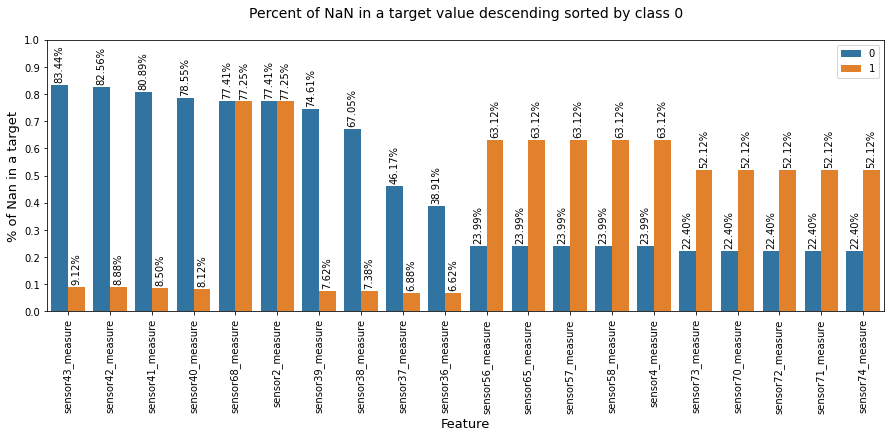

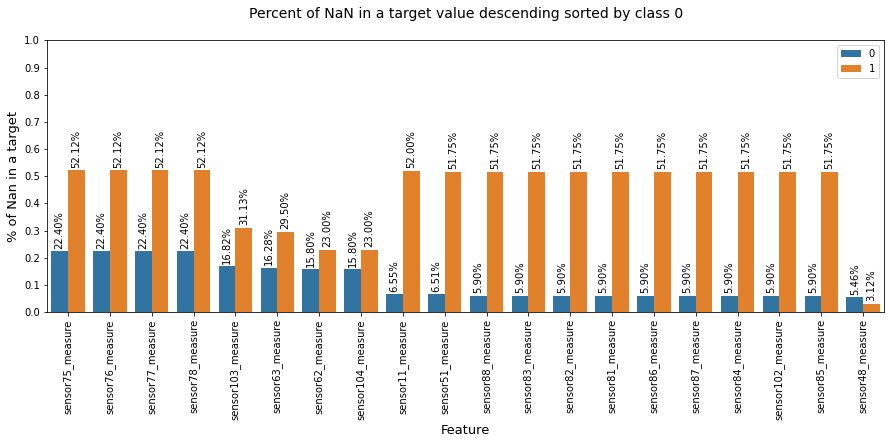

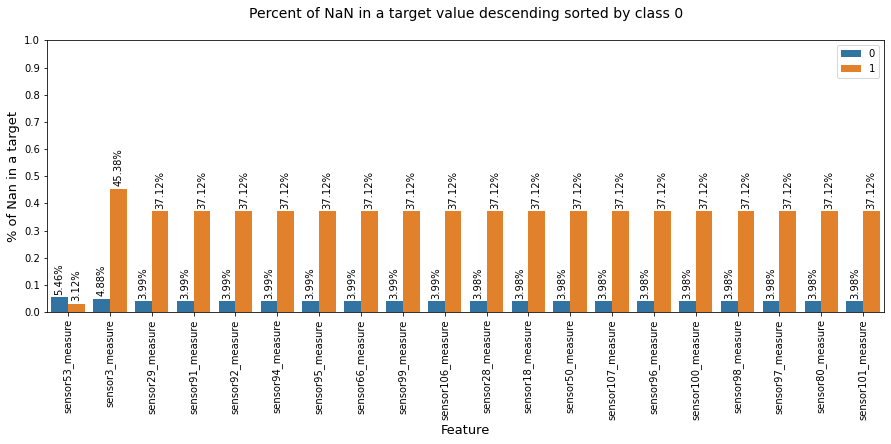

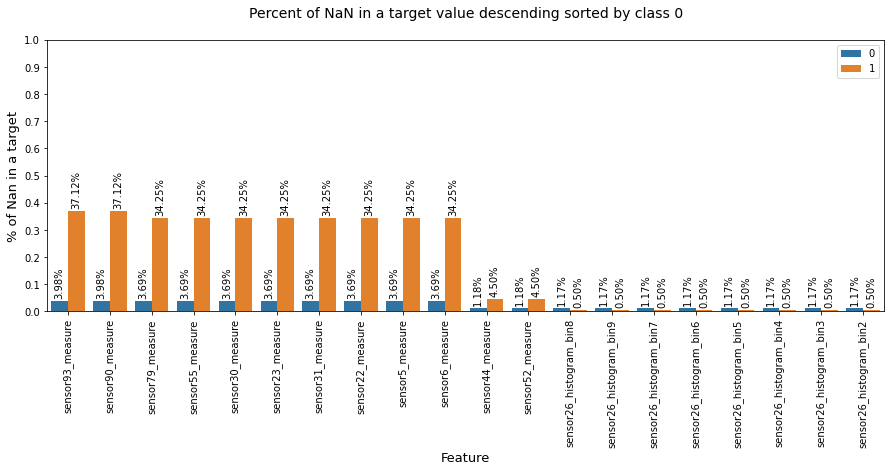

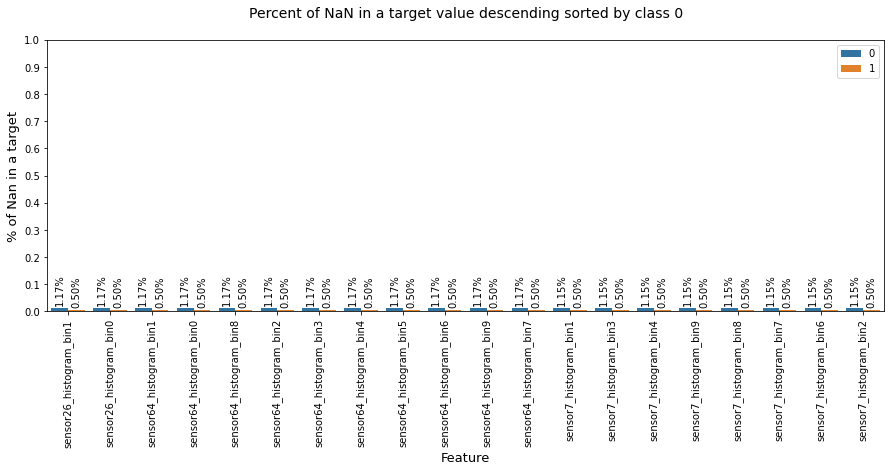

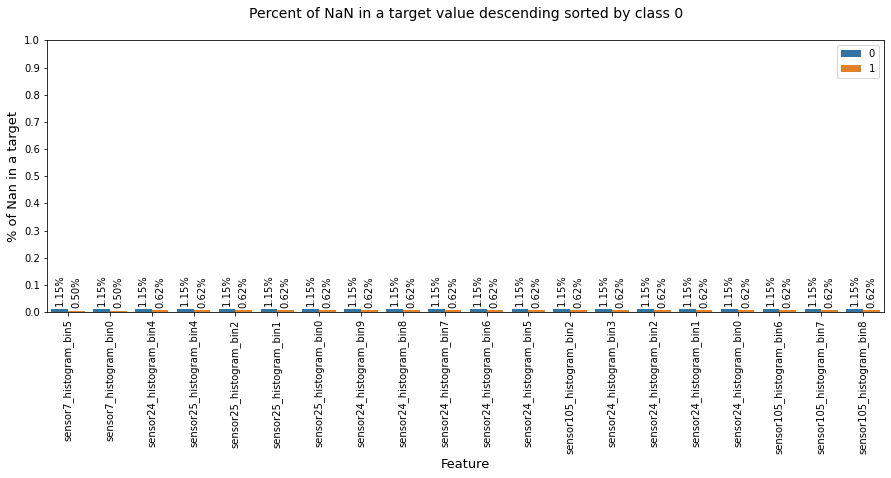

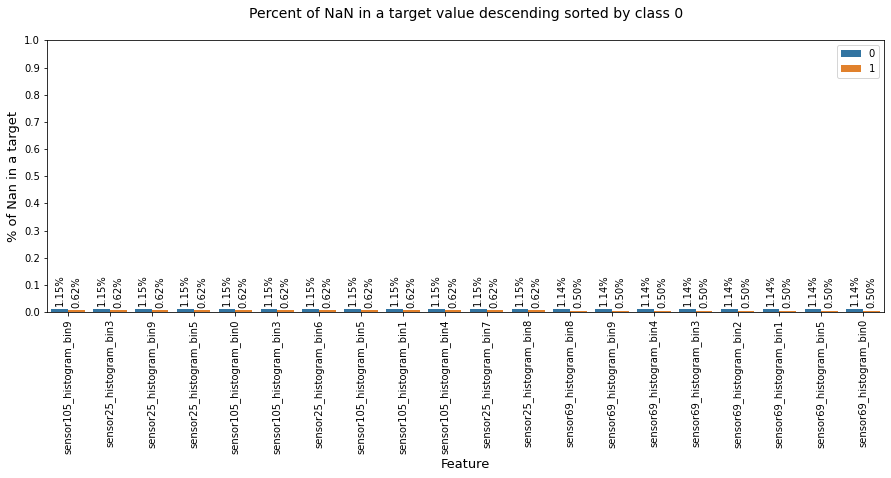

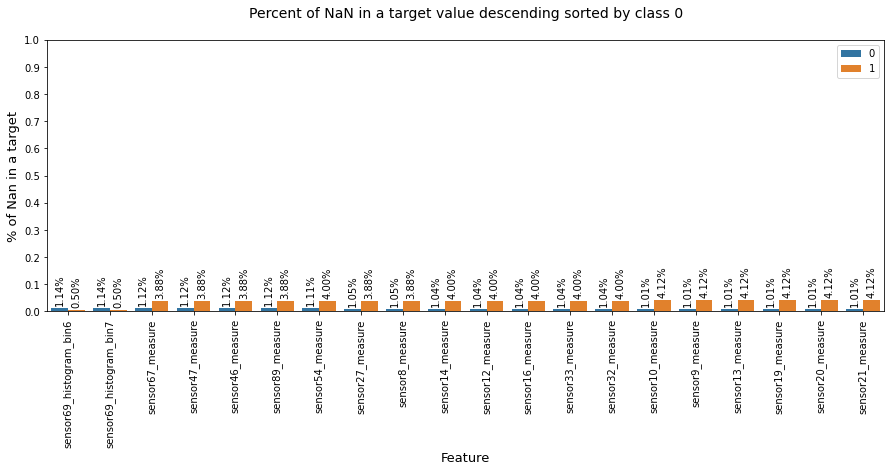

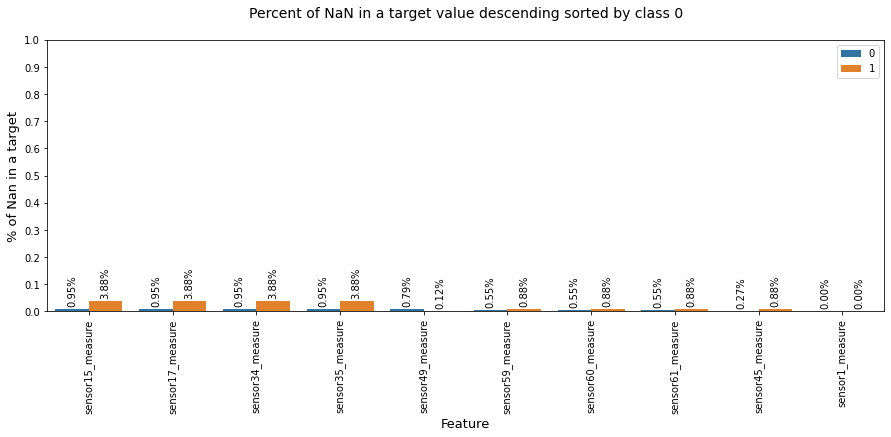

In [ ]:
#https://seaborn.pydata.org/generated/seaborn.barplot.html
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
rng = np.arange(0, 1.1, .1)

for i in range(0,len(column_list),40):
    plt.figure(figsize=(15,5))
    my_plot=sns.barplot(x=new_column_list[i:i+40], y=new_nan_ratio[i:i+40], hue=new_one_zero[i:i+40])
    my_plot.set_yticks(rng)
    
    for p in my_plot.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy() 
        my_plot.annotate('{:.2%}'.format(height), (p.get_x()+.5*width, p.get_y() + height + 0.01), va = 'bottom',ha = 'center',rotation=90)

    plt.title("Percent of NaN in a target value descending sorted by class 0\n", size=14)
    plt.xticks(rotation=90)
    plt.ylabel("% of Nan in a target", size=13)
    plt.xlabel("Feature", size=13)
    plt.show()

**Compare the features with the highest na to total ratio sorted by class 1**

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:nan_ratio[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
new_column_list=[]
new_nan_ratio=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_nan_ratio.append(nan_ratio[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_nan_ratio.append(nan_ratio[i])
    new_one_zero.append(one_zero[i])

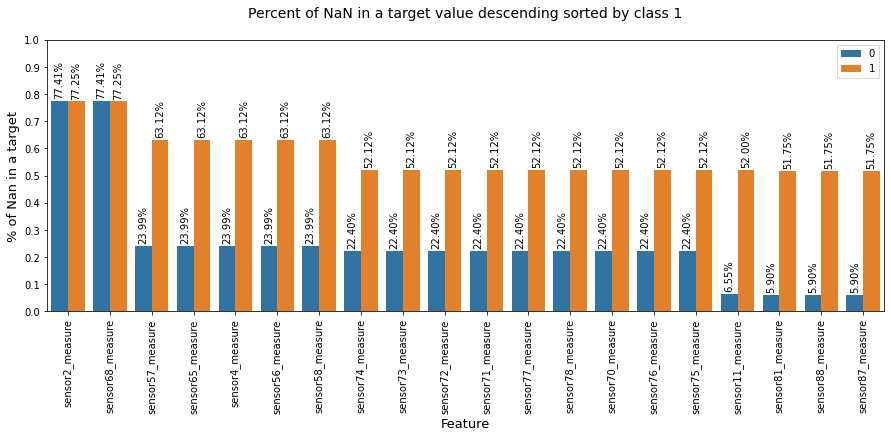

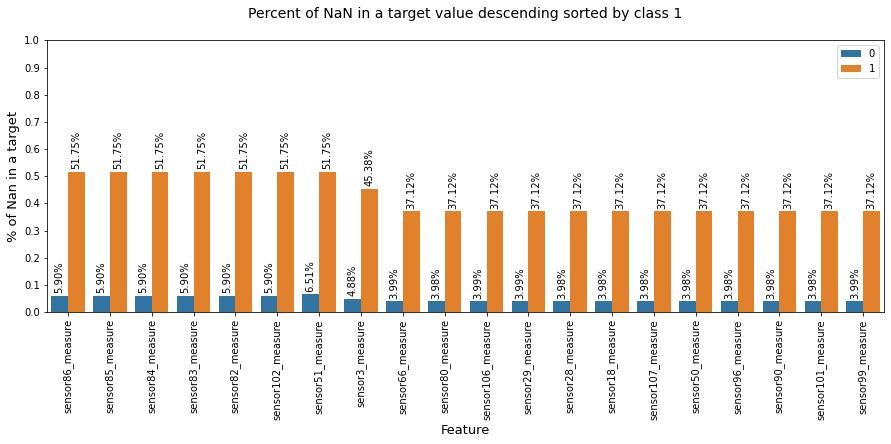

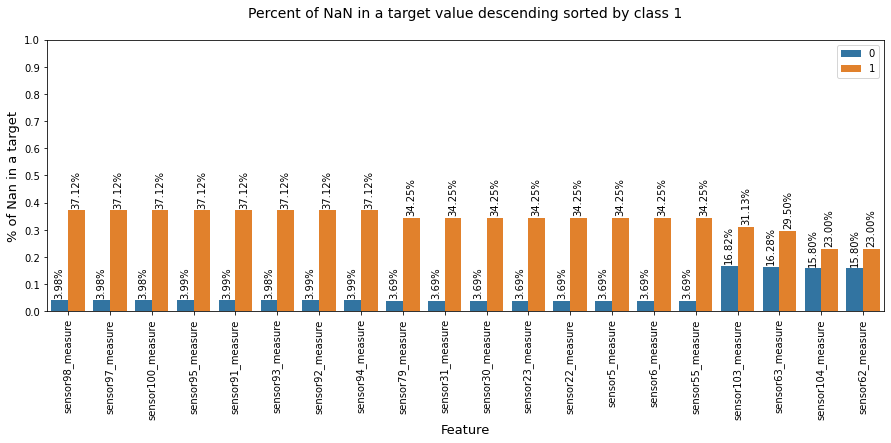

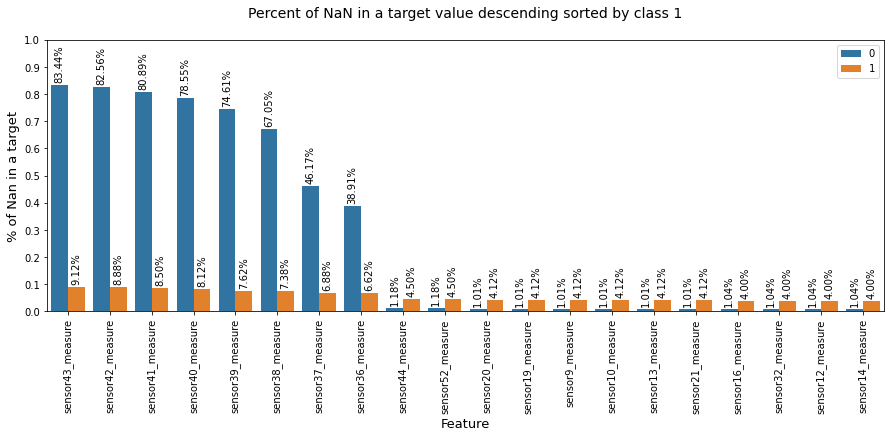

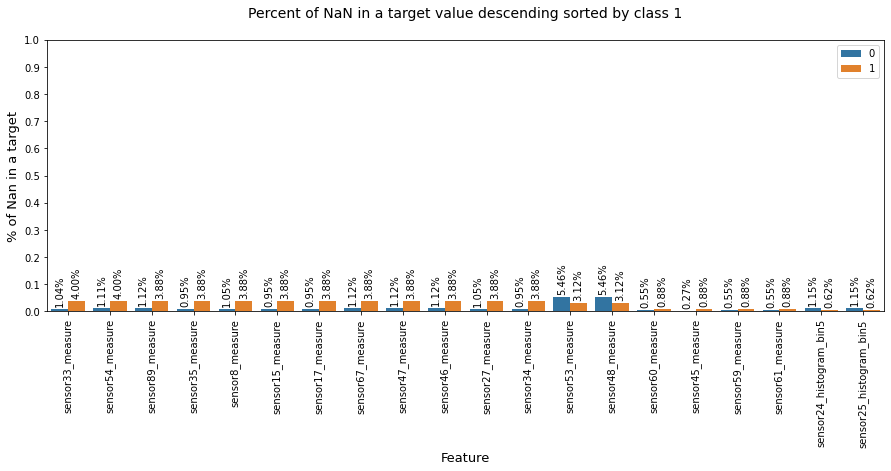

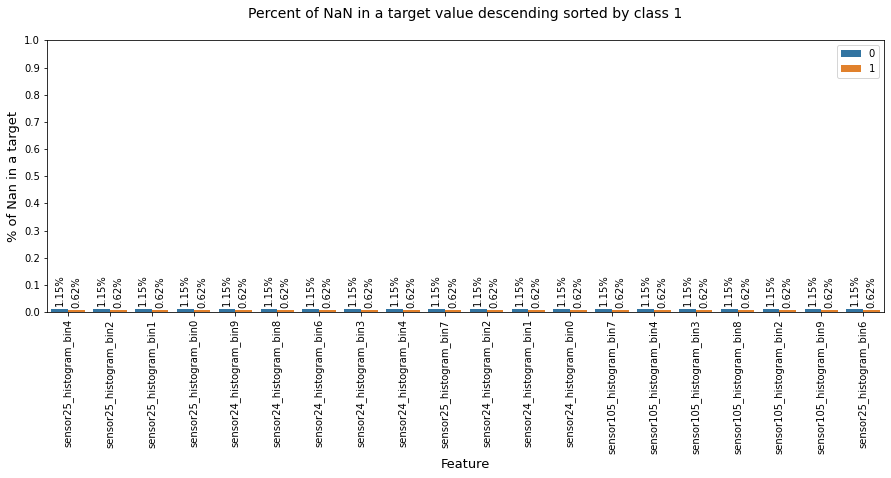

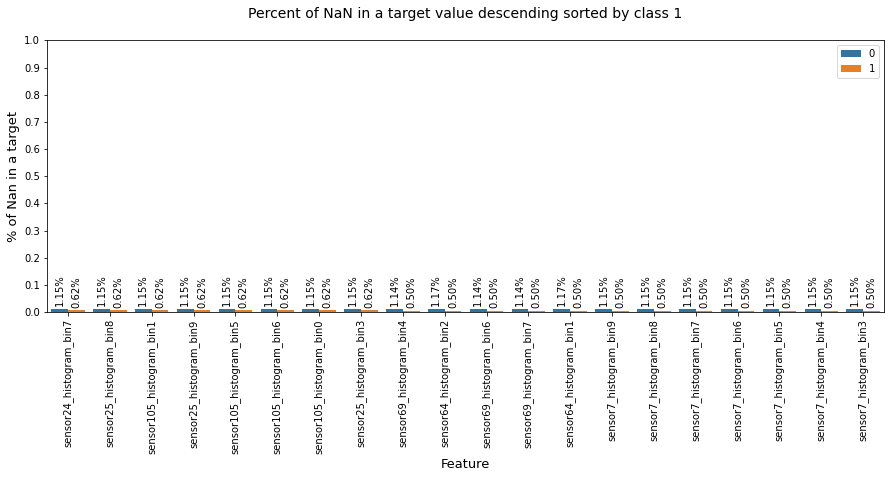

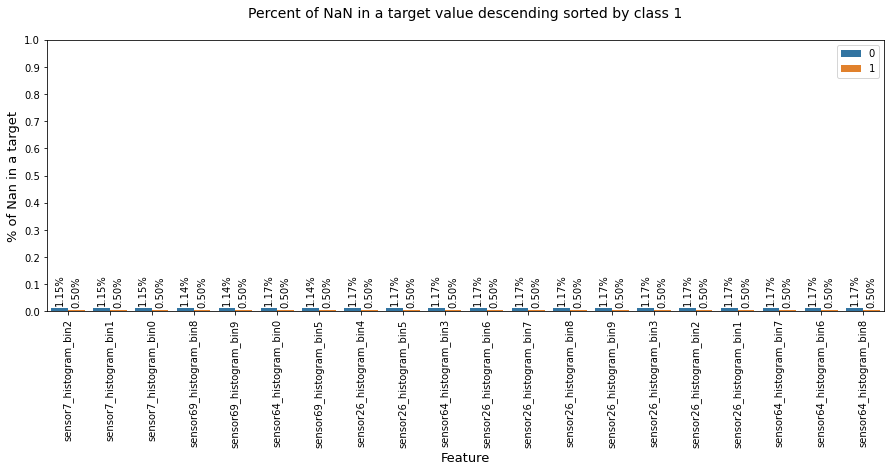

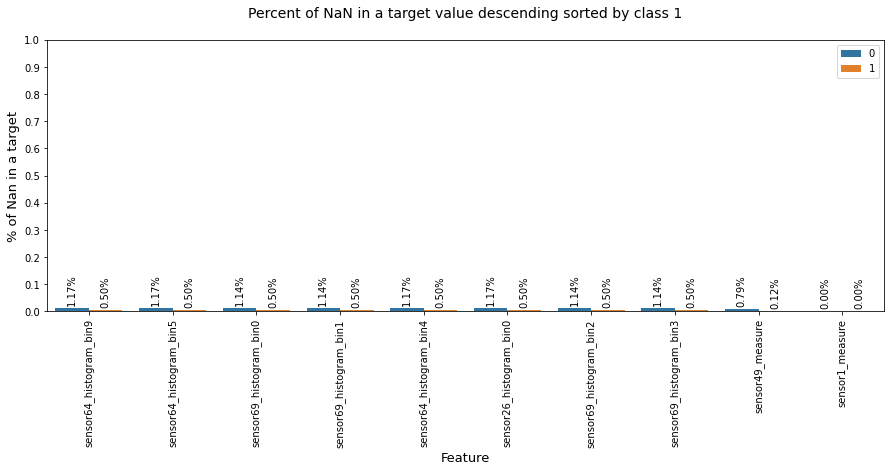

In [ ]:
#https://seaborn.pydata.org/generated/seaborn.barplot.html
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
rng = np.arange(0, 1.1, .1)

for i in range(0,len(column_list),40):
    plt.figure(figsize=(15,5))
    my_plot=sns.barplot(x=new_column_list[i:i+40], y=new_nan_ratio[i:i+40], hue=new_one_zero[i:i+40])
    my_plot.set_yticks(rng)
    
    for p in my_plot.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy() 
        my_plot.annotate('{:.2%}'.format(height), (p.get_x()+.5*width, p.get_y() + height + 0.01), va = 'bottom',ha = 'center',rotation=90)

    plt.title("Percent of NaN in a target value descending sorted by class 1\n", size=14)
    plt.xticks(rotation=90)
    plt.ylabel("% of Nan in a target", size=13)
    plt.xlabel("Feature", size=13)
    plt.show()

**Observation :**<br>
1) Observe that sensors like sensor 58,65,4,56,57 have more np.NaN values for downhole failures and less nans for surface related failures that there is a chance that these sensors are more related to a particular types of surface failures.<br>
2) Whereas sensors like 43,42,41,40,39,38,37 have more np.NaN values for surface failures and lesser nans for downhole failures meaning that there is a chance that these sensors are more related to a particular types of downhole failures.

**Which target has the greatest number of NaNs ?**

In [ ]:
counter={}
i=j=0
for column in list(train.columns.values): 
    if (train[column][train.target==1].isnull().sum()/len(train[column][train.target==1])
    >=train[column][train.target==0].isnull().sum()/len(train[column][train.target==0])):
        i=i+1
        counter.update({"Downhole Failure": i})
    elif (train[column][train.target==0].isnull().sum()/len(train[column][train.target==0])
    >=train[column][train.target==1].isnull().sum()/len(train[column][train.target==1])):
        j=j+1
        counter.update({"Surface Failure": j})

In [ ]:
counter

{'Downhole Failure': 88, 'Surface Failure': 83}

**Observation : We have more sensors with np.NaNs for Downhole Features. Meaning 88 sensors have more np.NaNs for Downhole Failures and 83 sensors have more np.NaNs for Surface Failures.**  

**Target with greatest number of NaNs for only the measure sensors after removing the histogram features**

In [ ]:
counter={}
i=j=0
for column in list(train.columns.values):
    if column.find("measure")!=-1:
        if (train[column][train.target==1].isnull().sum()/len(train[column][train.target==1])
        >=train[column][train.target==0].isnull().sum()/len(train[column][train.target==0])):
            i=i+1
            counter.update({"Downhole Failure": i})
        elif (train[column][train.target==0].isnull().sum()/len(train[column][train.target==0])
        >=train[column][train.target==1].isnull().sum()/len(train[column][train.target==1])):
            j=j+1
            counter.update({"Surface Failure": j})

In [ ]:
counter

{'Downhole Failure': 87, 'Surface Failure': 13}

**Observation : If we consider only the measure sensors, then a lot more np.NaNs are present for Downhole Features that is 87 sensors have more np.NaN for downhole failures whereas 13 sensors have more np.NaN for surface failures.Meaning the measure sensors maybe favouring the Surface Failures more.**

**Target with greatest number of NaNs for only the histogram sensors after removing the measure features**

In [ ]:
counter={}
i=j=0
for column in list(train.columns.values):
    if column.find("histogram")!=-1:
        if (train[column][train.target==1].isnull().sum()/len(train[column][train.target==1])
        >=train[column][train.target==0].isnull().sum()/len(train[column][train.target==0])):
            i=i+1
            counter.update({"Downhole Failure": i})
        elif (train[column][train.target==0].isnull().sum()/len(train[column][train.target==0])
        >=train[column][train.target==1].isnull().sum()/len(train[column][train.target==1])):
            j=j+1
            counter.update({"Surface Failure": j})

In [ ]:
counter

{'Surface Failure': 70}

**Observation : If we consider only the histogram sensors, then all of the histogram sensors have more np.NaN values for Surface Failure. Meaning , there is a chance that histogram features favour the Downhole Failures more.**  

### Using histograms, plots find out the nature of means for features for both the classes and thereby, the outliers.

In [ ]:
#Find the mean.
sample=train.copy()

In [ ]:
mean_0=[]
mean_1=[]
for column in list(sample.columns.values): 
    mean_0.append(train[train.target==0][column].mean())
    mean_1.append(train[train.target==1][column].mean())

In [ ]:
median_0=[]
median_1=[]
for column in list(sample.columns.values): 
    median_0.append(train[train.target==0][column].median())
    median_1.append(train[train.target==1][column].median())

**10) Try and plot it’s histogram for both the target values.**

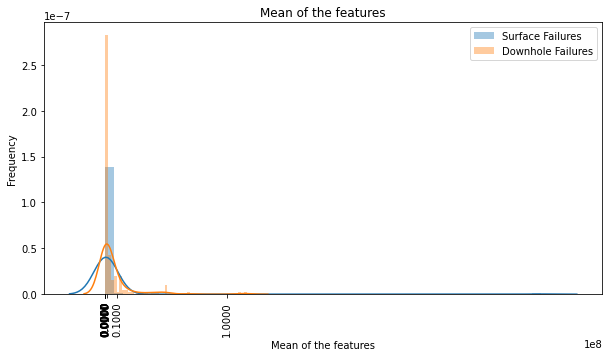

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
plt.figure(figsize=(10,5))
sns.distplot(mean_0, hist=True, label="Surface Failures")
sns.distplot(mean_1, hist=True, label="Downhole Failures")
plt.title('Mean of the features')
plt.ylabel('Frequency')
plt.xlabel('Mean of the features')
plt.xticks([10**e for e in range(0,9)],rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
Majority of both the surface and downhole failures have mean sensor readings 1000 and we see that only small values get a mean till 1e8 that also surface level failures .<br>
As the mean value is susceptible to outliers , we are getting a high value but we cannot be sure of this.<br>
So we will try the median value as well.

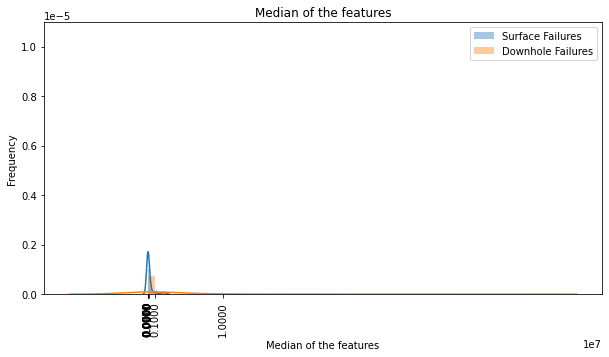

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
plt.figure(figsize=(10,5))
sns.distplot(median_0, hist=True, label="Surface Failures")
sns.distplot(median_1, hist=True, label="Downhole Failures")
plt.title('Median of the features')
plt.ylabel('Frequency')
plt.xlabel('Median of the features')
plt.xticks([10**e for e in range(0,8)],rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
Looking at the median values it can be said that the majority of the surface related failures are in the range of 0-1000 but we can see that the downhole failure values have median values till e^7 which is huge whereas this does not happen for the surface related failures.

**11) Try box plot / voilin plot to visualize the outliers.**

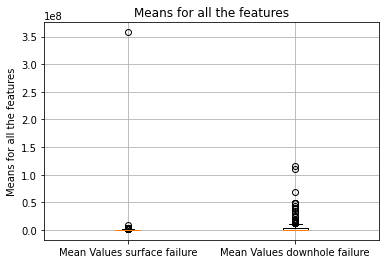

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([mean_0, mean_1])
plt.title('Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

**Observations :**<br>
**The mean values for the downhole failures are more extreme than that of the surface level failures.**<br>
More detail can be revealed when we plot a bar plot for both the classes feature wise.

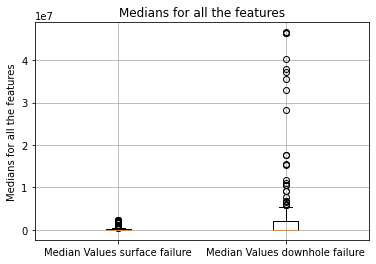

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([median_0, median_1])
plt.title('Medians for all the features')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the features')
plt.grid()
plt.show()

**Observations :**<br>
The mean values can be affected by the high values or outliers that is why we try the median values as well.<br>
Above are the median values for all the features.<br>
The above diagram shows that there is more extreme or high value data for downhole failures.<br>
**These are not outliers as these are the medians for each feature. It means that the original values for the features are high themselves.**<br>
**<h4 style="color:#01308e;">Meaning whenever the downhole failures occur, the above sensor data (which we will find out later) is high and such high occurrences do not occur when it is a surface related failure.</h4>**  
More detail can be revealed when we plot a bar plot for both the classes feature wise.<br>
We can see a similar state in the voilin plots as well.

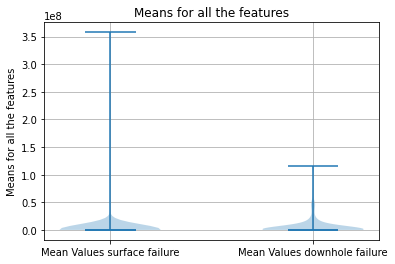

In [ ]:
plt.violinplot([mean_0, mean_1], showmeans=False, showmedians=True)
plt.title('Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

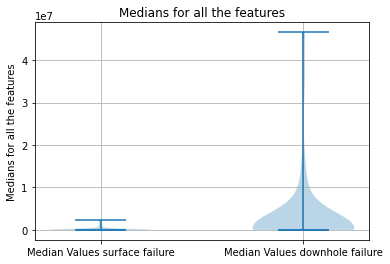

In [ ]:
plt.violinplot([median_0, median_1], showmeans=False, showmedians=True)
plt.title('Medians for all the features')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the features')
plt.grid()
plt.show()

**Compare the median of the available features without imputing, sorted by class 0**

**Without imputing any value, find out the mean and median values for the features for each class and observe which all features can separate both the classes because we assume some features to have different mean and median values for the two different classes given here.**

In [ ]:
y_train=train.pop("target")

In [ ]:
from sklearn.preprocessing import StandardScaler
train_standardized=pd.DataFrame()
for column in list(train.columns.values):
    scalar = StandardScaler()
    #Convert into column vector that is many rows but only one column.
    scalar.fit(train[column].values.reshape(-1,1))
    train_standardized[column] = scalar.transform(train[column].values.reshape(-1,1)).flatten()
    del scalar

In [ ]:
train_standardized["target"]=y_train

In [ ]:
train_standardized.head()

,sensor1_measure,sensor2_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,...,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure,target
0,-0.209185,NaN,-0.447114,NaN,-0.058784,-0.057656,-0.010516,-0.028953,-0.05813,-0.115992,...,-0.027480,-0.047318,-0.129392,-0.200445,-0.169958,-0.203810,-0.164698,-0.020703,-0.024856,0.0
1,0.226385,NaN,2.236571,0.220177,-0.058784,-0.057656,-0.010516,-0.028953,-0.05813,-0.115992,...,0.129511,0.275128,0.568160,0.828886,-0.019735,-0.290499,-0.171291,-0.020703,-0.024856,0.0
2,-0.411601,-0.19623,-0.447113,-0.114751,-0.058784,-0.057656,-0.010516,-0.028953,-0.05813,-0.115023,...,-0.392659,-0.383458,-0.370203,-0.311540,-0.199549,-0.309627,-0.171291,-0.020703,-0.024856,0.0
3,0.027280,NaN,-0.447112,0.243406,-0.058784,-0.057656,-0.010516,-0.028953,-0.05813,-0.115992,...,0.337145,0.182991,0.038698,-0.039070,-0.115574,0.059100,-0.078300,-0.020703,-0.024856,0.0
4,-0.132515,NaN,-0.447113,0.006796,-0.058784,-0.057656,-0.010516,-0.028953,-0.05813,-0.115992,...,-0.201129,-0.164486,0.019122,-0.127958,-0.133152,0.370921,1.225608,-0.020703,-0.024856,0.0


**<u><h4 style="color:#01308e;">I have been getting the mean and the median in negatives if I standardize. Here I am not taking the absolute value as the mean of the absolute values is different than that of the values that are not so this will create a problem later on.</h4></u>**

**Find the features where the difference between the means of the two classes is more than .15<br>
sorted by class 1**

In [ ]:
column_list=[]
mean_list=[]
one_zero=[]
for column in list(train_standardized.columns.values):
    
    if column!="target":

        column_list.append(column)
        one_zero.append(0)
        mean_list.append(train_standardized[train_standardized.target==0][column].mean())

        column_list.append(column)
        one_zero.append(1)
        mean_list.append(train_standardized[train_standardized.target==1][column].mean())

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:mean_list[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
counter=0
mean_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    if (np.abs(np.abs(mean_list[i])-np.abs(mean_list[i-1]))>=.15):
        mean_higher_reading.append(mean_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        mean_higher_reading.append(mean_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])


        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between median readings of surface and downhole failures.".format(counter))

So we have approximate 159 sensor that show significant difference (> .15) between median readings of surface and downhole failures.


In [36]:
def plot_diagram(column_list,content_list,one_zero_list,mean_or_median,zero_one):
    #https://seaborn.pydata.org/generated/seaborn.barplot.html
    import seaborn as sns
    import matplotlib.pyplot as plt
    %matplotlib inline
    #rng = np.arange(0, max(content_list)+.5, .5)
    try:
        rng = np.arange(min(content_list), max(content_list)+(max(content_list)/5),
                        round((max(content_list)+(max(content_list)/5))/10,2))
    except ZeroDivisionError:
        try:
            rng = np.arange(min(content_list), max(content_list)+(max(content_list)/5),
                            10*(round((max(content_list)+(max(content_list)/5))/10,3)))
        except ZeroDivisionError:
            rng = np.arange(min(new_median_list), max(new_median_list)+(max(new_median_list)/5),
                            1*(round(((max(new_median_list)+(max(new_median_list)/5))-min(new_median_list))/10,3)))
            
        

    for i in range(0,len(column_list),40):
        plt.figure(figsize=(15,5))
        my_plot=sns.barplot(x=column_list[i:i+40], y=content_list[i:i+40], hue=one_zero_list[i:i+40])
        my_plot.set_yticks(rng)

        for p in my_plot.patches:
            width = p.get_width()
            height = p.get_height()
            x, y = p.get_xy() 
            my_plot.annotate('{:.2}'.format(height), (p.get_x()+.5*width, p.get_y() + height + 0.01), va = 'bottom',ha = 'center',rotation=90)
            
        
        title=mean_or_median+" in a target value descending sorted by class "+str(zero_one)+"\n"
        x_label="Feature"
        y_label=mean_or_median+" in a target"
        
        plt.title(title, size=14)
        plt.xticks(rotation=90)
        plt.ylabel(y_label, size=13)
        plt.xlabel(x_label, size=13)
        plt.show()

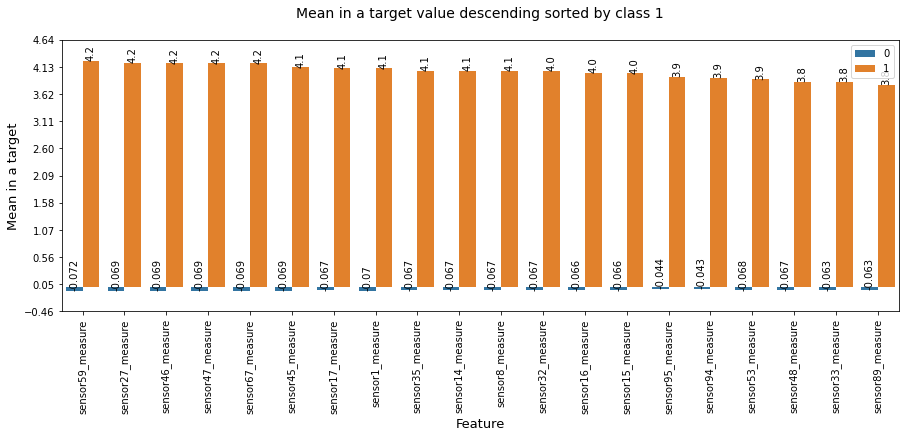

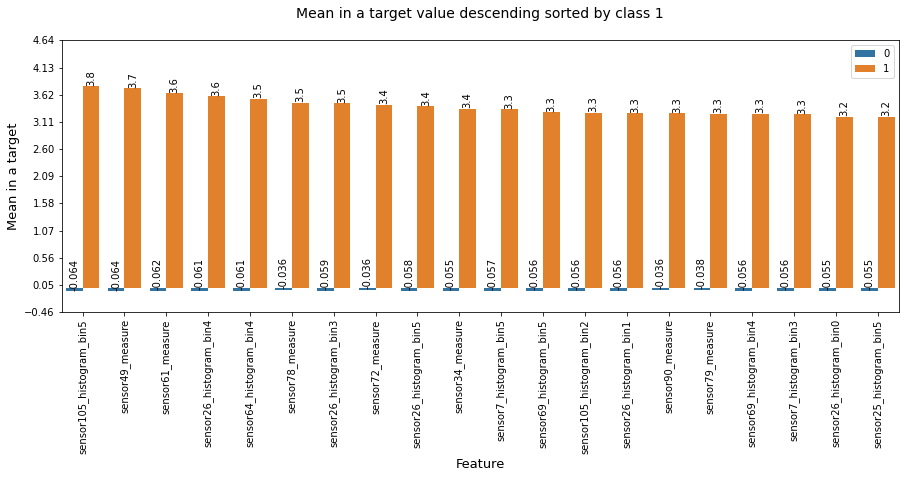

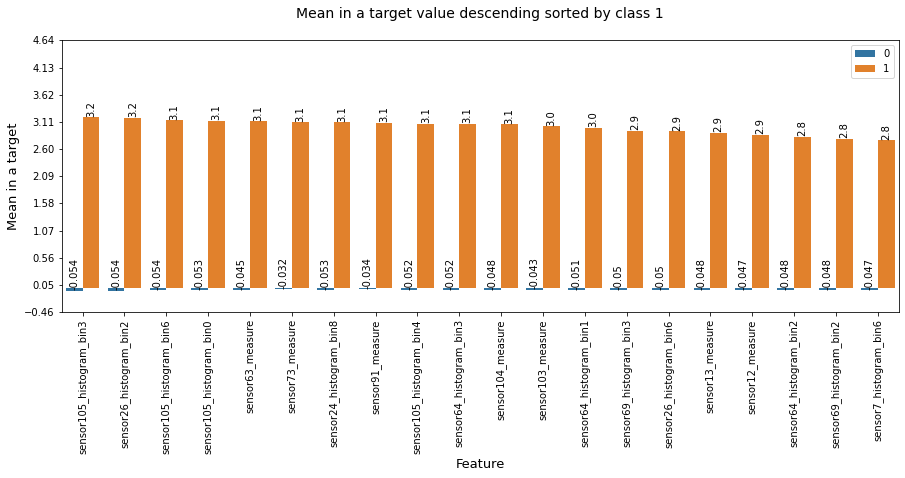

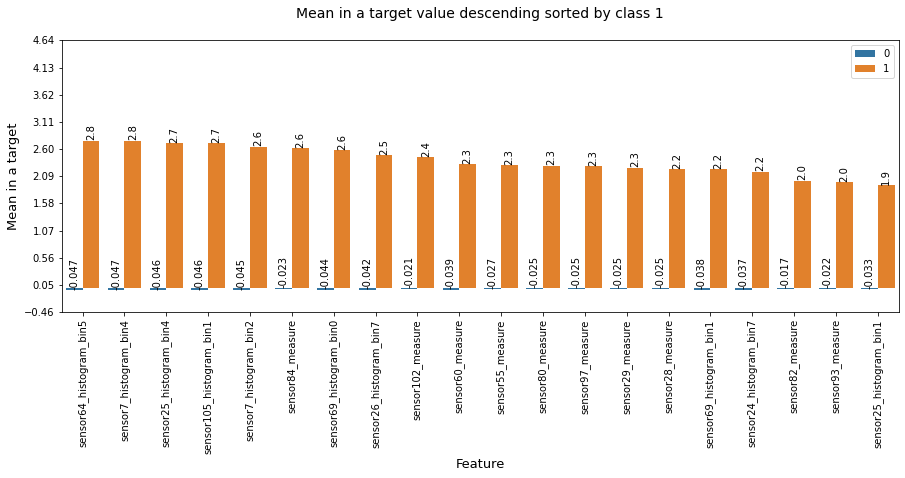

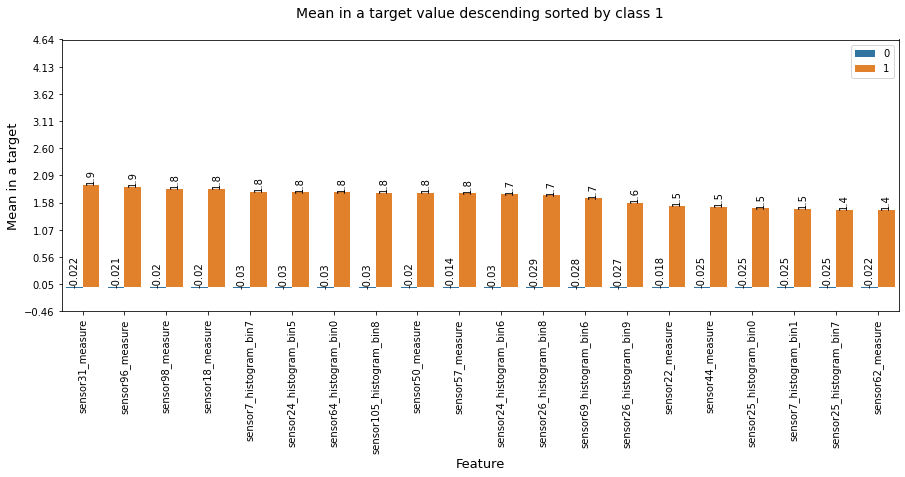

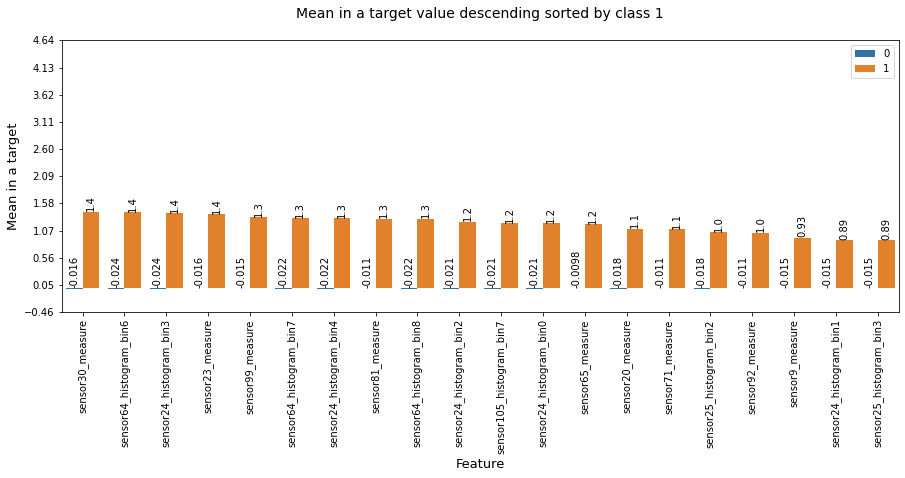

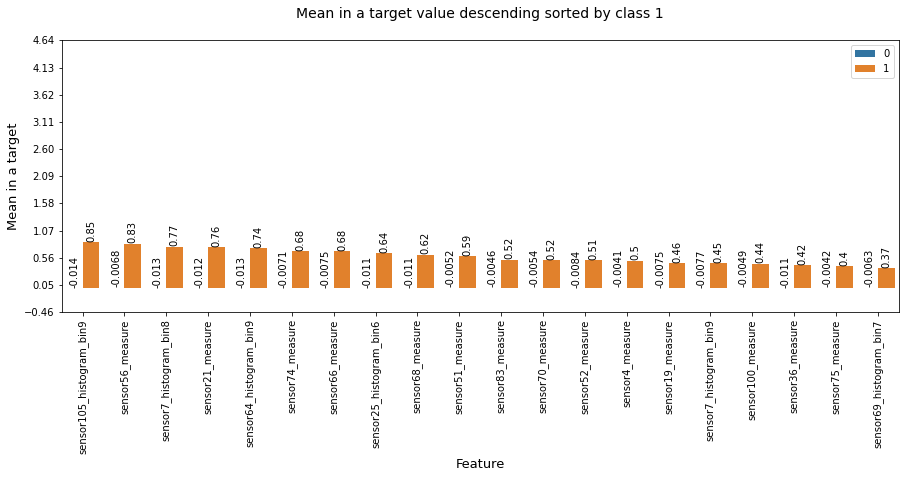

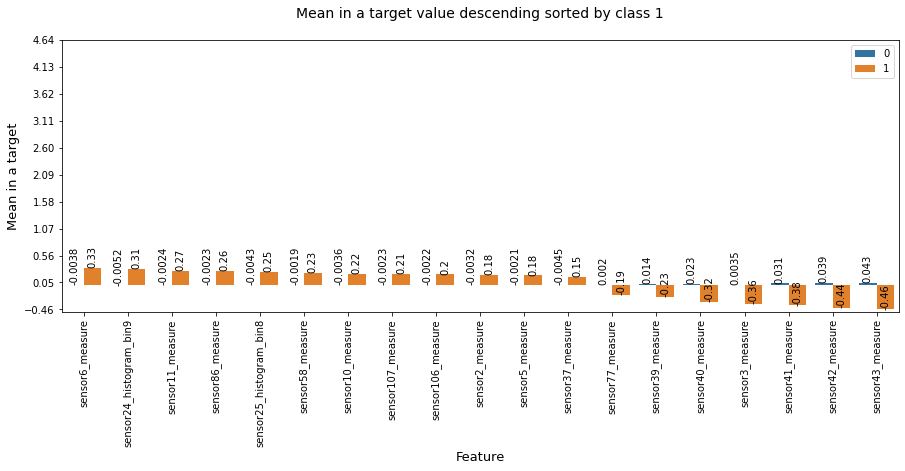

In [ ]:
plot_diagram(column_higher_reading,mean_higher_reading,one_zero_higher_reading,"Mean",1)

**Observation : If I do not perform any imputation then I get measure sensors like 59,27,47 etc whose mean for the Downhole failures is a lot more than that of surface failures.<br>
So if my data point is not an outlier then this means that based on the mean value of the sensor I can find out if my data point belongs to a surface failure or a downhole failure.**

**Compare the median of the available features without imputing, sorted by class 1**

In [ ]:
column_list=[]
median_list=[]
one_zero=[]
for column in list(train_standardized.columns.values):
    
    if column!="target":

        column_list.append(column)
        one_zero.append(0)

        median_list.append(train_standardized[train_standardized.target==0][column].median())

        column_list.append(column)
        one_zero.append(1)
        median_list.append(train_standardized[train_standardized.target==1][column].median())

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:median_list[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
counter=0
median_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    if (np.abs(np.abs(median_list[i])-np.abs(median_list[i-1]))>=.15):
        median_higher_reading.append(median_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        median_higher_reading.append(median_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])


        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between median readings of surface and downhole failures.".format(counter))

So we have approximate 86 sensor that show significant difference (> .15) between median readings of surface and downhole failures.


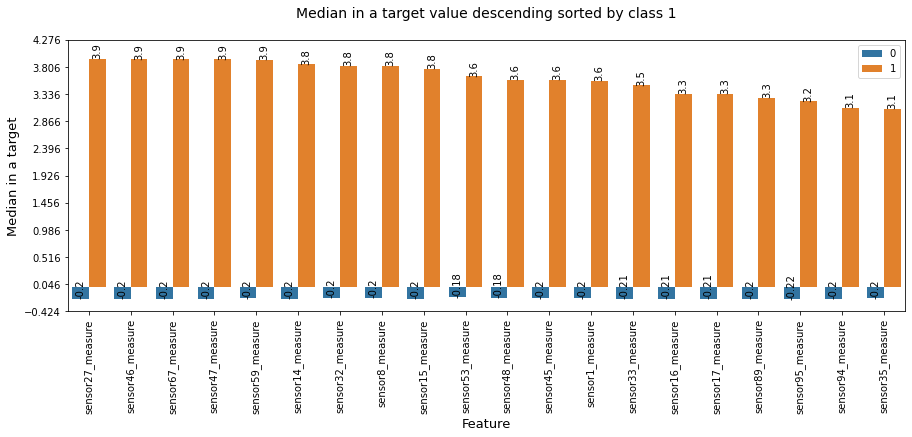

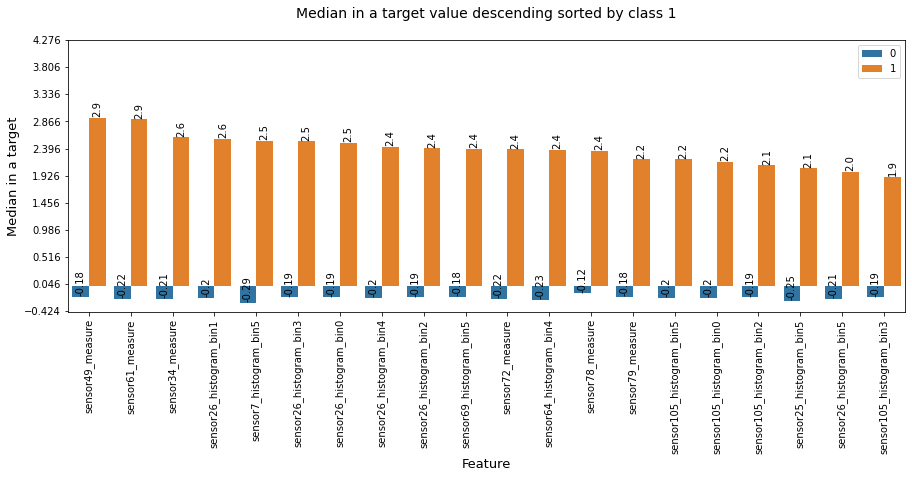

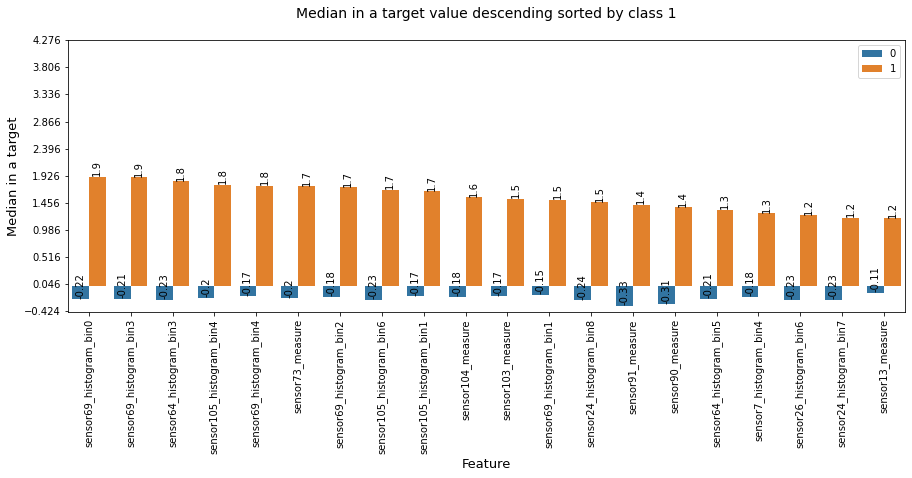

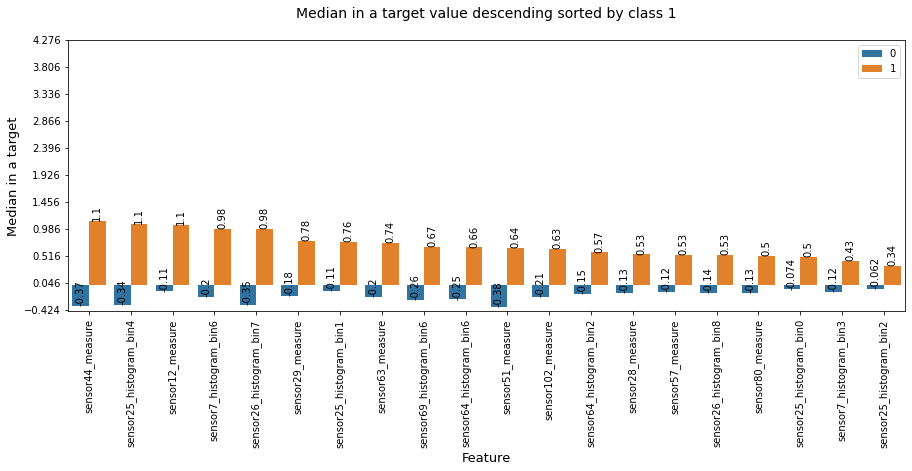

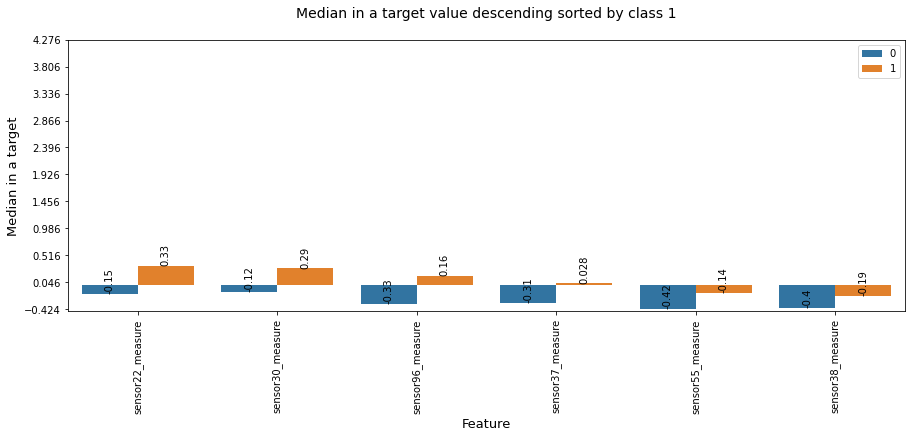

In [ ]:
plot_diagram(column_higher_reading,median_higher_reading,one_zero_higher_reading,"Median",1)

**Observations :**<br>
**The median values of the downhole failures are way higher than that of the surface value failures. From this , we can also figure out actually which features contribute to the downhole failures and which features contribute to the surface ones.<br>
Given a point is not an outlier then we can also estimate whether a data point will belong to the surface failure or the downhole failure based on the median value.**

<h3>Perform PCA find which feature gives the highest variance . Try the same with tSNE.</h3>

<h3>1) Impute np.NaN with 0 values with all features.</h3>

In [ ]:
data_type="0_impute_data"

In [ ]:
train_0_all_features=train.copy()
y_train_0_all_features=y_train.copy()
test_0_all_features=test.copy()
y_test_0_all_features=y_test.copy()

In [ ]:
train_0_all_features.shape

(48000, 170)

In [ ]:
y_train_0_all_features.shape

(48000,)

In [ ]:
test_0_all_features.shape

(12000, 170)

In [ ]:
y_test_0_all_features.shape

(12000,)

In [ ]:
for i ,j in zip(train_0_all_features.columns.values,test_0_all_features.columns.values):
    if (i!=j):
        print(i," : ",j)

**Filling the np.NaN values with 0 this time.**

In [ ]:
train_0_all_features=train_0_all_features.fillna(0)
train_0_all_features.head(5)

,sensor1_measure,sensor2_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,...,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure
0,28906.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,319892.0,193978.0,386862.0,252708.0,117330.0,50928.0,47254.0,324.0,0.0,0.0
1,91000.0,0.0,2.130706e+09,1268.0,0.0,0.0,0.0,0.0,0.0,0.0,...,511180.0,277268.0,757770.0,984578.0,1204008.0,308200.0,8542.0,0.0,0.0,0.0
2,50.0,0.0,4.200000e+01,28.0,0.0,0.0,0.0,0.0,0.0,720.0,...,936.0,236.0,202.0,50.0,46.0,250.0,0.0,0.0,0.0,0.0
3,62616.0,0.0,1.488000e+03,1354.0,0.0,0.0,0.0,0.0,0.0,0.0,...,759116.0,387426.0,651786.0,429068.0,287696.0,144066.0,164660.0,4570.0,0.0,0.0
4,39836.0,0.0,5.020000e+02,478.0,0.0,0.0,0.0,0.0,0.0,0.0,...,218898.0,101850.0,252084.0,408528.0,193856.0,113962.0,303908.0,68650.0,0.0,0.0


In [ ]:
test_0_all_features=test_0_all_features.fillna(0)
test_0_all_features.head(5)

,sensor1_measure,sensor2_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,...,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure
0,63284.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,503668.0,273956.0,552502.0,556832.0,620656.0,329124.0,44306.0,82.0,0.0,0.0
1,120196.0,0.0,2.130706e+09,814.0,0.0,0.0,0.0,0.0,0.0,0.0,...,595286.0,296010.0,664440.0,810976.0,1119046.0,715358.0,942460.0,14082.0,0.0,0.0
2,8.0,0.0,6.000000e+00,6.0,0.0,0.0,0.0,0.0,0.0,0.0,...,44.0,36.0,94.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
3,86.0,0.0,2.130706e+09,8.0,0.0,0.0,0.0,0.0,0.0,0.0,...,646.0,168.0,844.0,482.0,92.0,0.0,0.0,0.0,0.0,2.0
4,61396.0,0.0,2.130706e+09,512.0,0.0,0.0,0.0,0.0,0.0,0.0,...,320798.0,182398.0,558834.0,641512.0,457800.0,242354.0,285500.0,21046.0,0.0,0.0


**Reset Indices for both the train and x's and y's.<br>
Do this always before standardizing and mean/median imputing**

In [ ]:
train_0_all_features,y_train_0_all_features=reset_index(train_0_all_features,y_train_0_all_features)
test_0_all_features,y_test_0_all_features=reset_index(test_0_all_features,y_test_0_all_features)

**Standardise the dataframe**

In [ ]:
import pickle
from sklearn.preprocessing import StandardScaler
def standardize_test_n_train_wrt_train(train_df,test_df,data_type):
    train_dataframe=pd.DataFrame()
    test_dataframe=pd.DataFrame()
    
    scalar_dict={}

    for column in list(train_df.columns.values):

        scalar = StandardScaler()

        #Convert into column vector that is many rows but only one column.
        scalar.fit(train_df[column].values.reshape(-1,1))
        
        scalar_dict.update({column:scalar})

        train_dataframe[column] = scalar.transform(train_df[column].values.reshape(-1,1)).flatten()
        test_dataframe[column] = scalar.transform(test_df[column].values.reshape(-1,1)).flatten()
        del scalar
        
    pickle.dump(scalar_dict, open("scalar_dict_"+str(data_type)+".pkl",'wb'))
        
    return train_dataframe,test_dataframe

In [ ]:
standard_train_0_all_features_df,standard_test_0_all_features_df=standardize_test_n_train_wrt_train(train_0_all_features,test_0_all_features,data_type)

In [ ]:
standard_train_0_all_features_df.shape

(48000, 170)

In [ ]:
standard_test_0_all_features_df.shape

(12000, 170)

**Truncated SVD to get the best features**

In [ ]:
#https://stackoverflow.com/questions/50796024/feature-variable-importance-after-a-pca-analysis

In [ ]:
%%time
import time
from sklearn.decomposition import TruncatedSVD
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
def truncated_svd(input_dataframe,n_components):
    svd = TruncatedSVD(n_components=n_components)
    svd.fit(input_dataframe)
    percentage_var_explained = svd.explained_variance_ / np.sum(svd.explained_variance_)
    cum_var_explained = np.cumsum(percentage_var_explained)
    
    # Plot the SVD spectrum
    plt.figure(1, figsize=(20, 5))
    plt.clf()
    plt.plot(cum_var_explained, linewidth=2)
    plt.axis('tight')
    plt.grid()
    plt.yticks(np.arange(0.25, 1.01, .05))
    plt.xticks(np.arange(0, 172, 10))
    plt.xlabel('n_components')
    plt.ylabel('Cumulative_explained_variance')
    plt.show()
    return svd

CPU times: user 14.6 ms, sys: 11.6 ms, total: 26.3 ms
Wall time: 25.1 ms


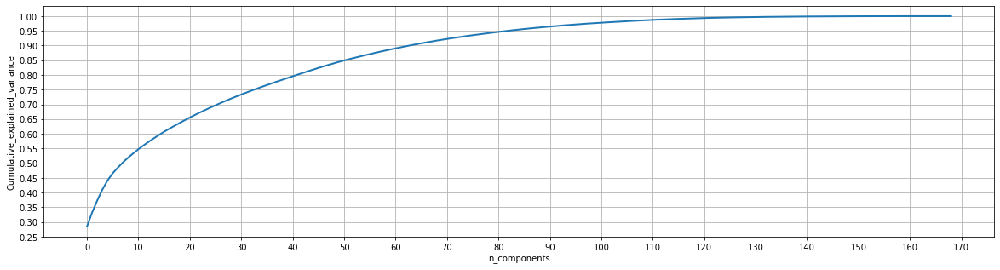

TruncatedSVD(n_components=169)

In [ ]:
truncated_svd(standard_train_0_all_features_df,169)

**I choose 120 components to describe my data as 120 components explain atleast 99% variance of the total data.** 

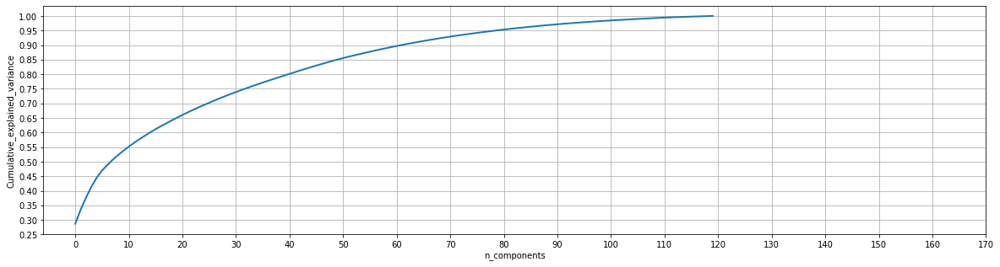

In [ ]:
svd=truncated_svd(standard_train_0_all_features_df,120)

**For the 120 principal components using svd.explained_variance_ratio_ find the variance distribution.**

In [ ]:
print(svd.explained_variance_ratio_)
#Here the highest ratio is of the Principal Component 1 and the lowest value is of Principal Component 120.
#this is the sorted list of all the principal components.

[0.28472978 0.04780687 0.04091736 0.0371289  0.03108652 0.02423595
 0.01922317 0.01806965 0.01594909 0.01458631 0.01395989 0.01301183
 0.01240924 0.01175223 0.01140193 0.01093418 0.01020836 0.00980257
 0.0096912  0.00950576 0.00917567 0.00882468 0.00853742 0.00836943
 0.00804615 0.0077958  0.00775106 0.0074695  0.00739996 0.00710472
 0.00686645 0.00672584 0.00656871 0.0064729  0.00628121 0.00619268
 0.00613079 0.00595993 0.00591603 0.00586467 0.00583638 0.00581102
 0.0057254  0.00562058 0.00560362 0.00553332 0.00539706 0.00521059
 0.00510985 0.00503851 0.00471029 0.0045352  0.00442628 0.00429436
 0.00425464 0.00419091 0.00412103 0.00395315 0.00387172 0.00376928
 0.00368745 0.00357553 0.00355151 0.00342599 0.00332717 0.00319809
 0.00312569 0.00310408 0.00305175 0.00282526 0.00277869 0.00269064
 0.00266907 0.00254603 0.00252256 0.00240416 0.00231023 0.00227994
 0.00225883 0.00222558 0.00215774 0.00206164 0.00202298 0.00193276
 0.00188686 0.00184892 0.00175645 0.00173155 0.00164004 0.0016

In [ ]:
print(len(svd.explained_variance_ratio_))

120


In [ ]:
np.sum(svd.explained_variance_ratio_)

0.9930403

**Now understand that if I transform my dataframe with the help of fitted svd object using svd.transform(dataframe), it does not mean that my original features are getting reduced.<br>
It means that my original features are getting replaced by newer features or newer components which are lesser than my original number of features. That is what they mean by dimensionality reduction. Not reducing the already existing features , but replacing them by different features that are lesser in number.<br><br>
So if I want to know what all features are important with the most variance and what all features should be removed I cannot find that by transforming .<u><h4 style="color:#01308e;">Meaning no interpretability.</h4></u><br><br>
So I can find out the most important features that contribute to my principal components with the help of the 170 values present in each component.The more the value in component for a feature , that important that feature is to a component.**

In [ ]:
#main matrix of the components (descending sorted as per the variance) and their contributing features.
svd.components_.shape

(120, 170)

In [ ]:
#number of features 
svd.components_.shape[1]

170

In [ ]:
#number of components
svd.components_.shape[0]

120

In [ ]:
set_number_of_features=120

### Trying Forward Feature selection

**Here, in forward feature selection, out of 170 features even if I choose to select 10 features only , still it will take a lot of time.<br>
Therefore I go with recursive feature elimination.<br>
Using Recursive Feature Elimination, I can get the features that I need.**

In [ ]:
#!pip install joblib
#!pip install mlxtend

In [ ]:
import warnings
from pandas.core.common import SettingWithCopyWarning
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)
import numpy as np
import pandas as pd
from joblib import dump, load
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier

def recursive_feature_elimination(dataframe, y ,number_of_features):
    clf = RandomForestClassifier(n_estimators=100, n_jobs=-1)
    selector = RFECV(clf, step=5, cv=5,min_features_to_select=number_of_features,scoring="f1",n_jobs=-1)
    selector = selector.fit(dataframe, y)
    print("Rankings : ",selector.ranking_)
    print("Selected indices :\n",pd.Series(selector.ranking_).value_counts())
    list_of_index=[]
    for i in list(range(len(selector.ranking_))):
        if selector.ranking_[i]==1:
            list_of_index.append(i)
    return dataframe[dataframe.columns[list_of_index]]

In [ ]:
%%time
new_standard_train_0_all_features_df=recursive_feature_elimination(
    standard_train_0_all_features_df,
    y_train_0_all_features,
    int(set_number_of_features+np.round((len(train.columns.values)-set_number_of_features)/2))
)

Rankings :  [1 3 1 1 3 3 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 5 1 2 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 5 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 4 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 5 4 1 1 1 1 1 2 1 3 4 5 5 1 1 1 1 1 1
 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 4 4]
Selected indices :
 1    150
5      5
4      5
3      5
2      5
dtype: int64
CPU times: user 14min 26s, sys: 385 ms, total: 14min 27s
Wall time: 8min 49s


In [ ]:
new_standard_train_0_all_features_df.head()

,sensor1_measure,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,...,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9
0,-0.209185,-0.432133,-0.105982,-0.028788,-0.057798,-0.115322,-0.179659,-0.230364,-0.091357,-0.202172,...,-0.256760,-0.165248,-0.101704,-0.023120,-0.043164,-0.125800,-0.197921,-0.168610,-0.201328,-0.163656
1,0.226385,2.314107,0.287838,-0.028788,-0.057798,-0.115322,-0.174906,0.319443,0.529633,0.351873,...,0.439128,0.094757,0.067029,0.134633,0.280860,0.575207,0.836743,-0.017559,-0.288466,-0.170285
2,-0.411601,-0.432133,-0.097285,-0.028788,-0.057798,-0.114347,-0.176379,-0.335489,-0.424505,-0.351836,...,-0.297290,-0.304057,-0.383052,-0.390071,-0.380950,-0.367804,-0.309592,-0.198365,-0.307694,-0.170285
3,0.027280,-0.432131,0.314548,-0.028788,-0.057798,-0.115322,-0.180076,-0.309159,0.318561,1.060081,...,0.087512,0.211622,0.285730,0.343274,0.188272,0.043123,-0.035710,-0.113927,0.062946,-0.076776
4,-0.132515,-0.432132,0.042477,-0.028788,-0.057798,-0.115322,-0.180233,-0.206606,-0.043988,0.002957,...,-0.180438,-0.130602,-0.190790,-0.197612,-0.160906,0.023449,-0.125058,-0.131601,0.376386,1.234393


**Try spearman corelation coefficient to find out co relation. (Finding and keeping correlated features is good for cause and affect analysis but it might not be of much use when we find that our features are dependent on other features, we expect our features to be independent of each other.).**

In [ ]:
def find_the_total_features(mid_dataframe,my_range):
    set_for_features=set()
    for row in list(mid_dataframe.index.values):
        for column in list(mid_dataframe.columns.values):
            if (mid_dataframe[column][row]>=my_range or mid_dataframe[column][row]<=-my_range) and column!=row:
                set_for_features.update([column])
                set_for_features.update([row])
    return set_for_features,len(list(mid_dataframe.index.values))-len(list(set_for_features))

def select_spearman(input_dataframe,number_of_features):
    #spearman correlation.
    mid_dataframe=input_dataframe.corr(method ='spearman')
    feature_dict={}
    feature_dict.update({.1:find_the_total_features(mid_dataframe,.1)[1]})
    feature_dict.update({.90:find_the_total_features(mid_dataframe,.90)[1]})
    feature_dict.update({.95:find_the_total_features(mid_dataframe,.95)[1]})
    feature_dict.update({.97:find_the_total_features(mid_dataframe,.97)[1]})
    feature_dict.update({.98:find_the_total_features(mid_dataframe,.98)[1]})
    feature_dict.update({.99:find_the_total_features(mid_dataframe,.99)[1]})
    feature_dict.update({.999:find_the_total_features(mid_dataframe,.999)[1]})

    print("If I take the data having correlation between only -.1 and .1 range then I get ",
          feature_dict[.1]," features.")
    print("If I take the data having correlation between only -.90 and .90 range then I get ",
          feature_dict[.90]," features.")
    print("If I take the data having correlation between only -.95 and .95 range then I get ",
          feature_dict[.95]," features.")
    print("If I take the data having correlation between only -.97 and .97 range then I get ",
          feature_dict[.97]," features.")
    print("If I take the data having correlation between only -.98 and .98 range then I get ",
          feature_dict[.98]," features.")
    print("If I take the data having correlation between only -.99 and .99 range then I get ",
          feature_dict[.99]," features.")
    print("If I take the data having correlation between only -.999 and .999 range then I get ",
          feature_dict[.999]," features.")
    return mid_dataframe
   

def perform_spearman(input_dataframe,mid_dataframe,selected_range):
    #most of the data is less is correlated and if I accept only -10% to 10% then there are very less features
    for column in find_the_total_features(mid_dataframe,selected_range)[0]:
        try:
            input_dataframe.drop(column,axis=1,inplace=True)
        except KeyError:
            pass

    return input_dataframe

In [ ]:
%%time
spearman=select_spearman(new_standard_train_0_all_features_df,int(set_number_of_features+np.floor((len(train.columns.values)-set_number_of_features)/2)))

If I take the data having correlation between only -.1 and .1 range then I get  0  features.
If I take the data having correlation between only -.90 and .90 range then I get  63  features.
If I take the data having correlation between only -.95 and .95 range then I get  88  features.
If I take the data having correlation between only -.97 and .97 range then I get  102  features.
If I take the data having correlation between only -.98 and .98 range then I get  117  features.
If I take the data having correlation between only -.99 and .99 range then I get  132  features.
If I take the data having correlation between only -.999 and .999 range then I get  145  features.
CPU times: user 15.3 s, sys: 96.5 ms, total: 15.4 s
Wall time: 15.3 s


**I need enough data points here, so I will select the range accordingly.**

In [ ]:
new_standard_train_0_all_features_df=perform_spearman(new_standard_train_0_all_features_df,spearman,.99)

In [ ]:
new_standard_train_0_all_features_df.head()

,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin8,...,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9
0,-0.432133,-0.105982,-0.028788,-0.057798,-0.115322,-0.179659,-0.230364,-0.091357,-0.202172,-0.156219,...,-0.256760,-0.165248,-0.101704,-0.023120,-0.043164,-0.125800,-0.197921,-0.168610,-0.201328,-0.163656
1,2.314107,0.287838,-0.028788,-0.057798,-0.115322,-0.174906,0.319443,0.529633,0.351873,0.110657,...,0.439128,0.094757,0.067029,0.134633,0.280860,0.575207,0.836743,-0.017559,-0.288466,-0.170285
2,-0.432133,-0.097285,-0.028788,-0.057798,-0.114347,-0.176379,-0.335489,-0.424505,-0.351836,-0.156630,...,-0.297290,-0.304057,-0.383052,-0.390071,-0.380950,-0.367804,-0.309592,-0.198365,-0.307694,-0.170285
3,-0.432131,0.314548,-0.028788,-0.057798,-0.115322,-0.180076,-0.309159,0.318561,1.060081,0.395772,...,0.087512,0.211622,0.285730,0.343274,0.188272,0.043123,-0.035710,-0.113927,0.062946,-0.076776
4,-0.432132,0.042477,-0.028788,-0.057798,-0.115322,-0.180233,-0.206606,-0.043988,0.002957,-0.079426,...,-0.180438,-0.130602,-0.190790,-0.197612,-0.160906,0.023449,-0.125058,-0.131601,0.376386,1.234393


In [ ]:
new_standard_train_0_all_features_df.shape

(48000, 132)

In [ ]:
new_standard_test_0_all_features_df=standard_test_0_all_features_df[new_standard_train_0_all_features_df.columns.values]
new_standard_test_0_all_features_df.head()

,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin8,...,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9
0,-0.432133,-0.105982,-0.028788,-0.057798,-0.115322,-0.180082,-0.224240,0.293847,0.207290,-0.101894,...,-0.118214,-0.070567,0.060402,0.128360,0.101538,0.165499,0.281313,-0.005274,-0.207963,-0.168607
1,2.314107,0.146833,-0.028788,-0.057798,-0.115322,-0.180023,0.067559,0.752444,0.368711,-0.044655,...,0.037520,0.041387,0.141218,0.170131,0.199327,0.408925,0.755848,0.221493,1.813729,0.117853
2,-0.432133,-0.104118,-0.028788,-0.057798,-0.115322,-0.180334,-0.335774,-0.423793,-0.351836,-0.156630,...,-0.298498,-0.305572,-0.383839,-0.390450,-0.381044,-0.367838,-0.309633,-0.198511,-0.307694,-0.170285
3,2.314107,-0.103497,-0.028788,-0.057798,-0.115322,-0.180149,-0.333434,-0.423566,-0.351809,-0.156630,...,-0.296653,-0.304608,-0.383308,-0.390200,-0.380389,-0.367390,-0.309548,-0.198511,-0.307694,-0.170285
4,2.314107,0.053037,-0.028788,-0.057798,-0.115322,-0.180242,-0.272919,0.204939,0.266100,-0.142387,...,-0.171982,-0.120598,-0.100905,-0.045053,0.107070,0.246608,0.126252,-0.056219,0.334950,0.260346


In [ ]:
#new_standard_train_0_all_features_df.to_pickle("new_standard_train_0_all_features_df.pickle")
#y_train_0_all_features.to_pickle("y_train_0_all_features.pickle")
#new_standard_test_0_all_features_df.to_pickle("new_standard_test_0_all_features_df.pickle")
#y_test_0_all_features.to_pickle("y_test_0_all_features.pickle")

In [ ]:
#new_standard_train_0_all_features_df=pd.read_pickle("/content/gdrive/My Drive/new_standard_train_0_all_features_df.pickle")
#y_train_0_all_features=pd.read_pickle("/content/gdrive/My Drive/y_train_0_all_features.pickle")
                                   
#new_standard_test_0_all_features_df=pd.read_pickle("/content/gdrive/My Drive/new_standard_test_0_all_features_df.pickle")
#y_test_0_all_features=pd.read_pickle("/content/gdrive/My Drive/y_test_0_all_features.pickle")

In [ ]:
np.save('new_standard_train_0_all_features_df_columns.npy',new_standard_train_0_all_features_df.columns.values)

In [ ]:
new_standard_train_0_all_features_df["target"]=y_train_0_all_features
new_standard_train_0_all_features_df.head()

,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin8,sensor7_histogram_bin9,sensor9_measure,sensor10_measure,sensor11_measure,sensor16_measure,sensor17_measure,sensor18_measure,sensor20_measure,sensor22_measure,sensor23_measure,sensor24_histogram_bin0,sensor24_histogram_bin1,sensor24_histogram_bin2,sensor24_histogram_bin3,sensor24_histogram_bin4,sensor24_histogram_bin5,sensor24_histogram_bin6,sensor24_histogram_bin7,sensor24_histogram_bin8,sensor24_histogram_bin9,sensor25_histogram_bin0,sensor25_histogram_bin1,sensor25_histogram_bin2,sensor25_histogram_bin3,sensor25_histogram_bin4,sensor25_histogram_bin5,sensor25_histogram_bin6,sensor25_histogram_bin7,sensor25_histogram_bin8,sensor25_histogram_bin9,...,sensor69_histogram_bin3,sensor69_histogram_bin4,sensor69_histogram_bin5,sensor69_histogram_bin6,sensor69_histogram_bin7,sensor69_histogram_bin8,sensor70_measure,sensor71_measure,sensor72_measure,sensor73_measure,sensor74_measure,sensor75_measure,sensor78_measure,sensor79_measure,sensor80_measure,sensor81_measure,sensor82_measure,sensor84_measure,sensor89_measure,sensor90_measure,sensor91_measure,sensor94_measure,sensor95_measure,sensor98_measure,sensor99_measure,sensor100_measure,sensor102_measure,sensor103_measure,sensor104_measure,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,target
0,-0.432133,-0.105982,-0.028788,-0.057798,-0.115322,-0.179659,-0.230364,-0.091357,-0.202172,-0.156219,-0.029573,-0.054959,-0.022185,-0.013152,-0.244757,-0.265684,-0.086423,-0.03992,-0.166468,-0.246527,-0.026929,-0.019102,-0.025508,-0.03445,-0.027878,-0.027653,0.020405,-0.204042,-0.223482,-0.012042,-0.039356,-0.062358,-0.046700,-0.127173,-0.270692,-0.098743,-0.118703,-0.058450,-0.050906,-0.012781,...,-0.239430,-0.105056,-0.155076,-0.358766,-0.126318,-0.018416,-0.109356,-0.138688,-0.452112,-0.203181,-0.026793,-0.067077,-0.459987,-0.199413,-0.175349,-0.018598,-0.025464,-0.083804,-0.242006,0.242566,-0.024485,-0.139597,-0.218296,-0.187032,-0.127898,-0.018679,-0.216657,-0.353090,-0.382834,-0.256760,-0.165248,-0.101704,-0.023120,-0.043164,-0.125800,-0.197921,-0.168610,-0.201328,-0.163656,0.0
1,2.314107,0.287838,-0.028788,-0.057798,-0.115322,-0.174906,0.319443,0.529633,0.351873,0.110657,-0.029573,-0.054959,-0.022185,-0.013152,0.319847,0.443157,-0.086423,-0.03992,-0.017622,1.010155,-0.026929,-0.019102,-0.025508,-0.03445,-0.027878,-0.083133,1.042130,-0.087201,0.079451,-0.012042,-0.036806,-0.063436,-0.039402,-0.123584,-0.350036,0.720566,-0.082486,-0.058471,-0.050906,-0.012781,...,0.778955,-0.005462,0.239298,0.768845,0.091527,-0.003506,0.147873,0.251669,1.051907,-0.089193,-0.026793,0.008088,0.965251,0.495763,0.631260,-0.018598,-0.025464,-0.083804,0.241243,1.363699,2.495773,0.304205,0.356043,-0.187032,-0.127898,-0.018679,0.275549,0.624807,0.673374,0.439128,0.094757,0.067029,0.134633,0.280860,0.575207,0.836743,-0.017559,-0.288466,-0.170285,0.0
2,-0.432133,-0.097285,-0.028788,-0.057798,-0.114347,-0.176379,-0.335489,-0.424505,-0.351836,-0.156630,-0.029573,-0.054959,-0.022185,-0.013152,-0.315460,-0.347217,-0.086423,-0.03992,-0.163972,-0.236881,-0.026929,-0.019102,-0.025508,-0.03445,-0.027878,-0.083133,-0.329568,-0.294156,-0.263226,-0.012042,-0.096603,-0.122732,-0.069795,-0.133734,-0.360785,-0.325649,-0.097640,-0.055213,0.000112,-0.012781,...,-0.320098,-0.212420,-0.396308,-0.449405,-0.150412,-0.018779,-0.101911,-0.136611,-0.449950,-0.203167,-0.026793,-0.067068,-0.457849,-0.299864,-0.175349,-0.018598,-0.025464,-0.067775,-0.339734,-0.459236,-0.494111,-0.417774,-0.442030,-0.173687,-0.127553,-0.018679,-0.216657,-0.304420,-0.347733,-0.297290,-0.304057,-0.383052,-0.390071,-0.380950,-0.367804,-0.309592,-0.198365

<h3>Compare the target 0 and target 1 mean values feature wise after 0 value imputing</h3>

In [ ]:
column_list=[]
mean_list=[]
one_zero=[]
for column in list(new_standard_train_0_all_features_df.columns.values):
    
    if column!="target":

        column_list.append(column)
        one_zero.append(0)
        mean_list.append(new_standard_train_0_all_features_df[column][new_standard_train_0_all_features_df.target==0].mean())

        column_list.append(column)
        one_zero.append(1)
        mean_list.append(new_standard_train_0_all_features_df[column][new_standard_train_0_all_features_df.target==1].mean())

**Find the features where the difference between the means of the two classes is more than .15<br>
descending sorted by class 1**

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:mean_list[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
counter=0
new_column_list=[]
new_mean_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_mean_list.append(mean_list[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_mean_list.append(mean_list[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 132 sensors.


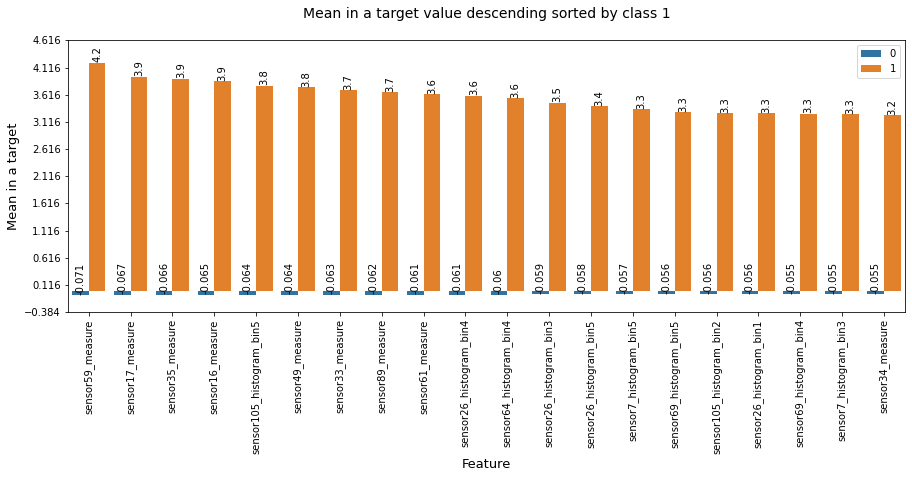

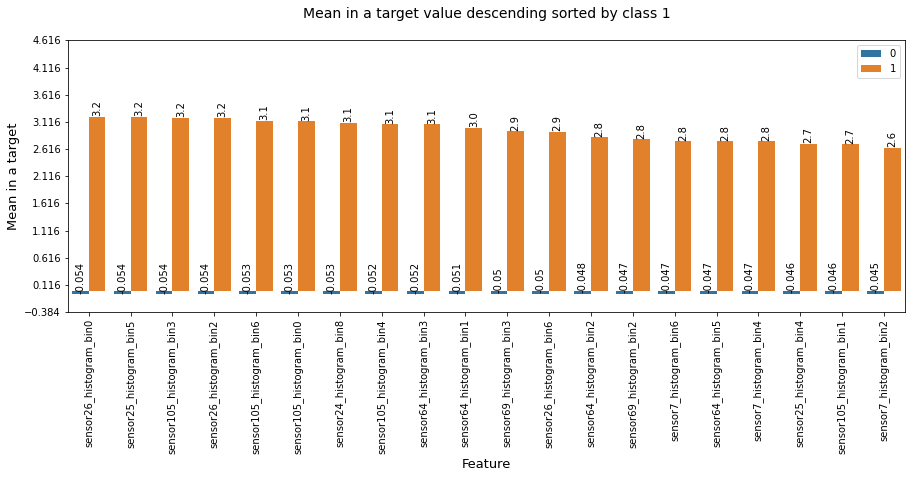

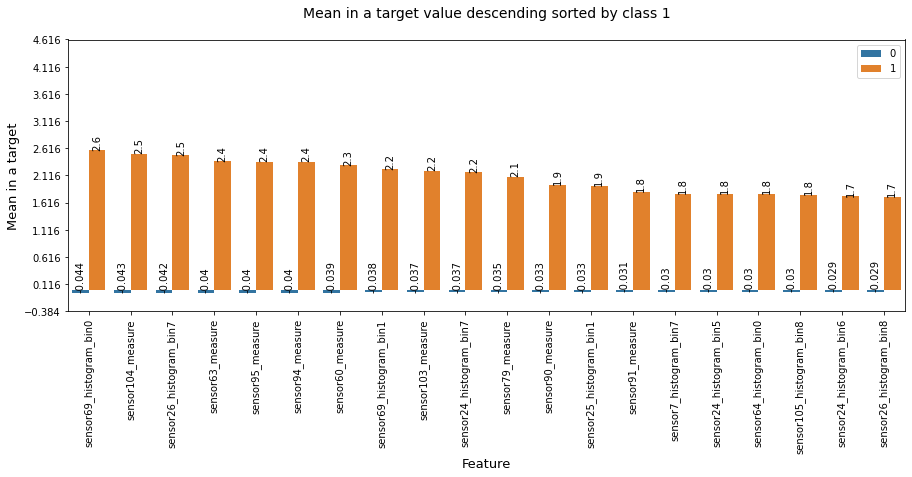

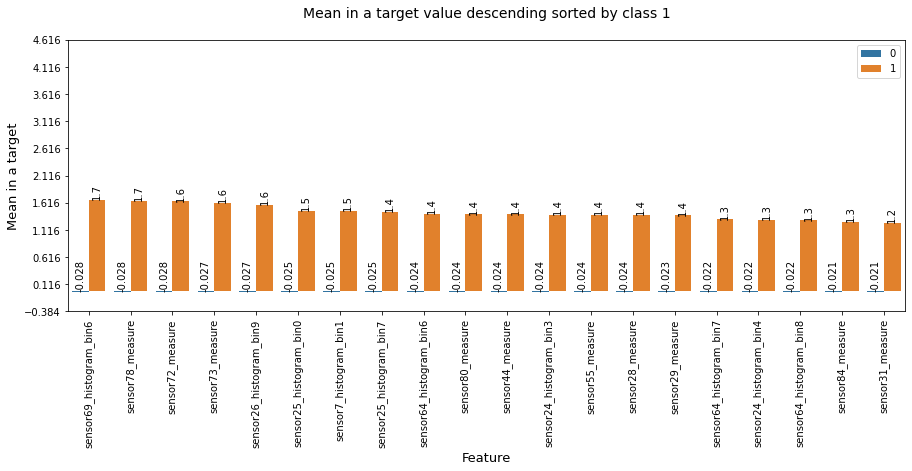

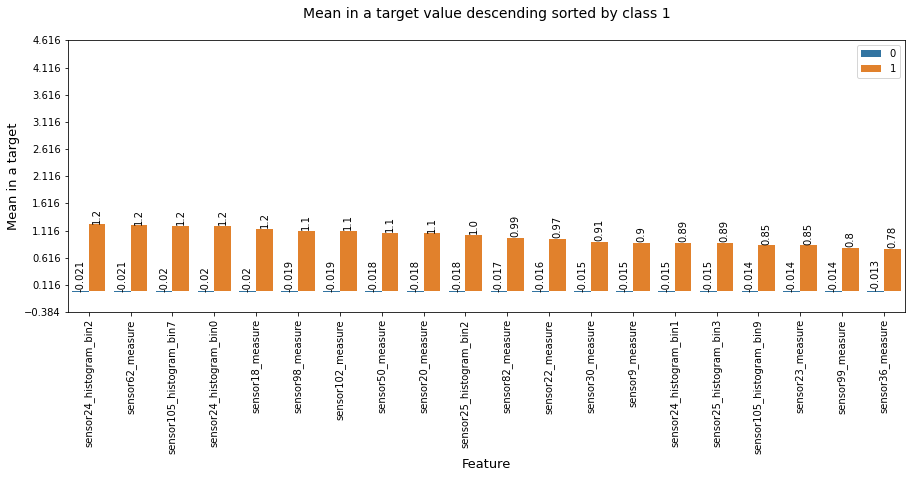

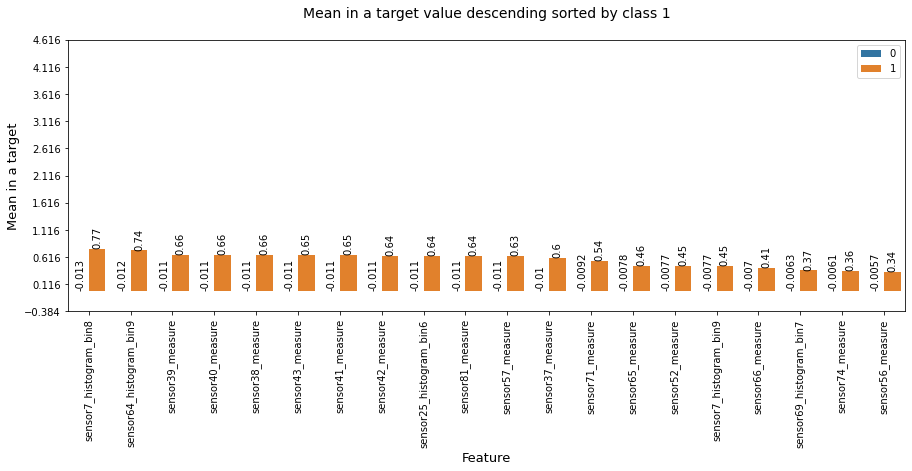

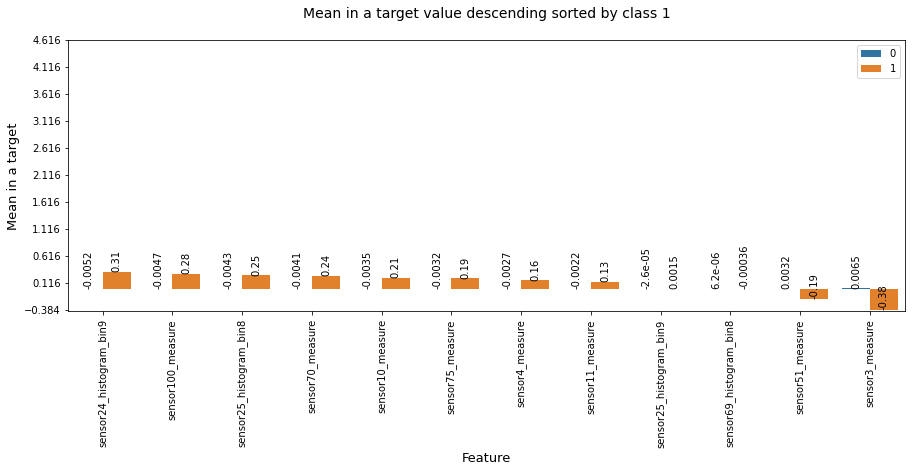

In [ ]:
try:
    plot_diagram(new_column_list,new_mean_list,new_one_zero,"Mean",1)
except ValueError:
    pass

**Taking the mean values class wise and feature wise after 0 imputation, there is a considerable difference between the means of the downhole failure and surface failure.<br><br>
The mean for the downhole failure for most of the given sensors is more than the mean of the surface level failures.**

In [ ]:
counter=0
mean_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    
    if (np.abs(np.abs(mean_list[i])-np.abs(mean_list[i-1]))>=.15):
        mean_higher_reading.append(mean_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        mean_higher_reading.append(mean_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])


        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between median readings of surface and downhole failures.".format(counter))

So we have approximate 129 sensor that show significant difference (> .15) between median readings of surface and downhole failures.


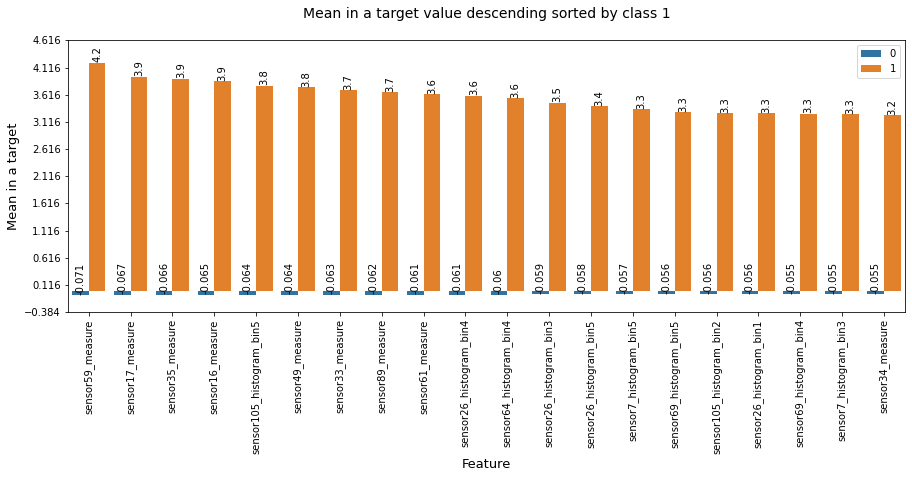

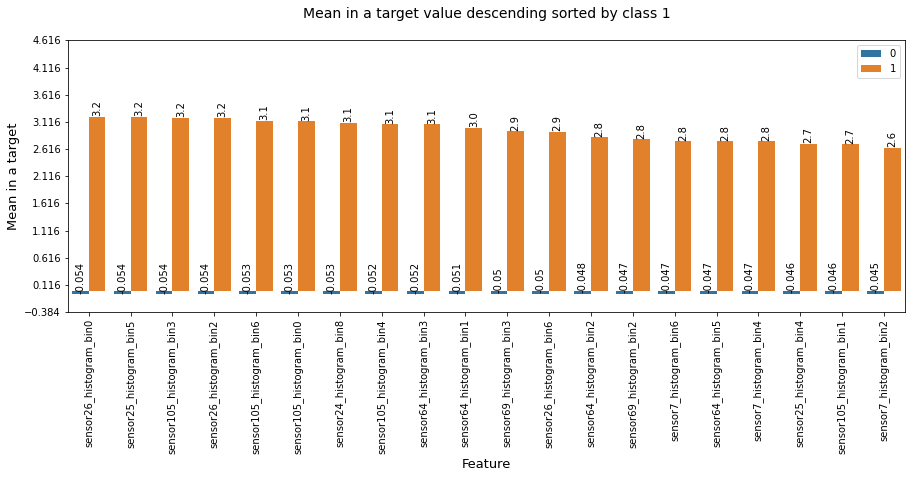

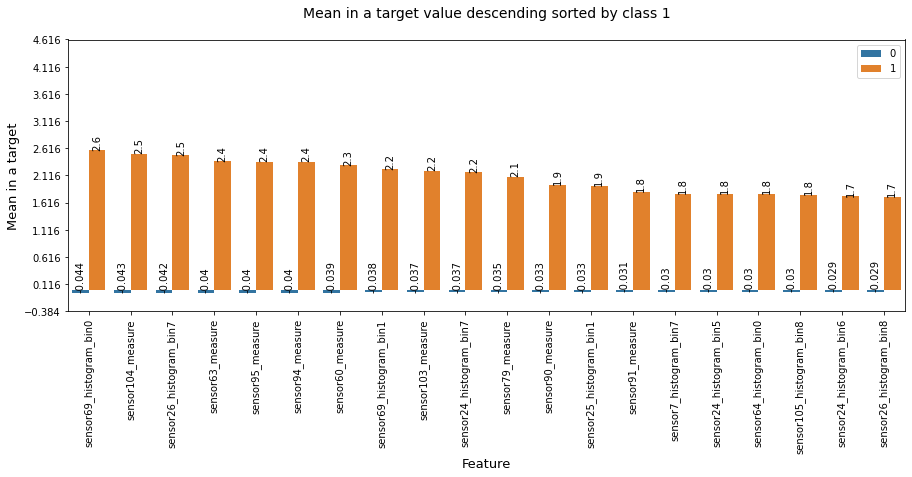

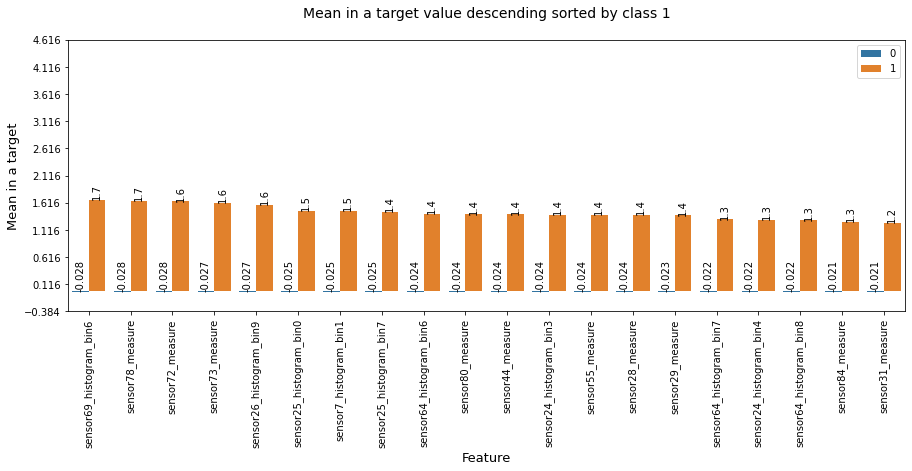

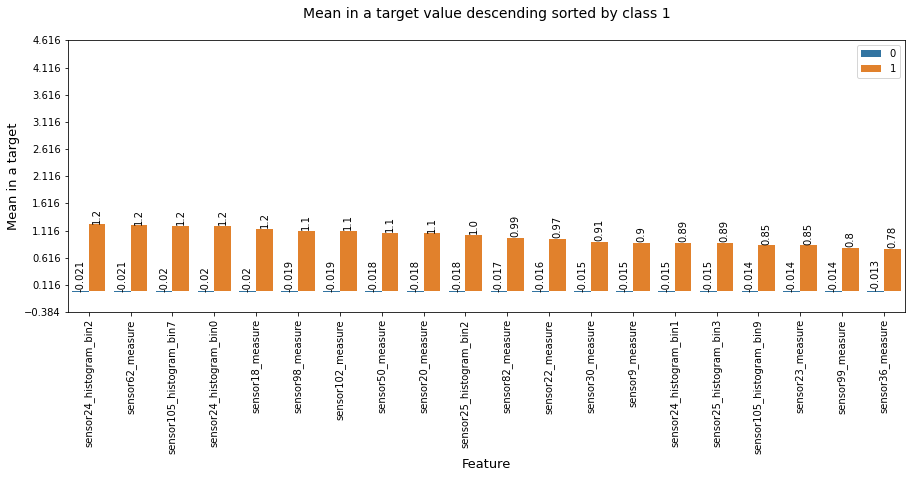

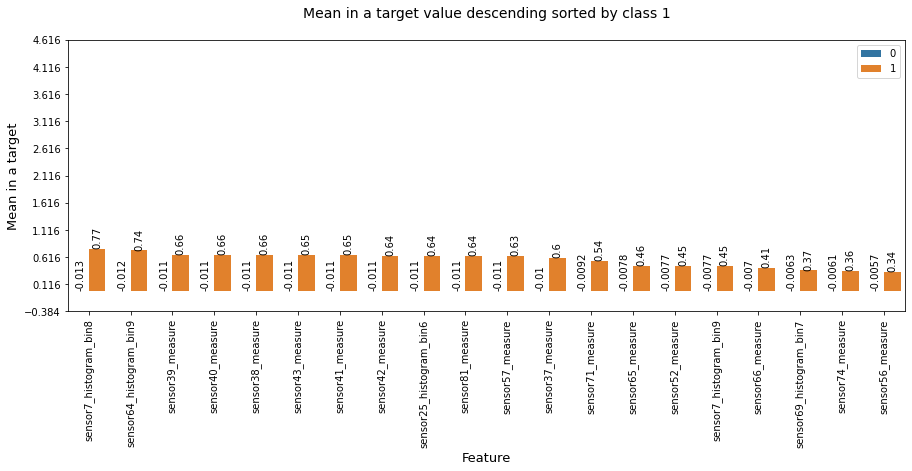

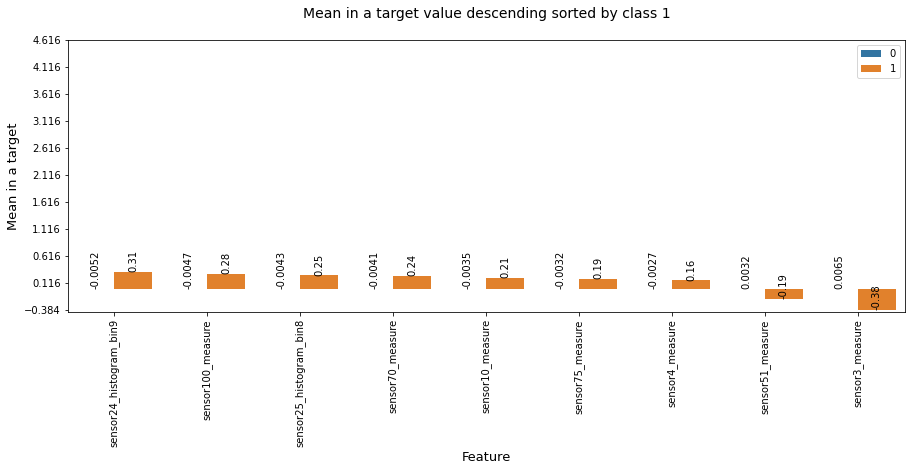

In [ ]:
try:
    plot_diagram(column_higher_reading,mean_higher_reading,one_zero_higher_reading,"Mean",1)
except ValueError:
    pass

**Observations regarding this**

**1) Above are the sensors with most difference between the means of the surface failures as well as the downhole failures.<br>
2) Here the mean for the downhole failures is a lot more than that of the surface failures.<br>
3) Note that all the values which were missing , we filled them with 0 values.**

<h3>Compare the target 0 and target 1 median values feature wise after 0 value imputing</h3>

In [ ]:
column_list=[]
median_list=[]
one_zero=[]


for column in list(new_standard_train_0_all_features_df.columns.values):
    if column!="target":

        column_list.append(column)
        one_zero.append(0)
        median_list.append(new_standard_train_0_all_features_df[column][new_standard_train_0_all_features_df.target==0].median())

        column_list.append(column)
        one_zero.append(1)
        median_list.append(new_standard_train_0_all_features_df[column][new_standard_train_0_all_features_df.target==1].median())

**Find the features where the difference between the medians of the two classes is more than .15<br>
descending sorted by class 1**

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:median_list[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
counter=0
new_column_list=[]
new_median_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_median_list.append(median_list[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_median_list.append(median_list[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 132 sensors.


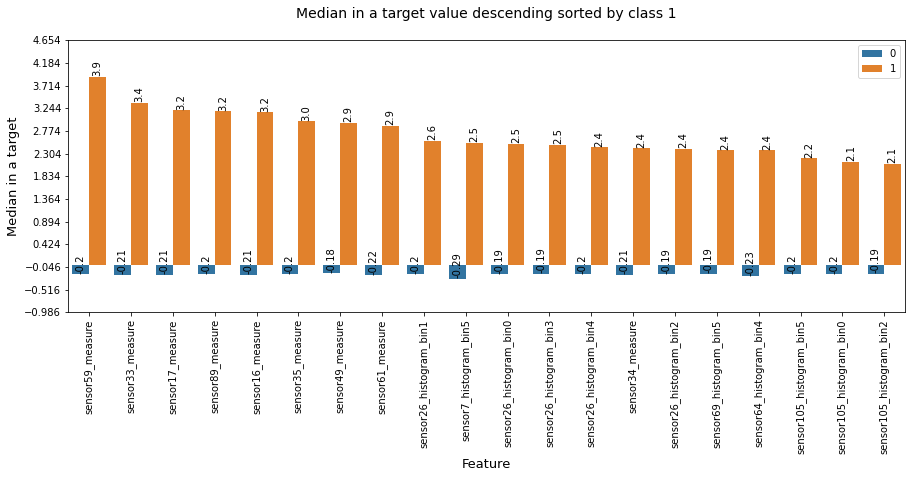

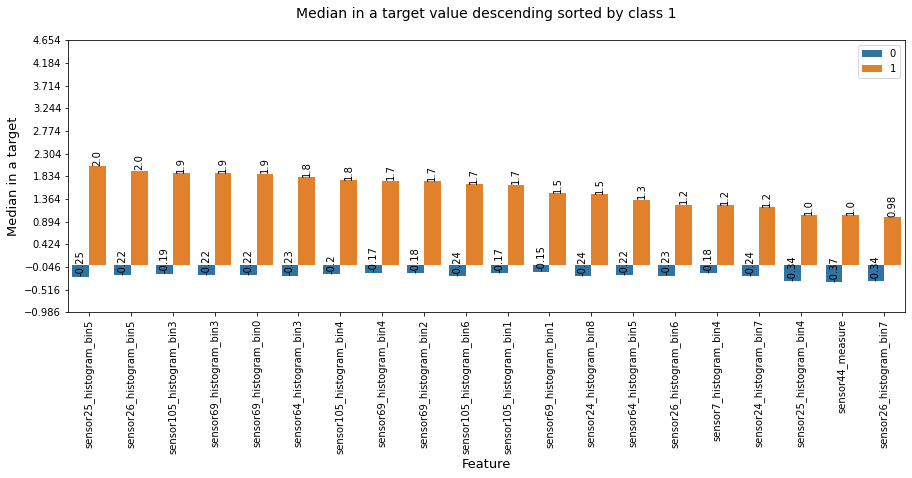

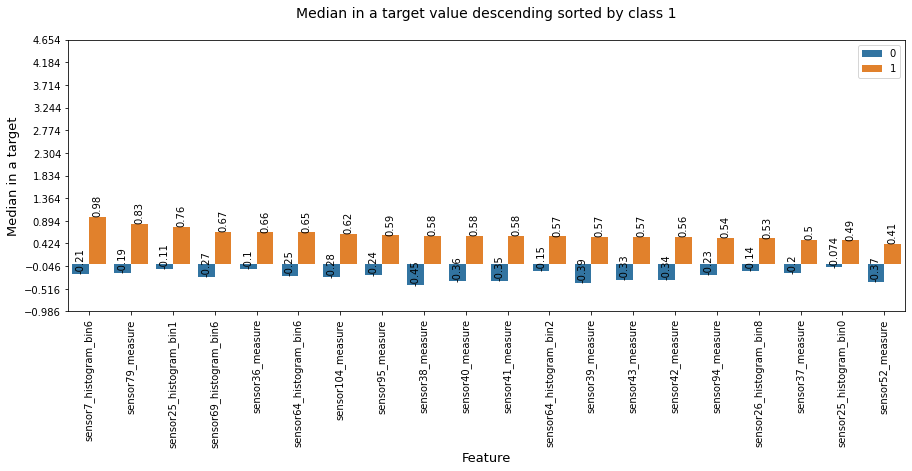

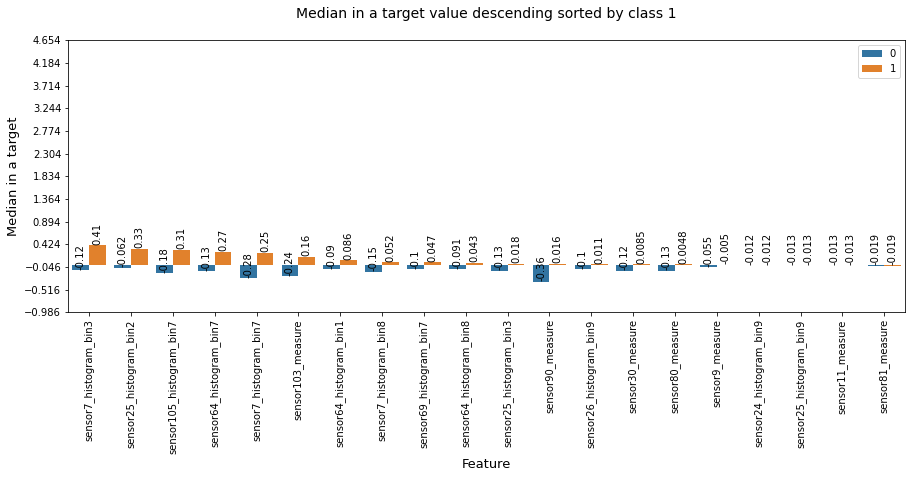

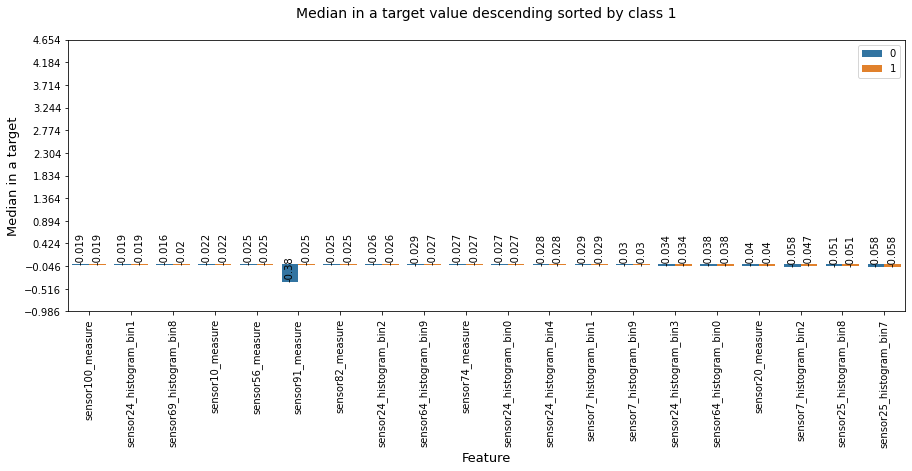

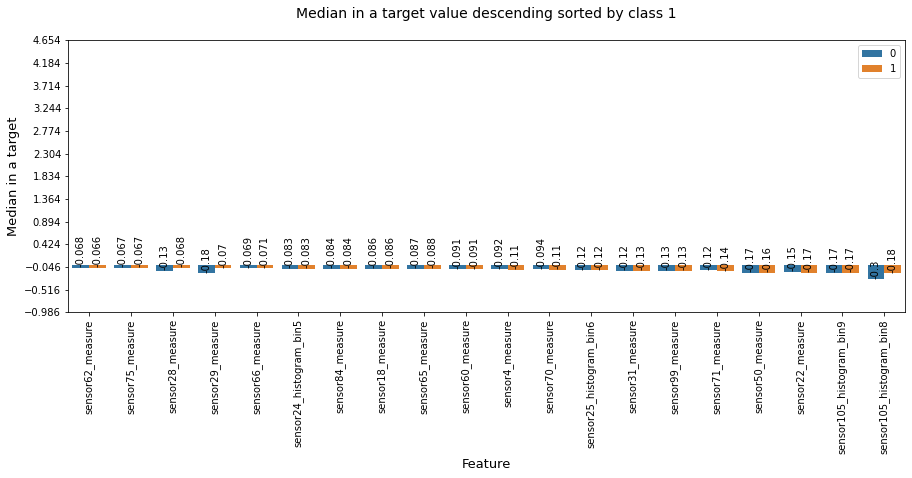

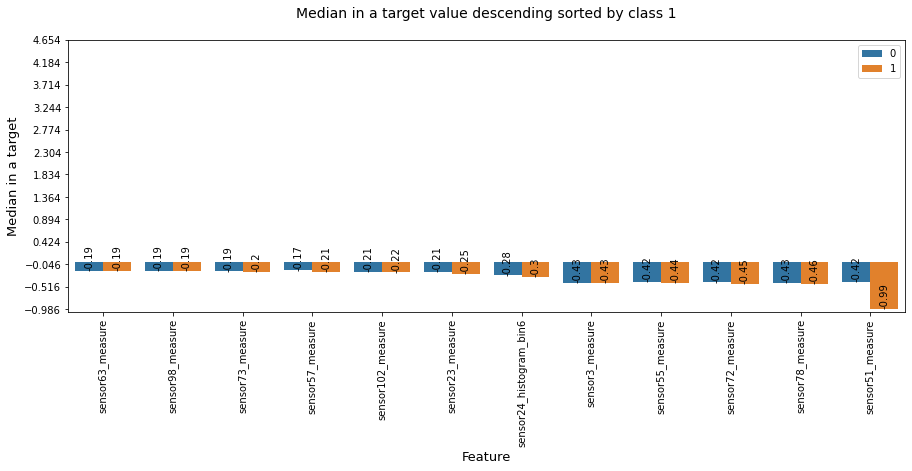

In [ ]:
try:
    plot_diagram(new_column_list,new_median_list,new_one_zero,"Median",1)
except ValueError:
    pass

**Observations:**

**1) In the above graph there are sensors for which the mean of downhole failures is more than that of the surface failures.For example sensor measure 59,16,49.<br>
2) For a few sensors the value is the same. Eg: sensor measure 68,81,100<br>
3) Whereas for a few sensors, the mean of the surface failure is more than that of the surface.Eg: sensor histogram 105 bin 8,sensor 29, 28 measure.**

In [ ]:
counter=0
median_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    
    if (np.abs(np.abs(median_list[i])-np.abs(median_list[i-1]))>=.15):
        median_higher_reading.append(median_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        median_higher_reading.append(median_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])


        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between median readings of surface and downhole failures.".format(counter))

So we have approximate 63 sensor that show significant difference (> .15) between median readings of surface and downhole failures.


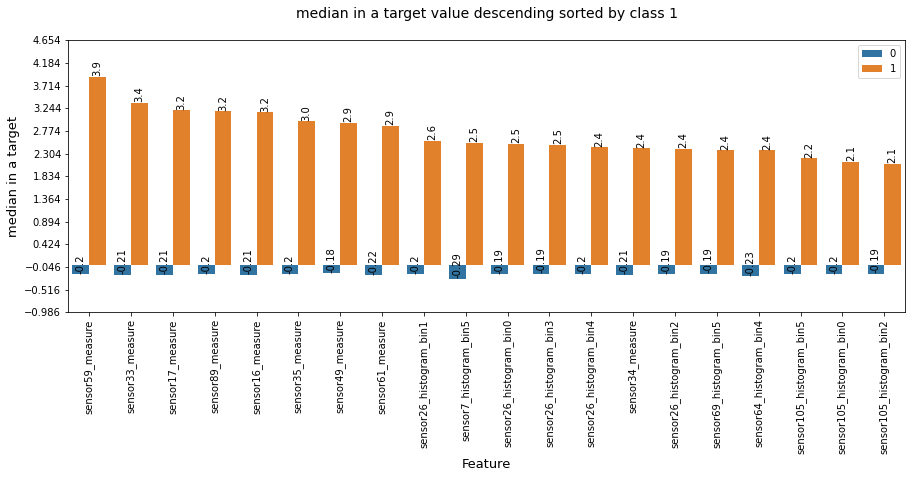

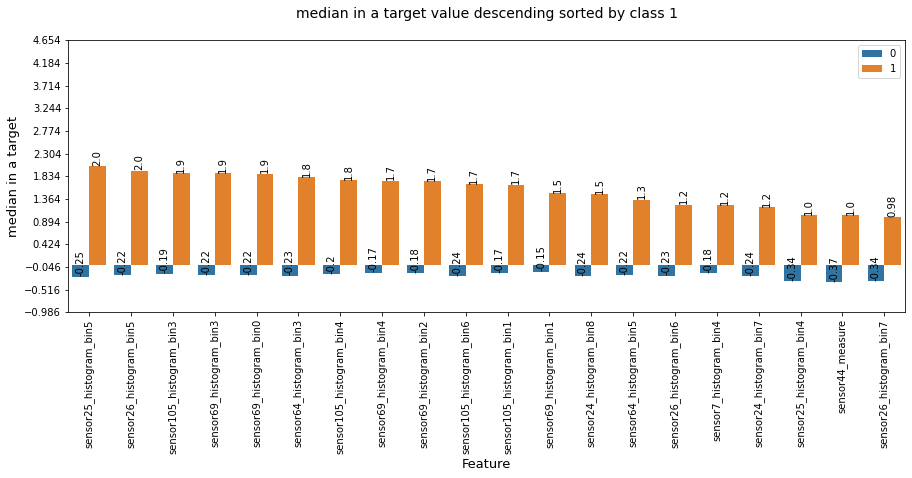

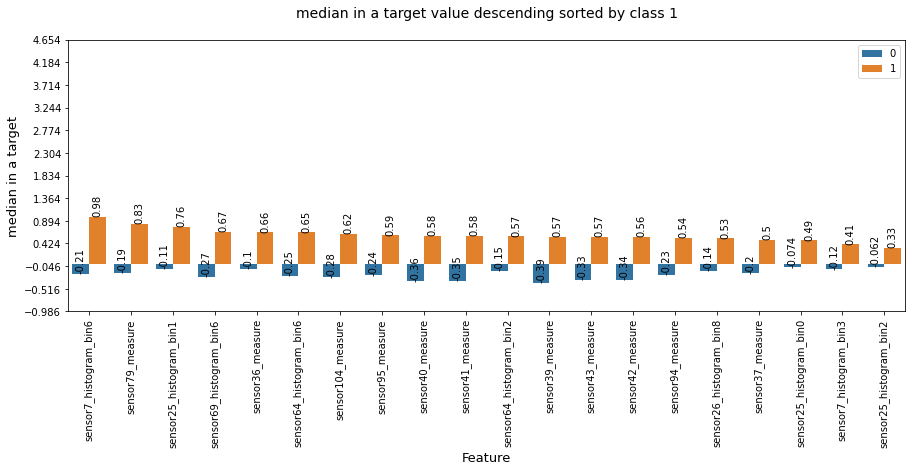

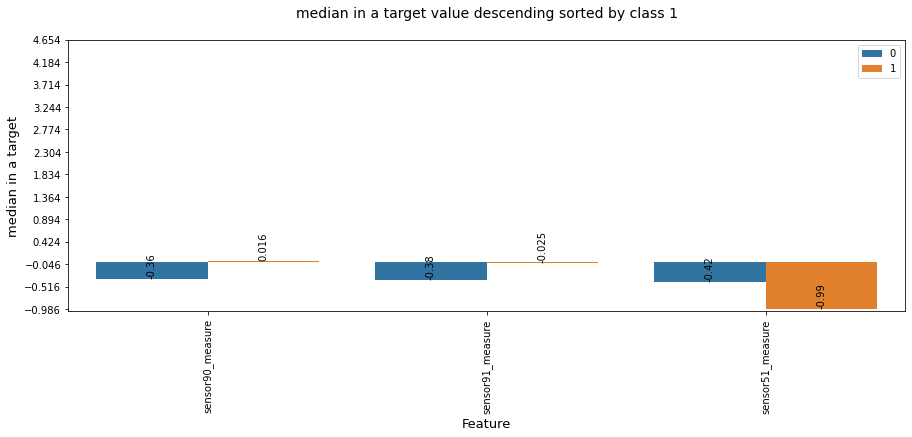

In [ ]:
try:
    plot_diagram(column_higher_reading,median_higher_reading,one_zero_higher_reading,"median",1)
except ValueError:
    pass

In [51]:
def dummy_classifier_based_on_median(data_point,c_list,m_list):
    feature_win=[0,0]
    for i in range(0,len(c_list),2):
        # In this dummy classifier, I will take the value that is closer to a particular median,
        # If my feature value is closer to the median value of the class 0 i.e surface failure,
        # I increase my point for surface failure.
        point=data_point[c_list[i]]
        if (np.abs(np.abs(point)-np.abs(m_list[i])))>(np.abs(np.abs(point)-np.abs(m_list[i+1]))):
            feature_win[1]=feature_win[1]+1
        # If my feature value is closer to the median value of the class 1 i.e downhole failure,
        # I increase my point for downhole failure.
        elif (np.abs(np.abs(np.abs(point)-np.abs(m_list[i+1]))>(np.abs(point)-np.abs(m_list[i])))):
            feature_win[0]=feature_win[0]+1
        # If my feature value is closer to both the classes,
        # I take the majority into consideration  and increase a point for class 0.
        elif (np.abs(np.abs(np.abs(point)-np.abs(m_list[i+1]))))==(np.abs(point)-np.abs(m_list[i])):
            feature_win[0]=feature_win[0]+1
    if feature_win[0]>=feature_win[1]:
        print("Predicted surface failure.")
    if feature_win[1]>feature_win[0]:
        print("Predicted downhole failure.")
    return feature_win

### Basic Classifier

In [ ]:
new_standard_train_0_all_features_df.drop("target",axis=1,inplace=True)

In [ ]:
print(dummy_classifier_based_on_median(new_standard_train_0_all_features_df.loc[0],
                                       column_list,
                                       median_list))

Predicted surface failure.
[108, 24]


In [ ]:
print(dummy_classifier_based_on_median(new_standard_test_0_all_features_df.loc[529],
                                       column_list,
                                       median_list))

Predicted surface failure.
[116, 16]


In [ ]:
new_standard_train_0_all_features_df["target"]=y_train_0_all_features

## EDA for the dataset

**Using histograms, plots find out the nature of means for features for both the classes and thereby, the outliers.**

In [ ]:
mean_0=[]
mean_1=[]
for column in list(new_standard_train_0_all_features_df.columns.values):
    if column!="target":
        mean_0.append(new_standard_train_0_all_features_df[new_standard_train_0_all_features_df.target==0][column].mean())
        mean_1.append(new_standard_train_0_all_features_df[new_standard_train_0_all_features_df.target==1][column].mean())

In [ ]:
median_0=[]
median_1=[]
for column in list(new_standard_train_0_all_features_df.columns.values): 
    if column!="target":
        median_0.append(new_standard_train_0_all_features_df[new_standard_train_0_all_features_df.target==0][column].median())
        median_1.append(new_standard_train_0_all_features_df[new_standard_train_0_all_features_df.target==1][column].median())

**10) Try and plot it’s histogram for both the target values.**

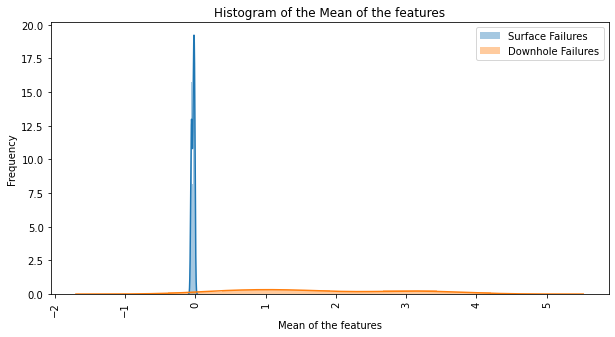

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(mean_0, hist=True, label="Surface Failures")
sns.distplot(mean_1, hist=True, label="Downhole Failures")
plt.title('Histogram of the Mean of the features')
plt.ylabel('Frequency')
plt.xlabel('Mean of the features')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
1) The mean values for surface failures after imputing zero is around the range of 0 only.<br>
2) But we can see that the mean values for the downhole features have values more in magnitude.

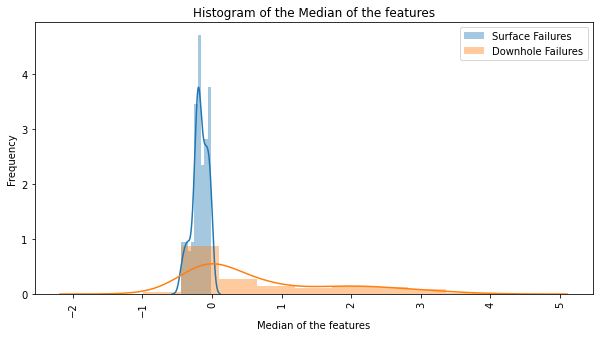

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(median_0, hist=True, label="Surface Failures")
sns.distplot(median_1, hist=True, label="Downhole Failures")
plt.title('Histogram of the Median of the features')
plt.ylabel('Frequency')
plt.xlabel('Median of the features')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
After 0 value imputation , Similar to the mean values , more variance is seen the medians of the downhole failure rather than that of the surface failures.

**11) Try box plot / voilin plot to visualize the outliers.**

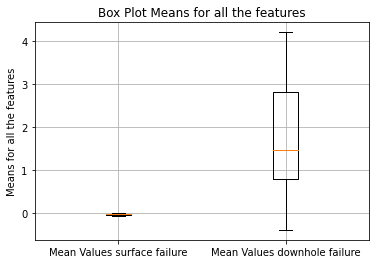

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([mean_0, mean_1])
plt.title('Box Plot Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

**Observations :**<br>
**The mean values for the downhole failures show more variance than that of the surface level failures.**<br>
More detail can be revealed when we plot a bar plot for both the classes feature wise.

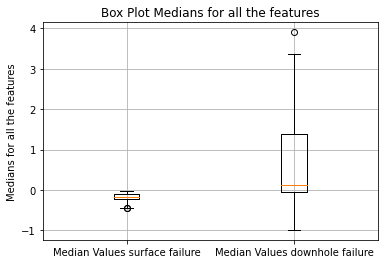

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([median_0, median_1])
plt.title('Box Plot Medians for all the features')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the features')
plt.grid()
plt.show()

**Observations :**<br>
Apart from the 0 to -5 range , we can easily make out the difference between the medians of both the surface as well as downhole failures.

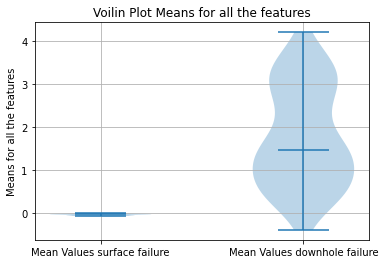

In [ ]:
plt.violinplot([mean_0, mean_1], showmeans=False, showmedians=True)
plt.title('Voilin Plot Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

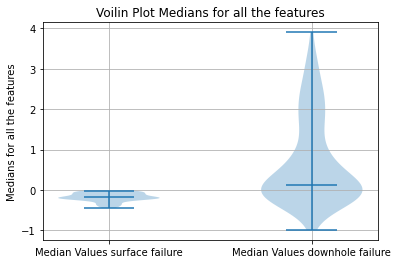

In [ ]:
plt.violinplot([median_0, median_1], showmeans=False, showmedians=True)
plt.title('Voilin Plot Medians for all the features')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the features')
plt.grid()
plt.show()

**Observation :**<br>
From 0 to .-.5 higher chance of finding the value point as surface failure.<br>
But exceed this particular and we have a higher chance of finding the value point as a downhole failure.

**<u><h6 style="color:#01308e;">Why is there such a huge difference between mean/median of the surface failures ?<br><br>
Remember I have 59000 surface failures where if majority is np.NaN then on imputing all those points with 0, we get mean and median as 0.,<br><br>
whereas for the 1000 downhole features,if we impute 0 to these 1000 data points, if we have less values to impute and we have a lesser chance to get mean/median as a 0.<br><br>
Meaning imputing 0, we will always have a more chance of a near zero mean and median for a surface failure given more np.NaNs here.<br><br>
But here from the previous graphs without imputing we can see that still the mean and median for the surface value is near 0 only.</h6></u>**

**PCA**

In [13]:

def run_pca(dataframe,target_value):
    
    pca = PCA(n_components = 2)

    pca_data = pca.fit_transform(dataframe)

    #The shape of anything that you want to hstack must of a column vector that is multiple rows * 1 column
    for_pca = np.hstack((pca_data[:,0].reshape(-1,1),pca_data[:,1].reshape(-1,1),  target_value.to_numpy().reshape(-1,1)))
    
    print(for_pca)

    for_pca_df = pd.DataFrame(data=for_pca, columns=['Dimension_1_X','Dimension_2_Y','target'])

    title="PCA"
    sns.FacetGrid(for_pca_df, hue="target", height=6).map(plt.scatter, 'Dimension_1_X', 'Dimension_2_Y').add_legend()
    plt.title(title)
    plt.show()
    del pca,pca_data,for_pca,for_pca_df

In [ ]:
new_standard_train_0_all_features_df.drop("target",axis=1,inplace=True)

[[-1.5879772  -0.26651788  0.        ]
 [ 2.442555   -0.16708013  0.        ]
 [-2.822596    0.3773239   0.        ]
 ...
 [-0.5035219  -0.0782191   0.        ]
 [-2.837994    0.3715543   0.        ]
 [-1.8105145  -3.1082456   0.        ]]


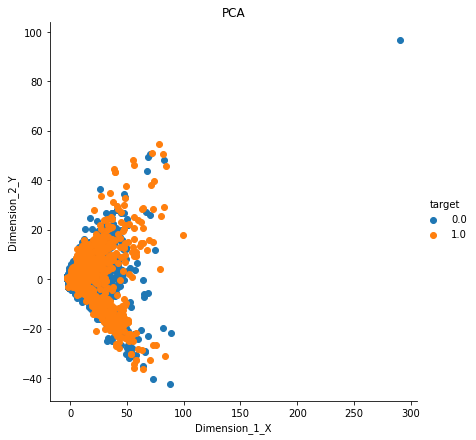

CPU times: user 1.95 s, sys: 936 ms, total: 2.89 s
Wall time: 6.5 s


In [ ]:
%%time
run_pca(new_standard_train_0_all_features_df,y_train_0_all_features)

**tsne**

In [ ]:
def run_tsne(dataframe,target_value,a,b):

    t_SNE = TSNE(n_components=2,perplexity=a, n_iter=b)

    t_SNE_data = t_SNE.fit_transform(dataframe)

    #The shape of anything that you want to hstack must of a column vector that is multiple rows * 1 column
    for_tsne = np.hstack((t_SNE_data[:,0].reshape(-1,1),t_SNE_data[:,1].reshape(-1,1),  target_value.to_numpy().reshape(-1,1)))

    for_tsne_df = pd.DataFrame(data=for_tsne, columns=['Dimension_1_X','Dimension_2_Y','target'])

    title="TSNE for perplexity : "+str(a)+" and iterations : "+str(b)
    sns.FacetGrid(for_tsne_df, hue="target", height=6).map(plt.scatter, 'Dimension_1_X', 'Dimension_2_Y').add_legend()
    plt.title(title)
    plt.show()
    del t_SNE,t_SNE_data,for_tsne,for_tsne_df

**Do not put these values in a loop as we do not get all the output graphs**

In [ ]:
new_standard_train_0_all_features_df.head()

,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin8,sensor7_histogram_bin9,sensor9_measure,sensor10_measure,sensor11_measure,sensor16_measure,sensor17_measure,sensor18_measure,sensor20_measure,sensor22_measure,sensor23_measure,sensor24_histogram_bin0,sensor24_histogram_bin1,sensor24_histogram_bin2,sensor24_histogram_bin3,sensor24_histogram_bin4,sensor24_histogram_bin5,sensor24_histogram_bin6,sensor24_histogram_bin7,sensor24_histogram_bin8,sensor24_histogram_bin9,sensor25_histogram_bin0,sensor25_histogram_bin1,sensor25_histogram_bin2,sensor25_histogram_bin3,sensor25_histogram_bin4,sensor25_histogram_bin5,sensor25_histogram_bin6,sensor25_histogram_bin7,sensor25_histogram_bin8,sensor25_histogram_bin9,...,sensor69_histogram_bin2,sensor69_histogram_bin3,sensor69_histogram_bin4,sensor69_histogram_bin5,sensor69_histogram_bin6,sensor69_histogram_bin7,sensor69_histogram_bin8,sensor70_measure,sensor71_measure,sensor72_measure,sensor73_measure,sensor74_measure,sensor75_measure,sensor78_measure,sensor79_measure,sensor80_measure,sensor81_measure,sensor82_measure,sensor84_measure,sensor89_measure,sensor90_measure,sensor91_measure,sensor94_measure,sensor95_measure,sensor98_measure,sensor99_measure,sensor100_measure,sensor102_measure,sensor103_measure,sensor104_measure,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9
0,-0.432133,-0.105982,-0.028788,-0.057798,-0.115322,-0.179659,-0.230364,-0.091357,-0.202172,-0.156219,-0.029573,-0.054959,-0.022185,-0.013152,-0.244757,-0.265684,-0.086423,-0.03992,-0.166468,-0.246527,-0.026929,-0.019102,-0.025508,-0.03445,-0.027878,-0.027653,0.020405,-0.204042,-0.223482,-0.012042,-0.039356,-0.062358,-0.046700,-0.127173,-0.270692,-0.098743,-0.118703,-0.058450,-0.050906,-0.012781,...,-0.137894,-0.239430,-0.105056,-0.155076,-0.358766,-0.126318,-0.018416,-0.109356,-0.138688,-0.452112,-0.203181,-0.026793,-0.067077,-0.459987,-0.199413,-0.175349,-0.018598,-0.025464,-0.083804,-0.242006,0.242566,-0.024485,-0.139597,-0.218296,-0.187032,-0.127898,-0.018679,-0.216657,-0.353090,-0.382834,-0.256760,-0.165248,-0.101704,-0.023120,-0.043164,-0.125800,-0.197921,-0.168610,-0.201328,-0.163656
1,2.314107,0.287838,-0.028788,-0.057798,-0.115322,-0.174906,0.319443,0.529633,0.351873,0.110657,-0.029573,-0.054959,-0.022185,-0.013152,0.319847,0.443157,-0.086423,-0.03992,-0.017622,1.010155,-0.026929,-0.019102,-0.025508,-0.03445,-0.027878,-0.083133,1.042130,-0.087201,0.079451,-0.012042,-0.036806,-0.063436,-0.039402,-0.123584,-0.350036,0.720566,-0.082486,-0.058471,-0.050906,-0.012781,...,-0.001549,0.778955,-0.005462,0.239298,0.768845,0.091527,-0.003506,0.147873,0.251669,1.051907,-0.089193,-0.026793,0.008088,0.965251,0.495763,0.631260,-0.018598,-0.025464,-0.083804,0.241243,1.363699,2.495773,0.304205,0.356043,-0.187032,-0.127898,-0.018679,0.275549,0.624807,0.673374,0.439128,0.094757,0.067029,0.134633,0.280860,0.575207,0.836743,-0.017559,-0.288466,-0.170285
2,-0.432133,-0.097285,-0.028788,-0.057798,-0.114347,-0.176379,-0.335489,-0.424505,-0.351836,-0.156630,-0.029573,-0.054959,-0.022185,-0.013152,-0.315460,-0.347217,-0.086423,-0.03992,-0.163972,-0.236881,-0.026929,-0.019102,-0.025508,-0.03445,-0.027878,-0.083133,-0.329568,-0.294156,-0.263226,-0.012042,-0.096603,-0.122732,-0.069795,-0.133734,-0.360785,-0.325649,-0.097640,-0.055213,0.000112,-0.012781,...,-0.195305,-0.320098,-0.212420,-0.396308,-0.449405,-0.150412,-0.018779,-0.101911,-0.136611,-0.449950,-0.203167,-0.026793,-0.067068,-0.457849,-0.299864,-0.175349,-0.018598,-0.025464,-0.067775,-0.339734,-0.459236,-0.494111,-0.417774,-0.442030,-0.173687,-0.127553,-0.018679,-0.216657,-0.304420,-0.347733,-0.297290,-0.304057,-0.383052,-0.390071,

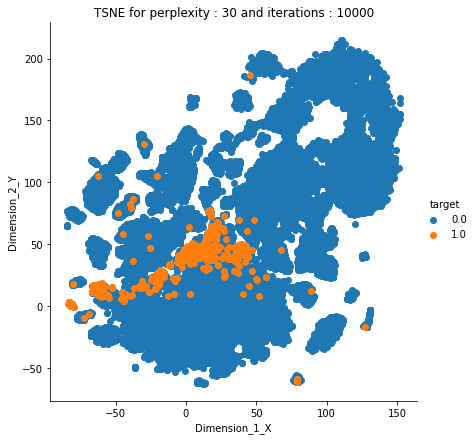

CPU times: user 12.5 s, sys: 13.6 s, total: 26.1 s
Wall time: 25.9 s


In [ ]:
%%time
run_tsne(new_standard_train_0_all_features_df,y_train_0_all_features,30,10000)

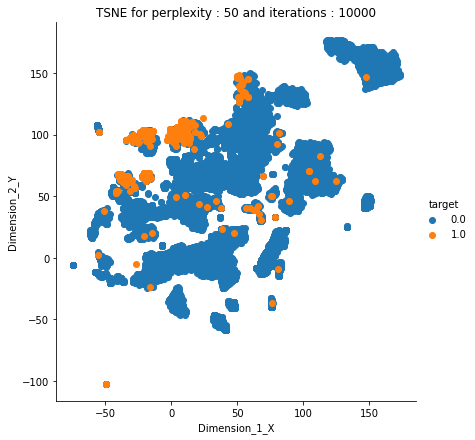

CPU times: user 13.1 s, sys: 13.6 s, total: 26.7 s
Wall time: 26.6 s


In [ ]:
%%time
run_tsne(new_standard_train_0_all_features_df,y_train_0_all_features,50,10000)

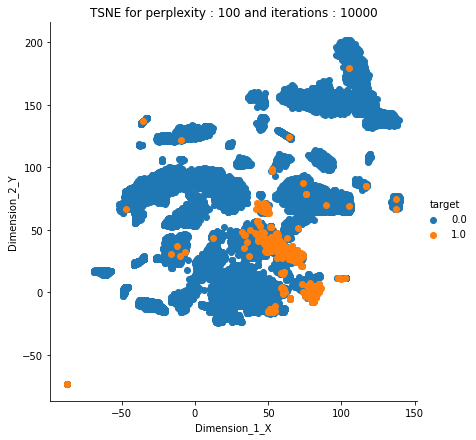

CPU times: user 13.7 s, sys: 13.4 s, total: 27.1 s
Wall time: 27 s


In [ ]:
%%time
run_tsne(new_standard_train_0_all_features_df,y_train_0_all_features,100,10000)

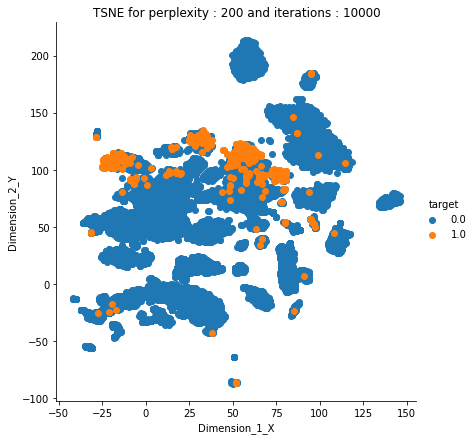

CPU times: user 14.3 s, sys: 13.6 s, total: 27.9 s
Wall time: 27.7 s


In [ ]:
%%time
run_tsne(new_standard_train_0_all_features_df,y_train_0_all_features,200,10000)

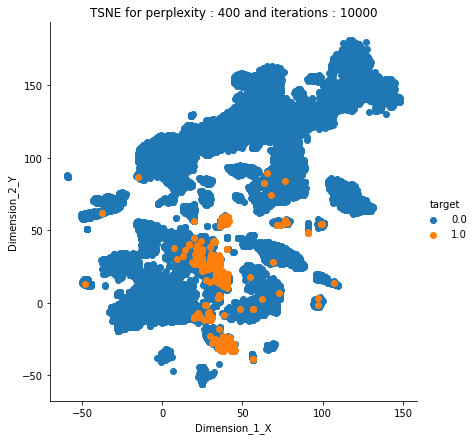

CPU times: user 14.2 s, sys: 13.2 s, total: 27.4 s
Wall time: 27.2 s


In [ ]:
%%time
run_tsne(new_standard_train_0_all_features_df,y_train_0_all_features,400,10000)

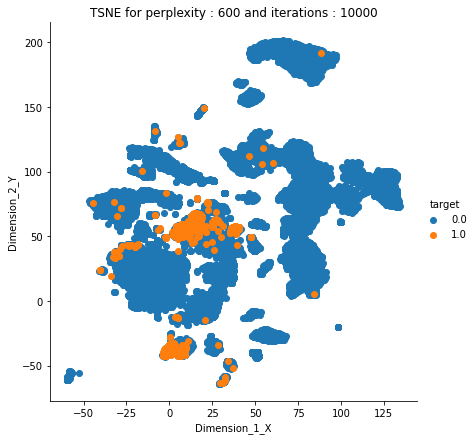

CPU times: user 14 s, sys: 13.3 s, total: 27.3 s
Wall time: 27.1 s


In [ ]:
%%time
run_tsne(new_standard_train_0_all_features_df,y_train_0_all_features,600,10000)

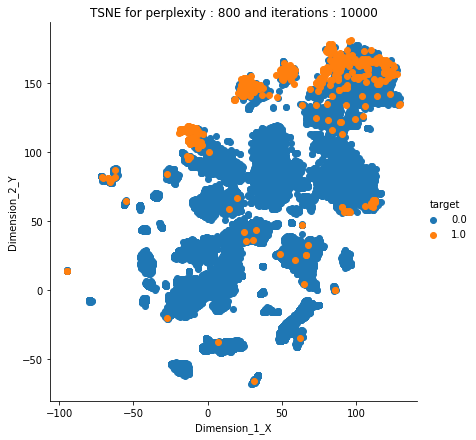

CPU times: user 14.2 s, sys: 13.5 s, total: 27.7 s
Wall time: 27.5 s


In [ ]:
%%time
run_tsne(new_standard_train_0_all_features_df,y_train_0_all_features,800,10000)

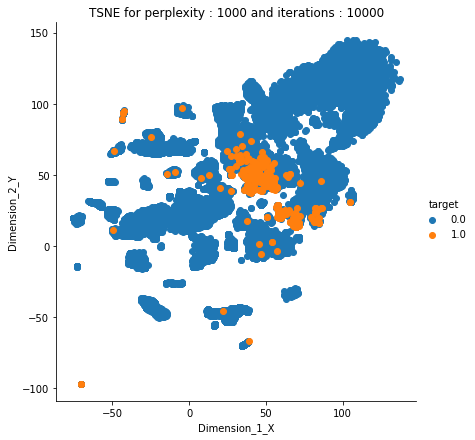

CPU times: user 14.2 s, sys: 13.6 s, total: 27.8 s
Wall time: 27.6 s


In [ ]:
%%time
run_tsne(new_standard_train_0_all_features_df,y_train_0_all_features,1000,10000)

**Observation :**<br>
1) Observe that different perplexities tSNE is able to differentiate all the data points into different groups, but it is not able to differentiate properly the surface failures from the downhole failures. If the surface and downhole failures are coming under the same category then they are shown in the same cluster.<br>
2) Not all the the surface and downhole features are coming under the same category.

## Perform a similar EDA on the outliers.

### Here we take the outliers from the features that have been selected.

### For each sensor we find the outliers that also classwise.

### The issue is that there maybe high outliers here , but there maybe lower outliers here as well.

https://www.geeksforgeeks.org/interquartile-range-and-quartile-deviation-using-numpy-and-scipy/<br>
**Higher outlier = more than 1.5 ⋅ IQR above the third quartile.**<br>
**Lower outlier = less than 1.5 . IQR below the first quartile.**<br>
**The IQR is the difference between Q3 and Q1.**

In [ ]:
new_standard_train_0_all_features_df["target"]=y_train_0_all_features

In [ ]:
counter=0
main_dictionary=dict()
outliers=[]
list_of_outliers_features_classes=[]
for i in range(len(column_list)):
    d=dict()
    new_list=new_standard_train_0_all_features_df[new_standard_train_0_all_features_df.target==one_zero[i]]\
    [column_list[i]]      
    new_index=list(new_list.reset_index()["index"])
    QR1=np.percentile(new_list, 25)
    QR3=np.percentile(new_list, 75)
    IQR=QR3-QR1
    for index,value in zip(new_index,new_list):    
        if (value>(QR3+(IQR*1.5))) or (value<(QR1-(IQR*1.5))):
            counter=counter+1
            d.update({index:value})
            if index not in main_dictionary:
                main_dictionary.update({index:list(new_standard_train_0_all_features_df.loc[index])})
    list_of_outliers_features_classes.append(d)
    del d
    outliers.append(counter)
    counter=0

In [ ]:
print("Total number of data points that are outliers in atleast one or more than one feature : ",len(np.unique(list(main_dictionary.keys()))))

Total number of data points that are outliers in atleast one or more than one feature :  44483


In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:outliers[i] for i in index}

d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])
    
counter=0
new_column_list=[]
new_outliers_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_outliers_list.append(outliers[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_outliers_list.append(outliers[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 132 sensors.


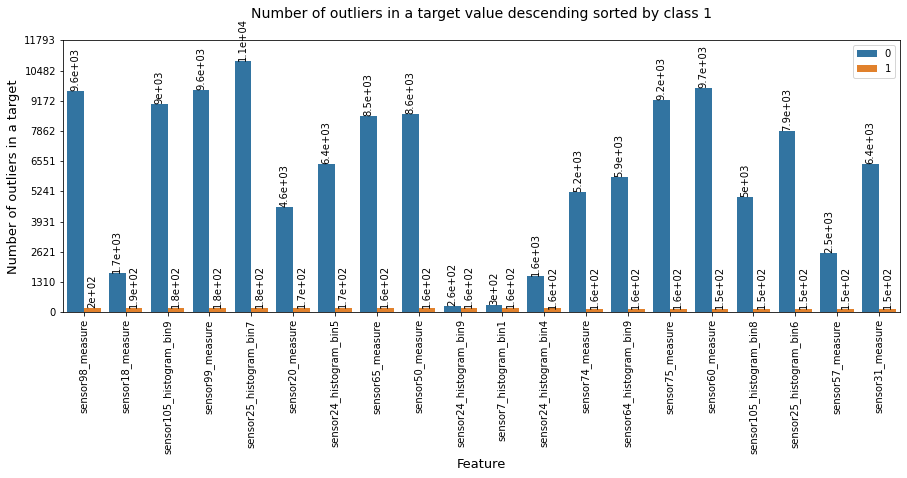

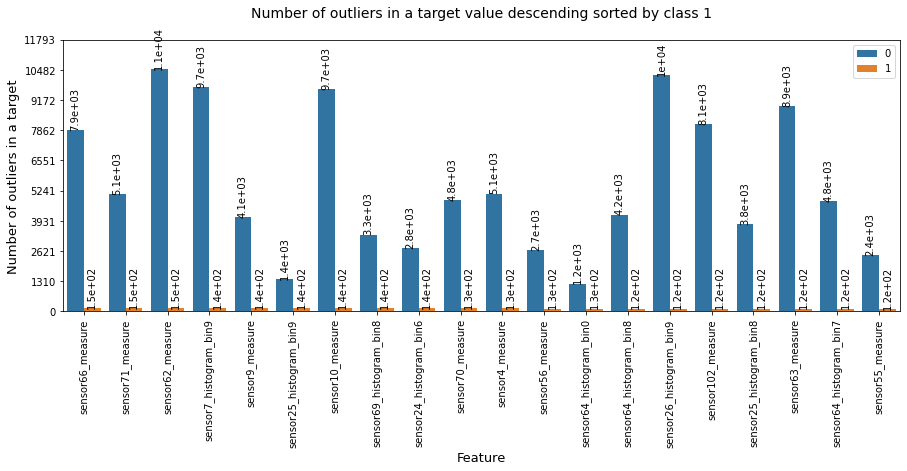

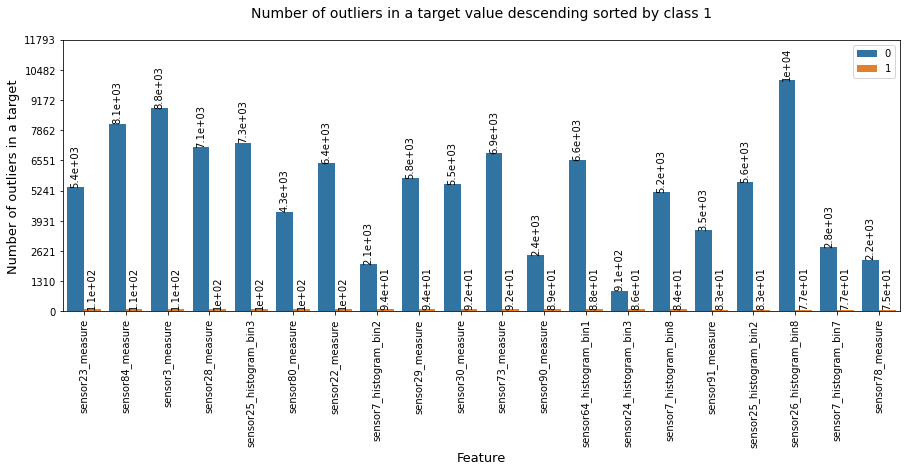

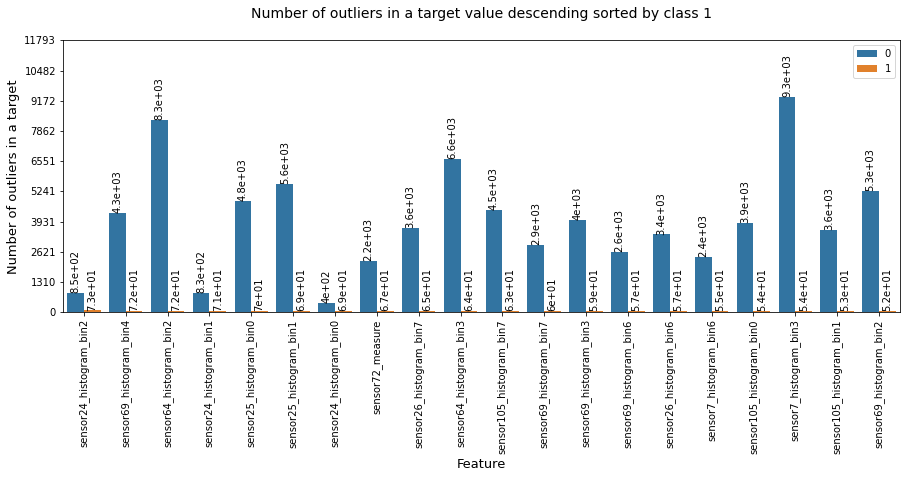

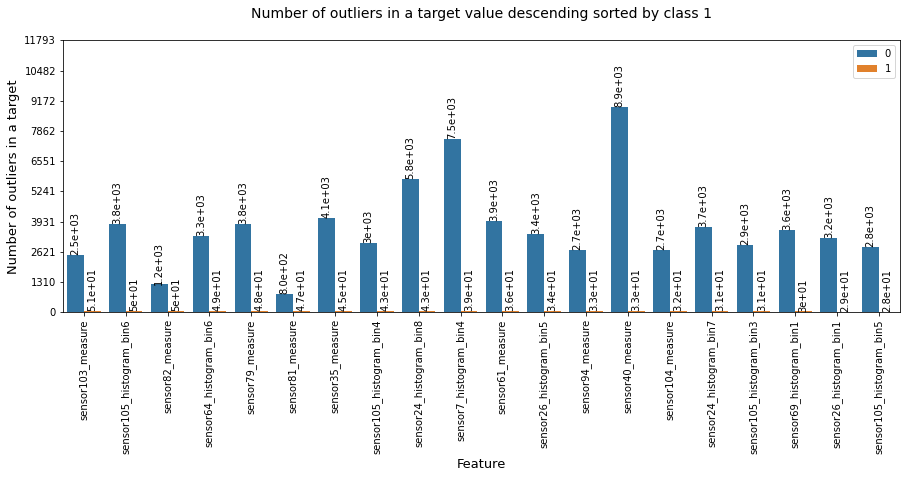

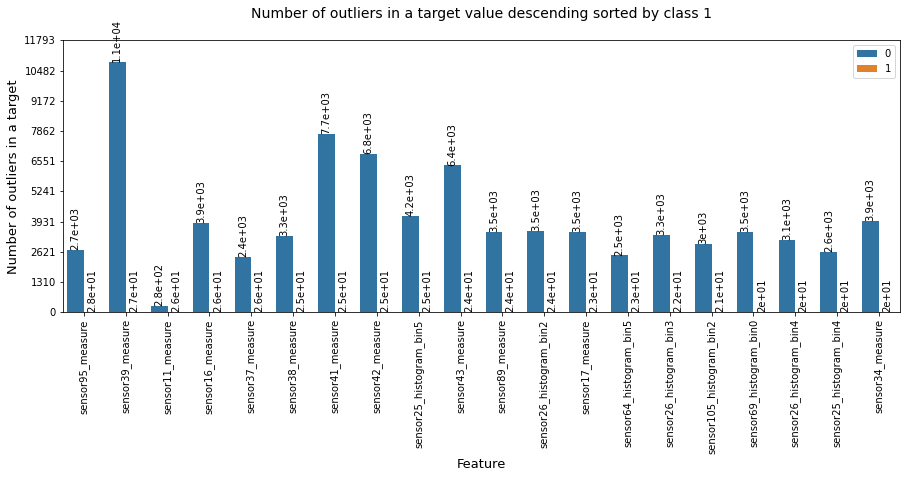

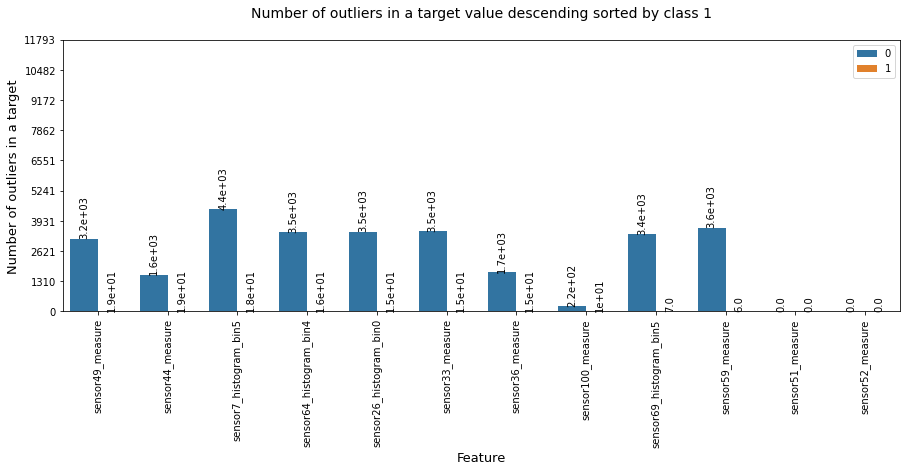

In [ ]:
try:
    plot_diagram(new_column_list,new_outliers_list,new_one_zero,"Number of outliers",1)
except ValueError:
    pass

**Observation :**<br>
Maximum number of outliers can be seen in the surface level failures , compared to it, there are way less numbers of outliers in the downhole failures.<br>
Meaning, here originally and during imputation , there is chance that we make the median or mean as near to 0 for when we have imputed enough data points.<br>
So these values , then become the outliers. Hence more outliers for the surface related failures.

### For every column feature, get the mean for the outliers for both class 0 and class 1.

In [ ]:
mean_0=[]
mean_1=[]
for i in range(0,len(list_of_outliers_features_classes),2):
    class_0=[ele for ele in list_of_outliers_features_classes[i].values()]
    class_1=[ele for ele in list_of_outliers_features_classes[i+1].values()]
    if (len(class_0)==0) :
        mean_0.append(0.01)
    else :
        mean_0.append(np.mean(class_0))

    if (len(class_1)==0):
        mean_1.append(0.01)
    else :
        mean_1.append(np.mean(class_1))

In [ ]:
median_0=[]
median_1=[]
for i in range(0,len(list_of_outliers_features_classes),2):
    class_0=[ele for ele in list_of_outliers_features_classes[i].values()]
    class_1=[ele for ele in list_of_outliers_features_classes[i+1].values()]
    if (len(class_0)==0) :
        median_0.append(0.01)
    else :
        median_0.append(np.median(class_0))

    if (len(class_1)==0):
        median_1.append(0.01)
    else :
        median_1.append(np.median(class_1))

### Plotting the mean and median for each feature class wise.

**10) Try and plot it’s histogram for both the target values.**

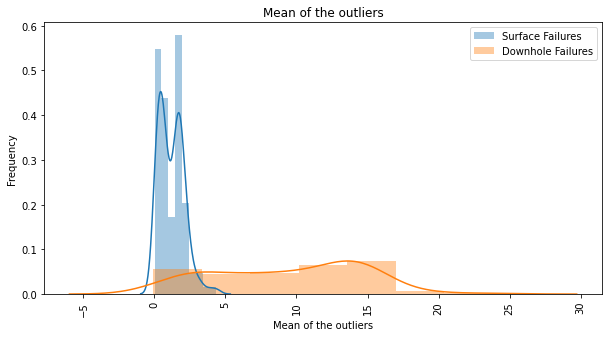

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(mean_0, hist=True, label="Surface Failures")
sns.distplot(mean_1, hist=True, label="Downhole Failures")
plt.title('Mean of the outliers')
plt.ylabel('Frequency')
plt.xlabel('Mean of the outliers')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observation :**<br>
More variance for the downhole failures, but more values near to 0 for surface failures.<br>
One of the reasons can be that we have imputed 0 value on surface level failure features, as we have more np.NaN values for the surface failures.

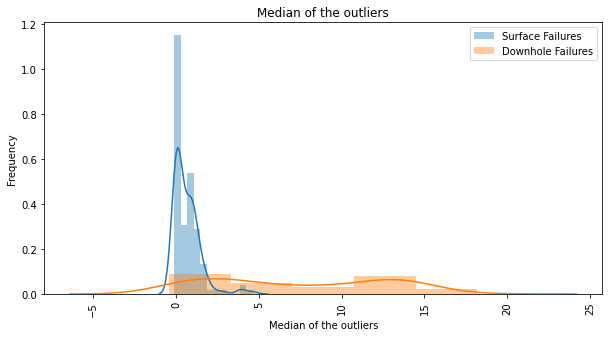

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(median_0, hist=True, label="Surface Failures")
sns.distplot(median_1, hist=True, label="Downhole Failures")
plt.title('Median of the outliers')
plt.ylabel('Frequency')
plt.xlabel('Median of the outliers')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observation :**<br>
More variance for the downhole outliers, but more values near to 0 for surface outliers.

**11) Try box plot / voilin plot to visualize the outliers.**

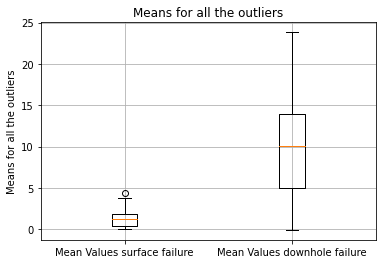

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([mean_0, mean_1])
plt.title('Means for all the outliers')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the outliers')
plt.grid()
plt.show()

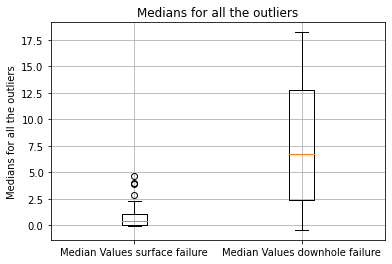

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([median_0, median_1])
plt.title('Medians for all the outliers')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the outliers')
plt.grid()
plt.show()

**Observations :**<br>
We can say that after imputing 0 , the overall value for mean and median is higher for downhole outliers.

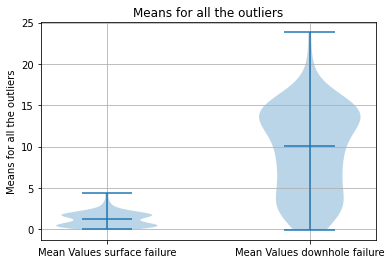

In [ ]:
plt.violinplot([mean_0, mean_1], showmeans=False, showmedians=True)
plt.title('Means for all the outliers')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the outliers')
plt.grid()
plt.show()

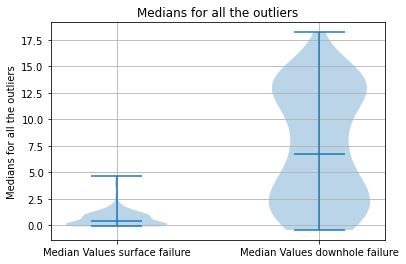

In [ ]:
plt.violinplot([median_0, median_1], showmeans=False, showmedians=True)
plt.title('Medians for all the outliers')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the outliers')
plt.grid()
plt.show()

**Observation :**<br>
1) If we consider the values for both the means and medians of the outliers then they are less different.<br>
2) But if we consider the values for both the means and medians of the main features , then the difference is more. 

# For the given data points and features enter new features that tell if these values were previously np.NaN or not.

In [ ]:
new_standard_train_0_all_features_df.drop("target",axis=1,inplace=True)

In [ ]:
def fuse_dataframe_nan(data_dataframe,nan_dataframe,columns):
    output_dataframe=pd.DataFrame()
    for column in columns:
        output_dataframe[column]=nan_dataframe[column]
    return output_dataframe

In [ ]:
nan_standard_train_0_all_features_df=fuse_dataframe_nan(new_standard_train_0_all_features_df,nan_or_not,set(new_column_list))
nan_standard_train_0_all_features_df["target"]=y_train_0_all_features
nan_standard_train_0_all_features_df.head()

,sensor7_histogram_bin2,sensor17_measure,sensor105_histogram_bin3,sensor69_histogram_bin7,sensor64_histogram_bin2,sensor40_measure,sensor26_histogram_bin6,sensor73_measure,sensor78_measure,sensor64_histogram_bin0,...,sensor7_histogram_bin5,sensor70_measure,sensor61_measure,sensor24_histogram_bin4,sensor7_histogram_bin8,sensor4_measure,sensor26_histogram_bin9,sensor75_measure,sensor9_measure,target
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Now this is the problem out of the given data that we have , we select the features that have more than 50% np.NaNs

In [ ]:
counter=0
for column in nan_standard_train_0_all_features_df.columns.values:
    percent_of_nan=nan_standard_train_0_all_features_df[column].value_counts()[1]/\
            (nan_standard_train_0_all_features_df[column].value_counts()[0]+\
             nan_standard_train_0_all_features_df[column].value_counts()[1])
    if (percent_of_nan>.5) :
        counter=counter+1
        print(column,"  :  ",percent_of_nan)
print("Overall : ",counter," features with % of na's more than 50%")

sensor40_measure   :   0.77375
sensor41_measure   :   0.7967916666666667
sensor42_measure   :   0.8133125
sensor38_measure   :   0.6605416666666667
sensor43_measure   :   0.822
sensor39_measure   :   0.7348958333333333
Overall :  6  features with % of na's more than 50%


<h3>2) Impute np.NaN with mean values with all features.</h3>

**Now I am taking all the features and replacing the np.NaN readings with the mean of the class to check if PCA and tSNE can visualise the 2 failures separately.**

In [5]:
data_type="mean_impute_data"

In [ ]:
train_mean_all_features=train.copy()
y_train_mean_all_features=y_train.copy()
test_mean_all_features=test.copy()
y_test_mean_all_features=y_test.copy()

In [ ]:
train_mean_all_features.shape

(48000, 170)

In [ ]:
y_train_mean_all_features.shape

(48000,)

In [ ]:
test_mean_all_features.shape

(12000, 170)

In [ ]:
y_test_mean_all_features.shape

(12000,)

In [ ]:
for i ,j in zip(train_mean_all_features.columns.values,test_mean_all_features.columns.values):
    if (i!=j):
        print(i," : ",j)

In [ ]:
train_mean_all_features,y_train_mean_all_features=reset_index(train_mean_all_features,y_train_mean_all_features)
test_mean_all_features,y_test_mean_all_features=reset_index(test_mean_all_features,y_test_mean_all_features)

**Filling the np.NaN values with the mean of the category this time.**

In [ ]:
l=[]
for ele in train_mean_all_features["sensor4_measure"]:
    if np.isnan(ele):
        pass
    else:
        l.append(ele) 
np.mean(l)

452.84097318219517

In [ ]:
train_mean_all_features["sensor4_measure"].mean()

452.84097

Both are the same so the pandas.series.mean() function ignores the value that has the np.NaN and does not even count it.<br>
Divide the whole dataframe into the number of categories that we have and then only enter the mean for that feature for that particular category.

In [ ]:
def impute_mean_for_train_n_test_as_per_train(train_dataframe,train_target,
                                               test_dataframe,test_target,data_type):
        
    train_1=train_dataframe.loc[train_target[train_target==1].reset_index()["index"]]
    train_0=train_dataframe.loc[train_target[train_target==0].reset_index()["index"]]
    
    train_dataframe.mean().to_pickle("train_dataframe_mean_values_"+str(data_type)+".pickle")

    test_1=test_dataframe.loc[test_target[test_target==1].reset_index()["index"]]
    #The mean that gets imputed in the test data must be that of the train dataset.
    test_1.fillna(train_1.mean(),inplace=True)
    y_test_1=test_target[test_target==1]
    y_test_1.head()


    test_0=test_dataframe.loc[test_target[test_target==0].reset_index()["index"]]
    #The mean that gets imputed in the test data must be that of the train dataset.
    test_0.fillna(train_0.mean(),inplace=True)
    y_test_0=test_target[test_target==0]
    y_test_0.head()

    test_new = pd.concat([test_0,test_1])
    y_test_new = pd.concat([y_test_0,y_test_1])
    
    train_1.fillna(train_1.mean(),inplace=True)
    y_train_1=train_target[train_target==1]
    y_train_1.head()
    
    train_0.fillna(train_0.mean(),inplace=True)
    y_train_0=train_target[train_target==0]
    y_train_0.head()    


    train_new = pd.concat([train_0,train_1])
    y_train_new = pd.concat([y_train_0,y_train_1])


    return train_new,y_train_new,test_new,y_test_new

In [ ]:
train_mean_all_features,y_train_mean_all_features,test_mean_all_features,y_test_mean_all_features=\
impute_mean_for_train_n_test_as_per_train(train_mean_all_features,
                                          y_train_mean_all_features,
                                          test_mean_all_features,
                                          y_test_mean_all_features,data_type)

In [ ]:
train_mean_all_features,y_train_mean_all_features=reset_index(train_mean_all_features,y_train_mean_all_features)
test_mean_all_features,y_test_mean_all_features=reset_index(test_mean_all_features,y_test_mean_all_features)

**Standardise the dataframe**

In [ ]:
standard_train_mean_all_features_df,standard_test_mean_all_features_df=standardize_test_n_train_wrt_train(train_mean_all_features,test_mean_all_features,data_type)

In [ ]:
standard_train_mean_all_features_df.shape

(48000, 170)

In [ ]:
standard_test_mean_all_features_df.shape

(12000, 170)

In [ ]:
y_train_mean_all_features.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: target, dtype: float32

In [ ]:
y_train_mean_all_features.tail()

47995    1.0
47996    1.0
47997    1.0
47998    1.0
47999    1.0
Name: target, dtype: float32

In [ ]:
"target" in standard_train_mean_all_features_df.columns

False

**Truncated SVD to get the best features**

In [ ]:
#https://stackoverflow.com/questions/50796024/feature-variable-importance-after-a-pca-analysis

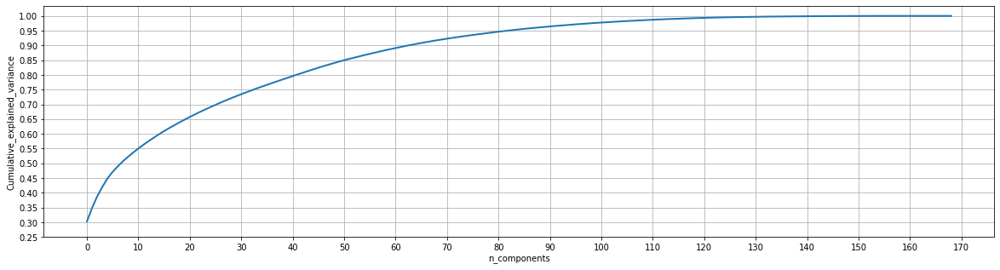

TruncatedSVD(n_components=169)

In [ ]:
truncated_svd(standard_train_mean_all_features_df,169)

**I choose 120 components to describe my data as 120 components explain atleast 99% variance of the total data.** 

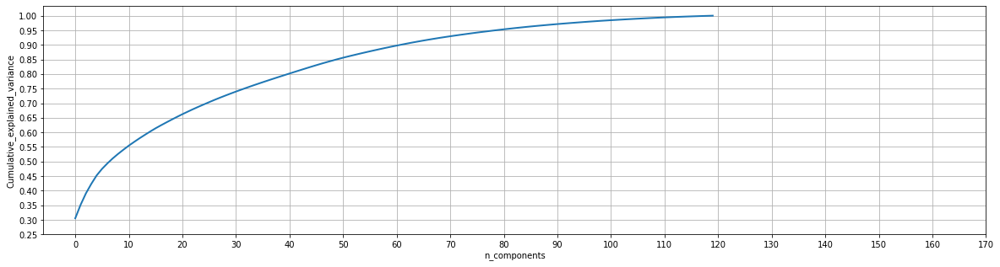

In [ ]:
svd=truncated_svd(standard_train_mean_all_features_df,120)

**For the 120 principal components using svd.explained_variance_ratio_ find the variance distribution.**

In [ ]:
print(len(svd.explained_variance_ratio_))

120


In [ ]:
np.sum(svd.explained_variance_ratio_)

0.9927956

In [ ]:
svd.components_.shape

(120, 170)

In [ ]:
#number of features 
svd.components_.shape[1]

170

In [ ]:
#number of components
svd.components_.shape[0]

120

**For the 120 principal components find the feature importance.**

In [ ]:
set_number_of_features=120

### Trying Forward Feature selection

**Here, in forward feature selection, out of 170 features even if I choose to select 10 features only , still it will take a lot of time.<br>
Therefore I go with recursive feature elimination.<br>
Using Recursive Feature Elimination, I can get the features that I need.**

In [ ]:
%%time
new_standard_train_mean_all_features_df=recursive_feature_elimination(
    standard_train_mean_all_features_df,
    y_train_mean_all_features,
    int(set_number_of_features+np.round((len(train.columns.values)-set_number_of_features)/2))
)

Rankings :  [1 1 1 1 4 3 6 1 1 1 1 3 1 1 2 1 1 1 3 1 1 1 1 1 1 1 1 5 1 1 1 1 6 6 5 5 6
 1 1 1 1 1 1 1 1 2 1 3 1 1 4 5 2 1 1 1 1 2 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 2 1 4 1 1 1 5 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 4 1 1]
Selected indices :
 1    145
6      5
5      5
4      5
3      5
2      5
dtype: int64
CPU times: user 10min 8s, sys: 739 ms, total: 10min 9s
Wall time: 5min 40s


In [ ]:
new_standard_train_mean_all_features_df.head()

,sensor1_measure,sensor2_measure,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin6,sensor7_histogram_bin7,...,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor106_measure,sensor107_measure
0,-0.209185,-0.006580,-0.457194,-0.009687,-0.028955,-0.058156,-0.116246,-0.181405,-0.096014,-0.206143,...,-0.168552,-0.105859,-0.027340,-0.047293,-0.129699,-0.201210,-0.170813,-0.204790,-0.022377,-0.026665
1,0.226385,-0.006580,2.302813,0.248253,-0.028955,-0.058156,-0.116246,-0.176652,0.525416,0.348220,...,0.091489,0.062918,0.130464,0.276836,0.571310,0.833472,-0.019739,-0.291961,-0.022377,-0.026665
2,-0.411601,-0.412396,-0.457193,-0.136908,-0.028955,-0.058156,-0.115271,-0.178125,-0.429397,-0.355893,...,-0.307381,-0.387281,-0.394410,-0.385187,-0.371703,-0.312882,-0.200571,-0.311196,-0.022377,-0.026665
3,0.027280,-0.006580,-0.457192,0.274966,-0.028955,-0.058156,-0.116246,-0.181822,0.314194,1.056835,...,0.208370,0.281677,0.339173,0.184218,0.039224,-0.038996,-0.116121,0.059584,-0.022377,-0.026665
4,-0.132515,-0.006580,-0.457193,0.002868,-0.028955,-0.058156,-0.116246,-0.181979,-0.048611,-0.000896,...,-0.133901,-0.194969,-0.201889,-0.165073,0.019550,-0.128345,-0.133798,0.373141,-0.022377,-0.026665


**Try spearman corelation coefficient to find out co relation. (It is good for cause and affect analysis but it might not be of much use when we find that our features are dependent on other features, we expect our features to be independent of each other.).**

In [ ]:
%%time
spearman=select_spearman(new_standard_train_mean_all_features_df,int(set_number_of_features+np.floor((len(train.columns.values)-set_number_of_features)/2)))

If I take the data having correlation between only -.1 and .1 range then I get  0  features.
If I take the data having correlation between only -.90 and .90 range then I get  60  features.
If I take the data having correlation between only -.95 and .95 range then I get  89  features.
If I take the data having correlation between only -.97 and .97 range then I get  103  features.
If I take the data having correlation between only -.98 and .98 range then I get  112  features.
If I take the data having correlation between only -.99 and .99 range then I get  127  features.
If I take the data having correlation between only -.999 and .999 range then I get  140  features.
CPU times: user 16.4 s, sys: 149 ms, total: 16.6 s
Wall time: 16.5 s


In [ ]:
new_standard_train_mean_all_features_df=perform_spearman(new_standard_train_mean_all_features_df,spearman,.99)

In [ ]:
new_standard_train_mean_all_features_df.head()

,sensor2_measure,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin9,...,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor106_measure,sensor107_measure
0,-0.006580,-0.457194,-0.009687,-0.028955,-0.058156,-0.116246,-0.181405,-0.096014,-0.206143,-0.029863,...,-0.168552,-0.105859,-0.027340,-0.047293,-0.129699,-0.201210,-0.170813,-0.204790,-0.022377,-0.026665
1,-0.006580,2.302813,0.248253,-0.028955,-0.058156,-0.116246,-0.176652,0.525416,0.348220,-0.029863,...,0.091489,0.062918,0.130464,0.276836,0.571310,0.833472,-0.019739,-0.291961,-0.022377,-0.026665
2,-0.412396,-0.457193,-0.136908,-0.028955,-0.058156,-0.115271,-0.178125,-0.429397,-0.355893,-0.029863,...,-0.307381,-0.387281,-0.394410,-0.385187,-0.371703,-0.312882,-0.200571,-0.311196,-0.022377,-0.026665
3,-0.006580,-0.457192,0.274966,-0.028955,-0.058156,-0.116246,-0.181822,0.314194,1.056835,0.058358,...,0.208370,0.281677,0.339173,0.184218,0.039224,-0.038996,-0.116121,0.059584,-0.022377,-0.026665
4,-0.006580,-0.457193,0.002868,-0.028955,-0.058156,-0.116246,-0.181979,-0.048611,-0.000896,-0.028737,...,-0.133901,-0.194969,-0.201889,-0.165073,0.019550,-0.128345,-0.133798,0.373141,-0.022377,-0.026665


In [ ]:
new_standard_train_mean_all_features_df.shape

(48000, 127)

In [ ]:
new_standard_test_mean_all_features_df=standard_test_mean_all_features_df[new_standard_train_mean_all_features_df.columns.values]
new_standard_test_mean_all_features_df.head()

,sensor2_measure,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin9,...,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor106_measure,sensor107_measure
0,-0.006580,-0.457194,-0.009687,-0.028955,-0.058156,-0.116246,-0.181828,0.289463,0.203554,-0.029863,...,-0.073858,0.056290,0.124189,0.097456,0.161601,0.278033,-0.007453,-0.211428,-0.022377,-0.026665
1,-0.006580,2.302813,0.107235,-0.028955,-0.058156,-0.116246,-0.181769,0.748384,0.365068,-0.029863,...,0.038111,0.137127,0.165973,0.195276,0.405028,0.752575,0.219348,1.811026,-0.022377,-0.026665
2,-0.412396,-0.457194,-0.143741,-0.028955,-0.058156,-0.116246,-0.182080,-0.428685,-0.355893,-0.029863,...,-0.308896,-0.388068,-0.394789,-0.385281,-0.371738,-0.312924,-0.200718,-0.311196,-0.022377,-0.026665
3,-0.412396,2.302813,-0.143120,-0.028955,-0.058156,-0.116246,-0.181894,-0.428458,-0.355866,-0.029863,...,-0.307932,-0.387537,-0.394539,-0.384626,-0.371290,-0.312838,-0.200718,-0.311196,-0.022377,0.204508
4,-0.006580,2.302813,0.013429,-0.028955,-0.058156,-0.116246,-0.181987,0.200492,0.262398,-0.029863,...,-0.123897,-0.105060,-0.049280,0.102990,0.242710,0.122969,-0.058405,0.331690,-0.022377,-0.026665


In [ ]:
#new_standard_train_mean_all_features_df.to_pickle("new_standard_train_mean_all_features_df.pickle")
#y_train_mean_all_features.to_pickle("y_train_mean_all_features.pickle")

#new_standard_test_mean_all_features_df.to_pickle("new_standard_test_mean_all_features_df.pickle")
#y_test_mean_all_features.to_pickle("y_test_mean_all_features.pickle")

In [11]:
#new_standard_train_mean_all_features_df=pd.read_pickle("/content/gdrive/My Drive/new_standard_train_mean_all_features_df.pickle")
#y_train_mean_all_features=pd.read_pickle("/content/gdrive/My Drive/y_train_mean_all_features.pickle")

#new_standard_test_mean_all_features_df=pd.read_pickle("/content/gdrive/My Drive/new_standard_test_mean_all_features_df.pickle")
#y_test_mean_all_features=pd.read_pickle("/content/gdrive/My Drive/y_test_mean_all_features.pickle")

In [ ]:
np.save('new_standard_train_mean_all_features_df_columns.npy',new_standard_train_mean_all_features_df.columns.values)

In [12]:
new_standard_train_mean_all_features_df["target"]=y_train_mean_all_features
new_standard_train_mean_all_features_df.head()

,sensor2_measure,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin9,sensor9_measure,sensor11_measure,sensor16_measure,sensor17_measure,sensor18_measure,sensor20_measure,sensor21_measure,sensor22_measure,sensor23_measure,sensor24_histogram_bin5,sensor24_histogram_bin6,sensor24_histogram_bin7,sensor24_histogram_bin8,sensor24_histogram_bin9,sensor25_histogram_bin0,sensor25_histogram_bin1,sensor25_histogram_bin2,sensor25_histogram_bin4,sensor25_histogram_bin6,sensor25_histogram_bin7,sensor26_histogram_bin1,sensor26_histogram_bin2,sensor26_histogram_bin3,sensor26_histogram_bin4,sensor26_histogram_bin6,sensor26_histogram_bin8,sensor26_histogram_bin9,sensor28_measure,sensor29_measure,sensor30_measure,...,sensor72_measure,sensor73_measure,sensor74_measure,sensor75_measure,sensor76_measure,sensor77_measure,sensor78_measure,sensor79_measure,sensor80_measure,sensor81_measure,sensor82_measure,sensor83_measure,sensor84_measure,sensor85_measure,sensor86_measure,sensor89_measure,sensor90_measure,sensor91_measure,sensor94_measure,sensor95_measure,sensor96_measure,sensor97_measure,sensor98_measure,sensor99_measure,sensor100_measure,sensor102_measure,sensor103_measure,sensor104_measure,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor106_measure,sensor107_measure,target
0,-0.006580,-0.457194,-0.009687,-0.028955,-0.058156,-0.116246,-0.181405,-0.096014,-0.206143,-0.029863,-0.056023,-0.004741,-0.249131,-0.269911,-0.100269,-0.040915,-0.014565,-0.180843,-0.263644,-0.028449,0.016774,-0.207314,-0.226237,-0.012153,-0.040377,-0.063598,-0.047413,-0.274703,-0.120019,-0.058989,-0.286605,-0.216814,-0.195887,-0.178970,-0.076619,-0.140570,-0.101622,-0.145208,-0.204887,-0.128656,...,-0.061821,-0.056576,-0.013028,-0.007635,0.000445,0.003640,-0.062421,-0.224303,-0.195523,-0.022332,-0.034245,-0.009120,-0.044142,0.000162,-0.004525,-0.246862,0.195956,-0.064515,-0.174814,-0.251450,-0.010218,-0.029240,-0.204683,-0.140994,-0.022167,-0.041493,-0.054650,-0.055453,-0.259975,-0.168552,-0.105859,-0.027340,-0.047293,-0.129699,-0.201210,-0.170813,-0.204790,-0.022377,-0.026665,0.0
1,-0.006580,2.302813,0.248253,-0.028955,-0.058156,-0.116246,-0.176652,0.525416,0.348220,-0.029863,-0.056023,-0.016470,0.312749,0.435490,-0.100269,-0.040915,-0.014565,-0.032916,0.987682,-0.083922,1.038971,-0.090444,0.076661,-0.012153,-0.037827,-0.064676,-0.040116,-0.354074,-0.083800,-0.059010,0.359807,0.224781,0.246241,0.220322,0.106445,-0.140570,-0.101622,-0.149038,-0.161735,-0.077554,...,0.866371,-0.164351,-0.039602,-0.014723,-0.043533,0.448717,0.779718,0.451371,0.598580,-0.030562,-0.043336,-0.012981,-0.108440,-0.009730,-0.030932,0.234457,1.285744,2.395571,0.250305,0.298777,0.597395,0.288168,-0.204683,-0.140994,-0.022167,0.233591,0.534694,0.591958,0.435911,0.091489,0.062918,0.130464,0.276836,0.571310,0.833472,-0.019739,-0.291961,-0.022377,-0.026665,0.0
2,-0.412396,-0.457193,-0.136908,-0.028955,-0.058156,-0.115271,-0.178125,-0.429397,-0.355893,-0.029863,-0.056023,-0.016470,-0.319492,-0.351049,-0.100269,-0.040915,-0.014565,-0.178362,-0.254039,-0.083922,-0.333361,-0.297451,-0.265976,-0.012153,-0.097620,-0.123965,-0.070507,-0.364828,-0.098955,-0.055752,-0.386042,-0.348345,-0.370801,-0.386026,-0.334854,-0.140570,-0.101622,-0.147601,-0.206614,-0.152307,...,-0.589929,-0.273277,-0.039602,-0.089862,-0.043533,-0.310237,-0.599993,-0.321937,-0.195523,-0.030562,-0.043336,-0.012898,-0.092888,-0.009730,-0.030932,-0.344199,-0.486225,-0.522928,-0.441281,-0.465792,-0.361598,-0.319177,-0.191471,-0.140651,-0.022167,-0.246410,-0.380672,-0.421884,-0.300505,-0.307381,-0.387281,-0.394410,-0.385187,-0.371703,-0.312882,-0.200571,-0.311196,-0.022377,-0.026665,0.0
3,-0.006580,-0.457192,0.274966,-0.028955,-0.

<h3>Compare the target 0 and target 1 mean values feature wise after mean value imputing</h3>

In [ ]:
column_list=[]
mean_list=[]
one_zero=[]
for column in list(new_standard_train_mean_all_features_df.columns.values):
    if column!="target":

        column_list.append(column)
        one_zero.append(0)
        mean_list.append(new_standard_train_mean_all_features_df[column][new_standard_train_mean_all_features_df.target==0].mean())

        column_list.append(column)
        one_zero.append(1)
        mean_list.append(new_standard_train_mean_all_features_df[column][new_standard_train_mean_all_features_df.target==1].mean())

**Find the features where the difference between the means of the two classes is more than .15<br>
descending sorted by class 1**

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:mean_list[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
counter=0
new_column_list=[]
new_mean_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_mean_list.append(mean_list[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_mean_list.append(mean_list[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 127 sensors.


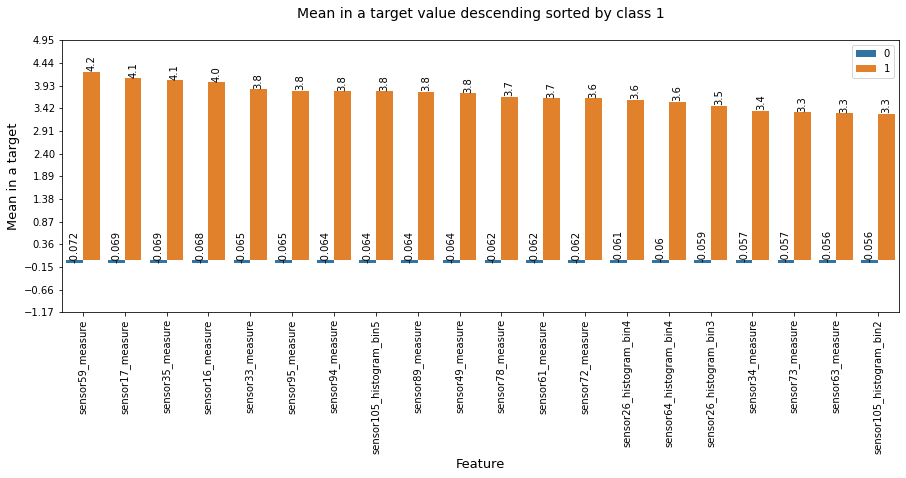

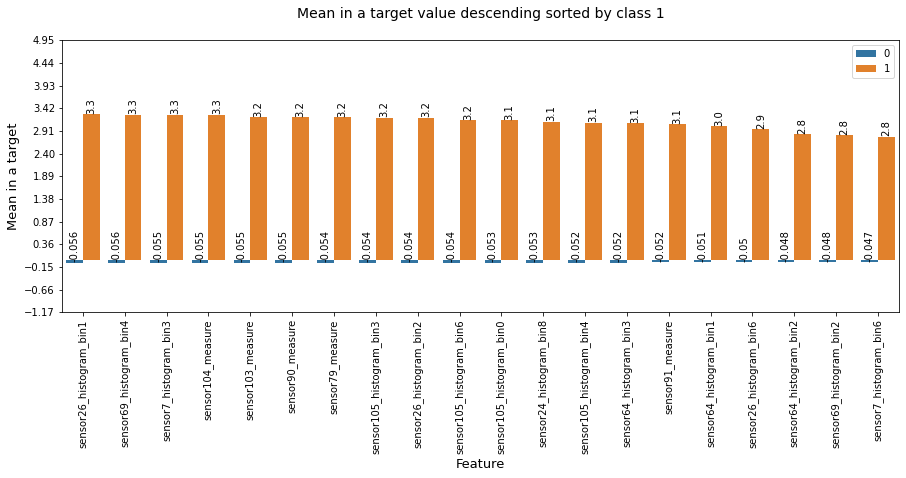

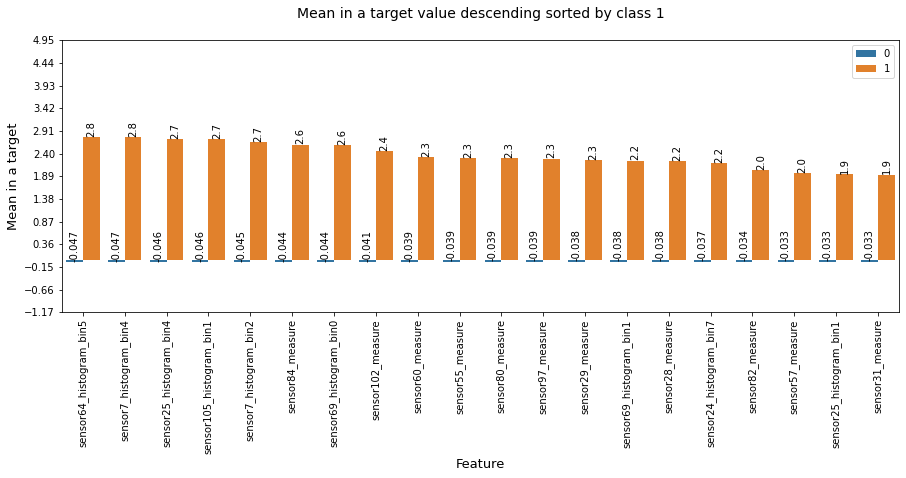

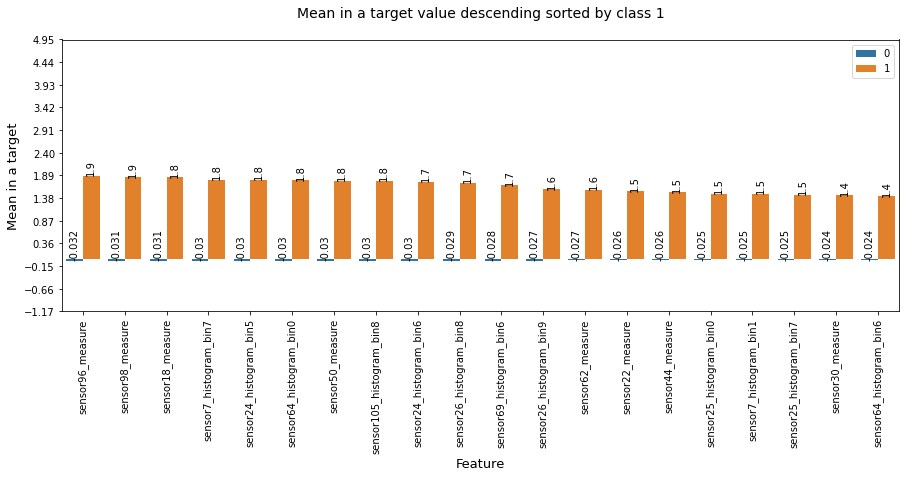

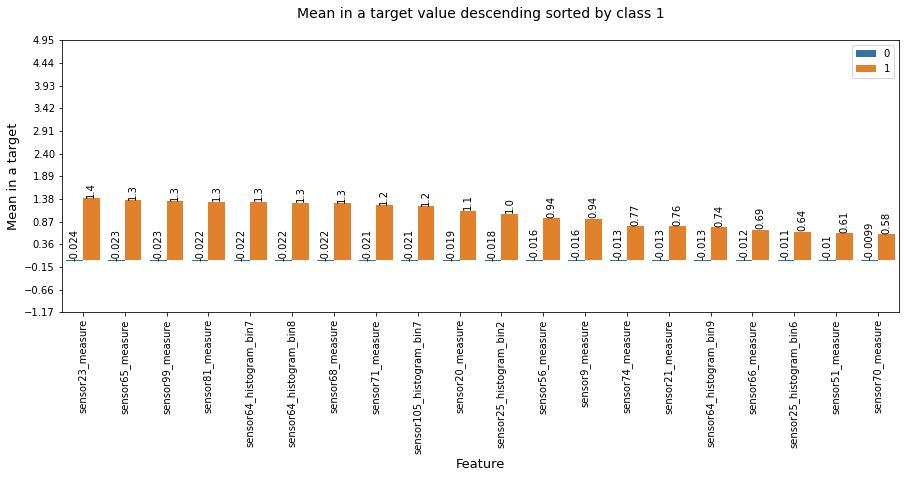

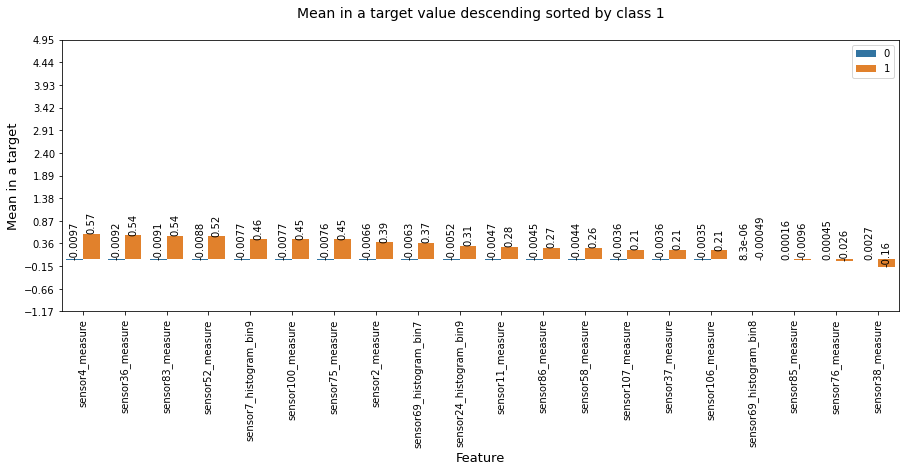

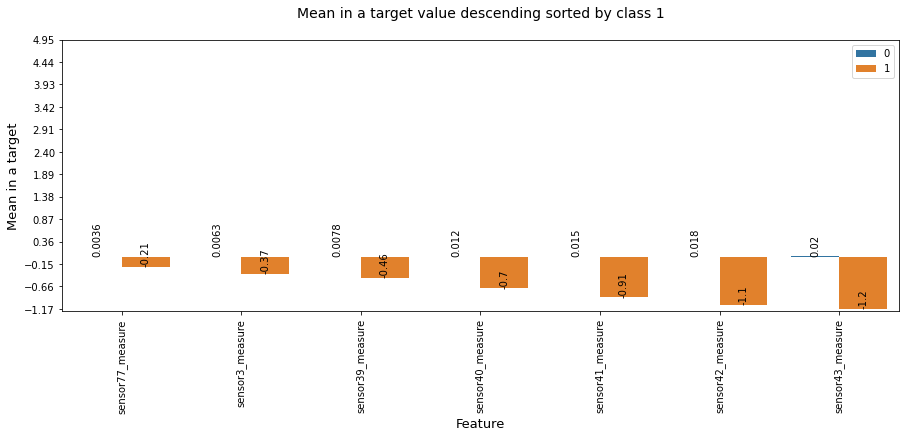

In [ ]:
try:
    plot_diagram(new_column_list,new_mean_list,new_one_zero,"Mean",1)
except ValueError:
    pass

**Observation** : Observe that there is a significant difference between the means of the surface failures and the means of the downhole failures.<br>
Out of the selected features observe that the most of the features have a larger mean value for the downhole failure rather than that of the surface failures 

In [ ]:
counter=0
mean_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    
    if (np.abs(np.abs(mean_list[i])-np.abs(mean_list[i-1]))>=.15):
        mean_higher_reading.append(mean_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        mean_higher_reading.append(mean_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])


        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between median readings of surface and downhole failures.".format(counter))

So we have approximate 124 sensor that show significant difference (> .15) between median readings of surface and downhole failures.


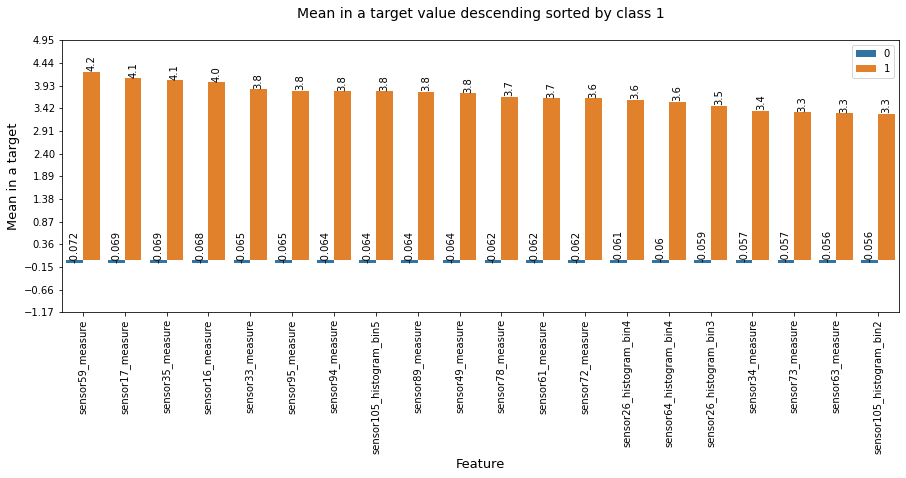

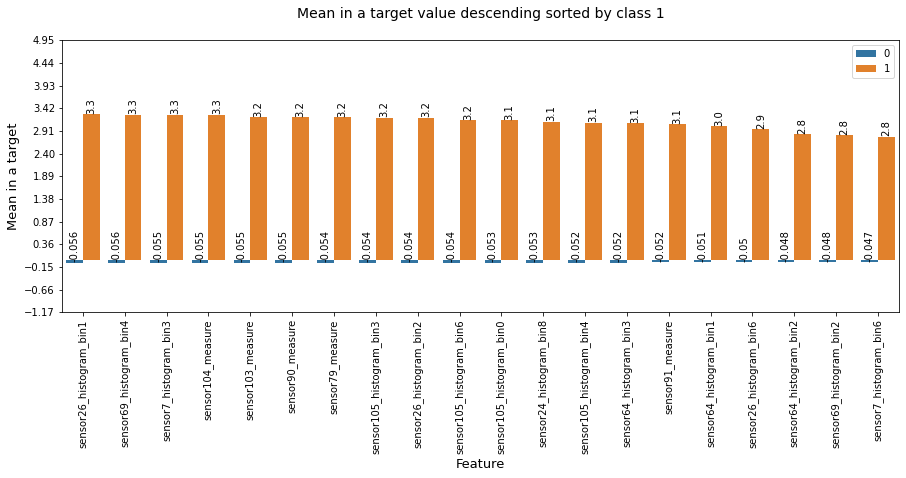

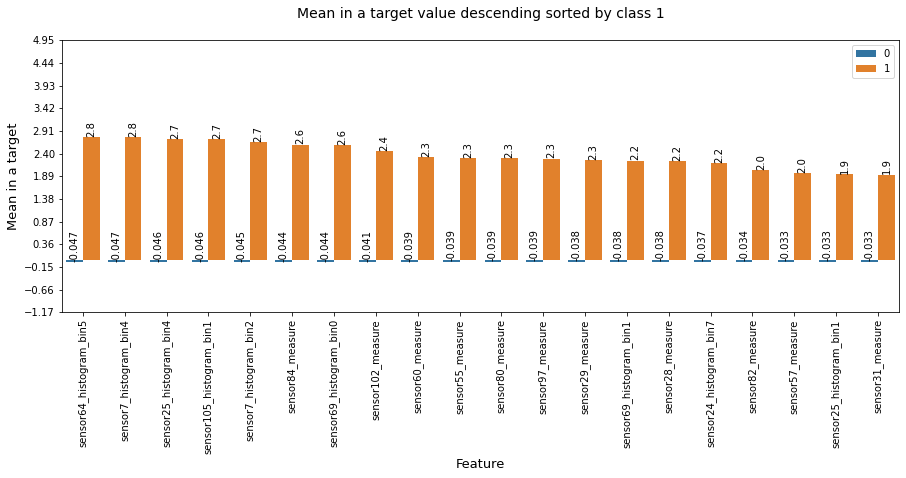

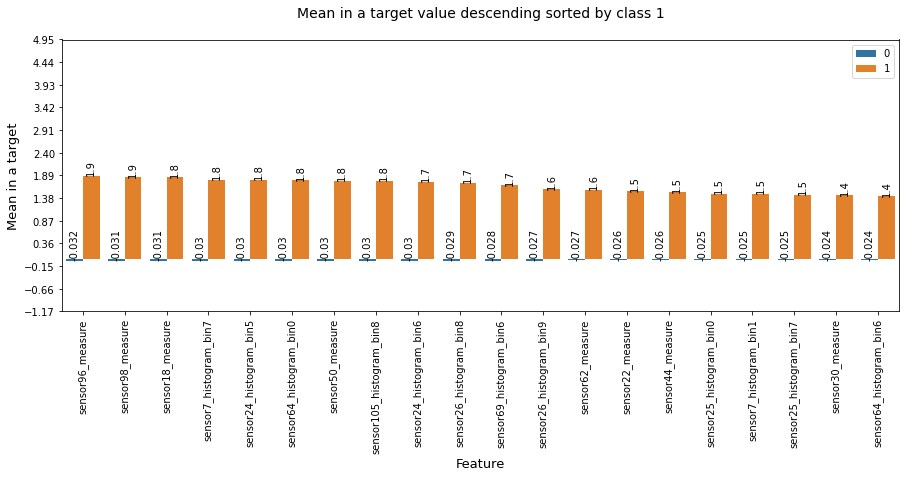

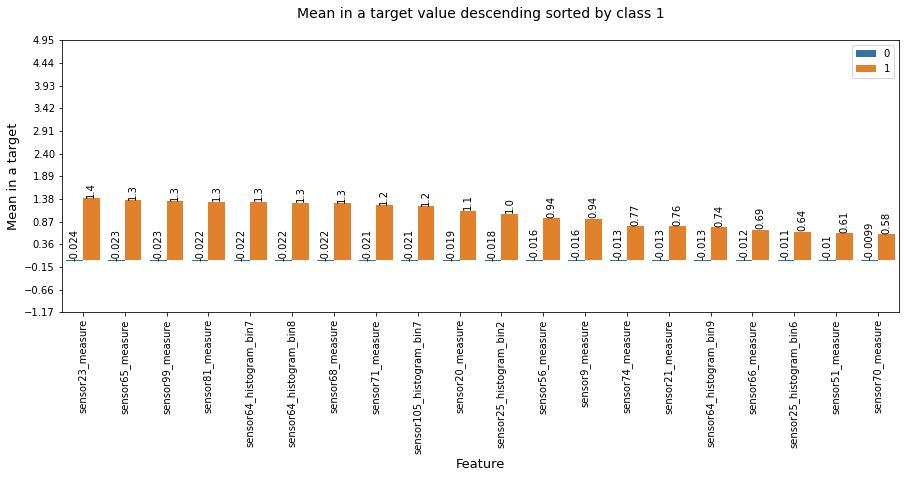

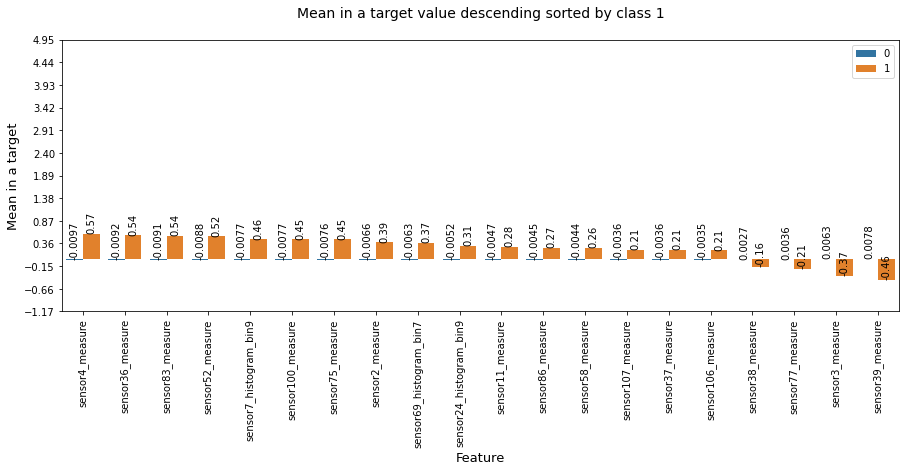

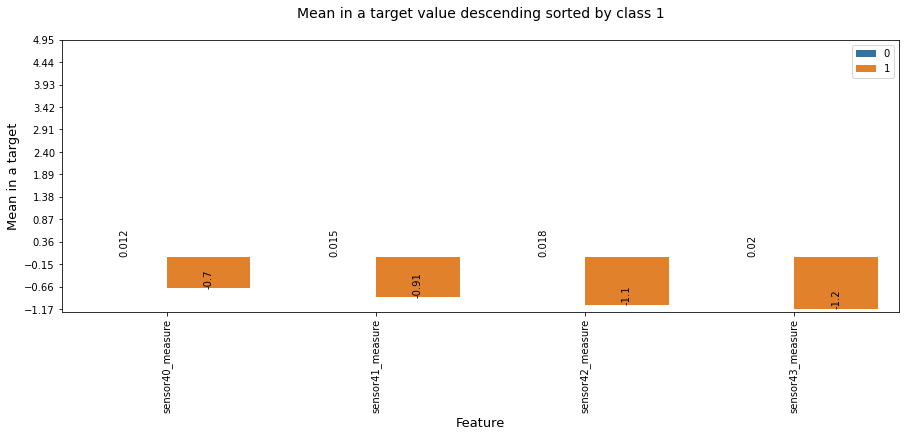

In [ ]:
try:
    plot_diagram(column_higher_reading,mean_higher_reading,one_zero_higher_reading,"Mean",1)
except ValueError:
    pass

**Observations regarding this**

In a descending order for the downhole failure, we can clearly see a difference between the means for the surface failures as well as the downhole failures.<br>
For example sensor 59,16,49 have the highest mean values.

<h3>Compare the target 0 and target 1 median values feature wise after mean value imputing</h3>

In [ ]:
column_list=[]
median_list=[]
one_zero=[]


for column in list(new_standard_train_mean_all_features_df.columns.values):
    if column!="target":

        column_list.append(column)
        one_zero.append(0)
        median_list.append(new_standard_train_mean_all_features_df[column][new_standard_train_mean_all_features_df.target==0].median())

        column_list.append(column)
        one_zero.append(1)
        median_list.append(new_standard_train_mean_all_features_df[column][new_standard_train_mean_all_features_df.target==1].median())

**Find the features where the difference between the medians of the two classes is more than .15<br>
descending sorted by class 1**

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:median_list[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
counter=0
new_column_list=[]
new_median_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_median_list.append(median_list[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_median_list.append(median_list[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 127 sensors.


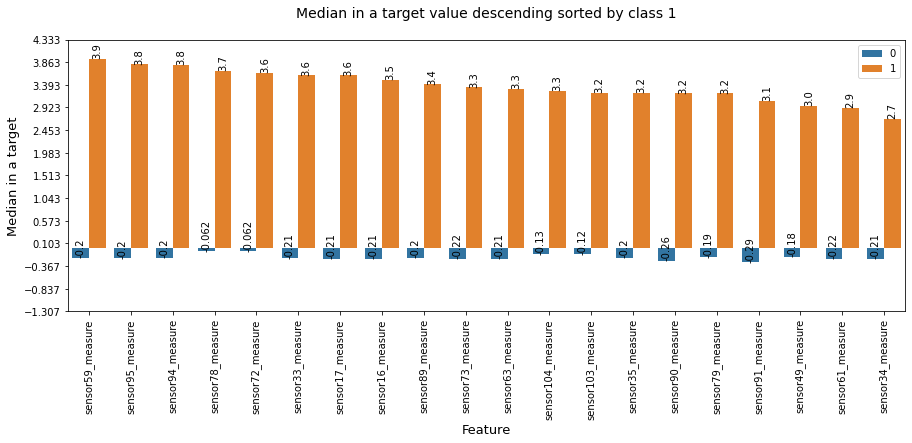

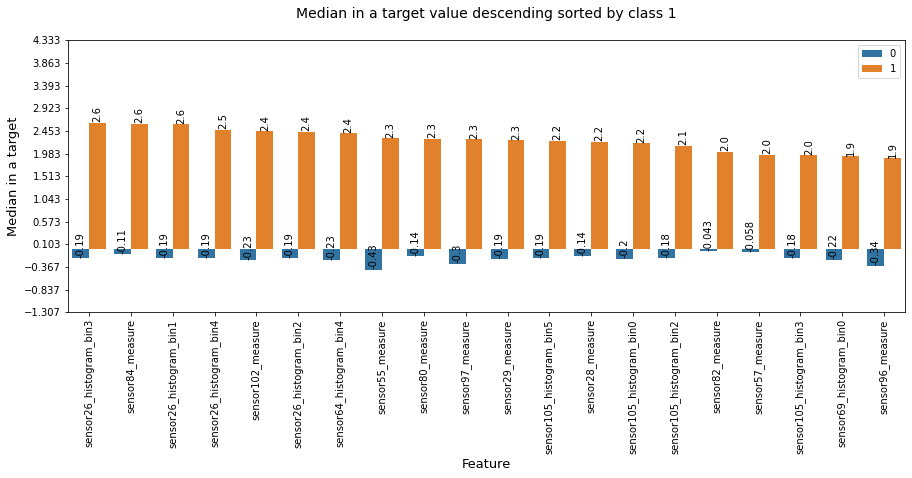

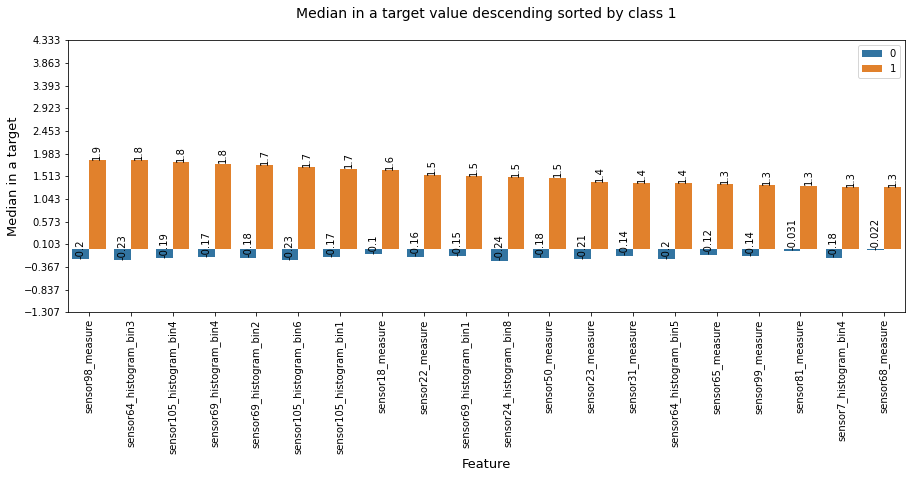

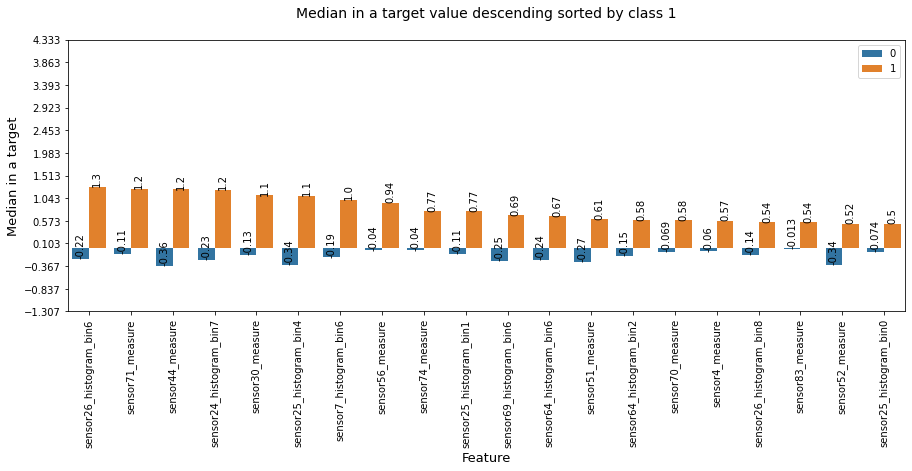

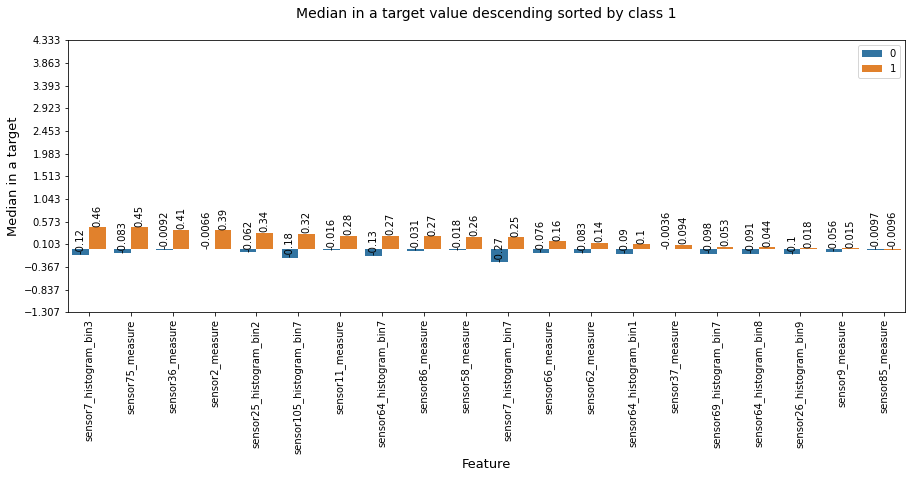

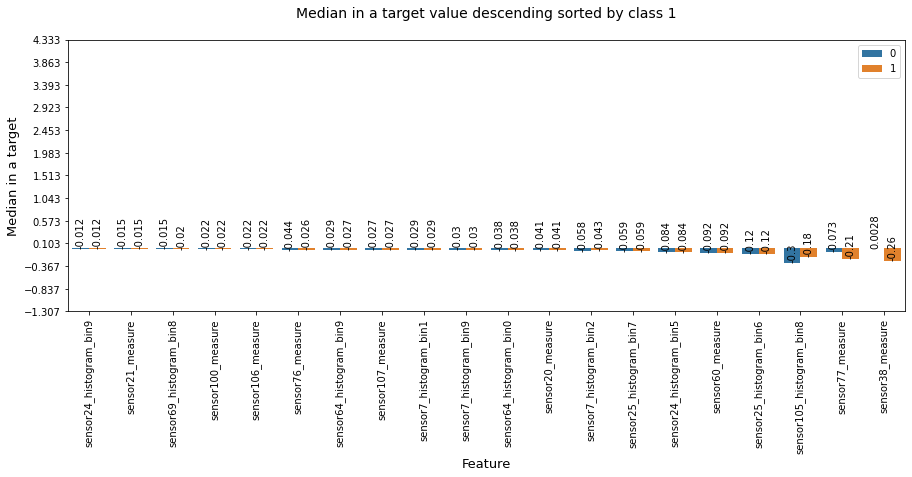

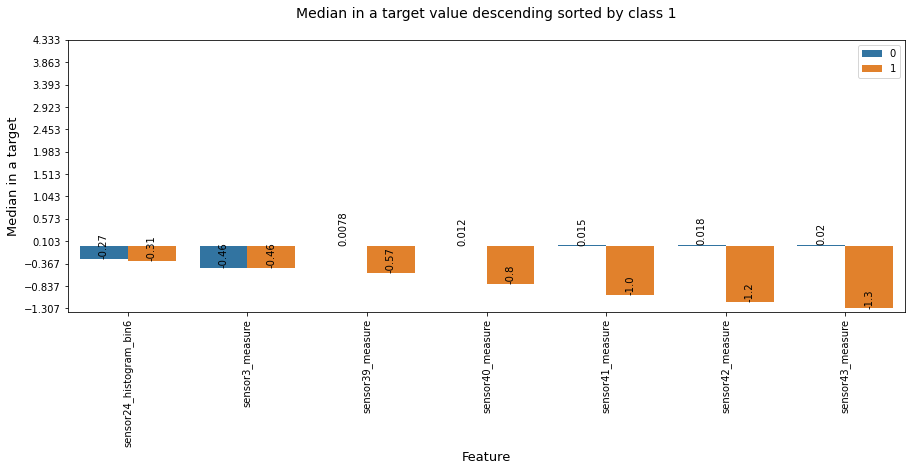

In [ ]:
try:
    plot_diagram(new_column_list,new_median_list,new_one_zero,"Median",1)
except ValueError:
    pass

**Median gives a more accurate measure of a mid value without begin affected by the outliers.** 

In [ ]:
counter=0
median_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    
    if (np.abs(np.abs(median_list[i])-np.abs(median_list[i-1]))>=.15):
        median_higher_reading.append(median_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        median_higher_reading.append(median_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])


        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between median readings of surface and downhole failures.".format(counter))

So we have approximate 94 sensor that show significant difference (> .15) between median readings of surface and downhole failures.


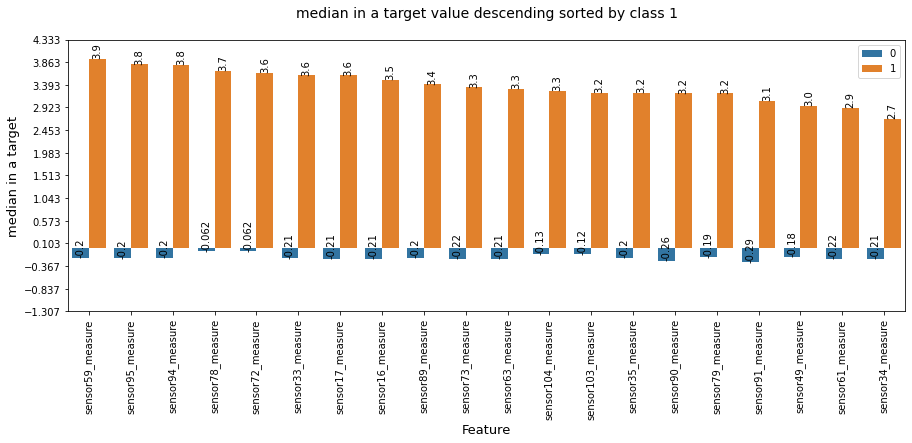

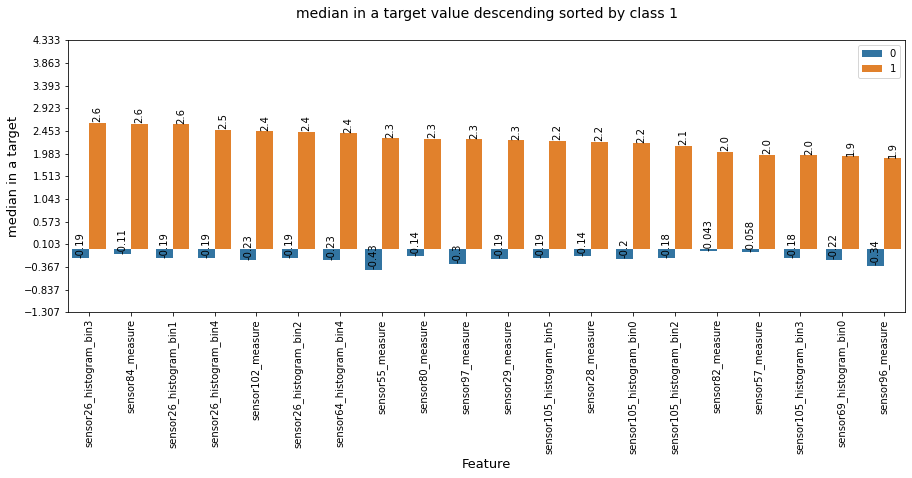

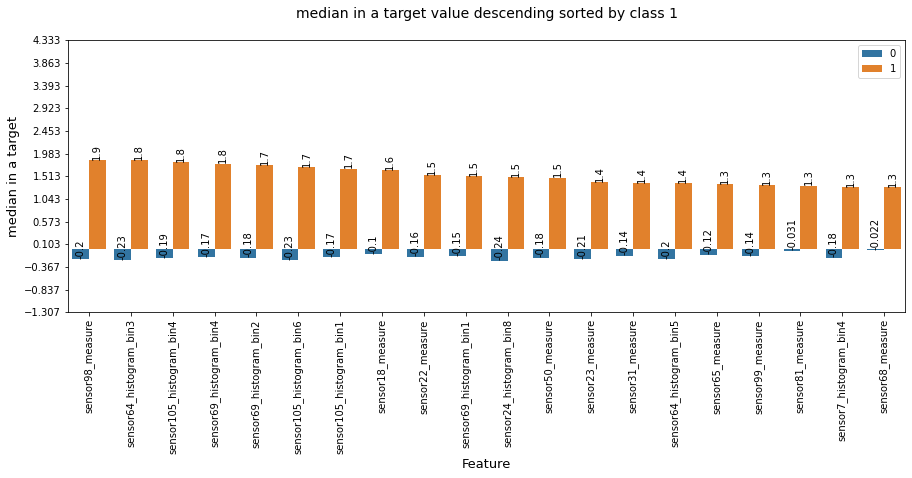

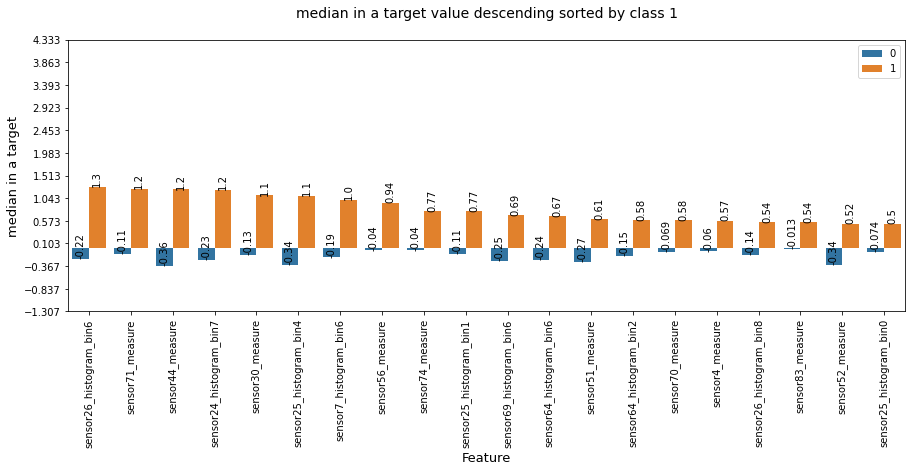

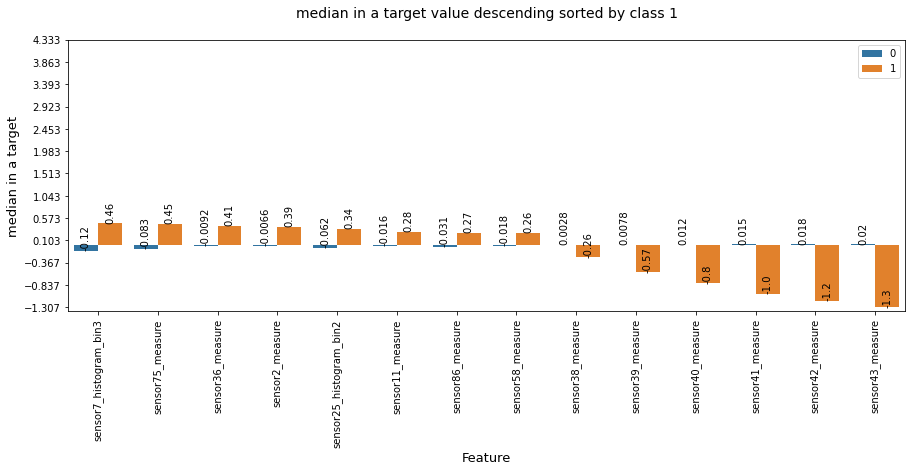

In [ ]:
try:
    plot_diagram(column_higher_reading,median_higher_reading,one_zero_higher_reading,"median",1)
except ValueError:
    pass

**Observations regarding this**

1) After taking the medians of the given mean imputed values we find those features that have a particular difference in their values.<br>
2) All the values which were missing , we filled them with the mean values.

### Basic Classifier

In [ ]:
new_standard_train_mean_all_features_df.drop("target",axis=1,inplace=True)

In [ ]:
print(dummy_classifier_based_on_median(new_standard_train_mean_all_features_df.loc[43],
                                       column_list,
                                       median_list))

Predicted surface failure.
[120, 7]


In [ ]:
print(dummy_classifier_based_on_median(new_standard_test_mean_all_features_df.loc[10974],
                                       column_list,
                                       median_list))

Predicted surface failure.
[114, 13]


In [ ]:
new_standard_train_mean_all_features_df["target"]=y_train_mean_all_features

### EDA for the dataset

**Using histograms, plots find out the nature of means for features for both the classes and thereby, the outliers.**

In [ ]:
mean_0=[]
mean_1=[]
for column in list(new_standard_train_mean_all_features_df.columns.values):
    if column!="target":
        mean_0.append(new_standard_train_mean_all_features_df[new_standard_train_mean_all_features_df.target==0][column].mean())
        mean_1.append(new_standard_train_mean_all_features_df[new_standard_train_mean_all_features_df.target==1][column].mean())

In [ ]:
median_0=[]
median_1=[]
for column in list(new_standard_train_mean_all_features_df.columns.values): 
    if column!="target":
        median_0.append(new_standard_train_mean_all_features_df[new_standard_train_mean_all_features_df.target==0][column].median())
        median_1.append(new_standard_train_mean_all_features_df[new_standard_train_mean_all_features_df.target==1][column].median())

**10) Try and plot it’s histogram for both the target values.**

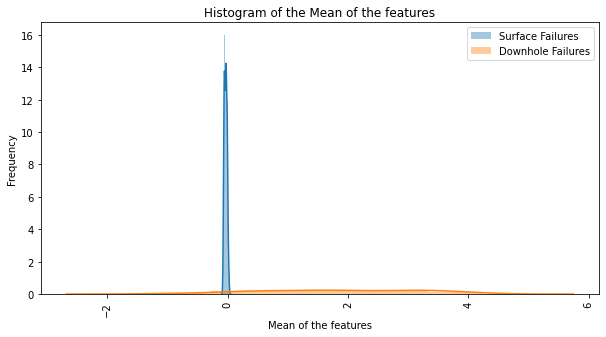

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(mean_0, hist=True, label="Surface Failures")
sns.distplot(mean_1, hist=True, label="Downhole Failures")
plt.title('Histogram of the Mean of the features')
plt.ylabel('Frequency')
plt.xlabel('Mean of the features')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
Here for the surface and downhole failures, we can see that the different downhole features have more variance.
Whereas the majority of the surface related features have a very similar value.

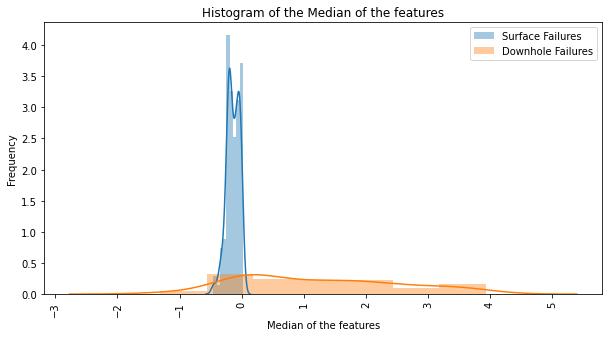

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(median_0, hist=True, label="Surface Failures")
sns.distplot(median_1, hist=True, label="Downhole Failures")
plt.title('Histogram of the Median of the features')
plt.ylabel('Frequency')
plt.xlabel('Median of the features')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
In the histogram of the median values, the extreme values have been reduced to a limit but the main difference is still there, the variance of the downhole failures, more density of feature values near the 0 point for surface points.

**11) Try box plot / voilin plot to visualize the outliers.**

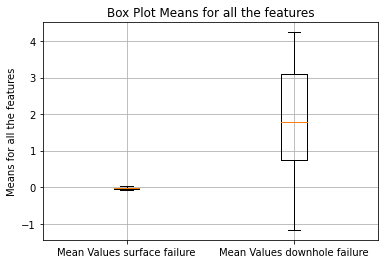

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([mean_0, mean_1])
plt.title('Box Plot Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

**Observations :**<br>
**The majority of the values for the surface failures lie near 0 whereas for the downhole failures, we can see all kinds of variation.**

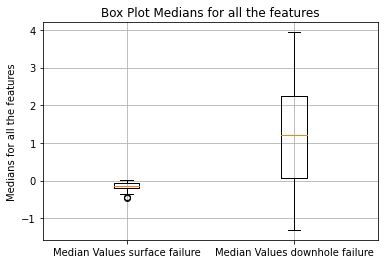

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([median_0, median_1])
plt.title('Box Plot Medians for all the features')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the features')
plt.grid()
plt.show()

**Observations :**<br>
**The majority of the values for the surface failures lie near 0 whereas for the downhole failures, we can see all kinds of variation.**

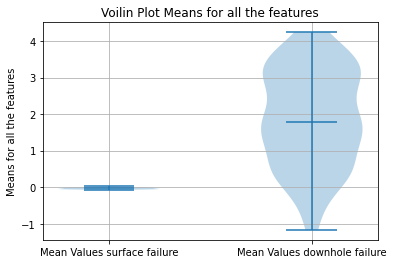

In [ ]:
plt.violinplot([mean_0, mean_1], showmeans=False, showmedians=True)
plt.title('Voilin Plot Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

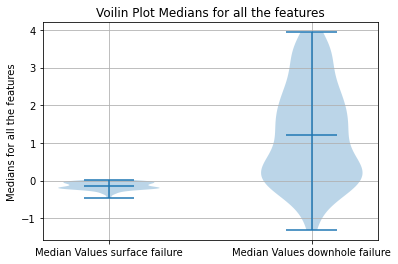

In [ ]:
plt.violinplot([median_0, median_1], showmeans=False, showmedians=True)
plt.title('Voilin Plot Medians for all the features')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the features')
plt.grid()
plt.show()

**PCA**

In [ ]:
y_train_mean_all_features=new_standard_train_mean_all_features_df.pop("target")

[[  0.60330766   2.9658337    0.        ]
 [ -2.3501174    1.39494      0.        ]
 [  2.7811787   -0.34686267   0.        ]
 ...
 [-45.243263   -16.67623      1.        ]
 [ -6.3054156    1.2603309    1.        ]
 [-60.90258     19.436491     1.        ]]


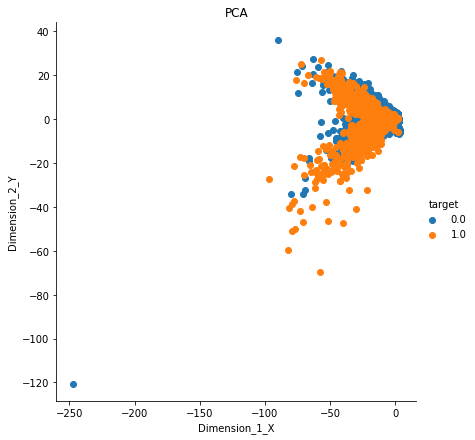

CPU times: user 2.11 s, sys: 971 ms, total: 3.08 s
Wall time: 6.55 s


In [14]:
%%time
run_pca(new_standard_train_mean_all_features_df,y_train_mean_all_features)

**tsne**

**Do not put these values in a loop as we do not get all the output graphs**

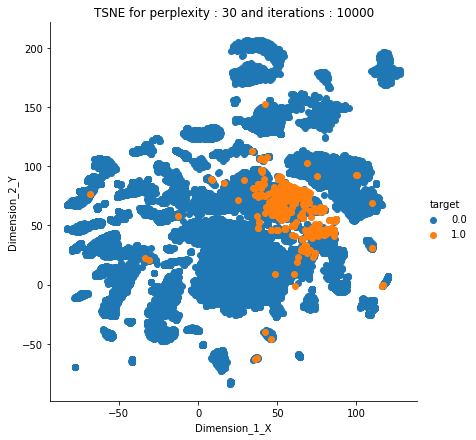

CPU times: user 13 s, sys: 11.7 s, total: 24.7 s
Wall time: 24.6 s


In [ ]:
%%time
run_tsne(new_standard_train_new_mean_all_features_df,y_train_mean_all_features,30,10000)

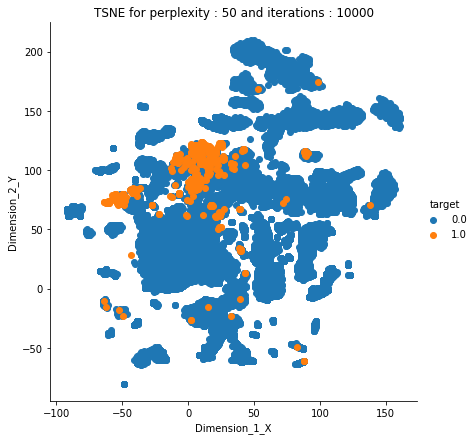

CPU times: user 13.1 s, sys: 11.5 s, total: 24.7 s
Wall time: 24.5 s


In [ ]:
%%time
run_tsne(new_standard_train_new_mean_all_features_df,y_train_mean_all_features,50,10000)

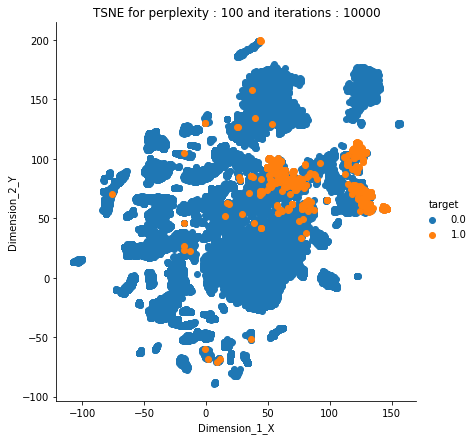

CPU times: user 12.8 s, sys: 11.4 s, total: 24.2 s
Wall time: 24 s


In [ ]:
%%time
run_tsne(new_standard_train_new_mean_all_features_df,y_train_mean_all_features,100,10000)

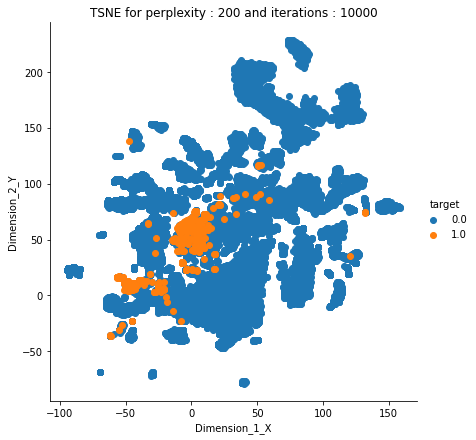

CPU times: user 12.6 s, sys: 11.4 s, total: 24 s
Wall time: 23.9 s


In [ ]:
%%time
run_tsne(new_standard_train_new_mean_all_features_df,y_train_mean_all_features,200,10000)

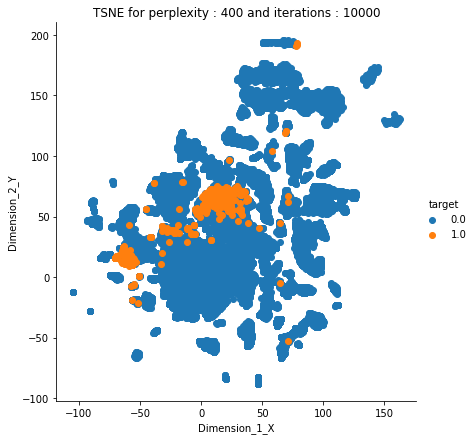

CPU times: user 13 s, sys: 11.2 s, total: 24.2 s
Wall time: 24.1 s


In [ ]:
%%time
run_tsne(new_standard_train_new_mean_all_features_df,y_train_mean_all_features,400,10000)

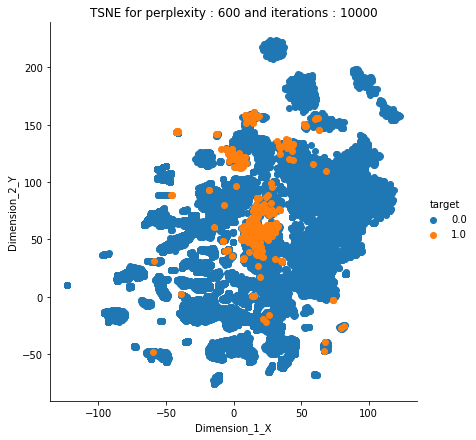

CPU times: user 13.1 s, sys: 11.7 s, total: 24.8 s
Wall time: 24.7 s


In [ ]:
%%time
run_tsne(new_standard_train_new_mean_all_features_df,y_train_mean_all_features,600,10000)

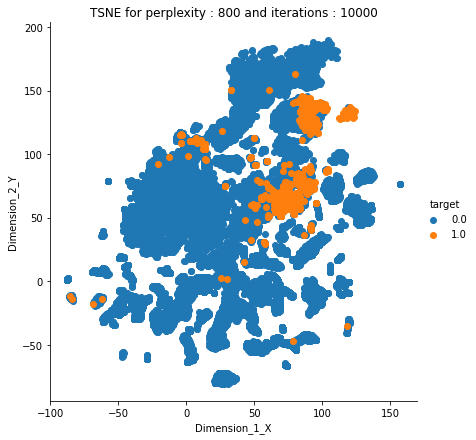

CPU times: user 12.9 s, sys: 11.3 s, total: 24.3 s
Wall time: 24.1 s


In [ ]:
%%time
run_tsne(new_standard_train_new_mean_all_features_df,y_train_mean_all_features,800,10000)

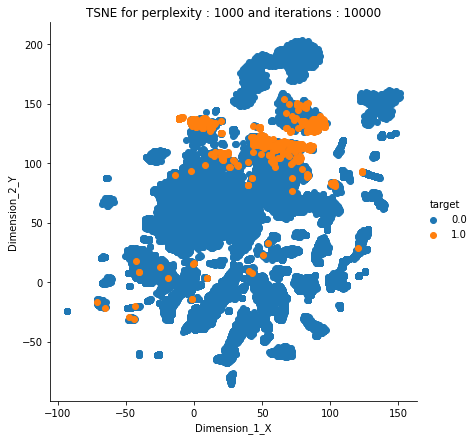

CPU times: user 12.8 s, sys: 11.4 s, total: 24.2 s
Wall time: 24 s


In [ ]:
%%time
run_tsne(new_standard_train_new_mean_all_features_df,y_train_mean_all_features,1000,10000)

**Observation :**<br>
1) Observe that different perplexities tSNE is able to differentiate all the data points into different groups, but it is not able to differentiate properly the surface failures from the downhole failures. If the surface and downhole failures are coming under the same category then they are shown in the same cluster.<br>
2) Not all the the surface and downhole features are coming under the same category.

### Perform a similar EDA on the outliers.

#### Here we take the outliers from the features that have been selected.
#### For each sensor we find the outliers that also classwise.
#### The issue is that there maybe high outliers here , but there maybe lower outliers here as well.

https://www.geeksforgeeks.org/interquartile-range-and-quartile-deviation-using-numpy-and-scipy/<br>
**Higher outlier = more than 1.5 ⋅ IQR above the third quartile.**<br>
**Lower outlier = less than 1.5 . IQR below the first quartile.**<br>
**The IQR is the difference between Q3 and Q1.**

In [ ]:
new_standard_train_mean_all_features_df["target"]=y_train_mean_all_features

In [ ]:
counter=0
main_dictionary=dict()
outliers=[]
list_of_outliers_features_classes=[]
for i in range(len(column_list)):
    d=dict()
    new_list=new_standard_train_mean_all_features_df[new_standard_train_mean_all_features_df.target==one_zero[i]]\
    [column_list[i]]      
    new_index=list(new_list.reset_index()["index"])
    QR1=np.percentile(new_list, 25)
    QR3=np.percentile(new_list, 75)
    IQR=QR3-QR1
    for index,value in zip(new_index,new_list):    
        if (value>(QR3+(IQR*1.5))) or (value<(QR1-(IQR*1.5))):
            counter=counter+1
            d.update({index:value})
            if index not in main_dictionary:
                main_dictionary.update({index:list(new_standard_train_mean_all_features_df.loc[index])})
    list_of_outliers_features_classes.append(d)
    del d
    outliers.append(counter)
    counter=0

In [ ]:
print("Total number of data points that are outliers in atleast one or more than one feature : ",len(np.unique(list(main_dictionary.keys()))))

Total number of data points that are outliers in atleast one or more than one feature :  45060


In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:outliers[i] for i in index}

d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])
    
counter=0
new_column_list=[]
new_outliers_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_outliers_list.append(outliers[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_outliers_list.append(outliers[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 127 sensors.


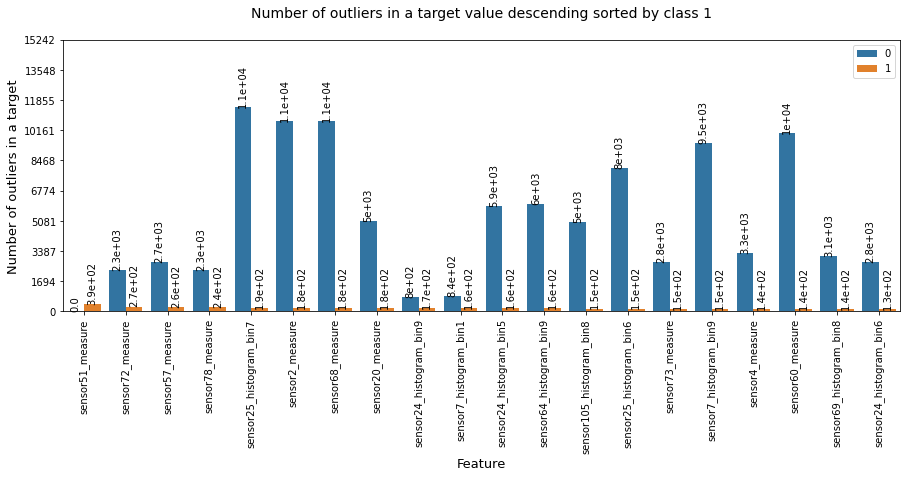

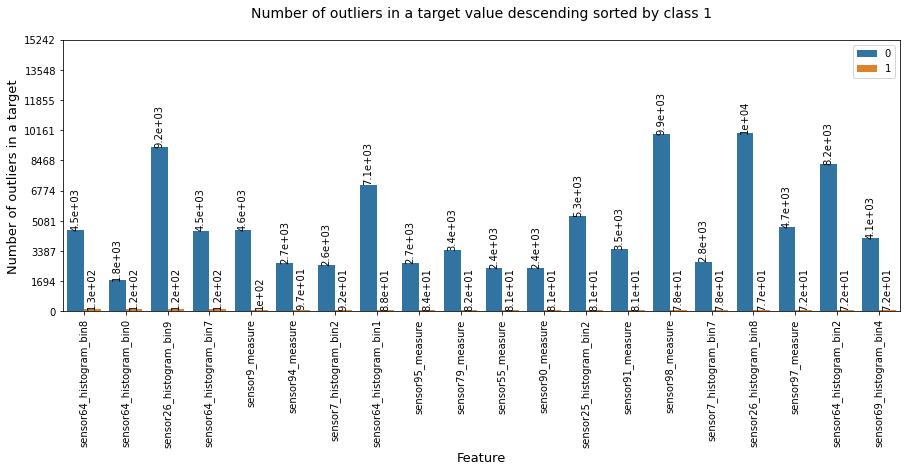

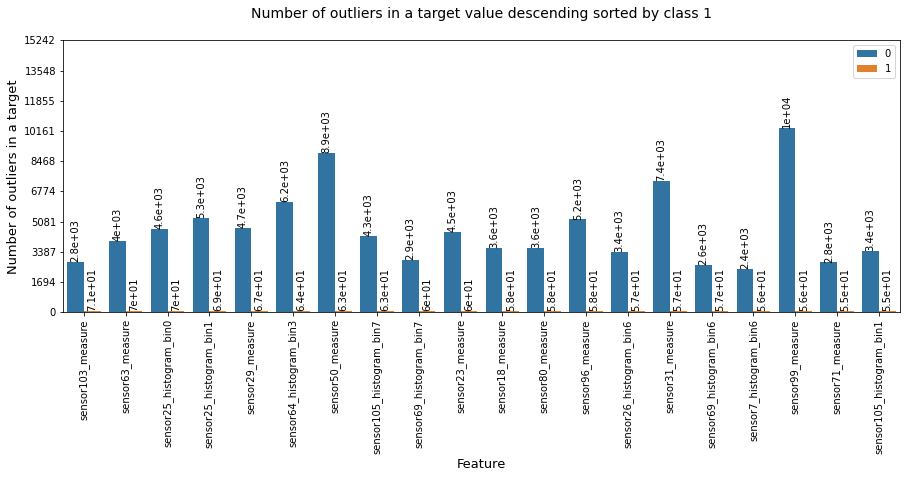

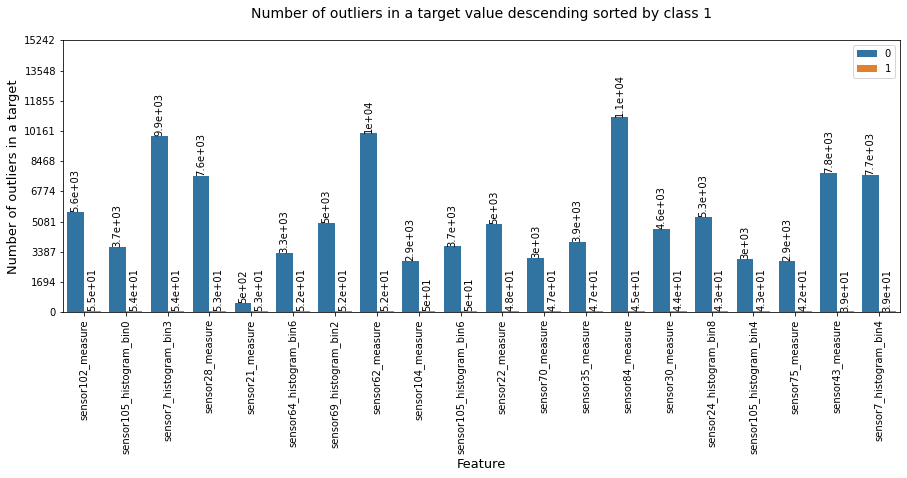

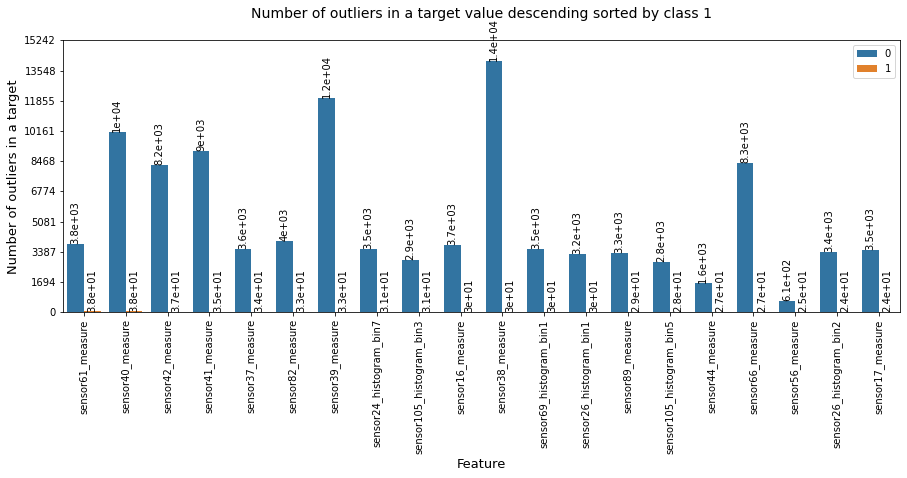

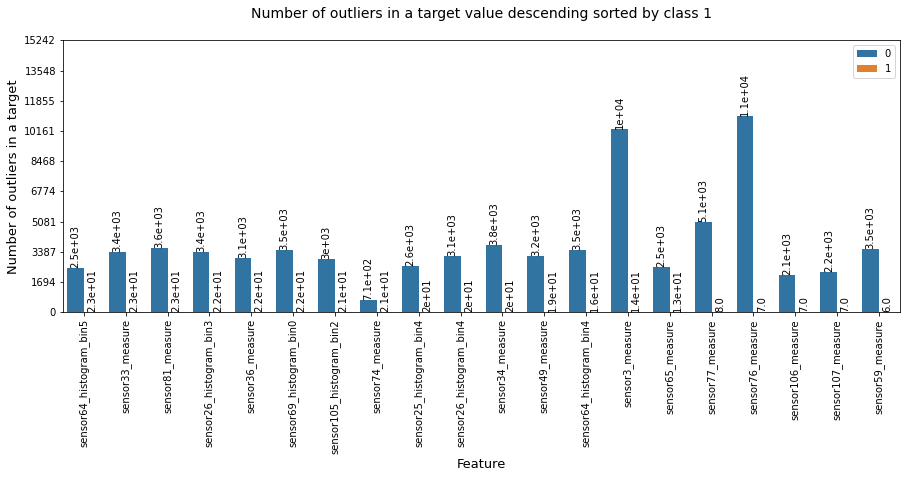

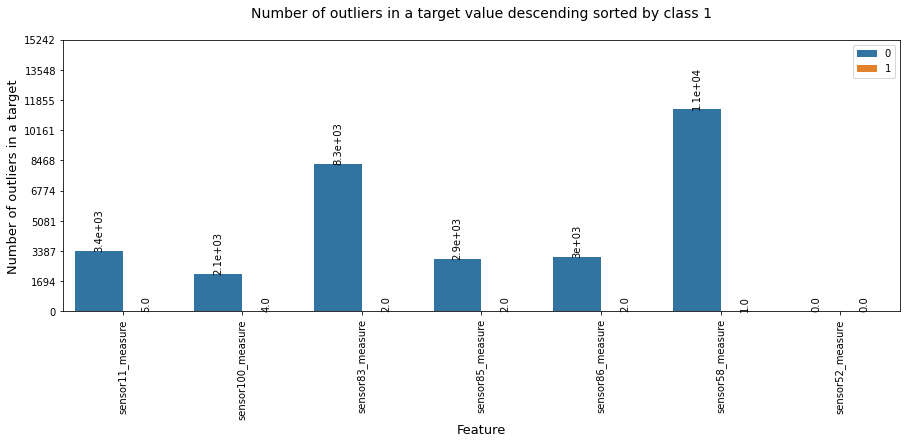

In [ ]:
try:
    plot_diagram(new_column_list,new_outliers_list,new_one_zero,"Number of outliers",1)
except ValueError:
    pass

**Observation :**<br>
Number of outliers for surface failures seem to be much more than the number of outliers for the downhole failures.Why ? Because the outliers we have considered for surface failures are of a low value.

### For every column feature, get the mean for the outliers for both class 0 and class 1.

In [ ]:
mean_0=[]
mean_1=[]
for i in range(0,len(list_of_outliers_features_classes),2):
    class_0=[ele for ele in list_of_outliers_features_classes[i].values()]
    class_1=[ele for ele in list_of_outliers_features_classes[i+1].values()]
    if (len(class_0)==0) :
        mean_0.append(0.01)
    else :
        mean_0.append(np.mean(class_0))

    if (len(class_1)==0):
        mean_1.append(0.01)
    else :
        mean_1.append(np.mean(class_1))

In [ ]:
median_0=[]
median_1=[]
for i in range(0,len(list_of_outliers_features_classes),2):
    class_0=[ele for ele in list_of_outliers_features_classes[i].values()]
    class_1=[ele for ele in list_of_outliers_features_classes[i+1].values()]
    if (len(class_0)==0) :
        median_0.append(0.01)
    else :
        median_0.append(np.median(class_0))

    if (len(class_1)==0):
        median_1.append(0.01)
    else :
        median_1.append(np.median(class_1))

### Plotting the mean and median for each feature class wise.

**10) Try and plot it’s histogram for both the target values.**

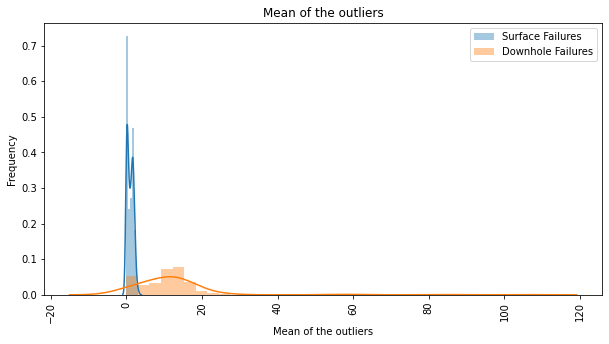

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(mean_0, hist=True, label="Surface Failures")
sns.distplot(mean_1, hist=True, label="Downhole Failures")
plt.title('Mean of the outliers')
plt.ylabel('Frequency')
plt.xlabel('Mean of the outliers')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
The outliers have a similar behaviour to the main features,<br>
The outliers for the surface failures are concentrated around the near 0 value.<br>
The outliers for downhole failures have more variance and not concentrated towards one value.

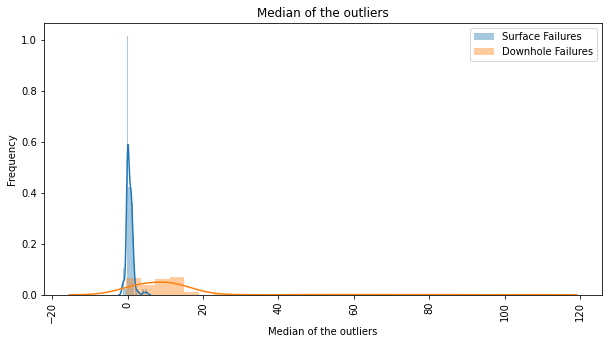

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(median_0, hist=True, label="Surface Failures")
sns.distplot(median_1, hist=True, label="Downhole Failures")
plt.title('Median of the outliers')
plt.ylabel('Frequency')
plt.xlabel('Median of the outliers')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
The median outliers for the surface failures are concentrated around the near 0 value.<br>
The median outliers for downhole failures have more variance and not concentrated towards one value.<br>
Similar behaviour can be seen in the box plots and voilin plots.

**11) Try box plot / voilin plot to visualize the outliers.**

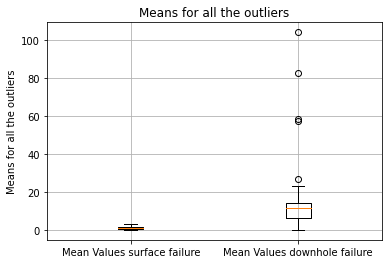

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([mean_0, mean_1])
plt.title('Means for all the outliers')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the outliers')
plt.grid()
plt.show()

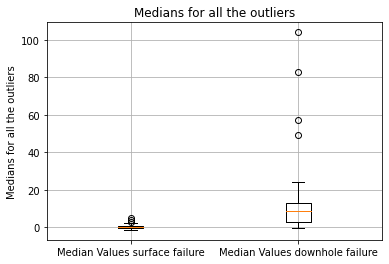

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([median_0, median_1])
plt.title('Medians for all the outliers')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the outliers')
plt.grid()
plt.show()

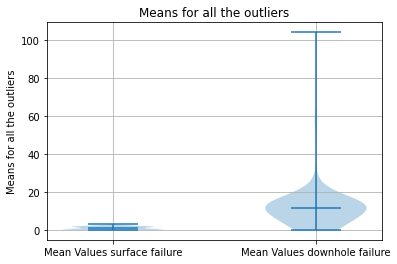

In [ ]:
plt.violinplot([mean_0, mean_1], showmeans=False, showmedians=True)
plt.title('Means for all the outliers')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the outliers')
plt.grid()
plt.show()

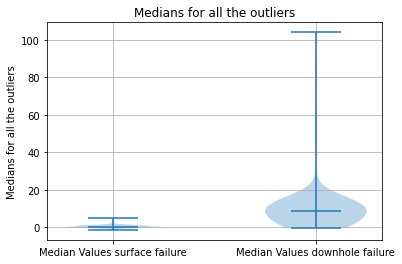

In [ ]:
plt.violinplot([median_0, median_1], showmeans=False, showmedians=True)
plt.title('Medians for all the outliers')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the outliers')
plt.grid()
plt.show()

### For the given data points and features enter new features that tell if these values were previously np.NaN or not.

In [ ]:
new_standard_train_mean_all_features_df.drop("target",axis=1,inplace=True)

In [ ]:
nan_standard_train_mean_all_features_df=fuse_dataframe_nan(new_standard_train_mean_all_features_df,nan_or_not,set(new_column_list))
nan_standard_train_mean_all_features_df["target"]=y_train_mean_all_features
nan_standard_train_mean_all_features_df.head()

,sensor7_histogram_bin2,sensor17_measure,sensor105_histogram_bin3,sensor69_histogram_bin7,sensor64_histogram_bin2,sensor107_measure,sensor40_measure,sensor26_histogram_bin6,sensor73_measure,sensor78_measure,...,sensor39_measure,sensor105_histogram_bin1,sensor26_histogram_bin8,sensor70_measure,sensor61_measure,sensor4_measure,sensor26_histogram_bin9,sensor75_measure,sensor9_measure,target
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Now this is the problem out of the given data that we have , we select the features that have more than 50% np.NaNs

In [ ]:
counter=0
for column in new_standard_train_mean_all_features_df.columns.values:
    try:
        percent_of_nan=nan_standard_train_mean_all_features_df[column].value_counts()[1]/\
                (nan_standard_train_mean_all_features_df[column].value_counts()[0]+\
                 nan_standard_train_mean_all_features_df[column].value_counts()[1])
        if (percent_of_nan>.5) :
            counter=counter+1
            print(column,"  :  ",percent_of_nan)
    except:
        pass
print("Overall : ",counter," features with % of na's more than 50%")

sensor2_measure   :   0.7740833333333333
sensor38_measure   :   0.6605416666666667
sensor39_measure   :   0.7348958333333333
sensor40_measure   :   0.77375
sensor41_measure   :   0.7967916666666667
sensor42_measure   :   0.8133125
sensor43_measure   :   0.822
sensor68_measure   :   0.7740833333333333
Overall :  8  features with % of na's more than 50%


<h3>3) Impute np.NaN with imputing median values with all features.</h3>

In [7]:
data_type="median_impute_data"

**Now I am using all the features to check if PCA and tSNE can visualise the 2 failures separately.**

In [ ]:
train_median_all_features=train.copy()
y_train_median_all_features=y_train.copy()
test_median_all_features=test.copy()
y_test_median_all_features=y_test.copy()

In [ ]:
train_median_all_features.shape

(48000, 170)

In [ ]:
y_train_median_all_features.shape

(48000,)

In [ ]:
test_median_all_features.shape

(12000, 170)

In [ ]:
y_test_median_all_features.shape

(12000,)

In [ ]:
for i ,j in zip(train_median_all_features.columns.values,test_median_all_features.columns.values):
    if (i!=j):
        print(i," : ",j)

In [ ]:
train_median_all_features,y_train_median_all_features=reset_index(train_median_all_features,y_train_median_all_features)
test_median_all_features,y_test_median_all_features=reset_index(test_median_all_features,y_test_median_all_features)

**Filling the np.NaN values with the median of the category this time.**

In [ ]:
l=[]
for ele in train_median_all_features["sensor4_measure"]:
    if np.isnan(ele):
        pass
    else:
        l.append(ele) 
np.median(l)

126.0

In [ ]:
train_median_all_features["sensor4_measure"].median()

126.0

Both are the same so the pandas.series.median() function ignores the value that has the np.NaN and does not even count it.<br>
Divide the whole dataframe into the number of categories that we have and then only enter the median for that feature for that particular category.

In [19]:
def impute_median_for_train_n_test_as_per_train(train_dataframe,train_target,
                                               test_dataframe,test_target,data_type):
        
    train_1=train_dataframe.loc[train_target[train_target==1].reset_index()["index"]]
    train_0=train_dataframe.loc[train_target[train_target==0].reset_index()["index"]]
    
    
    train_1.median().to_pickle("train_1_dataframe_median_values_"+str(data_type)+".pickle")
    train_0.median().to_pickle("train_0_dataframe_median_values_"+str(data_type)+".pickle")
    
    train_dataframe.median().to_pickle("train_dataframe_median_values_"+str(data_type)+".pickle")

    test_1=test_dataframe.loc[test_target[test_target==1].reset_index()["index"]]
    #The median that gets imputed in the test data must be that of the train dataset.
    test_1.fillna(train_1.median(),inplace=True)
    y_test_1=test_target[test_target==1]
    y_test_1.head()


    test_0=test_dataframe.loc[test_target[test_target==0].reset_index()["index"]]
    #The median that gets imputed in the test data must be that of the train dataset.
    test_0.fillna(train_0.median(),inplace=True)
    y_test_0=test_target[test_target==0]
    y_test_0.head()

    test_new = pd.concat([test_0,test_1])
    y_test_new = pd.concat([y_test_0,y_test_1])
    
    train_1.fillna(train_1.median(),inplace=True)
    y_train_1=train_target[train_target==1]
    y_train_1.head()
    
    train_0.fillna(train_0.median(),inplace=True)
    y_train_0=train_target[train_target==0]
    y_train_0.head()    


    train_new = pd.concat([train_0,train_1])
    y_train_new = pd.concat([y_train_0,y_train_1])


    return train_new,y_train_new,test_new,y_test_new

In [ ]:
train_median_all_features,y_train_median_all_features,test_median_all_features,y_test_median_all_features=\
impute_median_for_train_n_test_as_per_train(train_median_all_features,
                                          y_train_median_all_features,
                                          test_median_all_features,
                                          y_test_median_all_features,
                                            data_type)

In [ ]:
train_median_all_features,y_train_median_all_features=reset_index(train_median_all_features,y_train_median_all_features)
test_median_all_features,y_test_median_all_features=reset_index(test_median_all_features,y_test_median_all_features)

**Standardise the dataframe**

In [ ]:
standard_train_median_all_features_df,standard_test_median_all_features_df=standardize_test_n_train_wrt_train(train_median_all_features,test_median_all_features,data_type)

In [ ]:
standard_train_median_all_features_df.shape

(48000, 170)

In [ ]:
standard_test_median_all_features_df.shape

(12000, 170)

In [ ]:
y_train_median_all_features.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: target, dtype: float32

In [ ]:
y_train_median_all_features.tail()

47995    1.0
47996    1.0
47997    1.0
47998    1.0
47999    1.0
Name: target, dtype: float32

In [ ]:
"target" in standard_train_median_all_features_df.columns

False

**Truncated SVD to get the best features**

In [ ]:
#https://stackoverflow.com/questions/50796024/feature-variable-importance-after-a-pca-analysis

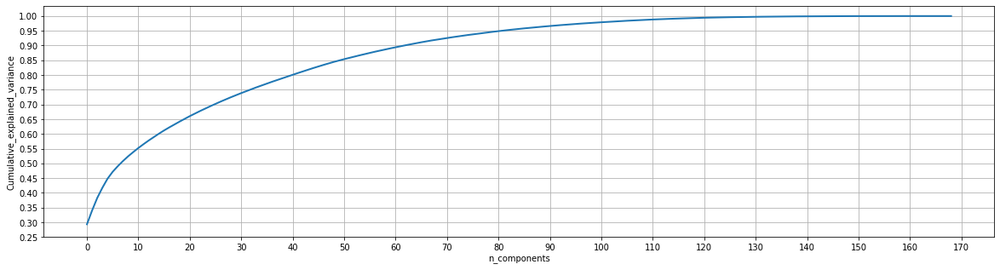

TruncatedSVD(n_components=169)

In [ ]:
truncated_svd(standard_train_median_all_features_df,169)

**I choose 120 components to describe my data as 120 components explain atleast 99% variance of the total data.** 

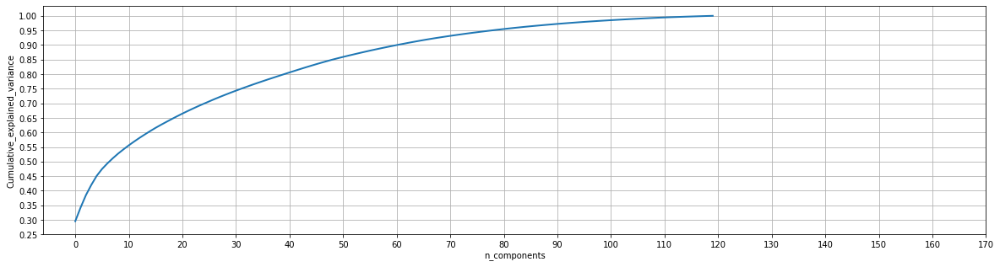

In [ ]:
svd=truncated_svd(standard_train_median_all_features_df,120)

**For the 120 principal components using svd.explained_variance_ratio_ find the variance distribution.**

In [ ]:
print(len(svd.explained_variance_ratio_))

120


In [ ]:
np.sum(svd.explained_variance_ratio_)

0.9937009

In [ ]:
svd.components_.shape

(120, 170)

In [ ]:
#number of features 
svd.components_.shape[1]

170

In [ ]:
#number of components
svd.components_.shape[0]

120

**For the 120 principal components find the feature importance.**

In [ ]:
set_number_of_features=120

### Trying Forward Feature selection

**Here, in forward feature selection, out of 170 features even if I choose to select 10 features only , still it will take a lot of time.<br>
Therefore I go with recursive feature elimination.<br>
Using Recursive Feature Elimination, I can get the features that I need.**

In [ ]:
%%time
new_standard_train_median_all_features_df=recursive_feature_elimination(
    standard_train_median_all_features_df,
    y_train_median_all_features,
    int(set_number_of_features+np.round((len(train.columns.values)-set_number_of_features)/2))
)

Rankings :  [1 2 1 1 4 3 3 1 1 1 1 1 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 6 1 3 1 1 1 1 1 1 2
 1 1 1 1 1 1 1 1 1 1 1 1 1 3 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 1 1 1 6 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 5 1 1 1 1 1 1 1 1 1 4 1 1 1 1 1 1 5 3 1 1 1 1 1 1 1 5 6 6 5 1 1 1 1 1 1
 1 1 1 1 1 2 2 1 1 1 1 1 1 1 1 1 1 1 1 2 4 5]
Selected indices :
 1    145
6      5
5      5
4      5
3      5
2      5
dtype: int64
CPU times: user 11min 2s, sys: 637 ms, total: 11min 3s
Wall time: 6min 7s


In [ ]:
new_standard_train_median_all_features_df.head()

,sensor1_measure,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,...,sensor104_measure,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8
0,-0.209185,-0.432133,-0.078741,-0.028788,-0.057799,-0.115367,-0.179786,-0.231174,-0.094145,-0.203189,...,-0.172052,-0.258247,-0.167010,-0.104268,-0.025683,-0.045527,-0.128090,-0.199055,-0.168927,-0.201433
1,0.226385,2.314107,0.276872,-0.028788,-0.057799,-0.115367,-0.175033,0.318588,0.527328,0.351014,...,0.628487,0.437684,0.093053,0.064536,0.132146,0.278645,0.573132,0.835714,-0.017869,-0.288574
2,-0.411601,-0.432133,-0.108583,-0.028788,-0.057799,-0.114391,-0.176506,-0.336292,-0.427550,-0.352896,...,-0.398668,-0.298779,-0.305851,-0.385732,-0.392813,-0.383465,-0.370167,-0.310736,-0.198682,-0.307802
3,0.027280,-0.432131,0.303606,-0.028788,-0.057799,-0.115367,-0.180203,-0.309964,0.316092,1.059426,...,0.181674,0.086046,0.209944,0.283329,0.340889,0.186015,0.040885,-0.036827,-0.114241,0.062849
4,-0.132515,-0.432132,0.031300,-0.028788,-0.057799,-0.115367,-0.180360,-0.207419,-0.046739,0.001999,...,-0.187459,-0.181920,-0.132356,-0.193390,-0.200260,-0.163322,0.021205,-0.126184,-0.131916,0.376297


**Try spearman corelation coefficient to find out co relation. (It is good for cause and affect analysis but it might not be of much use when we find that our features are dependent on other features, we expect our features to be independent of each other.).**

In [ ]:
%%time
spearman=select_spearman(new_standard_train_median_all_features_df,int(set_number_of_features+np.floor((len(train.columns.values)-set_number_of_features)/2)))

If I take the data having correlation between only -.1 and .1 range then I get  0  features.
If I take the data having correlation between only -.90 and .90 range then I get  65  features.
If I take the data having correlation between only -.95 and .95 range then I get  85  features.
If I take the data having correlation between only -.97 and .97 range then I get  102  features.
If I take the data having correlation between only -.98 and .98 range then I get  112  features.
If I take the data having correlation between only -.99 and .99 range then I get  127  features.
If I take the data having correlation between only -.999 and .999 range then I get  129  features.
CPU times: user 13 s, sys: 44.8 ms, total: 13.1 s
Wall time: 13 s


In [ ]:
new_standard_train_median_all_features_df=perform_spearman(new_standard_train_median_all_features_df,spearman,.99)

In [ ]:
new_standard_train_median_all_features_df.head()

,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin8,...,sensor104_measure,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8
0,-0.432133,-0.078741,-0.028788,-0.057799,-0.115367,-0.179786,-0.231174,-0.094145,-0.203189,-0.156318,...,-0.172052,-0.258247,-0.167010,-0.104268,-0.025683,-0.045527,-0.128090,-0.199055,-0.168927,-0.201433
1,2.314107,0.276872,-0.028788,-0.057799,-0.115367,-0.175033,0.318588,0.527328,0.351014,0.110561,...,0.628487,0.437684,0.093053,0.064536,0.132146,0.278645,0.573132,0.835714,-0.017869,-0.288574
2,-0.432133,-0.108583,-0.028788,-0.057799,-0.114391,-0.176506,-0.336292,-0.427550,-0.352896,-0.156730,...,-0.398668,-0.298779,-0.305851,-0.385732,-0.392813,-0.383465,-0.370167,-0.310736,-0.198682,-0.307802
3,-0.432131,0.303606,-0.028788,-0.057799,-0.115367,-0.180203,-0.309964,0.316092,1.059426,0.395679,...,0.181674,0.086046,0.209944,0.283329,0.340889,0.186015,0.040885,-0.036827,-0.114241,0.062849
4,-0.432132,0.031300,-0.028788,-0.057799,-0.115367,-0.180360,-0.207419,-0.046739,0.001999,-0.079524,...,-0.187459,-0.181920,-0.132356,-0.193390,-0.200260,-0.163322,0.021205,-0.126184,-0.131916,0.376297


In [ ]:
new_standard_train_median_all_features_df.shape

(48000, 127)

In [ ]:
new_standard_test_median_all_features_df=standard_test_median_all_features_df[new_standard_train_median_all_features_df.columns.values]
new_standard_test_median_all_features_df.head()

,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin8,...,sensor104_measure,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8
0,-0.432133,-0.078741,-0.028788,-0.057799,-0.115367,-0.180209,-0.225051,0.291359,0.206391,-0.101993,...,-0.075114,-0.119692,-0.072308,0.057907,0.125870,0.099242,0.163299,0.280228,-0.005584,-0.208069
1,2.314107,0.135746,-0.028788,-0.057799,-0.115367,-0.180150,0.066724,0.750312,0.367857,-0.044753,...,0.199008,0.036052,0.039671,0.138756,0.167661,0.197075,0.406800,0.754810,0.221194,1.813683
2,-0.432133,-0.115422,-0.028788,-0.057799,-0.115367,-0.180461,-0.336576,-0.426838,-0.352896,-0.156730,...,-0.421137,-0.299987,-0.307366,-0.386519,-0.393192,-0.383560,-0.370202,-0.310778,-0.198829,-0.307802
3,2.314107,-0.114800,-0.028788,-0.057799,-0.115367,-0.180276,-0.334237,-0.426611,-0.352869,-0.156730,...,-0.410865,-0.298142,-0.306402,-0.385988,-0.392942,-0.382904,-0.369753,-0.310692,-0.198829,-0.307802
4,2.314107,0.041869,-0.028788,-0.057799,-0.115367,-0.180369,-0.273727,0.202382,0.265217,-0.142487,...,-0.046868,-0.173463,-0.122351,-0.103468,-0.047627,0.104776,0.244433,0.125151,-0.056531,0.334861


In [ ]:
new_standard_test_median_all_features_df=standard_test_median_all_features_df[new_standard_train_median_all_features_df.columns.values]
new_standard_test_median_all_features_df.head()

,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin8,...,sensor104_measure,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8
0,-0.432133,-0.078741,-0.028788,-0.057799,-0.115367,-0.180209,-0.225051,0.291359,0.206391,-0.101993,...,-0.075114,-0.119692,-0.072308,0.057907,0.125870,0.099242,0.163299,0.280228,-0.005584,-0.208069
1,2.314107,0.135746,-0.028788,-0.057799,-0.115367,-0.180150,0.066724,0.750312,0.367857,-0.044753,...,0.199008,0.036052,0.039671,0.138756,0.167661,0.197075,0.406800,0.754810,0.221194,1.813683
2,-0.432133,-0.115422,-0.028788,-0.057799,-0.115367,-0.180461,-0.336576,-0.426838,-0.352896,-0.156730,...,-0.421137,-0.299987,-0.307366,-0.386519,-0.393192,-0.383560,-0.370202,-0.310778,-0.198829,-0.307802
3,2.314107,-0.114800,-0.028788,-0.057799,-0.115367,-0.180276,-0.334237,-0.426611,-0.352869,-0.156730,...,-0.410865,-0.298142,-0.306402,-0.385988,-0.392942,-0.382904,-0.369753,-0.310692,-0.198829,-0.307802
4,2.314107,0.041869,-0.028788,-0.057799,-0.115367,-0.180369,-0.273727,0.202382,0.265217,-0.142487,...,-0.046868,-0.173463,-0.122351,-0.103468,-0.047627,0.104776,0.244433,0.125151,-0.056531,0.334861


In [ ]:
#new_standard_train_median_all_features_df.to_pickle("new_standard_train_median_all_features_df.pickle")
#y_train_median_all_features.to_pickle("y_train_median_all_features.pickle")

#new_standard_test_median_all_features_df.to_pickle("new_standard_test_median_all_features_df.pickle")
#y_test_median_all_features.to_pickle("y_test_median_all_features.pickle")

In [23]:
#new_standard_train_median_all_features_df=pd.read_pickle("/content/gdrive/My Drive/new_standard_train_median_all_features_df.pickle")
#y_train_median_all_features=pd.read_pickle("/content/gdrive/My Drive/y_train_median_all_features.pickle")

#new_standard_test_median_all_features_df=pd.read_pickle("/content/gdrive/My Drive/new_standard_test_median_all_features_df.pickle")
#y_test_median_all_features=pd.read_pickle("/content/gdrive/My Drive/y_test_median_all_features.pickle")

In [ ]:
np.save('new_standard_train_median_all_features_df_columns.npy',new_standard_train_median_all_features_df.columns.values)

In [30]:
new_standard_train_median_all_features_df["target"]=y_train_median_all_features
new_standard_train_median_all_features_df.head()

,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin8,sensor7_histogram_bin9,sensor9_measure,sensor10_measure,sensor16_measure,sensor17_measure,sensor18_measure,sensor20_measure,sensor22_measure,sensor23_measure,sensor24_histogram_bin0,sensor24_histogram_bin1,sensor24_histogram_bin2,sensor24_histogram_bin3,sensor24_histogram_bin5,sensor24_histogram_bin6,sensor24_histogram_bin7,sensor24_histogram_bin8,sensor24_histogram_bin9,sensor25_histogram_bin0,sensor25_histogram_bin1,sensor25_histogram_bin2,sensor25_histogram_bin3,sensor25_histogram_bin4,sensor25_histogram_bin5,sensor25_histogram_bin6,sensor25_histogram_bin7,sensor26_histogram_bin0,sensor26_histogram_bin1,sensor26_histogram_bin2,sensor26_histogram_bin3,...,sensor69_histogram_bin3,sensor69_histogram_bin4,sensor69_histogram_bin5,sensor69_histogram_bin6,sensor69_histogram_bin7,sensor69_histogram_bin8,sensor70_measure,sensor71_measure,sensor72_measure,sensor73_measure,sensor74_measure,sensor75_measure,sensor78_measure,sensor79_measure,sensor80_measure,sensor81_measure,sensor82_measure,sensor83_measure,sensor84_measure,sensor90_measure,sensor91_measure,sensor94_measure,sensor95_measure,sensor96_measure,sensor97_measure,sensor98_measure,sensor99_measure,sensor102_measure,sensor103_measure,sensor104_measure,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,target
0,-0.432133,-0.078741,-0.028788,-0.057799,-0.115367,-0.179786,-0.231174,-0.094145,-0.203189,-0.156318,-0.029573,-0.055001,-0.022185,-0.247540,-0.268503,-0.086423,-0.03992,-0.170004,-0.250903,-0.026929,-0.019102,-0.025508,-0.03445,-0.027653,0.019798,-0.204953,-0.223919,-0.012042,-0.039722,-0.062648,-0.046839,-0.127249,-0.271058,-0.099884,-0.118707,-0.058450,-0.136385,-0.284885,-0.215137,-0.194294,...,-0.240884,-0.105702,-0.157814,-0.361452,-0.127120,-0.018465,-0.081672,-0.110379,-0.207972,-0.193647,-0.026793,-0.066670,-0.123843,-0.216425,-0.182974,-0.018598,-0.025464,-0.008014,-0.083804,0.223798,-0.043440,-0.166366,-0.244015,0.012980,-0.005788,-0.187032,-0.127898,-0.210557,-0.165126,-0.172052,-0.258247,-0.167010,-0.104268,-0.025683,-0.045527,-0.128090,-0.199055,-0.168927,-0.201433,0.0
1,2.314107,0.276872,-0.028788,-0.057799,-0.115367,-0.175033,0.318588,0.527328,0.351014,0.110561,-0.029573,-0.055001,-0.022185,0.315152,0.438061,-0.086423,-0.03992,-0.021180,1.006312,-0.026929,-0.019102,-0.025508,-0.03445,-0.083133,1.041712,-0.088098,0.079001,-0.012042,-0.037172,-0.063726,-0.039542,-0.123660,-0.350404,0.719456,-0.082490,-0.058471,0.461935,0.361505,0.226452,0.247854,...,0.777684,-0.006112,0.236746,0.767082,0.090748,-0.003555,0.137387,0.239649,0.942112,-0.114101,-0.026793,0.007628,0.834765,0.469907,0.623494,-0.018598,-0.025464,-0.008014,-0.083804,1.341602,2.469441,0.265783,0.314260,0.626016,0.316323,-0.187032,-0.127898,0.266704,0.576310,0.628487,0.437684,0.093053,0.064536,0.132146,0.278645,0.573132,0.835714,-0.017869,-0.288574,0.0
2,-0.432133,-0.108583,-0.028788,-0.057799,-0.114391,-0.176506,-0.336292,-0.427550,-0.352896,-0.156730,-0.029573,-0.055001,-0.022185,-0.318004,-0.349774,-0.086423,-0.03992,-0.167507,-0.241253,-0.026929,-0.019102,-0.025508,-0.03445,-0.083133,-0.330240,-0.295079,-0.263661,-0.012042,-0.096970,-0.123021,-0.069934,-0.133810,-0.361153,-0.326799,-0.097644,-0.055213,-0.366723,-0.384319,-0.346667,-0.369216,...,-0.321566,-0.213062,-0.399160,-0.452164,-0.151216,-0.018828,-0.112594,-0.149007,-0.551387,-0.226291,-0.026793,-0.067530,-0.588565,-0.315599,-0.182974,-0.018598,-0.025464,-0.007931,-0.067775,-0.475921,-0.511690,-0.437239,-0.461492,-0.341535,-0.300021,-0.173687,-0.127553,-0.224763,-0.355790,-0.398668,-0.298779,-0.305851,-0.385732,-0.392813,-0.383465,-0.370167,-0.310736,-0.198

<h3>Compare the target 0 and target 1 mean values feature wise after median value imputing</h3>

In [31]:
column_list=[]
mean_list=[]
one_zero=[]
for column in list(new_standard_train_median_all_features_df.columns.values):
    if column!="target":
        column_list.append(column)
        one_zero.append(0)
        mean_list.append(new_standard_train_median_all_features_df[column][new_standard_train_median_all_features_df.target==0].mean())

        column_list.append(column)
        one_zero.append(1)
        mean_list.append(new_standard_train_median_all_features_df[column][new_standard_train_median_all_features_df.target==1].mean())

**Find the features where the difference between the means of the two classes is more than .15<br>
descending sorted by class 1**

In [32]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:mean_list[i] for i in index}

In [33]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [34]:
counter=0
new_column_list=[]
new_mean_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_mean_list.append(mean_list[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_mean_list.append(mean_list[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 127 sensors.


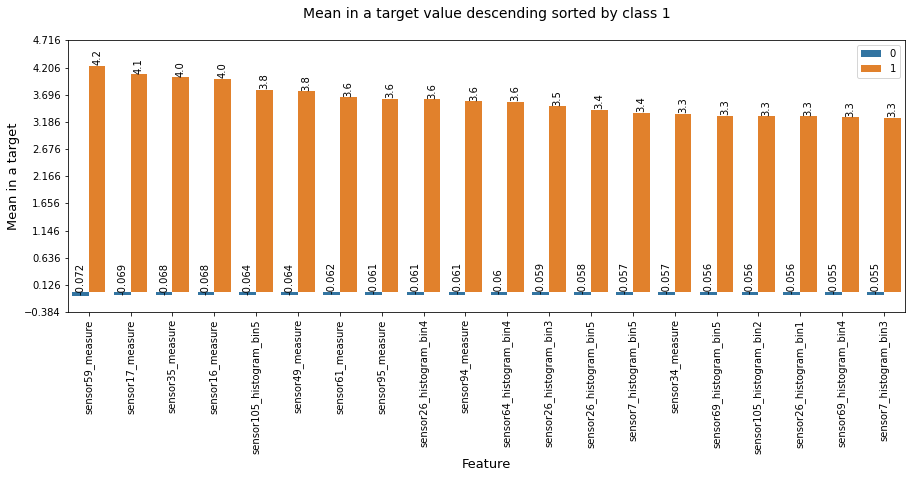

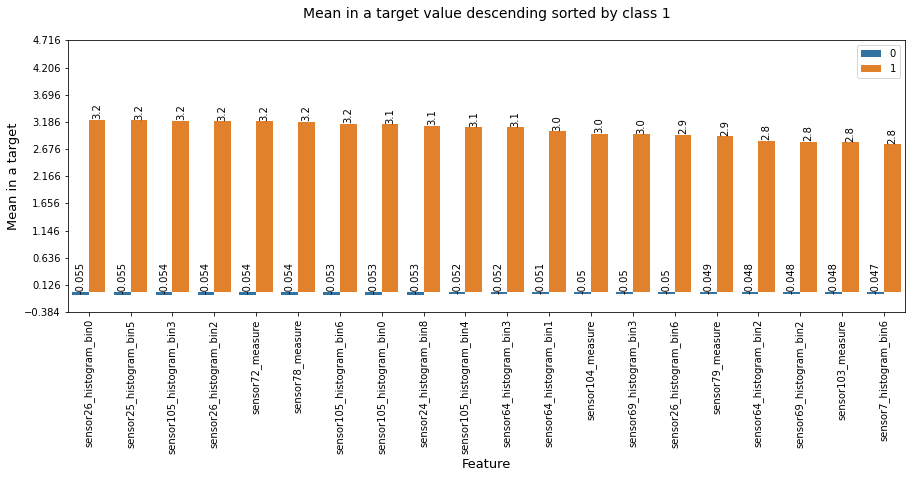

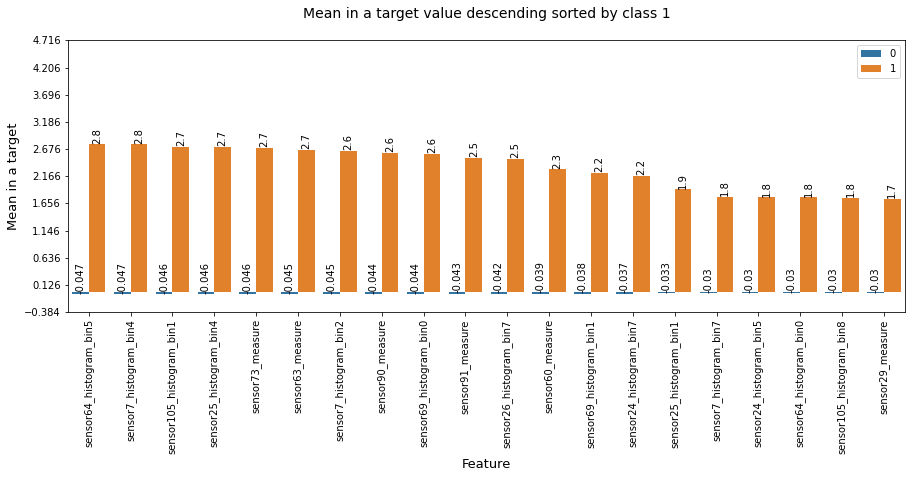

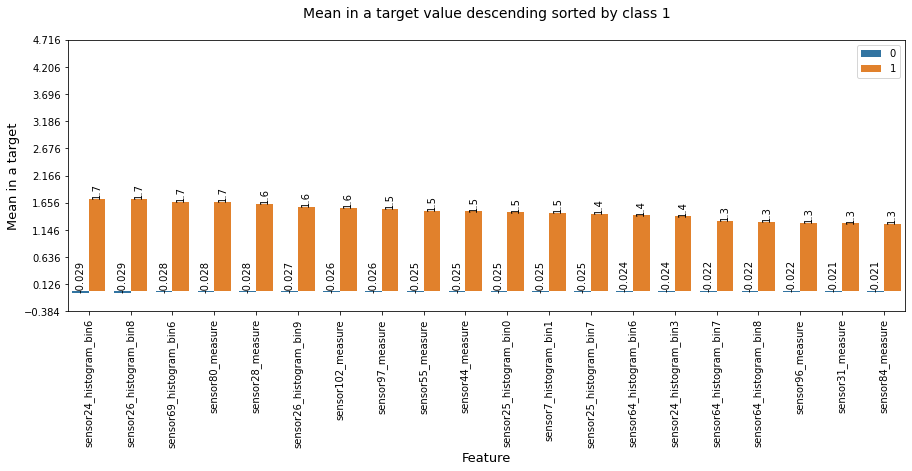

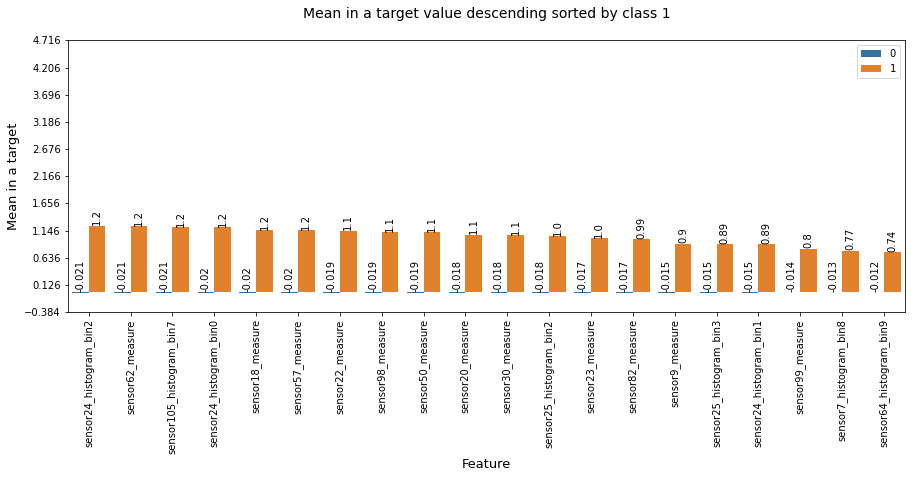

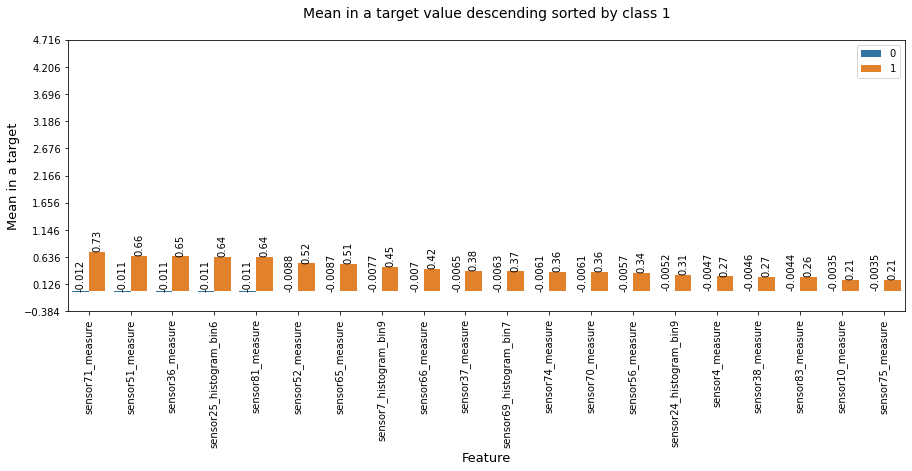

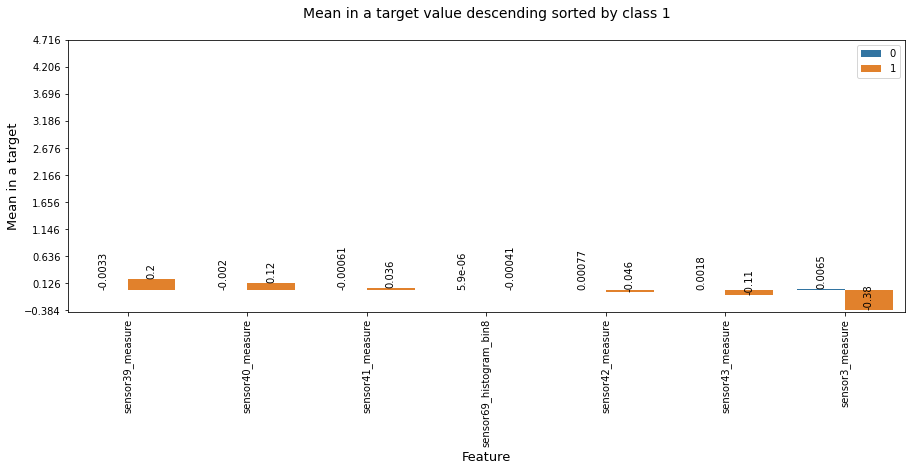

In [37]:
try:
    plot_diagram(new_column_list,new_mean_list,new_one_zero,"Mean",1)
except ValueError:
    pass

**Observation** : Observe that there is a significant difference between the means of the surface failures and the means of the downhole failures(Descending order for the downhole failures).

In [38]:
counter=0
mean_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    
    if (np.abs(np.abs(mean_list[i])-np.abs(mean_list[i-1]))>=.15):
        mean_higher_reading.append(mean_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        mean_higher_reading.append(mean_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])


        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between median readings of surface and downhole failures.".format(counter))

So we have approximate 122 sensor that show significant difference (> .15) between median readings of surface and downhole failures.


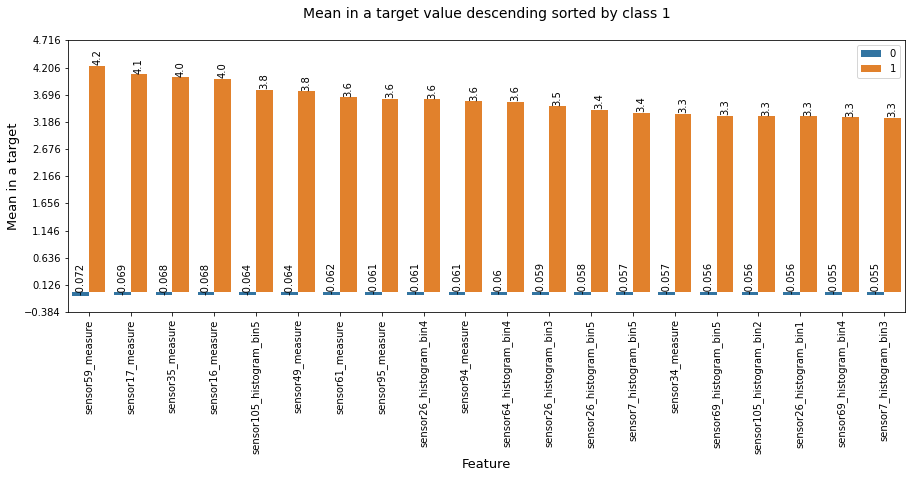

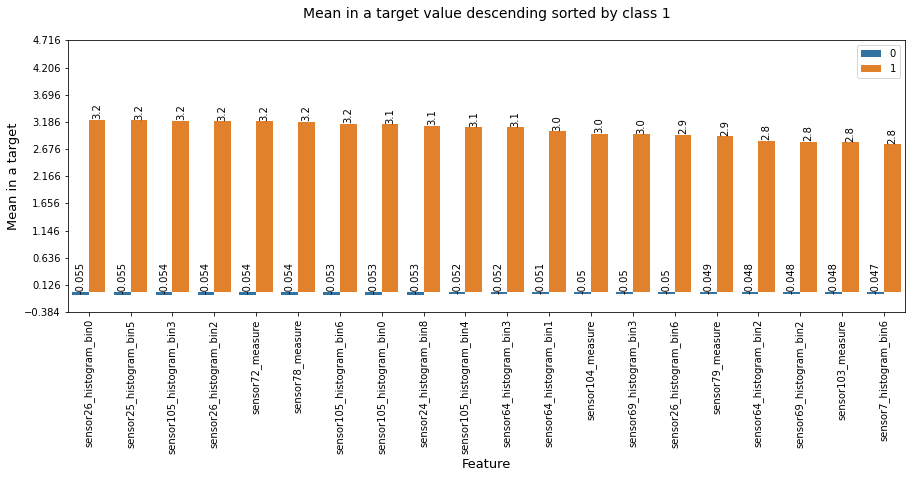

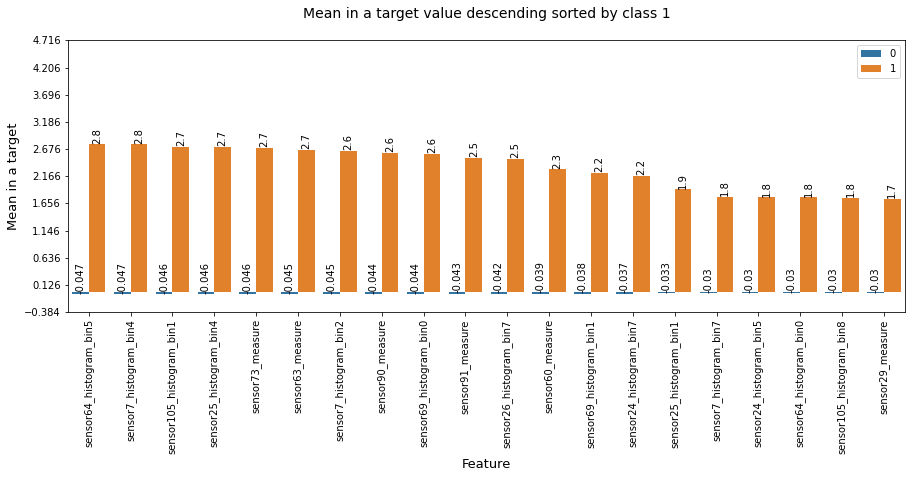

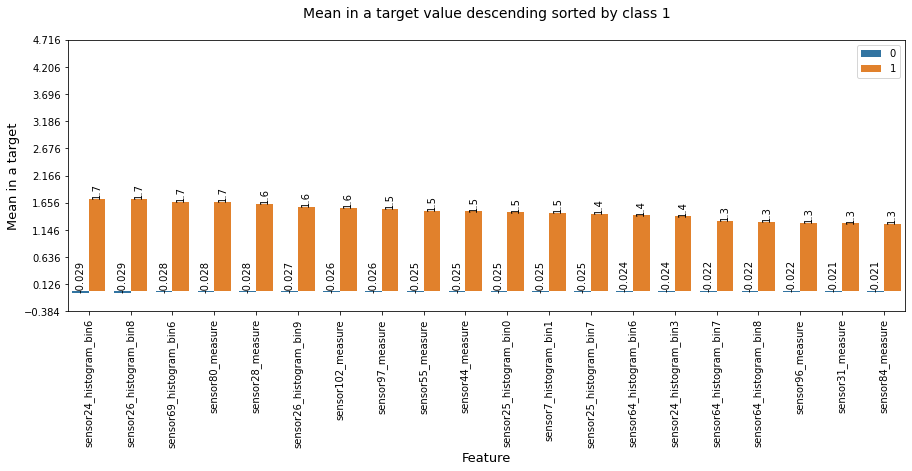

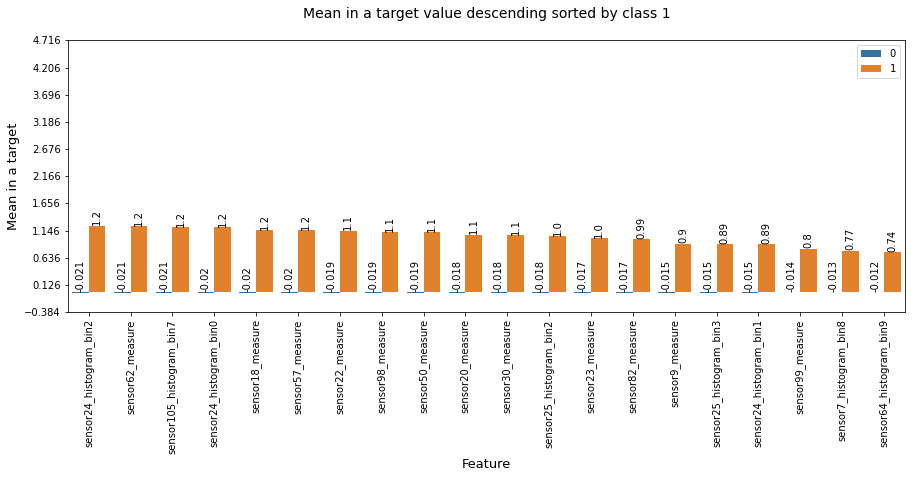

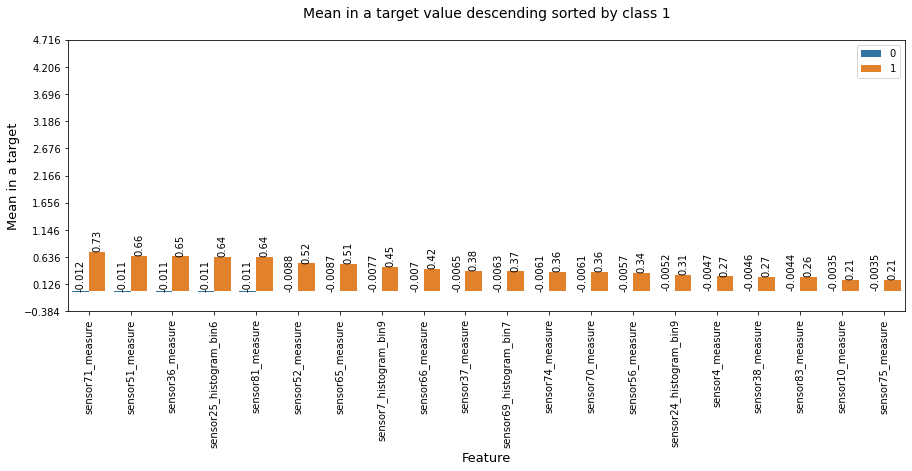

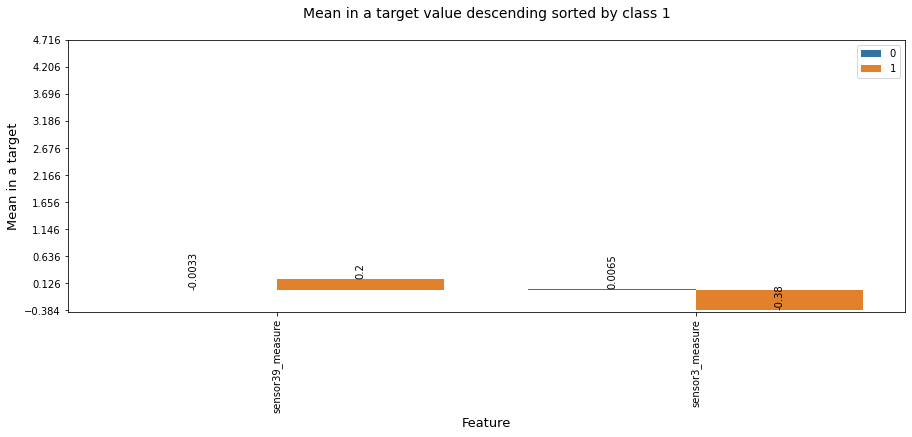

In [39]:
try:
    plot_diagram(column_higher_reading,mean_higher_reading,one_zero_higher_reading,"Mean",1)
except ValueError:
    pass

**Features with a significant difference**

<h3>Compare the target 0 and target 1 median values feature wise after median value imputing</h3>

In [40]:
column_list=[]
median_list=[]
one_zero=[]


for column in list(new_standard_train_median_all_features_df.columns.values):
    
    if column!="target":

        column_list.append(column)
        one_zero.append(0)
        median_list.append(new_standard_train_median_all_features_df[column][new_standard_train_median_all_features_df.target==0].median())

        column_list.append(column)
        one_zero.append(1)
        median_list.append(new_standard_train_median_all_features_df[column][new_standard_train_median_all_features_df.target==1].median())

**Find the features where the difference between the medians of the two classes is more than .15<br>
descending sorted by class 1**

In [41]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:median_list[i] for i in index}

In [42]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [43]:
counter=0
new_column_list=[]
new_median_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_median_list.append(median_list[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_median_list.append(median_list[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 127 sensors.


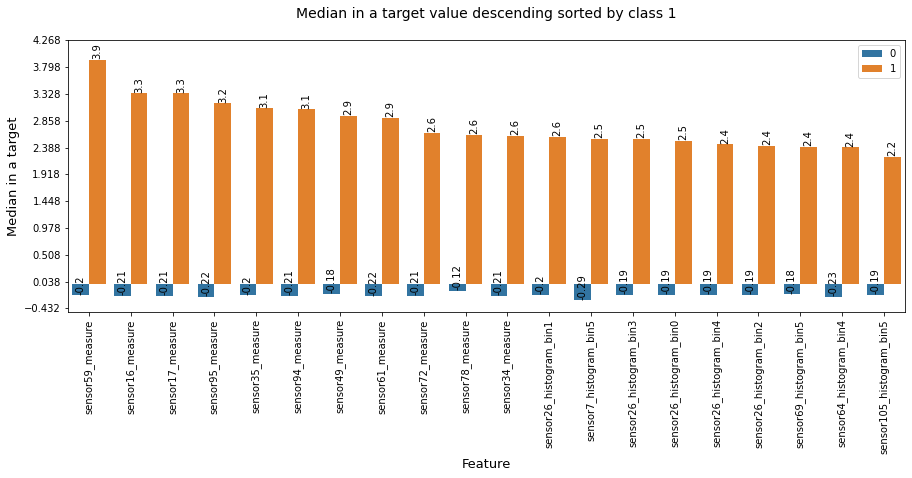

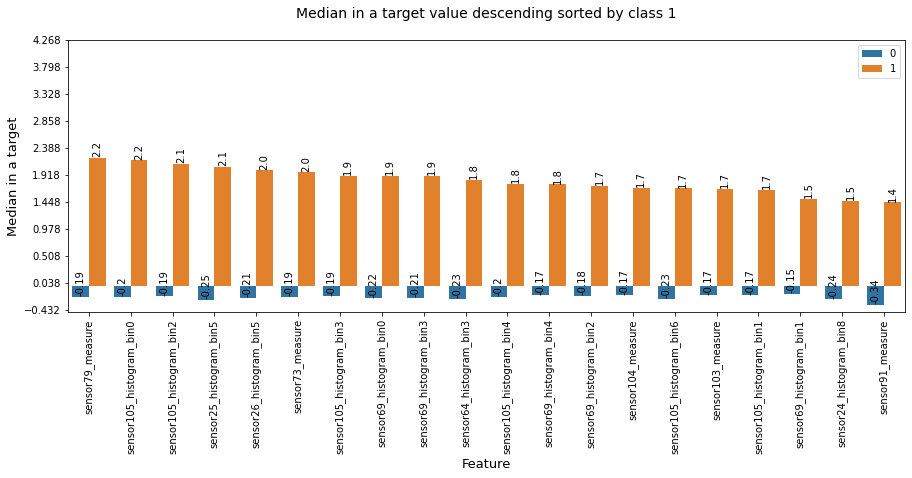

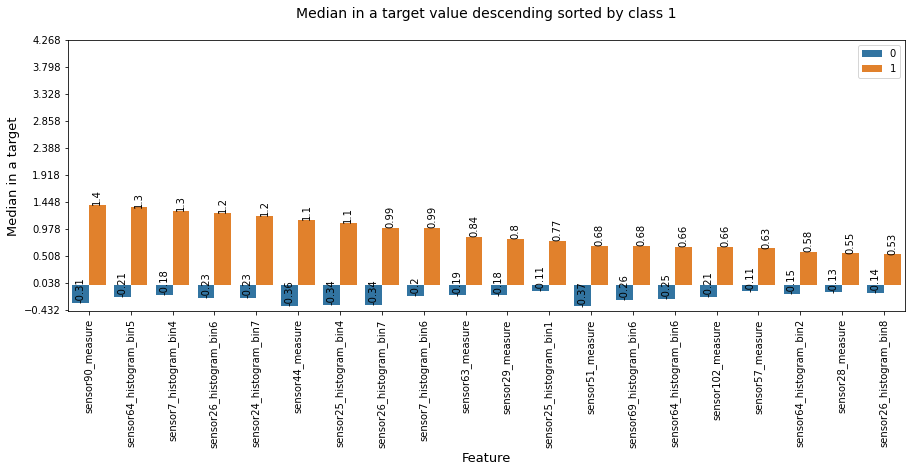

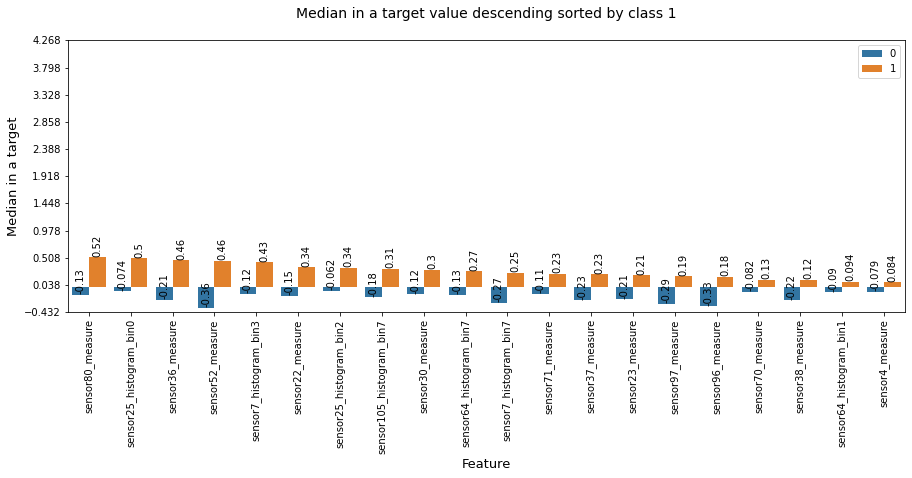

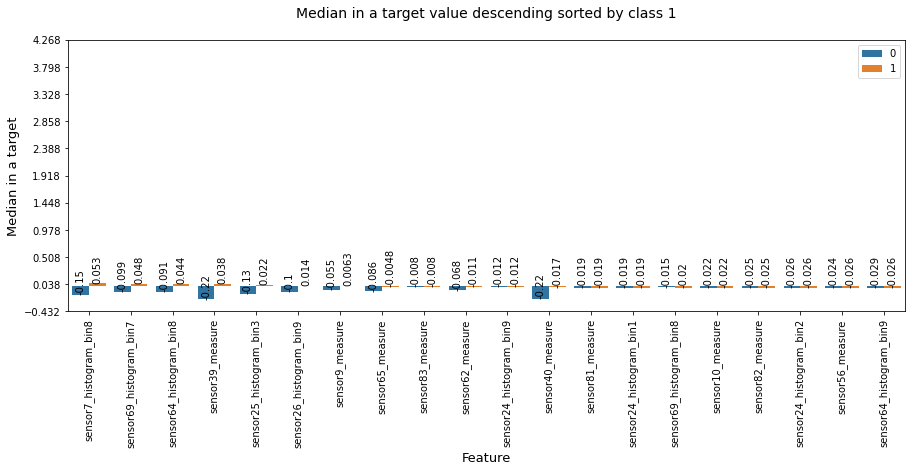

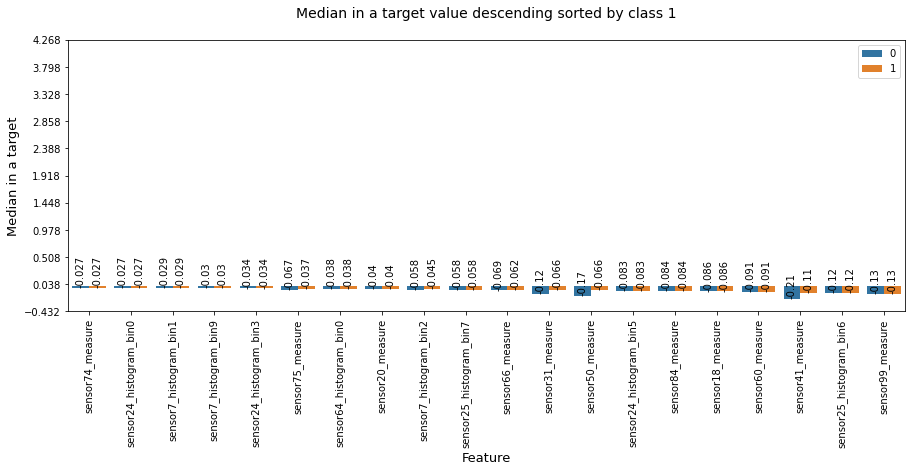

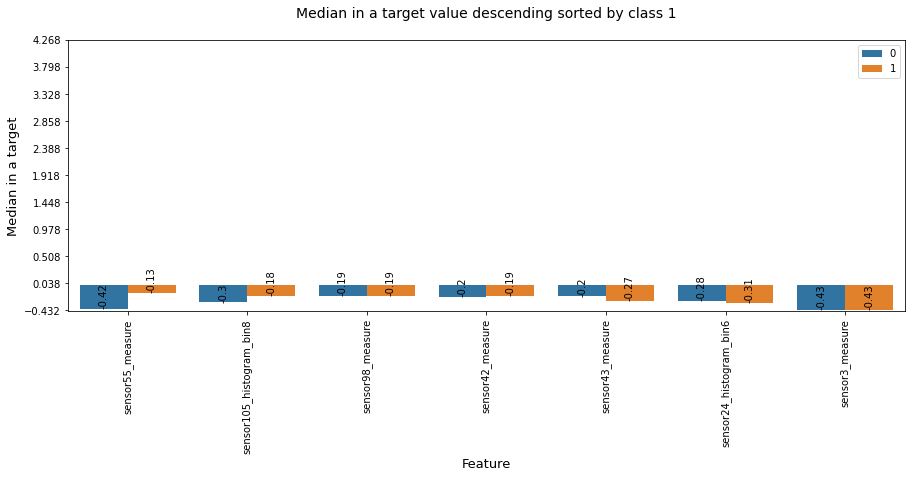

In [44]:
try:
    plot_diagram(new_column_list,new_median_list,new_one_zero,"Median",1)
except ValueError:
    pass

**Observation :** Observe that median failures for the downhole failures(Descending order for the downhole failures) is less than that of the downhole mean.

In [45]:
counter=0
median_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    
    if (np.abs(np.abs(median_list[i])-np.abs(median_list[i-1]))>=.15):
        median_higher_reading.append(median_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        median_higher_reading.append(median_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])


        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between median readings of surface and downhole failures.".format(counter))

So we have approximate 70 sensor that show significant difference (> .15) between median readings of surface and downhole failures.


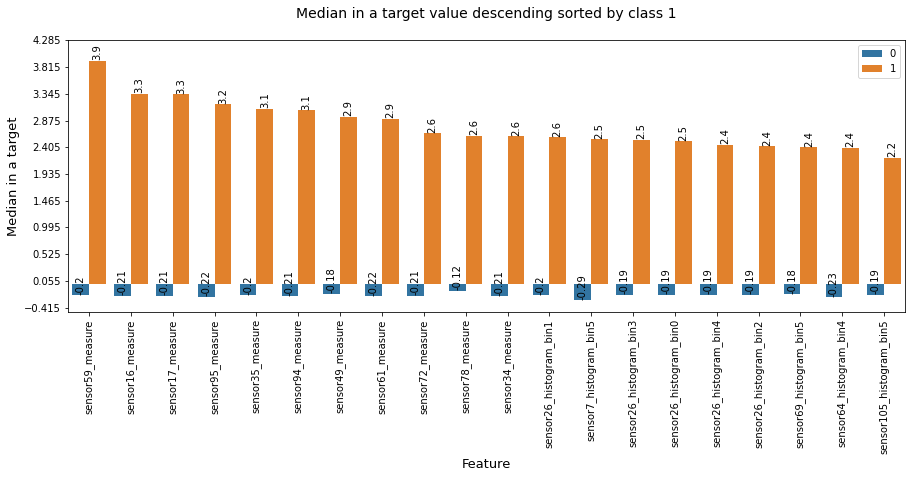

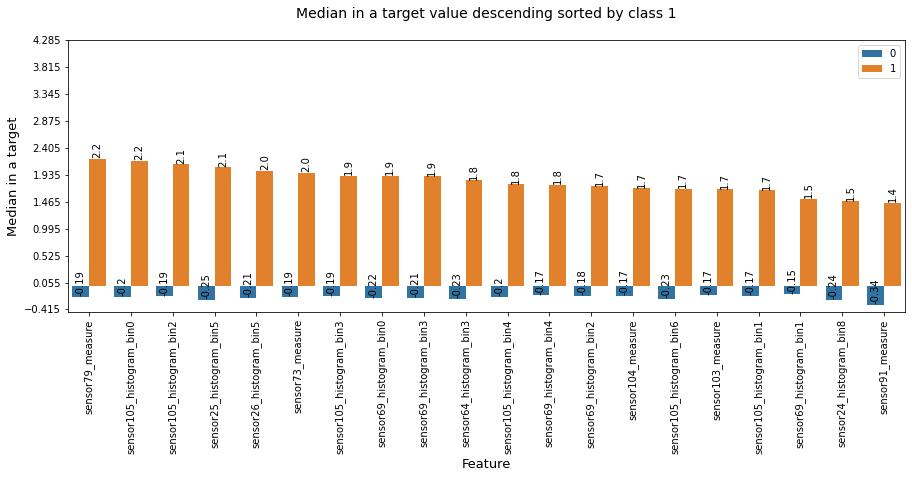

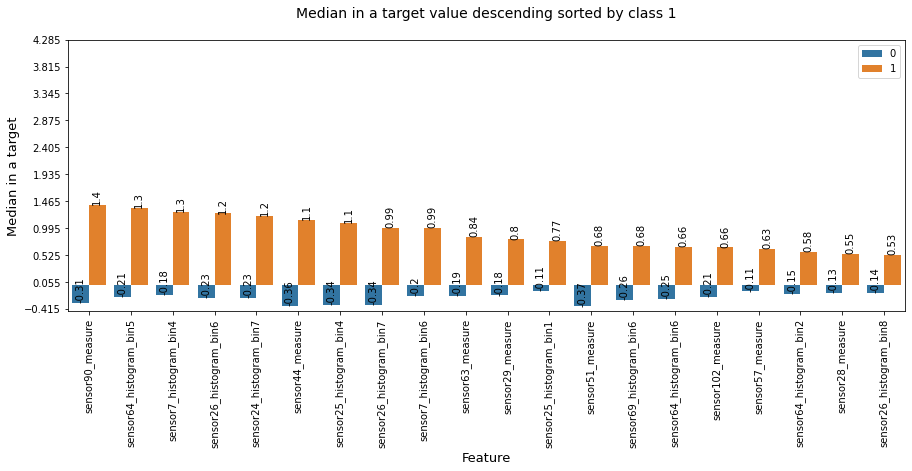

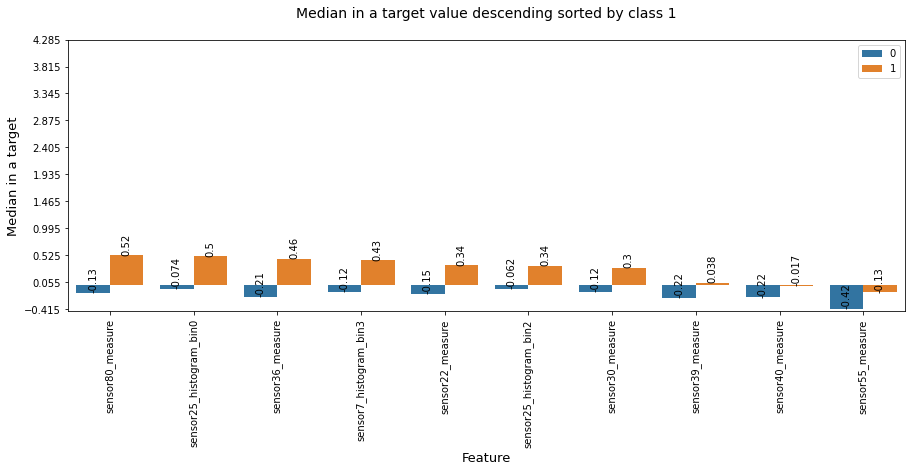

In [46]:
try:
    plot_diagram(column_higher_reading,median_higher_reading,one_zero_higher_reading,"Median",1)
except ValueError:
    pass

**Observations regarding this**<br>
1) All the values which were missing , we filled them with the median values.<br>
2) Higher difference for mean values but possibly the right difference for the median value.

### Basic Classifier

In [47]:
new_standard_train_median_all_features_df.drop("target",axis=1,inplace=True)

In [52]:
print(dummy_classifier_based_on_median(new_standard_train_median_all_features_df.loc[41996],
                                       column_list,
                                       median_list))

Predicted surface failure.
[118, 9]


In [53]:
print(dummy_classifier_based_on_median(new_standard_test_median_all_features_df.loc[11971],
                                       column_list,
                                       median_list))

Predicted surface failure.
[88, 39]


In [57]:
new_standard_train_median_all_features_df["target"]=y_train_median_all_features

### EDA for the dataset

**Using histograms, plots find out the nature of means for features for both the classes and thereby, the outliers.**

In [58]:
mean_0=[]
mean_1=[]
for column in list(new_standard_train_median_all_features_df.columns.values):
    if column!="target":
        mean_0.append(new_standard_train_median_all_features_df[new_standard_train_median_all_features_df.target==0][column].mean())
        mean_1.append(new_standard_train_median_all_features_df[new_standard_train_median_all_features_df.target==1][column].mean())

In [59]:
median_0=[]
median_1=[]
for column in list(new_standard_train_median_all_features_df.columns.values): 
    if column!="target":
        median_0.append(new_standard_train_median_all_features_df[new_standard_train_median_all_features_df.target==0][column].median())
        median_1.append(new_standard_train_median_all_features_df[new_standard_train_median_all_features_df.target==1][column].median())

**10) Try and plot it’s histogram for both the target values.**

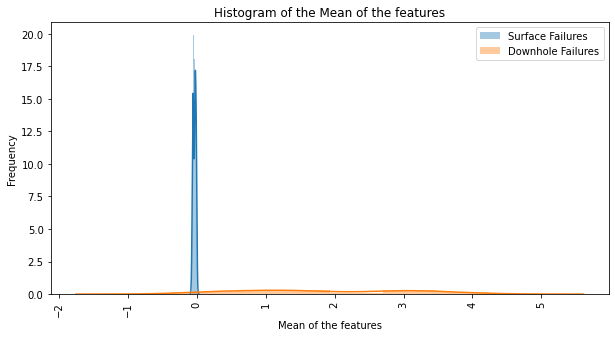

In [61]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
plt.figure(figsize=(10,5))
sns.distplot(mean_0, hist=True, label="Surface Failures")
sns.distplot(mean_1, hist=True, label="Downhole Failures")
plt.title('Histogram of the Mean of the features')
plt.ylabel('Frequency')
plt.xlabel('Mean of the features')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
Here for the surface and downhole failures, we can see that the different downhole features have more variance.
Whereas the majority of the surface related features have a very similar value.

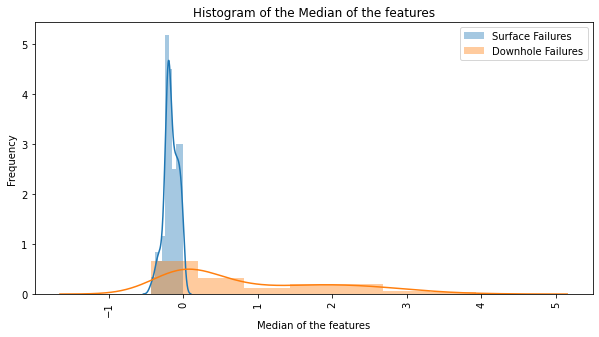

In [62]:
plt.figure(figsize=(10,5))
sns.distplot(median_0, hist=True, label="Surface Failures")
sns.distplot(median_1, hist=True, label="Downhole Failures")
plt.title('Histogram of the Median of the features')
plt.ylabel('Frequency')
plt.xlabel('Median of the features')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
Here for the surface and downhole failures, we can see that the different downhole features have more variance. Whereas the majority of the surface related features have a very similar value.

**11) Try box plot / voilin plot to visualize the outliers.**

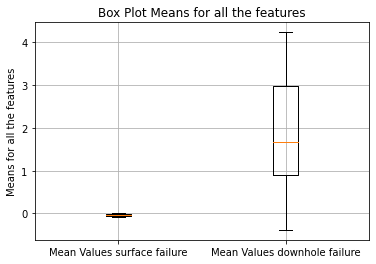

In [63]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([mean_0, mean_1])
plt.title('Box Plot Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

**Observations :**<br>
**The majority of the values for the surface failures lie near 0 whereas for the downhole failures, we can see all kinds of variation.**

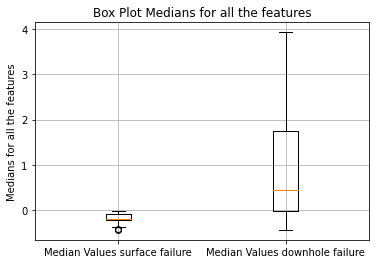

In [64]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([median_0, median_1])
plt.title('Box Plot Medians for all the features')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the features')
plt.grid()
plt.show()

**Observations :**<br>
**Similar behaviour with the medians.**

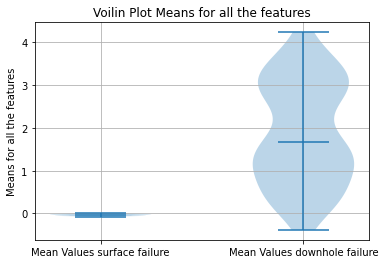

In [65]:
plt.violinplot([mean_0, mean_1], showmeans=False, showmedians=True)
plt.title('Voilin Plot Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

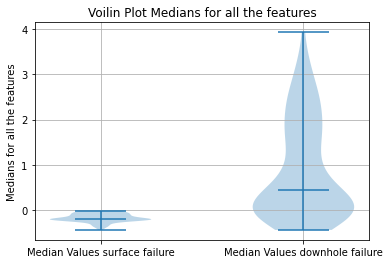

In [66]:
plt.violinplot([median_0, median_1], showmeans=False, showmedians=True)
plt.title('Voilin Plot Medians for all the features')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the features')
plt.grid()
plt.show()

**PCA**

In [67]:
new_standard_train_median_all_features_df.drop("target",axis=1,inplace=True)

In [68]:
"target" in new_standard_train_median_all_features_df.columns

False

[[  1.3551275   -2.7165384    0.        ]
 [ -2.426687    -0.21472278   0.        ]
 [  2.8133297   -0.507791     0.        ]
 ...
 [-46.629208    -3.5711164    1.        ]
 [ -3.1961012   -0.28361306   1.        ]
 [-63.428383    13.535967     1.        ]]


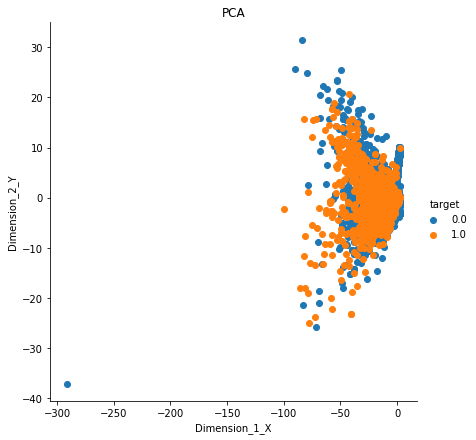

CPU times: user 630 ms, sys: 109 ms, total: 739 ms
Wall time: 619 ms


In [71]:
%%time
run_pca(new_standard_train_median_all_features_df,y_train_median_all_features)

**tsne**

**Do not put these values in a loop as we do not get all the output graphs**

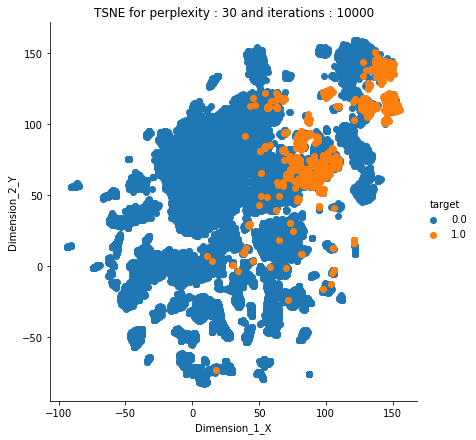

CPU times: user 13 s, sys: 11.6 s, total: 24.6 s
Wall time: 24.5 s


In [ ]:
%%time
run_tsne(new_standard_train_new_median_all_features_df,y_train_median_all_features,30,10000)

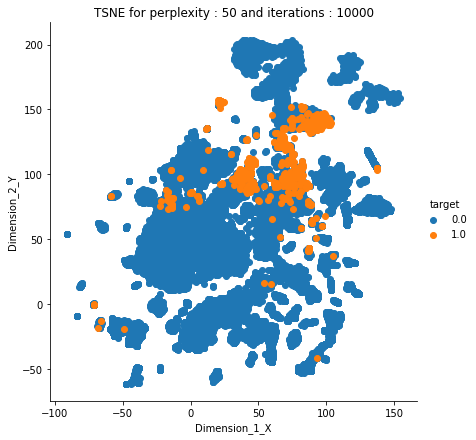

CPU times: user 12.9 s, sys: 11.6 s, total: 24.5 s
Wall time: 24.3 s


In [ ]:
%%time
run_tsne(new_standard_train_new_median_all_features_df,y_train_median_all_features,50,10000)

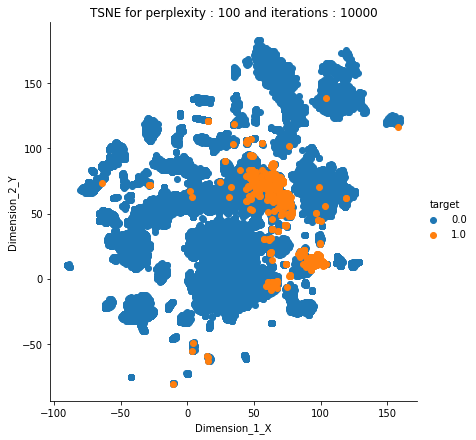

CPU times: user 12.7 s, sys: 11.4 s, total: 24.1 s
Wall time: 23.9 s


In [ ]:
%%time
run_tsne(new_standard_train_new_median_all_features_df,y_train_median_all_features,100,10000)

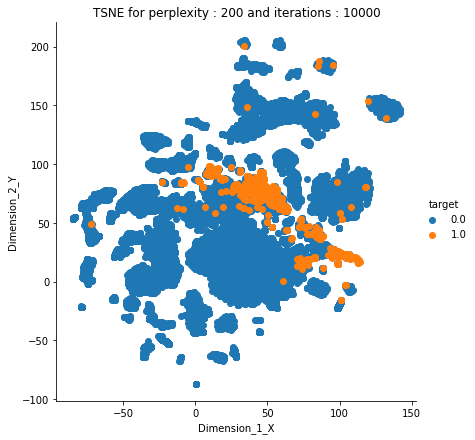

CPU times: user 13 s, sys: 11.6 s, total: 24.6 s
Wall time: 24.4 s


In [ ]:
%%time
run_tsne(new_standard_train_new_median_all_features_df,y_train_median_all_features,200,10000)

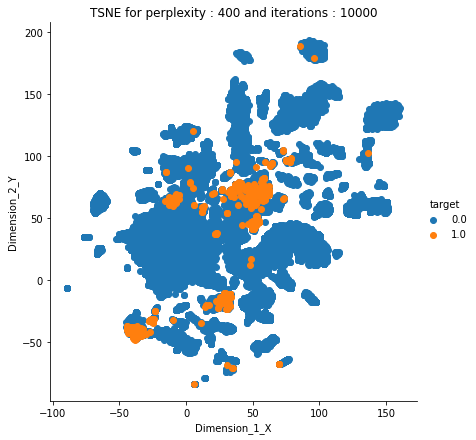

CPU times: user 13.1 s, sys: 11.9 s, total: 24.9 s
Wall time: 24.8 s


In [ ]:
%%time
run_tsne(new_standard_train_new_median_all_features_df,y_train_median_all_features,400,10000)

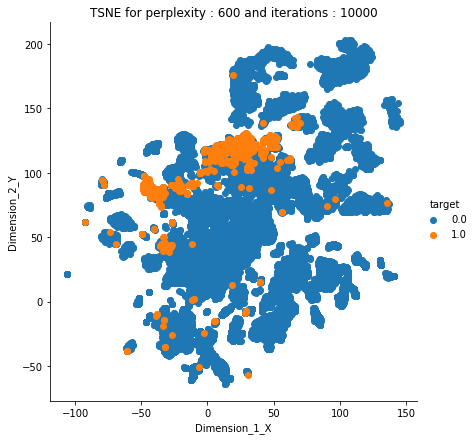

CPU times: user 12.7 s, sys: 11.4 s, total: 24.1 s
Wall time: 24 s


In [ ]:
%%time
run_tsne(new_standard_train_new_median_all_features_df,y_train_median_all_features,600,10000)

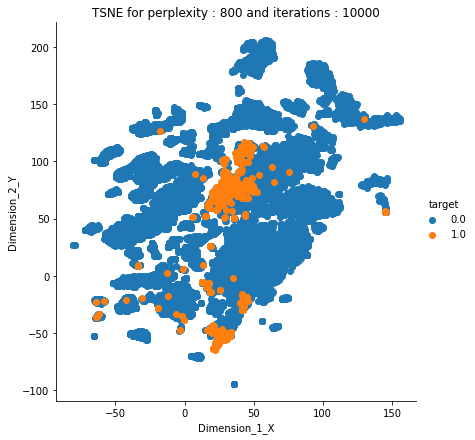

CPU times: user 12.9 s, sys: 11.6 s, total: 24.5 s
Wall time: 24.3 s


In [ ]:
%%time
run_tsne(new_standard_train_new_median_all_features_df,y_train_median_all_features,800,10000)

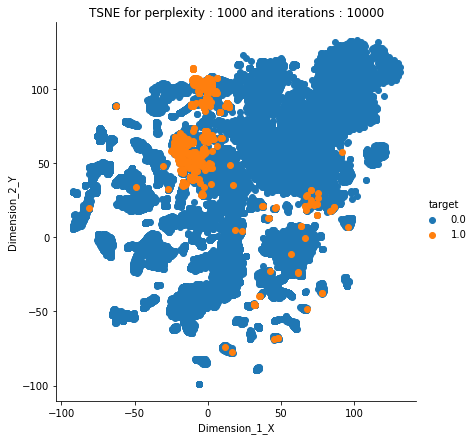

CPU times: user 12.9 s, sys: 11.7 s, total: 24.5 s
Wall time: 24.4 s


In [ ]:
%%time
run_tsne(new_standard_train_new_median_all_features_df,y_train_median_all_features,1000,10000)

**Observation :**<br>
1) Observe that different perplexities tSNE is able to differentiate all the data points into different groups, but it is not able to differentiate properly the surface failures from the downhole failures. If the surface and downhole failures are coming under the same category then they are shown in the same cluster.<br>
2) Not all the the surface and downhole features are coming under the same category.

### Perform a similar EDA on the outliers.

#### Here we take the outliers from the features that have been selected.
#### For each sensor we find the outliers that also classwise.
#### The issue is that there maybe high outliers here , but there maybe lower outliers here as well.

https://www.geeksforgeeks.org/interquartile-range-and-quartile-deviation-using-numpy-and-scipy/<br>
**Higher outlier = more than 1.5 ⋅ IQR above the third quartile.**<br>
**Lower outlier = less than 1.5 . IQR below the first quartile.**<br>
**The IQR is the difference between Q3 and Q1.**

In [ ]:
new_standard_train_median_all_features_df["target"]=y_train_median_all_features

In [ ]:
counter=0
main_dictionary=dict()
outliers=[]
list_of_outliers_features_classes=[]
for i in range(len(column_list)):
    d=dict()
    new_list=new_standard_train_median_all_features_df[new_standard_train_median_all_features_df.target==one_zero[i]]\
    [column_list[i]]      
    new_index=list(new_list.reset_index()["index"])
    QR1=np.percentile(new_list, 25)
    QR3=np.percentile(new_list, 75)
    IQR=QR3-QR1
    for index,value in zip(new_index,new_list):    
        if (value>(QR3+(IQR*1.5))) or (value<(QR1-(IQR*1.5))):
            counter=counter+1
            d.update({index:value})
            if index not in main_dictionary:
                main_dictionary.update({index:list(new_standard_train_median_all_features_df.loc[index])})
    list_of_outliers_features_classes.append(d)
    del d
    outliers.append(counter)
    counter=0

In [ ]:
print("Total number of data points that are outliers in atleast one or more than one feature : ",len(np.unique(list(main_dictionary.keys()))))

Total number of data points that are outliers in atleast one or more than one feature :  44635


In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:outliers[i] for i in index}

d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])
    
counter=0
new_column_list=[]
new_outliers_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_outliers_list.append(outliers[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_outliers_list.append(outliers[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 127 sensors.


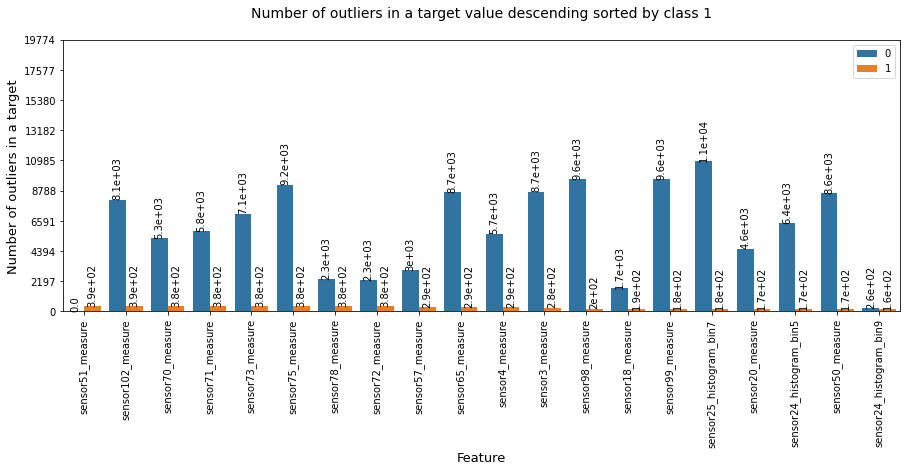

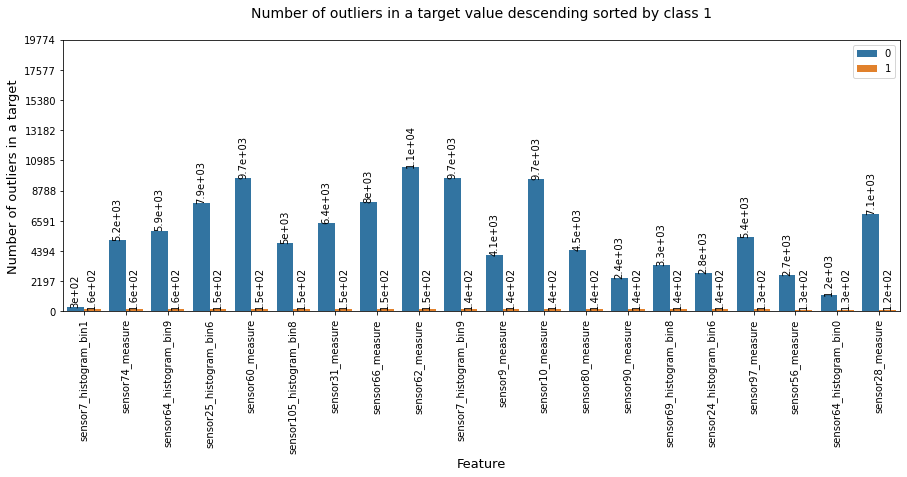

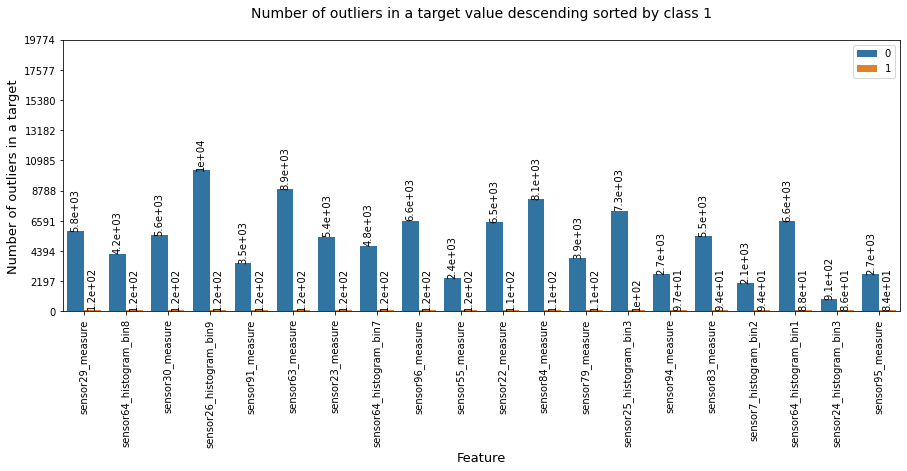

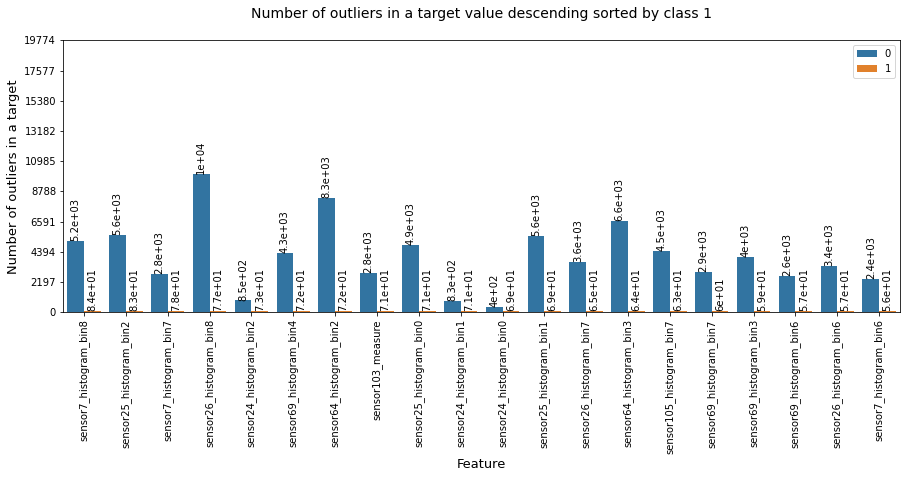

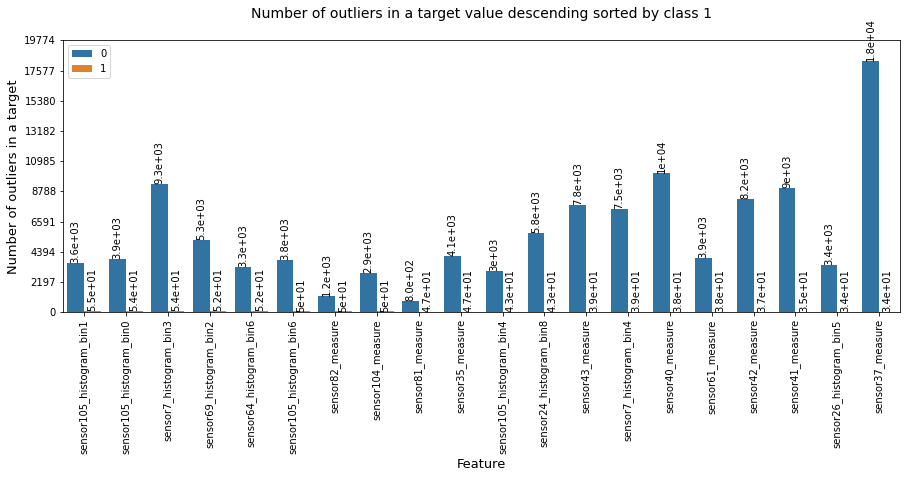

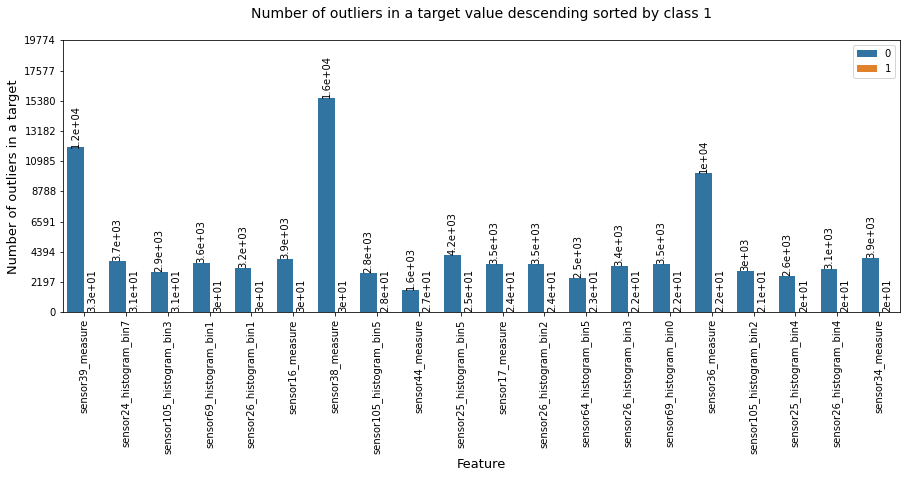

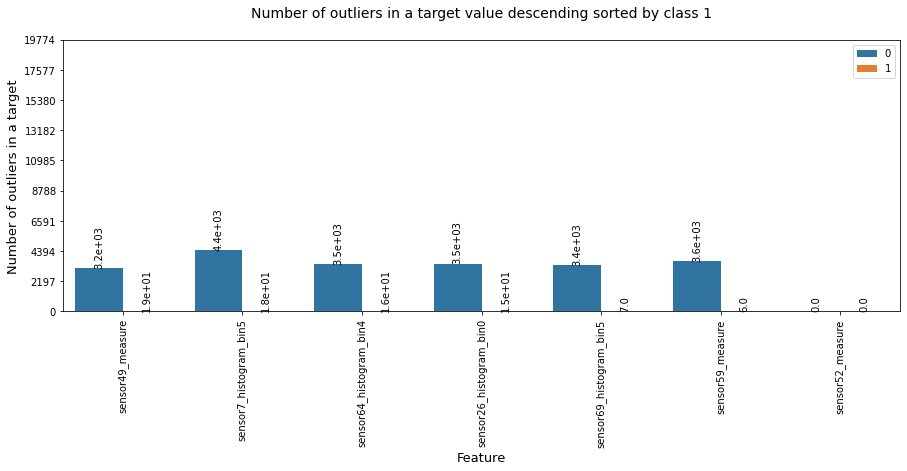

In [ ]:
try:
    plot_diagram(new_column_list,new_outliers_list,new_one_zero,"Number of outliers",1)
except ValueError:
    pass

**Observation :**<br>
Number of outliers for surface failures seem to be much more than the number of outliers for the downhole failures. 

### For every column feature, get the mean for the outliers for both class 0 and class 1.

In [ ]:
mean_0=[]
mean_1=[]
for i in range(0,len(list_of_outliers_features_classes),2):
    class_0=[ele for ele in list_of_outliers_features_classes[i].values()]
    class_1=[ele for ele in list_of_outliers_features_classes[i+1].values()]
    if (len(class_0)==0) :
        mean_0.append(0.01)
    else :
        mean_0.append(np.mean(class_0))

    if (len(class_1)==0):
        mean_1.append(0.01)
    else :
        mean_1.append(np.mean(class_1))

In [ ]:
median_0=[]
median_1=[]
for i in range(0,len(list_of_outliers_features_classes),2):
    class_0=[ele for ele in list_of_outliers_features_classes[i].values()]
    class_1=[ele for ele in list_of_outliers_features_classes[i+1].values()]
    if (len(class_0)==0) :
        median_0.append(0.01)
    else :
        median_0.append(np.median(class_0))

    if (len(class_1)==0):
        median_1.append(0.01)
    else :
        median_1.append(np.median(class_1))

### Plotting the mean and median for each feature class wise.

**10) Try and plot it’s histogram for both the target values.**

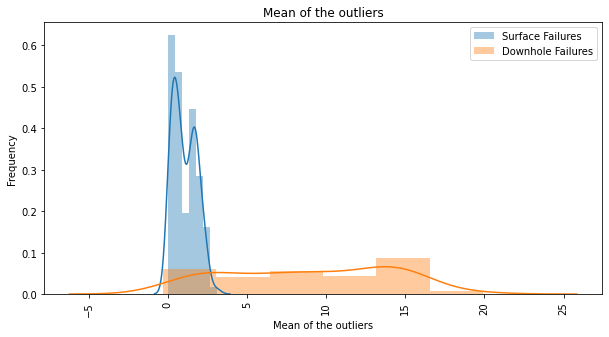

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(mean_0, hist=True, label="Surface Failures")
sns.distplot(mean_1, hist=True, label="Downhole Failures")
plt.title('Mean of the outliers')
plt.ylabel('Frequency')
plt.xlabel('Mean of the outliers')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**
The distribution of the outlier is similar to the distribution of the features.<br>
Downhole outliers have more variance.<br>
Whereas the majority of the surface outliers are all concentrated near the same value 0.

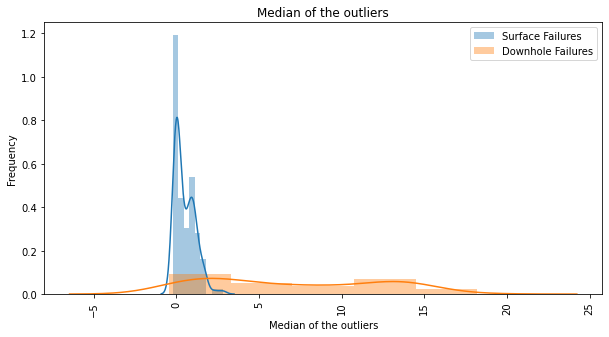

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(median_0, hist=True, label="Surface Failures")
sns.distplot(median_1, hist=True, label="Downhole Failures")
plt.title('Median of the outliers')
plt.ylabel('Frequency')
plt.xlabel('Median of the outliers')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**
The distribution of the outlier is similar to the distribution of the features.<br>
Downhole outliers have more variance.<br>
Whereas the majority of the surface outliers are all concentrated near the same value 0.<br>
**Similar behaviour in box plot and voilin plot.**

**11) Try box plot / voilin plot to visualize the outliers.**

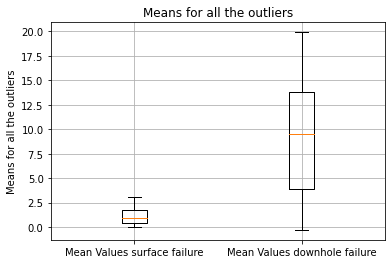

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([mean_0, mean_1])
plt.title('Means for all the outliers')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the outliers')
plt.grid()
plt.show()

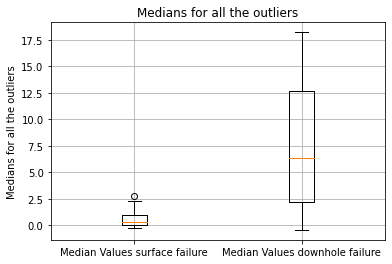

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([median_0, median_1])
plt.title('Medians for all the outliers')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the outliers')
plt.grid()
plt.show()

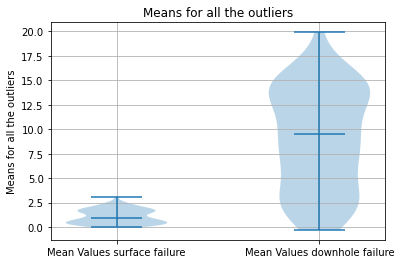

In [ ]:
plt.violinplot([mean_0, mean_1], showmeans=False, showmedians=True)
plt.title('Means for all the outliers')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the outliers')
plt.grid()
plt.show()

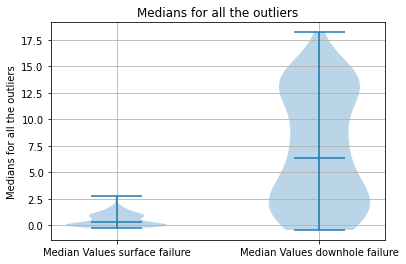

In [ ]:
plt.violinplot([median_0, median_1], showmeans=False, showmedians=True)
plt.title('Medians for all the outliers')
plt.xticks([1,2],('Median Values surface failure','Median Values downhole failure'))
plt.ylabel('Medians for all the outliers')
plt.grid()
plt.show()

**All the outliers are very seem to be very similar.**

### For the given data points and features enter new features that tell if these values were previously np.NaN or not.

In [ ]:
new_standard_train_median_all_features_df.drop("target",axis=1,inplace=True)

In [ ]:
nan_standard_train_median_all_features_df=fuse_dataframe_nan(new_standard_train_median_all_features_df,nan_or_not,set(new_column_list))
nan_standard_train_median_all_features_df["target"]=y_train_median_all_features
nan_standard_train_median_all_features_df.head()

,sensor7_histogram_bin2,sensor17_measure,sensor105_histogram_bin3,sensor69_histogram_bin7,sensor64_histogram_bin2,sensor40_measure,sensor26_histogram_bin6,sensor73_measure,sensor78_measure,sensor64_histogram_bin0,...,sensor26_histogram_bin8,sensor7_histogram_bin5,sensor70_measure,sensor61_measure,sensor7_histogram_bin8,sensor4_measure,sensor26_histogram_bin9,sensor75_measure,sensor9_measure,target
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Now this is the problem out of the given data that we have , we select the features that have more than 50% np.NaNs

In [ ]:
counter=0
for column in new_standard_train_median_all_features_df.columns.values:
    try :
        percent_of_nan=nan_standard_train_median_all_features_df[column].value_counts()[1]/\
                (nan_standard_train_median_all_features_df[column].value_counts()[0]+\
                 nan_standard_train_median_all_features_df[column].value_counts()[1])
        if (percent_of_nan>.5) :
            counter=counter+1
            print(column,"  :  ",percent_of_nan)
    except :
        pass
print("Overall : ",counter," features with % of na's more than 50%")

sensor38_measure   :   0.6605416666666667
sensor39_measure   :   0.7348958333333333
sensor40_measure   :   0.77375
sensor41_measure   :   0.7967916666666667
sensor42_measure   :   0.8133125
sensor43_measure   :   0.822
Overall :  6  features with % of na's more than 50%


<h3>4) Impute np.NaN with median and then perform Adasyn on the values.</h3>

In [10]:
data_type="adasyn_data"

In [ ]:
train_adasyn_all_features=train.copy()
y_train_adasyn_all_features=y_train.copy()
test_adasyn_all_features=test.copy()
y_test_adasyn_all_features=y_test.copy()

In [ ]:
train_adasyn_all_features.shape

(48000, 170)

In [ ]:
y_train_adasyn_all_features.shape

(48000,)

In [ ]:
test_adasyn_all_features.shape

(12000, 170)

In [ ]:
y_test_adasyn_all_features.shape

(12000,)

In [ ]:
for i ,j in zip(train_adasyn_all_features.columns.values,test_adasyn_all_features.columns.values):
    if (i!=j):
        print(i," : ",j)

In [ ]:
train_adasyn_all_features,y_train_adasyn_all_features=reset_index(train_adasyn_all_features,y_train_adasyn_all_features)
test_adasyn_all_features,y_test_adasyn_all_features=reset_index(test_adasyn_all_features,y_test_adasyn_all_features)

**Filling the np.NaN values with the median of the category this time.**

In [ ]:
l=[]
for ele in train_adasyn_all_features["sensor4_measure"]:
    if np.isnan(ele):
        pass
    else:
        l.append(ele) 
np.median(l)

126.0

In [ ]:
train_adasyn_all_features["sensor4_measure"].median()

126.0

Both are the same so the pandas.series.median() function ignores the value that has the np.NaN and does not even count it.<br>
Divide the whole dataframe into the number of categories that we have and then only enter the median for that feature for that particular category.

In [ ]:
train_adasyn_all_features,y_train_adasyn_all_features,test_adasyn_all_features,y_test_adasyn_all_features=\
impute_median_for_train_n_test_as_per_train(train_adasyn_all_features,
                                          y_train_adasyn_all_features,
                                          test_adasyn_all_features,
                                          y_test_adasyn_all_features,data_type)

In [ ]:
train_adasyn_all_features,y_train_adasyn_all_features=reset_index(train_adasyn_all_features,y_train_adasyn_all_features)
test_adasyn_all_features,y_test_adasyn_all_features=reset_index(test_adasyn_all_features,y_test_adasyn_all_features)

**Standardise the dataframe**

In [ ]:
standard_train_adasyn_all_features_df,standard_test_adasyn_all_features_df=standardize_test_n_train_wrt_train(train_adasyn_all_features,test_adasyn_all_features,data_type)

In [ ]:
standard_train_adasyn_all_features_df.shape

(48000, 170)

In [ ]:
standard_test_adasyn_all_features_df.shape

(12000, 170)

In [ ]:
y_train_adasyn_all_features.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: target, dtype: float32

In [ ]:
y_train_adasyn_all_features.tail()

47995    1.0
47996    1.0
47997    1.0
47998    1.0
47999    1.0
Name: target, dtype: float32

In [ ]:
"target" in standard_train_adasyn_all_features_df.columns

False

**Perform Adasyn**

In [ ]:
from collections import Counter
from imblearn.over_sampling import ADASYN

ada = ADASYN(random_state=42,sampling_strategy=.75,n_jobs=-1)
x_adasyn, y_adasyn = ada.fit_resample(standard_train_adasyn_all_features_df, y_train_adasyn_all_features)
print("done")

done


In [ ]:
x_adasyn.shape

(82593, 170)

In [ ]:
y_adasyn.shape

(82593,)

**Truncated SVD to get the best features**

In [ ]:
#https://stackoverflow.com/questions/50796024/feature-variable-importance-after-a-pca-analysis

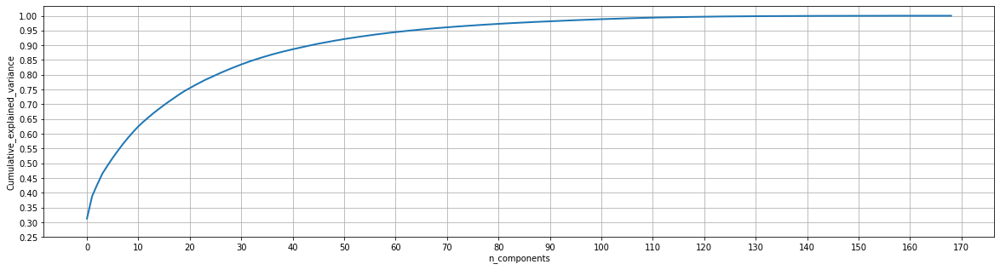

TruncatedSVD(n_components=169)

In [ ]:
truncated_svd(x_adasyn,169)

**I choose 120 components to describe my data as 120 components explain atleast 99% variance of the total data.** 

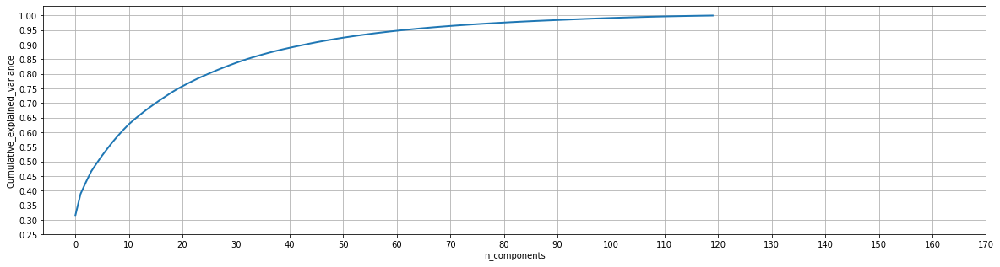

In [ ]:
svd=truncated_svd(x_adasyn,120)

**For the 120 principal components using svd.explained_variance_ratio_ find the variance distribution.**

In [ ]:
print(len(svd.explained_variance_ratio_))

120


In [ ]:
np.sum(svd.explained_variance_ratio_)

0.9965708

In [ ]:
svd.components_.shape

(120, 170)

In [ ]:
#number of features 
svd.components_.shape[1]

170

In [ ]:
#number of components
svd.components_.shape[0]

120

**For the 120 principal components find the feature importance.**

In [ ]:
set_number_of_features=120

### Trying Forward Feature selection

**Here, in forward feature selection, out of 170 features even if I choose to select 10 features only , still it will take a lot of time.<br>
Therefore I go with recursive feature elimination.<br>
Using Recursive Feature Elimination, I can get the features that I need.**

In [ ]:
x_adasyn.shape

(82593, 170)

In [ ]:
%%time
new_x_adasyn_df=recursive_feature_elimination(
    x_adasyn,
    y_adasyn,
    int(set_number_of_features+np.round((len(train.columns.values)-set_number_of_features)/2))
)

Rankings :  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Selected indices :
 1    170
dtype: int64
CPU times: user 5min 31s, sys: 367 ms, total: 5min 31s
Wall time: 9min 36s


In [ ]:
new_x_adasyn_df.head()

,sensor1_measure,sensor2_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,...,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure
0,-0.209185,-0.09191,-0.432133,-0.078741,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,...,-0.104268,-0.025683,-0.045527,-0.128090,-0.199055,-0.168927,-0.201433,-0.163656,-0.020227,-0.024286
1,0.226385,-0.09191,2.314107,0.276872,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,...,0.064536,0.132146,0.278645,0.573132,0.835714,-0.017869,-0.288574,-0.170285,-0.020227,-0.024286
2,-0.411601,-0.09191,-0.432133,-0.108583,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.114391,...,-0.385732,-0.392813,-0.383465,-0.370167,-0.310736,-0.198682,-0.307802,-0.170285,-0.020227,-0.024286
3,0.027280,-0.09191,-0.432131,0.303606,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,...,0.283329,0.340889,0.186015,0.040885,-0.036827,-0.114241,0.062849,-0.076776,-0.020227,-0.024286
4,-0.132515,-0.09191,-0.432132,0.031300,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,...,-0.193390,-0.200260,-0.163322,0.021205,-0.126184,-0.131916,0.376297,1.234393,-0.020227,-0.024286


**Try spearman corelation coefficient to find out co relation. (It is good for cause and affect analysis but it might not be of much use when we find that our features are dependent on other features, we expect our features to be independent of each other.).**

In [ ]:
%%time
spearman=select_spearman(new_x_adasyn_df,int(set_number_of_features+np.floor((len(train.columns.values)-set_number_of_features)/2)))

If I take the data having correlation between only -.1 and .1 range then I get  1  features.
If I take the data having correlation between only -.90 and .90 range then I get  80  features.
If I take the data having correlation between only -.95 and .95 range then I get  100  features.
If I take the data having correlation between only -.97 and .97 range then I get  114  features.
If I take the data having correlation between only -.98 and .98 range then I get  118  features.
If I take the data having correlation between only -.99 and .99 range then I get  144  features.
If I take the data having correlation between only -.999 and .999 range then I get  164  features.
CPU times: user 30.2 s, sys: 126 ms, total: 30.3 s
Wall time: 30.2 s


In [ ]:
new_x_adasyn_df=perform_spearman(new_x_adasyn_df,spearman,.99)

In [ ]:
new_x_adasyn_df.head()

,sensor2_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,...,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure
0,-0.09191,-0.432133,-0.078741,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,-0.179786,...,-0.104268,-0.025683,-0.045527,-0.128090,-0.199055,-0.168927,-0.201433,-0.163656,-0.020227,-0.024286
1,-0.09191,2.314107,0.276872,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,-0.175033,...,0.064536,0.132146,0.278645,0.573132,0.835714,-0.017869,-0.288574,-0.170285,-0.020227,-0.024286
2,-0.09191,-0.432133,-0.108583,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.114391,-0.176506,...,-0.385732,-0.392813,-0.383465,-0.370167,-0.310736,-0.198682,-0.307802,-0.170285,-0.020227,-0.024286
3,-0.09191,-0.432131,0.303606,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,-0.180203,...,0.283329,0.340889,0.186015,0.040885,-0.036827,-0.114241,0.062849,-0.076776,-0.020227,-0.024286
4,-0.09191,-0.432132,0.031300,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,-0.180360,...,-0.193390,-0.200260,-0.163322,0.021205,-0.126184,-0.131916,0.376297,1.234393,-0.020227,-0.024286


In [ ]:
new_x_adasyn_df.shape

(82593, 144)

In [ ]:
y_adasyn.shape

(82593,)

In [ ]:
new_standard_test_adasyn_all_features_df=standard_test_adasyn_all_features_df[new_x_adasyn_df.columns.values]
new_standard_test_adasyn_all_features_df.head()

,sensor2_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,...,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure
0,-0.09191,-0.432133,-0.078741,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,-0.180209,...,0.057907,0.125870,0.099242,0.163299,0.280228,-0.005584,-0.208069,-0.168607,-0.020227,-0.024286
1,-0.09191,2.314107,0.135746,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,-0.180150,...,0.138756,0.167661,0.197075,0.406800,0.754810,0.221194,1.813683,0.117853,-0.020227,-0.024286
2,-0.09191,-0.432133,-0.115422,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,-0.180461,...,-0.386519,-0.393192,-0.383560,-0.370202,-0.310778,-0.198829,-0.307802,-0.170285,-0.020227,-0.024286
3,-0.09191,2.314107,-0.114800,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,-0.180276,...,-0.385988,-0.392942,-0.382904,-0.369753,-0.310692,-0.198829,-0.307802,-0.170285,-0.020227,0.206916
4,-0.09191,2.314107,0.041869,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,-0.180369,...,-0.103468,-0.047627,0.104776,0.244433,0.125151,-0.056531,0.334861,0.260346,-0.020227,-0.024286


In [ ]:
#new_x_adasyn_df.to_pickle("new_x_adasyn_df.pickle")
#y_adasyn.to_pickle("y_adasyn.pickle")

#new_standard_test_adasyn_all_features_df.to_pickle("new_standard_test_adasyn_all_features_df.pickle")
#y_test_adasyn_all_features.to_pickle("y_test_adasyn_all_features.pickle")

In [73]:
#new_x_adasyn_df=pd.read_pickle("/content/gdrive/My Drive/new_x_adasyn_df.pickle")
#y_adasyn=pd.read_pickle("/content/gdrive/My Drive/y_adasyn.pickle")
                                   
#new_standard_test_adasyn_all_features_df=pd.read_pickle("/content/gdrive/My Drive/new_standard_test_adasyn_all_features_df.pickle")
#y_test_adasyn_all_features=pd.read_pickle("/content/gdrive/My Drive/y_test_adasyn_all_features.pickle")

In [ ]:
np.save('new_x_adasyn_df_columns.npy',new_x_adasyn_df.columns.values)

In [74]:
new_x_adasyn_df["target"]=y_adasyn
new_x_adasyn_df.head()

,sensor2_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin8,sensor7_histogram_bin9,sensor9_measure,sensor10_measure,sensor11_measure,sensor16_measure,sensor18_measure,sensor19_measure,sensor20_measure,sensor21_measure,sensor22_measure,sensor23_measure,sensor24_histogram_bin0,sensor24_histogram_bin1,sensor24_histogram_bin2,sensor24_histogram_bin3,sensor24_histogram_bin4,sensor24_histogram_bin5,sensor24_histogram_bin6,sensor24_histogram_bin7,sensor24_histogram_bin8,sensor24_histogram_bin9,sensor25_histogram_bin0,sensor25_histogram_bin3,sensor25_histogram_bin4,sensor25_histogram_bin5,sensor25_histogram_bin6,...,sensor73_measure,sensor74_measure,sensor75_measure,sensor76_measure,sensor77_measure,sensor78_measure,sensor79_measure,sensor80_measure,sensor81_measure,sensor82_measure,sensor83_measure,sensor84_measure,sensor85_measure,sensor86_measure,sensor87_measure,sensor88_measure,sensor90_measure,sensor91_measure,sensor96_measure,sensor97_measure,sensor98_measure,sensor99_measure,sensor100_measure,sensor101_measure,sensor102_measure,sensor103_measure,sensor104_measure,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure,target
0,-0.09191,-0.432133,-0.078741,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,-0.179786,-0.231174,-0.094145,-0.203189,-0.156318,-0.029573,-0.055001,-0.022185,-0.013152,-0.247540,-0.086423,-0.011973,-0.03992,-0.014018,-0.170004,-0.250903,-0.026929,-0.019102,-0.025508,-0.03445,-0.027878,-0.027653,0.019798,-0.204953,-0.223919,-0.012042,-0.039722,-0.127249,-0.271058,-0.099884,-0.118707,...,-0.193647,-0.026793,-0.066670,-0.033689,-0.238277,-0.123843,-0.216425,-0.182974,-0.018598,-0.025464,-0.008014,-0.083804,-0.009154,-0.026838,-0.02539,-0.02668,0.223798,-0.043440,0.012980,-0.005788,-0.187032,-0.127898,-0.018679,-0.027278,-0.210557,-0.165126,-0.172052,-0.258247,-0.167010,-0.104268,-0.025683,-0.045527,-0.128090,-0.199055,-0.168927,-0.201433,-0.163656,-0.020227,-0.024286,0.0
1,-0.09191,2.314107,0.276872,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.115367,-0.175033,0.318588,0.527328,0.351014,0.110561,-0.029573,-0.055001,-0.022185,-0.013152,0.315152,-0.086423,-0.011973,-0.03992,-0.014018,-0.021180,1.006312,-0.026929,-0.019102,-0.025508,-0.03445,-0.027878,-0.083133,1.041712,-0.088098,0.079001,-0.012042,-0.037172,-0.123660,-0.350404,0.719456,-0.082490,...,-0.114101,-0.026793,0.007628,-0.033689,0.514403,0.834765,0.469907,0.623494,-0.018598,-0.025464,-0.008014,-0.083804,-0.009154,-0.026838,-0.02539,-0.02668,1.341602,2.469441,0.626016,0.316323,-0.187032,-0.127898,-0.018679,-0.027278,0.266704,0.576310,0.628487,0.437684,0.093053,0.064536,0.132146,0.278645,0.573132,0.835714,-0.017869,-0.288574,-0.170285,-0.020227,-0.024286,0.0
2,-0.09191,-0.432133,-0.108583,-0.057533,-0.056429,-0.010456,-0.028788,-0.057799,-0.114391,-0.176506,-0.336292,-0.427550,-0.352896,-0.156730,-0.029573,-0.055001,-0.022185,-0.013152,-0.318004,-0.086423,-0.011973,-0.03992,-0.014018,-0.167507,-0.241253,-0.026929,-0.019102,-0.025508,-0.03445,-0.027878,-0.083133,-0.330240,-0.295079,-0.263661,-0.012042,-0.096970,-0.133810,-0.361153,-0.326799,-0.097644,...,-0.226291,-0.026793,-0.067530,-0.033689,-0.238277,-0.588565,-0.315599,-0.182974,-0.018598,-0.025464,-0.007931,-0.067775,-0.009154,-0.026838,-0.02539,-0.02668,-0.475921,-0.511690,-0.341535,-0.300021,-0.173687,-0.127553,-0.018679,-0.027278,-0.224763,-0.355790,-0.398668,-0.298779,-0.305851,-0.385732,-0.392813,-0.383465,-0.370167,-0.310736,-0.198682,-0.307802,-0.170285,-0.020227,-0.024286,0.0
3,-0.09191,-0.432131,0.303606,-0.057533,-0.0564

<h3>Compare the target 0 and target 1 mean values feature wise after median value imputing</h3>

In [ ]:
column_list=[]
mean_list=[]
one_zero=[]
for column in list(new_x_adasyn_df.columns.values):
    if column!="target":
        column_list.append(column)
        one_zero.append(0)
        mean_list.append(new_x_adasyn_df[column][new_x_adasyn_df.target==0].mean())

        column_list.append(column)
        one_zero.append(1)
        mean_list.append(new_x_adasyn_df[column][new_x_adasyn_df.target==1].mean())

**Find the features where the difference between the means of the two classes is more than .15<br>
descending sorted by class 1**

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:mean_list[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
counter=0
new_column_list=[]
new_mean_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_mean_list.append(mean_list[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_mean_list.append(mean_list[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 144 sensors.


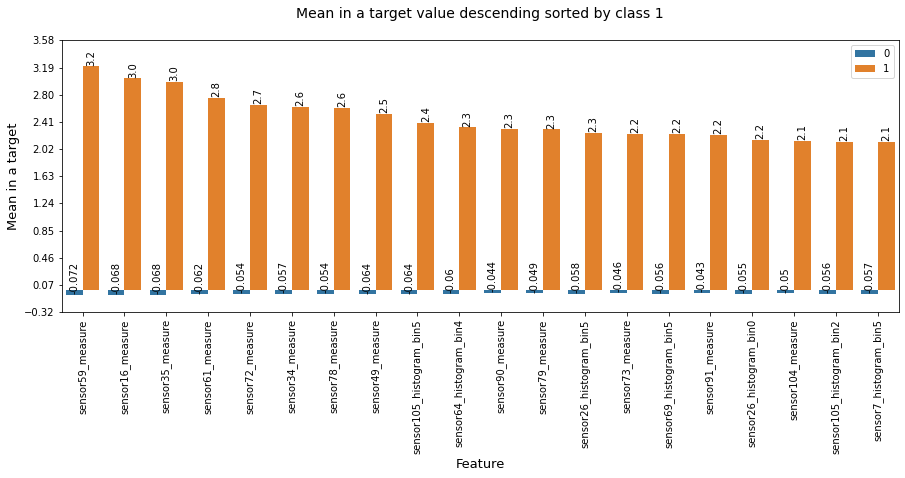

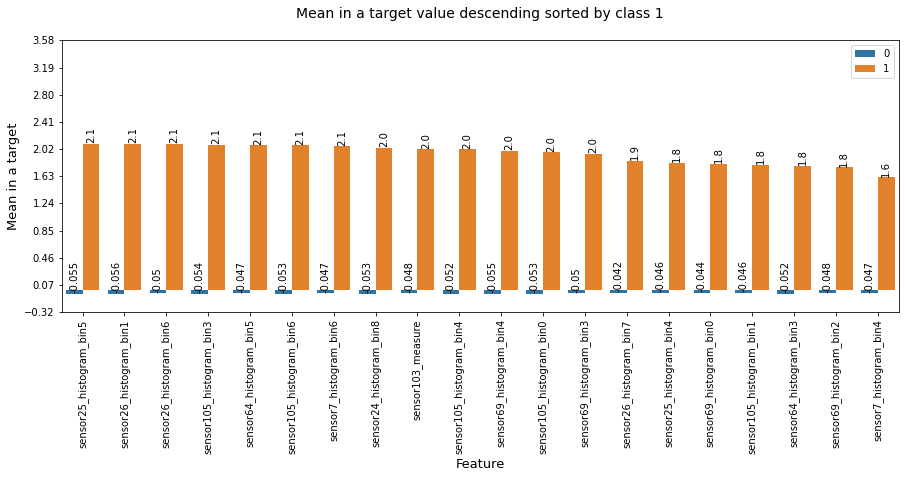

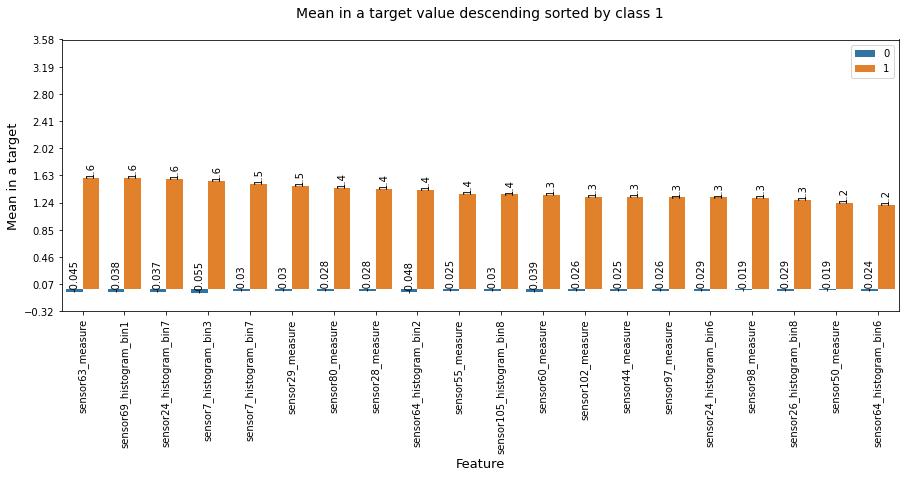

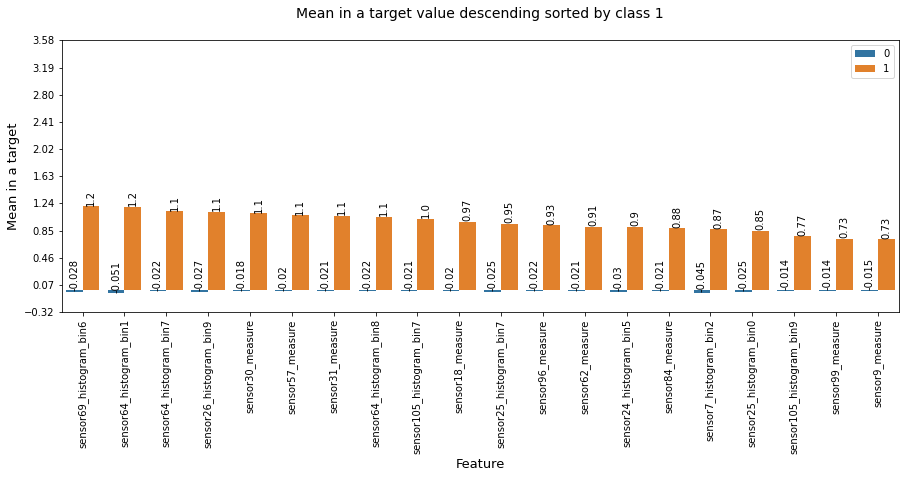

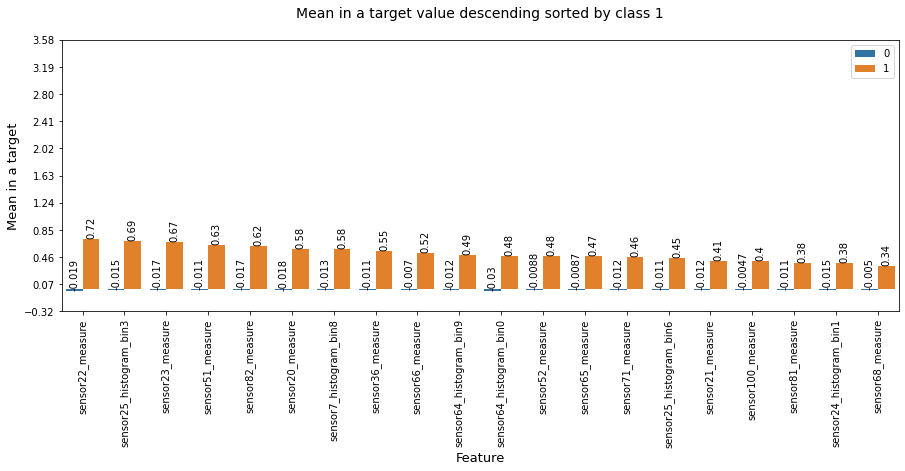

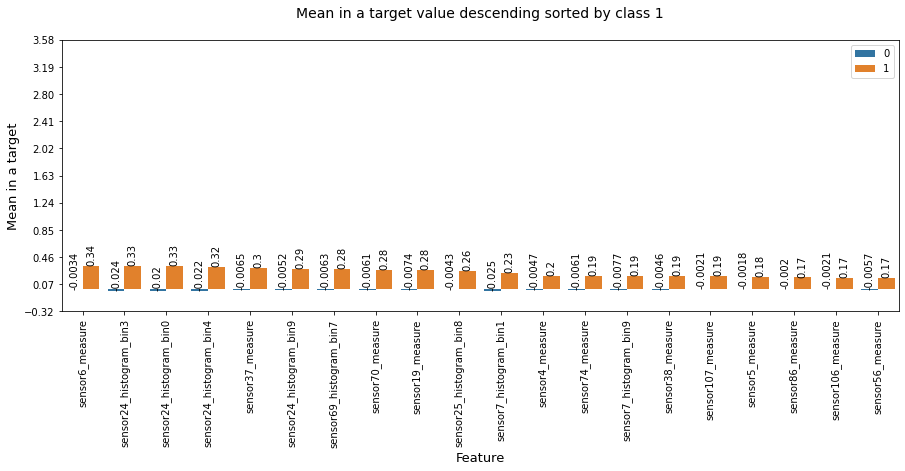

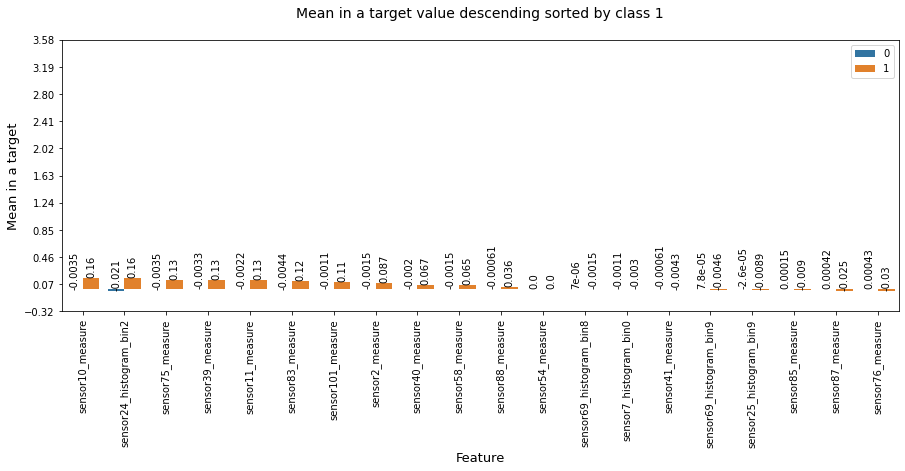

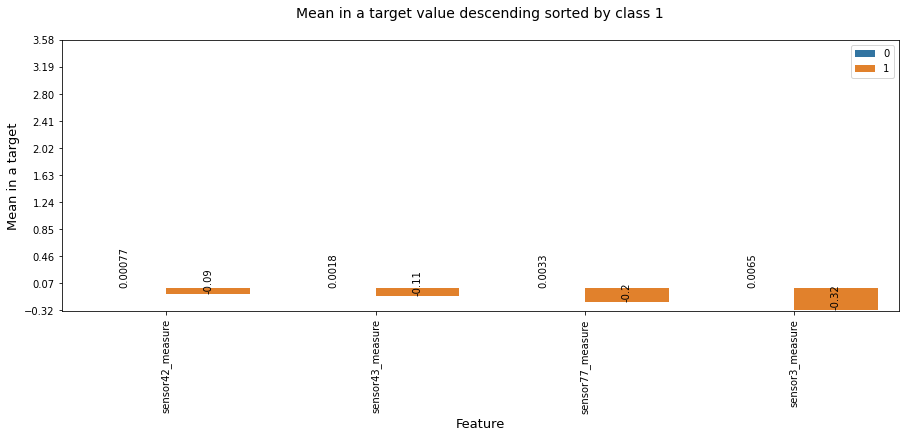

In [ ]:
try:
    plot_diagram(new_column_list,new_mean_list,new_one_zero,"Mean",1)
except ValueError:
    pass

**Observation** : Observe that there is a significant difference between the median imputed adasyn means of the surface failures and the downhole failures.<br>
Out of the selected features observe that the most of the features have a larger mean value for the downhole failure rather than that of the surface failures.

In [ ]:
counter=0
mean_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    
    if (np.abs(np.abs(mean_list[i])-np.abs(mean_list[i-1]))>=.15):
        mean_higher_reading.append(mean_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        mean_higher_reading.append(mean_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])


        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between Mean readings of surface and downhole failures.".format(counter))

So we have approximate 123 sensor that show significant difference (> .15) between Mean readings of surface and downhole failures.


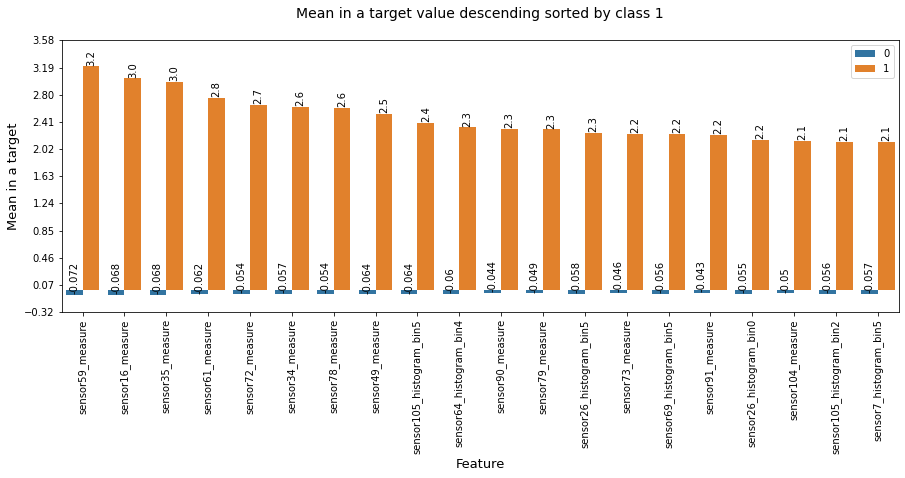

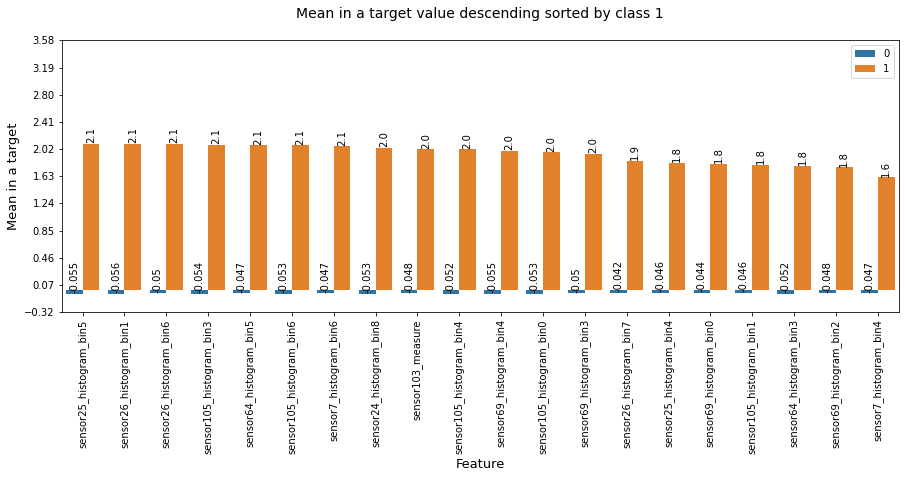

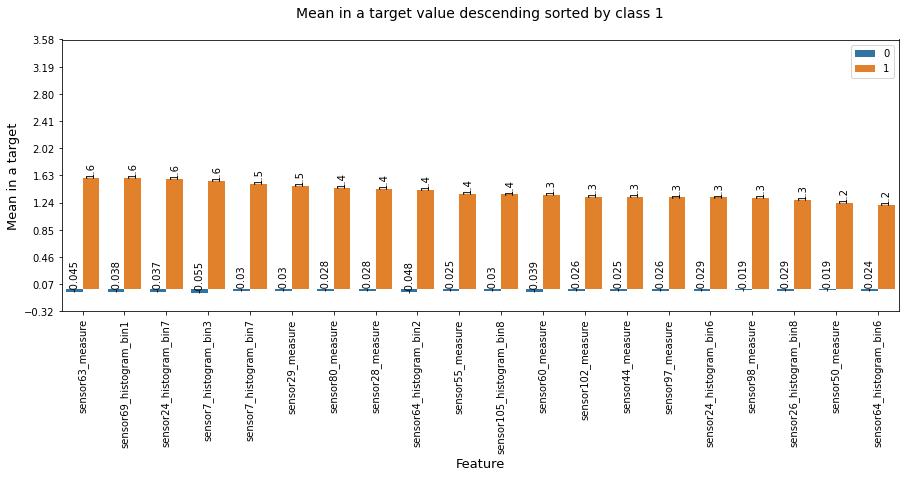

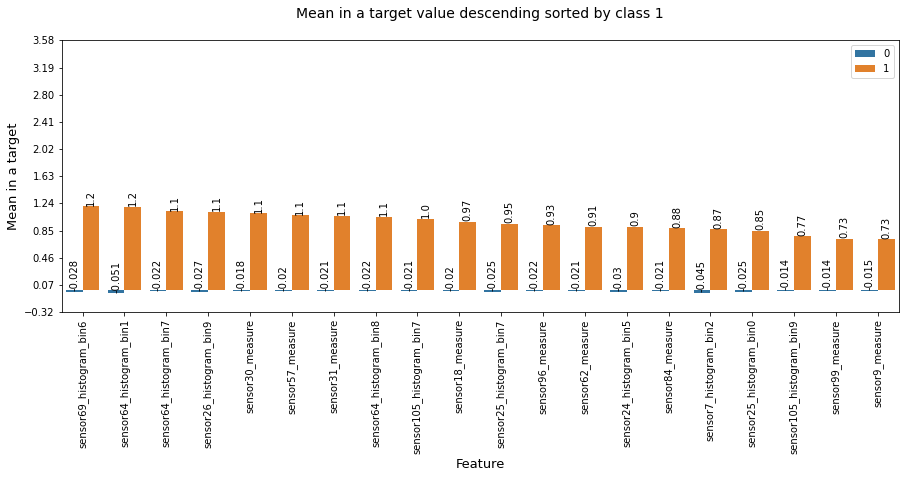

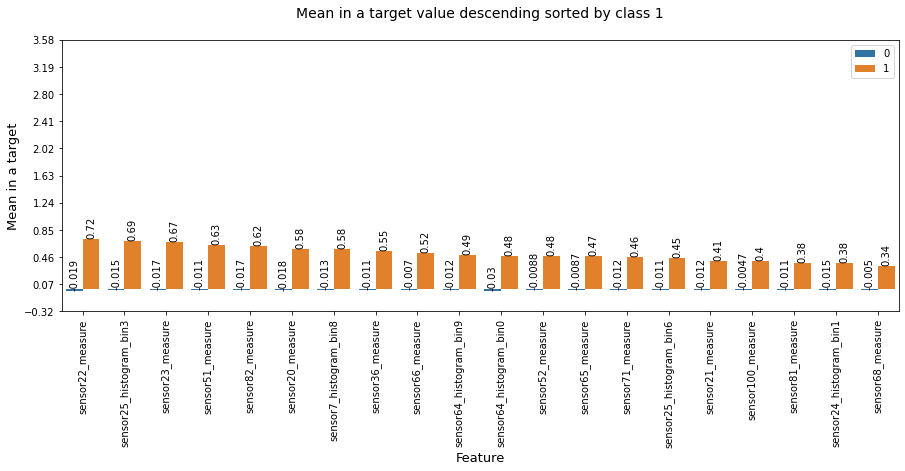

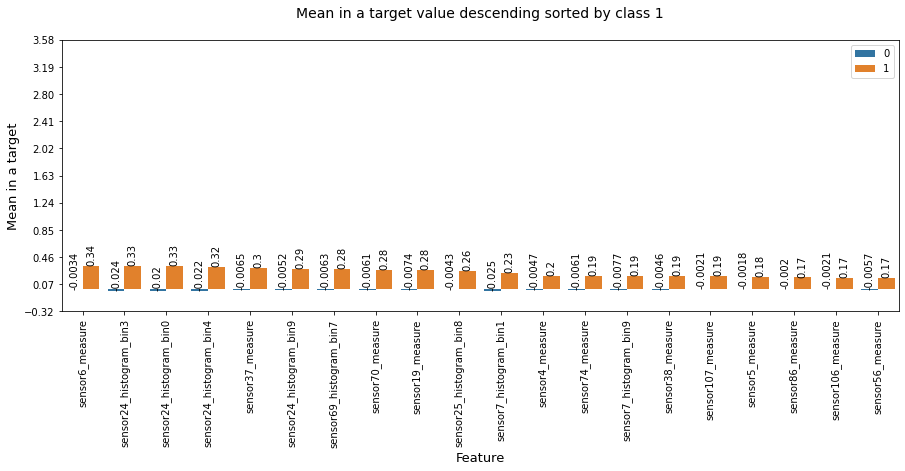

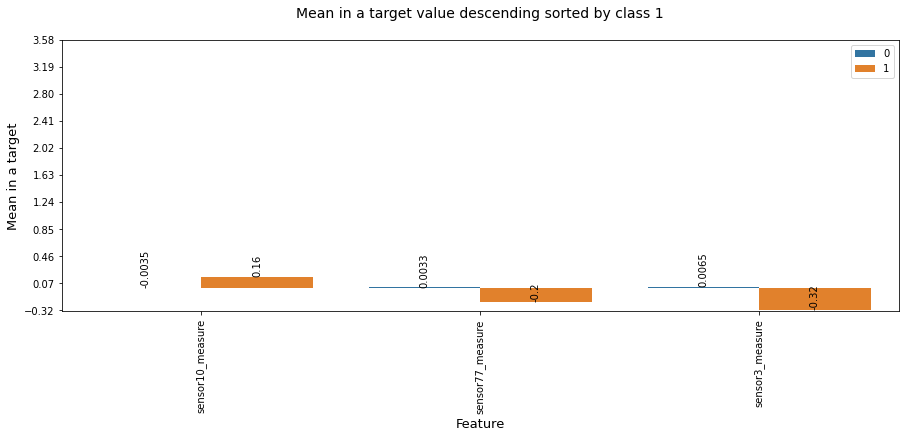

In [ ]:
try:
    plot_diagram(column_higher_reading,mean_higher_reading,one_zero_higher_reading,"Mean",1)
except ValueError:
    pass

<h3>Compare the target 0 and target 1 Median values feature wise after median value imputing</h3>

In [ ]:
column_list=[]
median_list=[]
one_zero=[]


for column in list(new_x_adasyn_df.columns.values):
    
    if column!="target":

        column_list.append(column)
        one_zero.append(0)
        median_list.append(new_x_adasyn_df[column][new_x_adasyn_df.target==0].median())

        column_list.append(column)
        one_zero.append(1)
        median_list.append(new_x_adasyn_df[column][new_x_adasyn_df.target==1].median())

**Find the features where the difference between the medians of the two classes is more than .15<br>
descending sorted by class 1**

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:median_list[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
counter=0
new_column_list=[]
new_median_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_median_list.append(median_list[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_median_list.append(median_list[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 144 sensors.


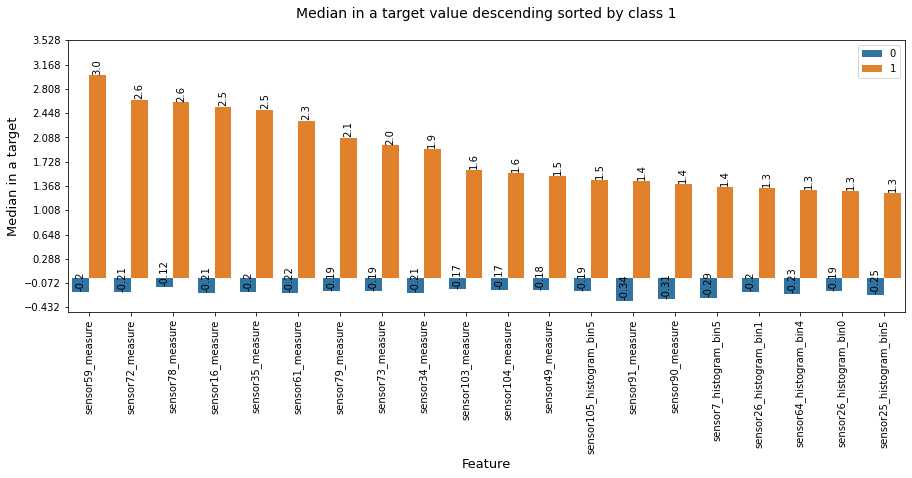

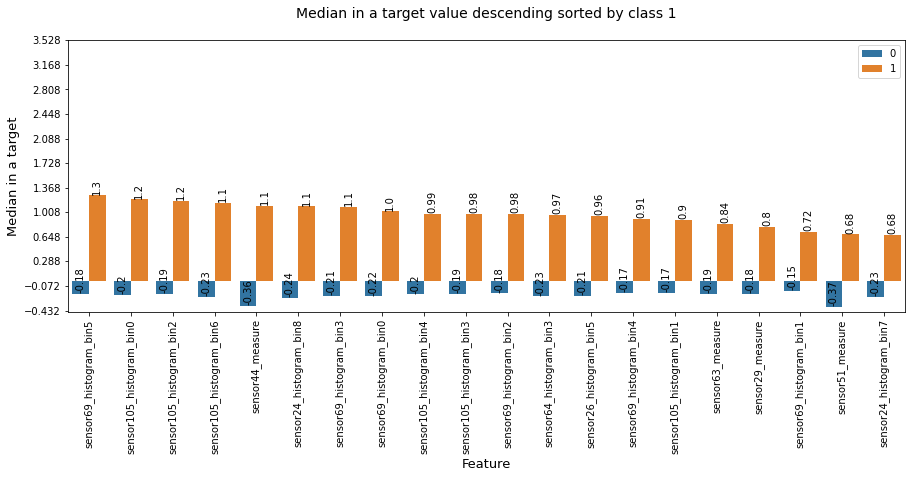

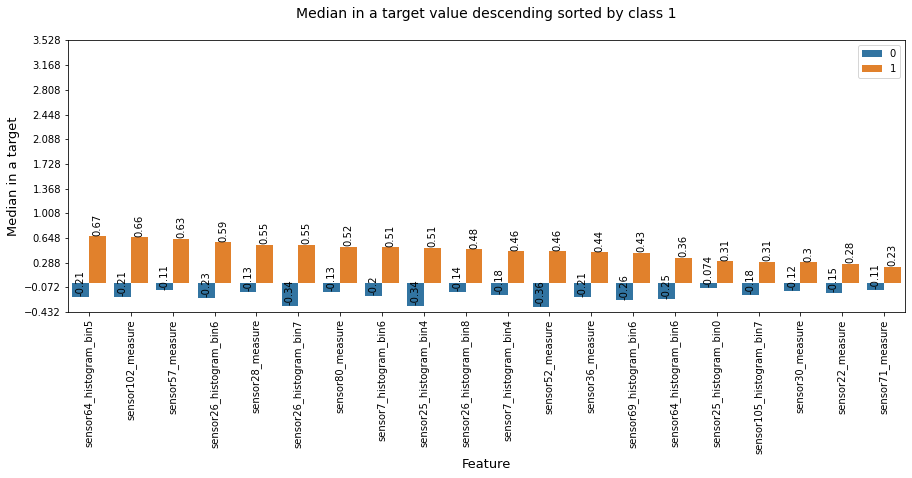

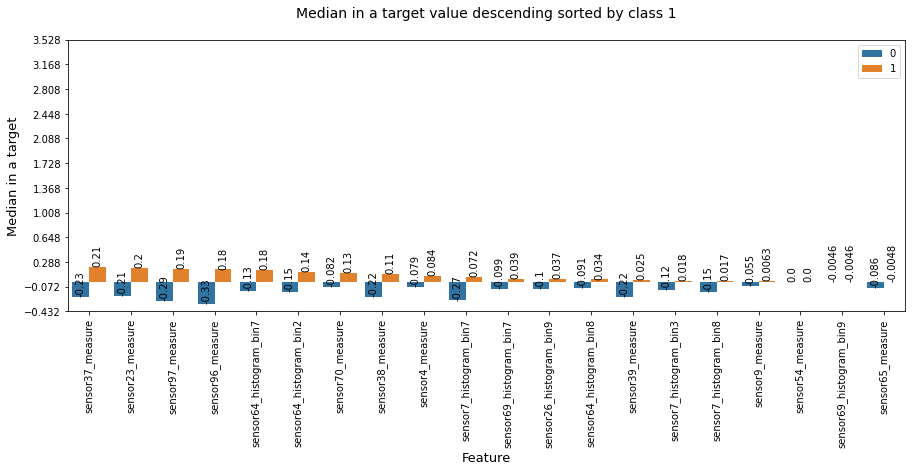

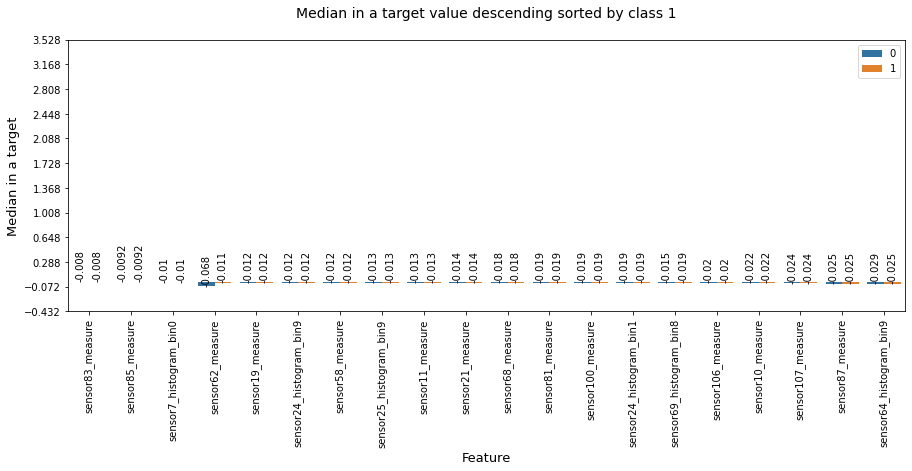

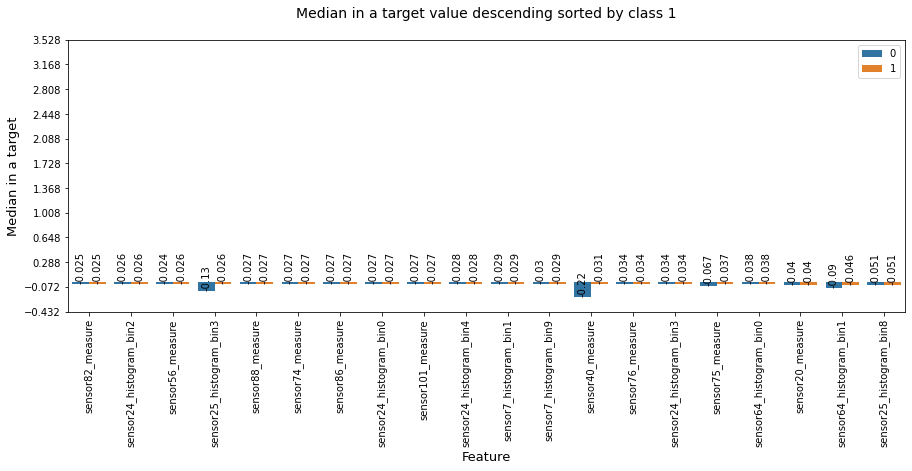

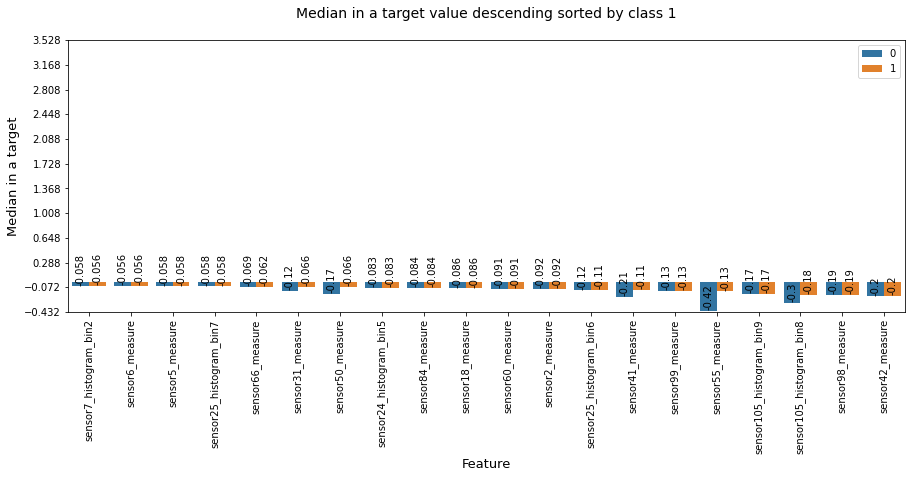

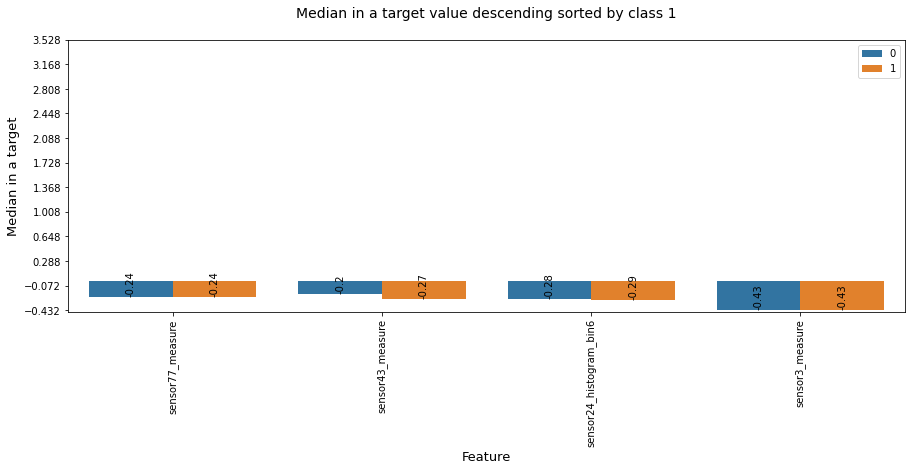

In [ ]:
try:
    plot_diagram(new_column_list,new_median_list,new_one_zero,"Median",1)
except ValueError:
    pass

**Observation** : Observe that there is a significant difference between the median imputed adasyn median of the surface failures and the downhole failures.<br>
As this is a median , so the values are lesser as compared to the mean.

In [ ]:
counter=0
median_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    
    if (np.abs(np.abs(median_list[i])-np.abs(median_list[i-1]))>=.15):
        median_higher_reading.append(median_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        median_higher_reading.append(median_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])


        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between median readings of surface and downhole failures.".format(counter))

So we have approximate 59 sensor that show significant difference (> .15) between median readings of surface and downhole failures.


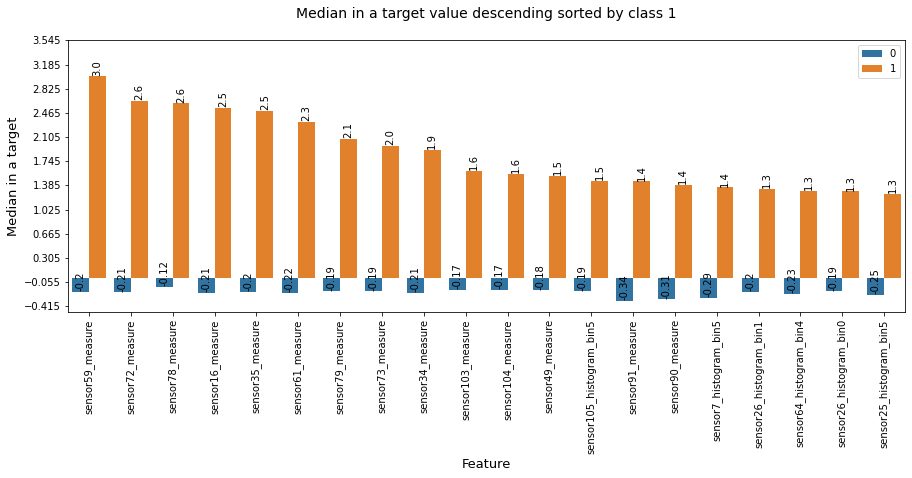

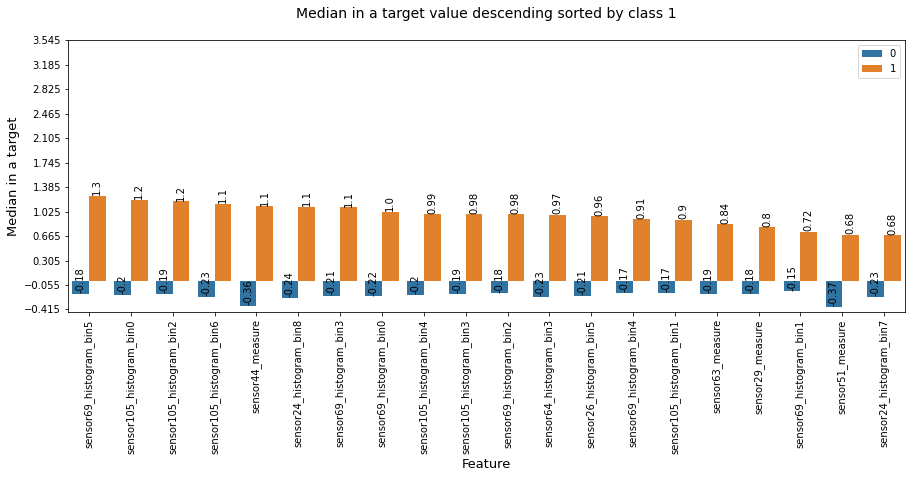

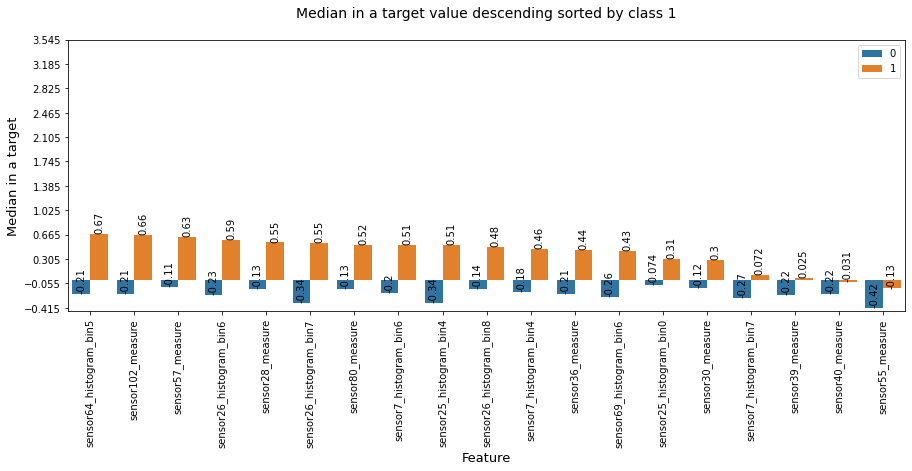

In [ ]:
try:
    plot_diagram(column_higher_reading,median_higher_reading,one_zero_higher_reading,"Median",1)
except ValueError:
    pass

### Basic Classifier

In [ ]:
new_x_adasyn_df.drop("target",axis=1,inplace=True)

In [ ]:
print(dummy_classifier_based_on_median(new_x_adasyn_df.loc[72124],
                                       column_list,
                                       median_list))

Predicted surface failure.
[92, 52]


In [ ]:
print(dummy_classifier_based_on_median(new_standard_test_adasyn_all_features_df.loc[11997],
                                       column_list,
                                       median_list))

Predicted downhole failure.
[68, 76]


In [ ]:
new_x_adasyn_df["target"]=y_adasyn

### EDA for the dataset

**Using histograms, plots find out the nature of means for features for both the classes and thereby, the outliers.**

In [ ]:
mean_0=[]
mean_1=[]
for column in list(new_x_adasyn_df.columns.values):
    if column!="target":
        mean_0.append(new_x_adasyn_df[new_x_adasyn_df.target==0][column].mean())
        mean_1.append(new_x_adasyn_df[new_x_adasyn_df.target==1][column].mean())

In [ ]:
median_0=[]
median_1=[]
for column in list(new_x_adasyn_df.columns.values): 
    if column!="target":
        median_0.append(new_x_adasyn_df[new_x_adasyn_df.target==0][column].median())
        median_1.append(new_x_adasyn_df[new_x_adasyn_df.target==1][column].median())

**10) Try and plot it’s histogram for both the target values.**

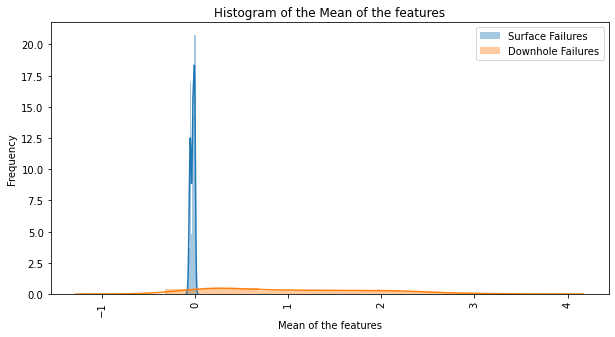

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(mean_0, hist=True, label="Surface Failures")
sns.distplot(mean_1, hist=True, label="Downhole Failures")
plt.title('Histogram of the Mean of the features')
plt.ylabel('Frequency')
plt.xlabel('Mean of the features')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
Here for the surface and downhole failures, we can see that the different downhole features have more variance.
Whereas the majority of the surface related features have a very similar value.

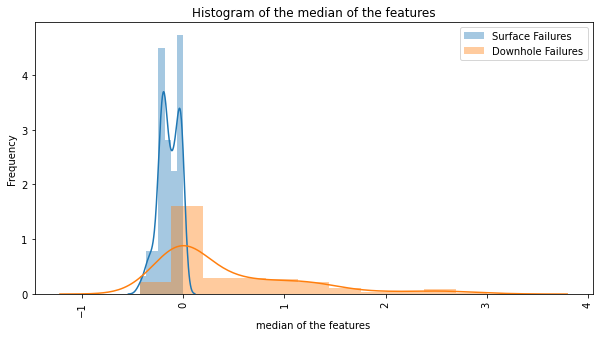

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(median_0, hist=True, label="Surface Failures")
sns.distplot(median_1, hist=True, label="Downhole Failures")
plt.title('Histogram of the median of the features')
plt.ylabel('Frequency')
plt.xlabel('median of the features')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
Here for the surface and downhole failures, we can see that the different downhole features have more variance. Whereas the majority of the surface related features have a very similar value.<br><br>
Similarity can be observed in the box plots and voilin plots.

**11) Try box plot / voilin plot to visualize the outliers.**

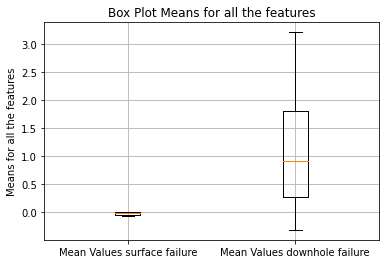

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([mean_0, mean_1])
plt.title('Box Plot Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

**Observations :**<br>
**The majority of the values for the surface failures lie near 0 whereas for the downhole failures, we can see all kinds of variation.**

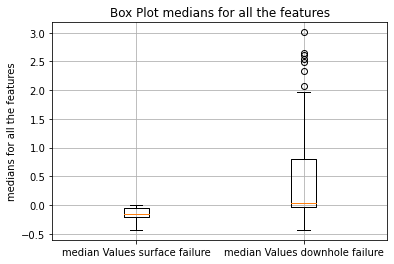

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([median_0, median_1])
plt.title('Box Plot medians for all the features')
plt.xticks([1,2],('median Values surface failure','median Values downhole failure'))
plt.ylabel('medians for all the features')
plt.grid()
plt.show()

**Observations :**<br>
**The majority of the values for the surface failures lie near 0 whereas for the downhole failures, we can see all kinds of variation.**

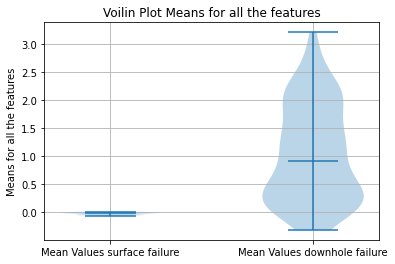

In [ ]:
plt.violinplot([mean_0, mean_1], showmeans=False, showmedians=True)
plt.title('Voilin Plot Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

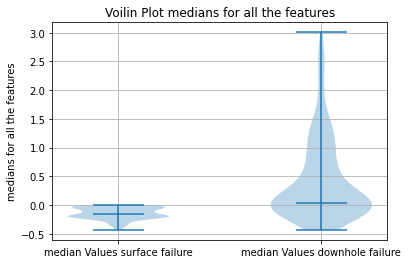

In [ ]:
plt.violinplot([median_0, median_1], showmeans=False, showmedians=True)
plt.title('Voilin Plot medians for all the features')
plt.xticks([1,2],('median Values surface failure','median Values downhole failure'))
plt.ylabel('medians for all the features')
plt.grid()
plt.show()

**PCA**

In [75]:
new_x_adasyn_df.drop("target",axis=1,inplace=True)

In [ ]:
"target" in new_x_adasyn_df.columns

False

[[-7.816123   1.8352222  0.       ]
 [-4.13487    1.2684838  0.       ]
 [-9.20787    1.3386774  0.       ]
 ...
 [ 0.754264  -3.3310704  1.       ]
 [ 3.1483057 -4.1678286  1.       ]
 [-1.4895833 -1.9928197  1.       ]]


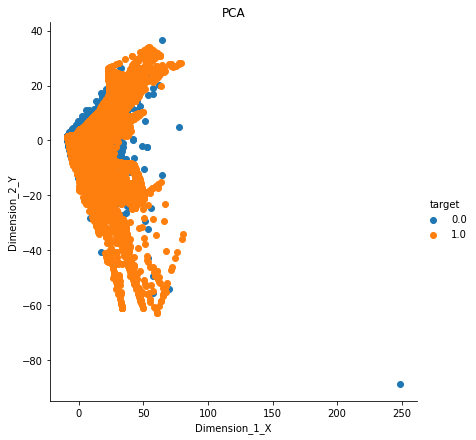

CPU times: user 898 ms, sys: 147 ms, total: 1.05 s
Wall time: 932 ms


In [76]:
%%time
run_pca(new_x_adasyn_df,y_adasyn)

**Observation :**<br>
1) Observe that PCA is not able to differentiate properly the surface failures from the downhole failures. If the surface and downhole failures are coming under the same category then they are shown in the same cluster.<br>
2) Not all the the surface and downhole features are coming under the same category.

### Perform a similar EDA on the outliers.

#### Here we take the outliers from the features that have been selected.
#### For each sensor we find the outliers that also classwise.
#### The issue is that there maybe high outliers here , but there maybe lower outliers here as well.

https://www.geeksforgeeks.org/interquartile-range-and-quartile-deviation-using-numpy-and-scipy/<br>
**Higher outlier = more than 1.5 ⋅ IQR above the third quartile.**<br>
**Lower outlier = less than 1.5 . IQR below the first quartile.**<br>
**The IQR is the difference between Q3 and Q1.**

In [ ]:
new_x_adasyn_df["target"]=y_adasyn

In [ ]:
counter=0
main_dictionary=dict()
outliers=[]
list_of_outliers_features_classes=[]
for i in range(len(column_list)):
    d=dict()
    new_list=new_x_adasyn_df[new_x_adasyn_df.target==one_zero[i]]\
    [column_list[i]]      
    new_index=list(new_list.reset_index()["index"])
    QR1=np.percentile(new_list, 25)
    QR3=np.percentile(new_list, 75)
    IQR=QR3-QR1
    for index,value in zip(new_index,new_list):    
        if (value>(QR3+(IQR*1.5))) or (value<(QR1-(IQR*1.5))):
            counter=counter+1
            d.update({index:value})
            if index not in main_dictionary:
                main_dictionary.update({index:list(new_x_adasyn_df.loc[index])})
    list_of_outliers_features_classes.append(d)
    del d
    outliers.append(counter)
    counter=0

In [ ]:
print("Total number of data points that are outliers in atleast one or more than one feature : ",len(np.unique(list(main_dictionary.keys()))))

Total number of data points that are outliers in atleast one or more than one feature :  79888


In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:outliers[i] for i in index}

d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])
    
counter=0
new_column_list=[]
new_outliers_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_outliers_list.append(outliers[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_outliers_list.append(outliers[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 144 sensors.


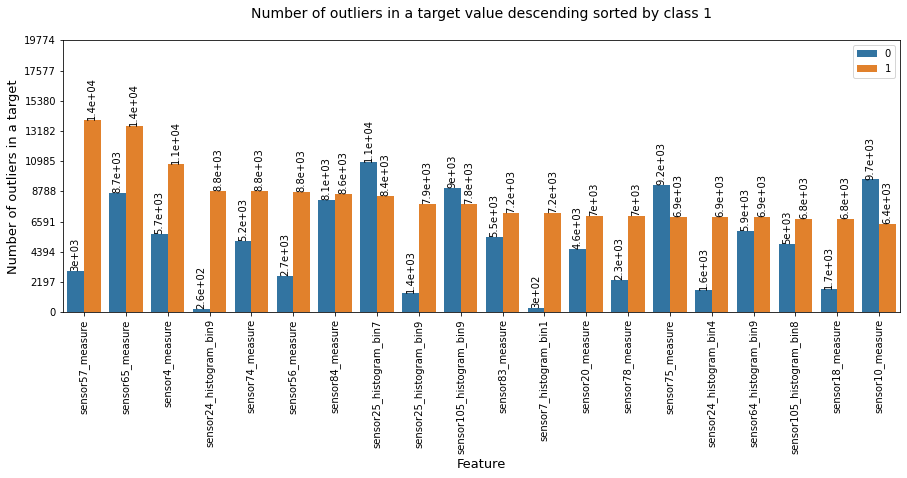

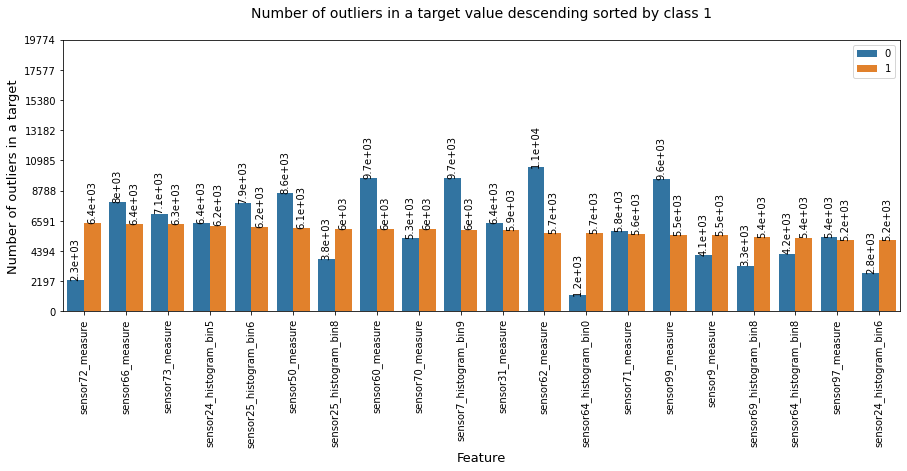

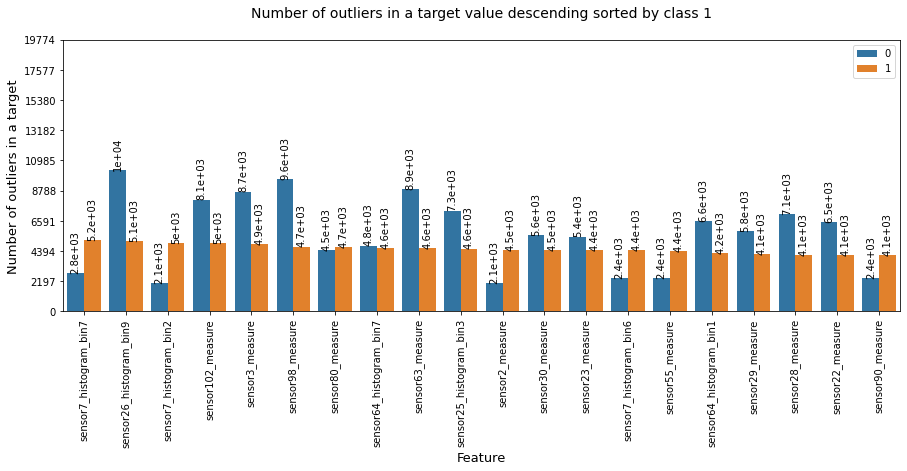

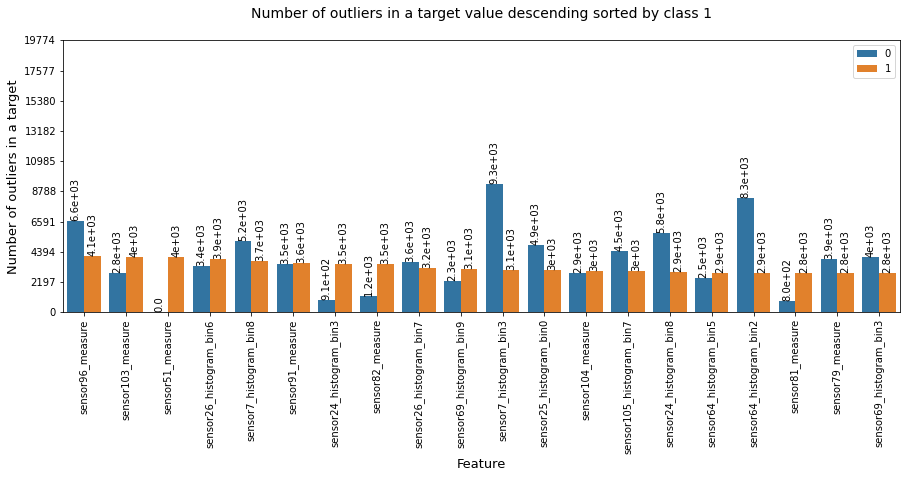

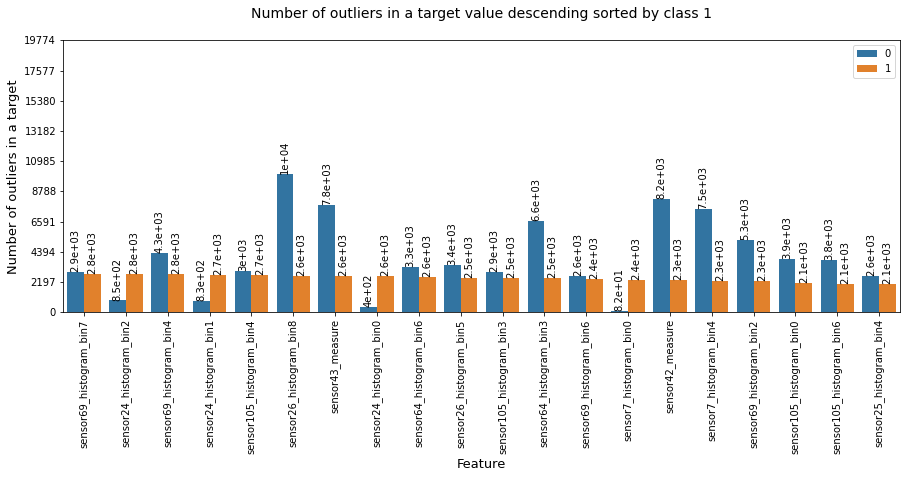

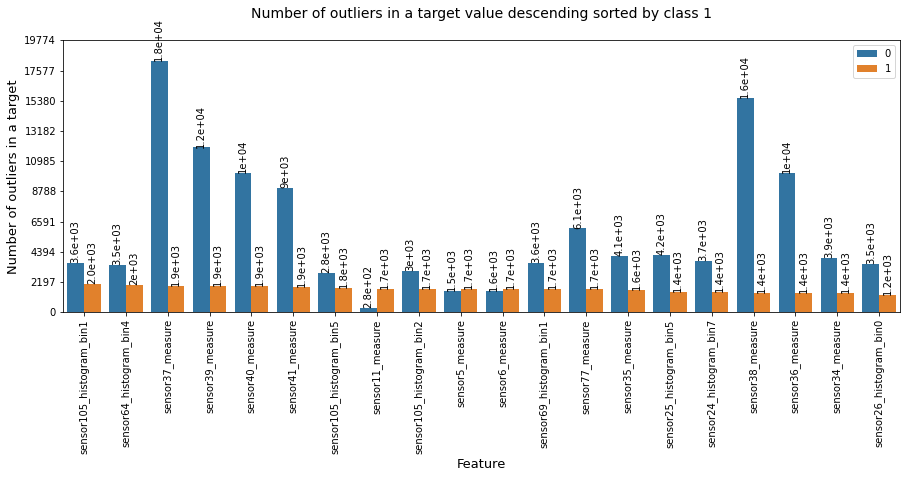

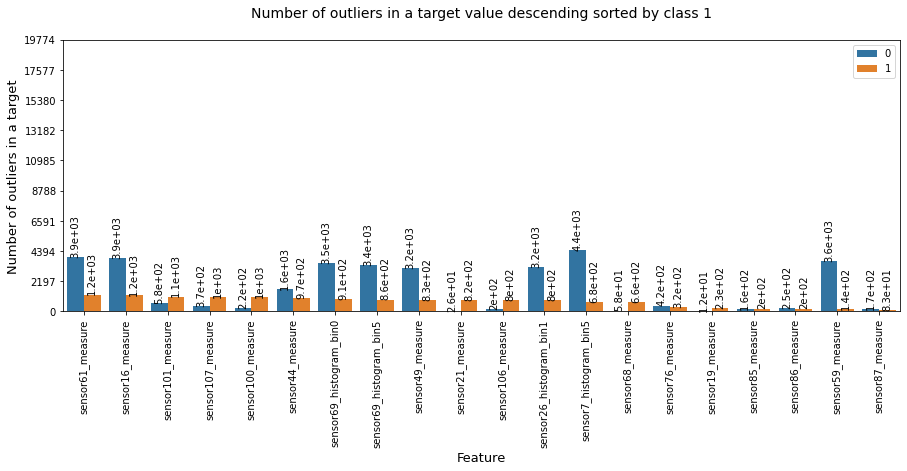

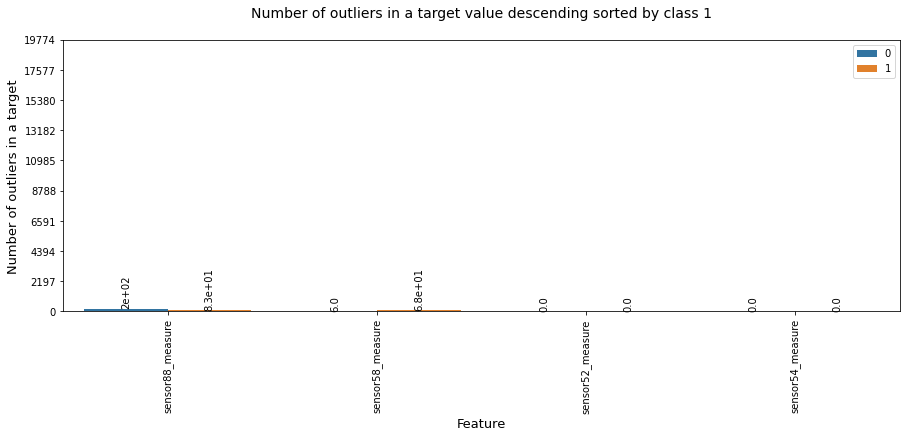

In [ ]:
try:
    plot_diagram(new_column_list,new_outliers_list,new_one_zero,"Number of outliers",1)
except ValueError:
    pass

**Observation :**<br>
Now as we have oversampled the minority class , we can see that number of outliers for the downhole failures have started rising other than.

### For every column feature, get the mean for the outliers for both class 0 and class 1.

In [ ]:
mean_0=[]
mean_1=[]
for i in range(0,len(list_of_outliers_features_classes),2):
    class_0=[ele for ele in list_of_outliers_features_classes[i].values()]
    class_1=[ele for ele in list_of_outliers_features_classes[i+1].values()]
    if (len(class_0)==0) :
        mean_0.append(0.01)
    else :
        mean_0.append(np.mean(class_0))

    if (len(class_1)==0):
        mean_1.append(0.01)
    else :
        mean_1.append(np.mean(class_1))

In [ ]:
median_0=[]
median_1=[]
for i in range(0,len(list_of_outliers_features_classes),2):
    class_0=[ele for ele in list_of_outliers_features_classes[i].values()]
    class_1=[ele for ele in list_of_outliers_features_classes[i+1].values()]
    if (len(class_0)==0) :
        median_0.append(0.01)
    else :
        median_0.append(np.median(class_0))

    if (len(class_1)==0):
        median_1.append(0.01)
    else :
        median_1.append(np.median(class_1))

### Plotting the mean and median for each feature class wise.

**10) Try and plot it’s histogram for both the target values.**

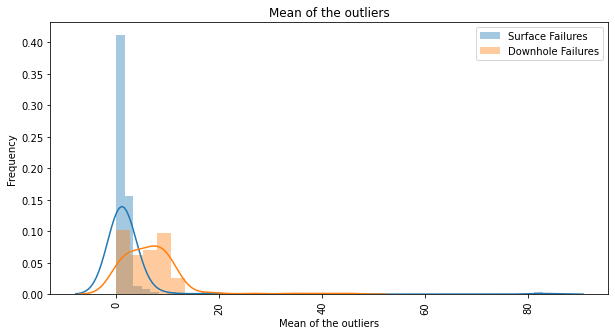

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(mean_0, hist=True, label="Surface Failures")
sns.distplot(mean_1, hist=True, label="Downhole Failures")
plt.title('Mean of the outliers')
plt.ylabel('Frequency')
plt.xlabel('Mean of the outliers')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**
For the outliers, majority of them seem to be concentrated around 0 for the surface outliers with variance as well.<br>
For downhole outliers they have lesser variance but have more density in the other range values 

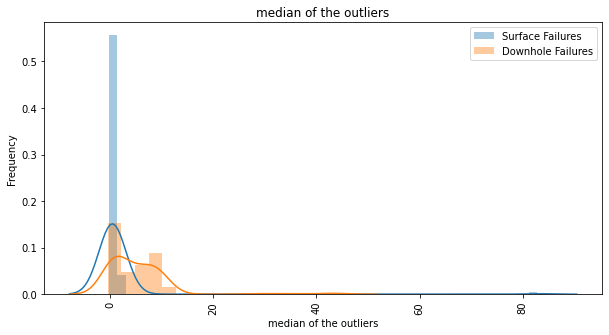

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(median_0, hist=True, label="Surface Failures")
sns.distplot(median_1, hist=True, label="Downhole Failures")
plt.title('median of the outliers')
plt.ylabel('Frequency')
plt.xlabel('median of the outliers')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :** For the outliers, majority of them seem to be concentrated around 0 for the surface outliers with variance as well.
For downhole outliers they have lesser variance but have more density in the other range values 

**11) Try box plot / voilin plot to visualize the outliers.**

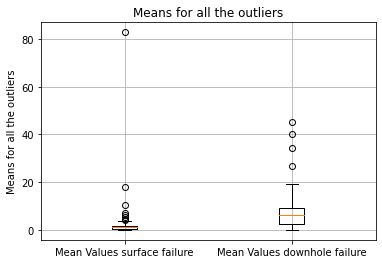

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([mean_0, mean_1])
plt.title('Means for all the outliers')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the outliers')
plt.grid()
plt.show()

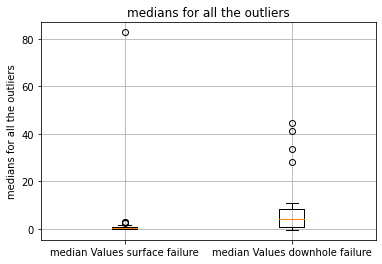

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([median_0, median_1])
plt.title('medians for all the outliers')
plt.xticks([1,2],('median Values surface failure','median Values downhole failure'))
plt.ylabel('medians for all the outliers')
plt.grid()
plt.show()

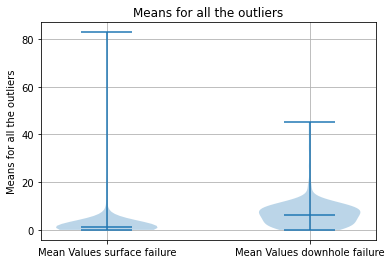

In [ ]:
plt.violinplot([mean_0, mean_1], showmeans=False, showmedians=True)
plt.title('Means for all the outliers')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the outliers')
plt.grid()
plt.show()

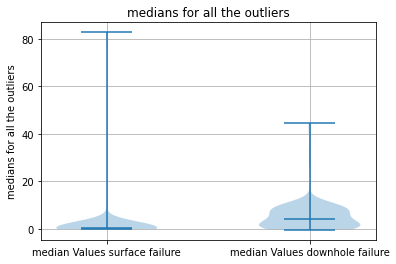

In [ ]:
plt.violinplot([median_0, median_1], showmeans=False, showmedians=True)
plt.title('medians for all the outliers')
plt.xticks([1,2],('median Values surface failure','median Values downhole failure'))
plt.ylabel('medians for all the outliers')
plt.grid()
plt.show()

**The outliers although for the surface related failures are higher. But both the means and the medians of the outliers are similar.**

### For the given data points and features enter new features that tell if these values were previously np.NaN or not.

In [ ]:
new_x_adasyn_df.drop("target",axis=1,inplace=True)

In [ ]:
nan_x_adasyn_df=fuse_dataframe_nan(new_x_adasyn_df,nan_or_not,set(new_column_list))
nan_x_adasyn_df["target"]=y_adasyn
nan_x_adasyn_df.head()

,sensor7_histogram_bin2,sensor105_histogram_bin3,sensor69_histogram_bin7,sensor64_histogram_bin2,sensor107_measure,sensor40_measure,sensor26_histogram_bin6,sensor73_measure,sensor78_measure,sensor86_measure,...,sensor87_measure,sensor61_measure,sensor24_histogram_bin4,sensor19_measure,sensor7_histogram_bin8,sensor4_measure,sensor26_histogram_bin9,sensor75_measure,sensor9_measure,target
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Now this is the problem out of the given data that we have , we select the features that have more than 50% np.NaNs

In [ ]:
counter=0
for column in new_x_adasyn_df.columns.values:
    try:
        percent_of_nan=nan_x_adasyn_df[column].value_counts()[1]/\
                (nan_x_adasyn_df[column].value_counts()[0]+\
                 nan_x_adasyn_df[column].value_counts()[1])
        if (percent_of_nan>.5) :
            counter=counter+1
            print(column,"  :  ",percent_of_nan)
    except KeyError:
        pass
print("Overall : ",counter," features with % of na's more than 50%")

sensor2_measure   :   0.7740833333333333
sensor38_measure   :   0.6605416666666667
sensor39_measure   :   0.7348958333333333
sensor40_measure   :   0.77375
sensor41_measure   :   0.7967916666666667
sensor42_measure   :   0.8133125
sensor43_measure   :   0.822
sensor68_measure   :   0.7740833333333333
Overall :  8  features with % of na's more than 50%


<h3>5) Impute np.NaN with median and then perform smotetomek on the values.</h3>

In [15]:
data_type="smotetomek_data"

In [ ]:
train_smotetomek_all_features=train.copy()
y_train_smotetomek_all_features=y_train.copy()
test_smotetomek_all_features=test.copy()
y_test_smotetomek_all_features=y_test.copy()

In [ ]:
train_smotetomek_all_features.shape

(48000, 170)

In [ ]:
y_train_smotetomek_all_features.shape

(48000,)

In [ ]:
test_smotetomek_all_features.shape

(12000, 170)

In [ ]:
y_test_smotetomek_all_features.shape

(12000,)

In [ ]:
for i ,j in zip(train_smotetomek_all_features.columns.values,test_smotetomek_all_features.columns.values):
    if (i!=j):
        print(i," : ",j)

In [ ]:
train_smotetomek_all_features,y_train_smotetomek_all_features=reset_index(train_smotetomek_all_features,y_train_smotetomek_all_features)
test_smotetomek_all_features,y_test_smotetomek_all_features=reset_index(test_smotetomek_all_features,y_test_smotetomek_all_features)

**Filling the np.NaN values with the median of the category this time.**

In [ ]:
l=[]
for ele in train_smotetomek_all_features["sensor4_measure"]:
    if np.isnan(ele):
        pass
    else:
        l.append(ele) 
np.median(l)

126.0

In [ ]:
train_smotetomek_all_features["sensor4_measure"].median()

126.0

Both are the same so the pandas.series.median() function ignores the value that has the np.NaN and does not even count it.<br>
Divide the whole dataframe into the number of categories that we have and then only enter the median for that feature for that particular category.

In [ ]:
train_smotetomek_all_features,y_train_smotetomek_all_features,test_smotetomek_all_features,y_test_smotetomek_all_features=\
impute_median_for_train_n_test_as_per_train(train_smotetomek_all_features,
                                          y_train_smotetomek_all_features,
                                          test_smotetomek_all_features,
                                          y_test_smotetomek_all_features,data_type)

In [ ]:
train_smotetomek_all_features,y_train_smotetomek_all_features=reset_index(train_smotetomek_all_features,y_train_smotetomek_all_features)
test_smotetomek_all_features,y_test_smotetomek_all_features=reset_index(test_smotetomek_all_features,y_test_smotetomek_all_features)

**Standardise the dataframe**

In [ ]:
standard_train_smotetomek_all_features_df,standard_test_smotetomek_all_features_df=standardize_test_n_train_wrt_train(train_smotetomek_all_features,test_smotetomek_all_features,data_type)

In [ ]:
standard_train_smotetomek_all_features_df.shape

(48000, 170)

In [ ]:
standard_test_smotetomek_all_features_df.shape

(12000, 170)

In [ ]:
y_train_smotetomek_all_features.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: target, dtype: float32

In [ ]:
y_train_smotetomek_all_features.tail()

47995    1.0
47996    1.0
47997    1.0
47998    1.0
47999    1.0
Name: target, dtype: float32

In [ ]:
"target" in standard_train_smotetomek_all_features_df.columns

False

**Perform smotetomek**

In [ ]:
%%time 
from imblearn.combine import SMOTETomek
x_smotetomek, y_smotetomek = SMOTETomek(random_state=42,sampling_strategy=.75,n_jobs=-1).fit_resample(standard_train_smotetomek_all_features_df, y_train_smotetomek_all_features)
print("done")

done
CPU times: user 41min 17s, sys: 604 ms, total: 41min 18s
Wall time: 6min 16s


In [ ]:
x_smotetomek.shape

(82598, 170)

In [ ]:
y_smotetomek.value_counts()

0.0    47199
1.0    35399
Name: target, dtype: int64

In [ ]:
y_smotetomek.shape

(82598,)

**Truncated SVD to get the best features**

In [ ]:
#https://stackoverflow.com/questions/50796024/feature-variable-importance-after-a-pca-analysis

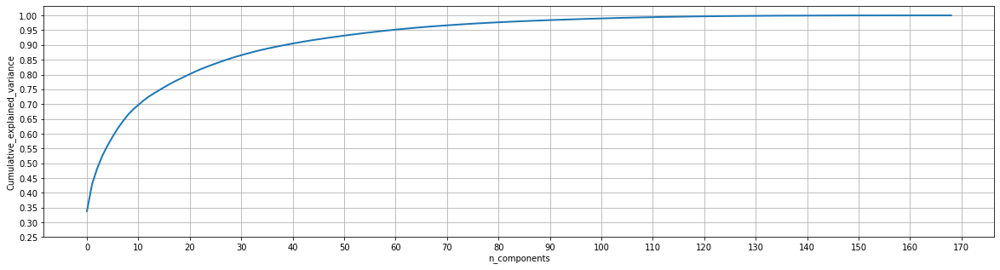

TruncatedSVD(n_components=169)

In [ ]:
truncated_svd(x_smotetomek,169)

**I choose 120 components to describe my data as 120 components explain atleast 99% variance of the total data.** 

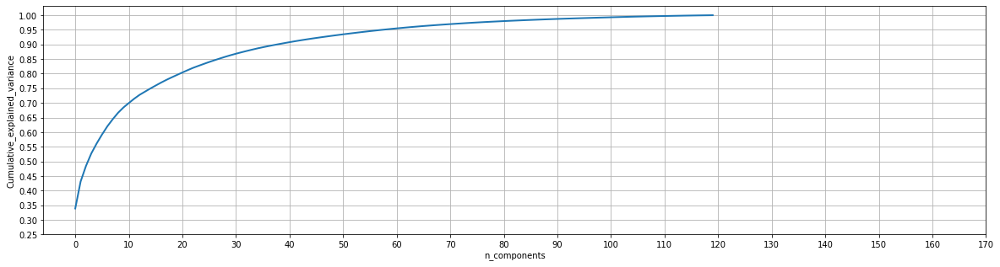

In [ ]:
svd=truncated_svd(x_smotetomek,120)

**For the 120 principal components using svd.explained_variance_ratio_ find the variance distribution.**

In [ ]:
print(len(svd.explained_variance_ratio_))

120


In [ ]:
np.sum(svd.explained_variance_ratio_)

0.9967885

In [ ]:
svd.components_.shape

(120, 170)

In [ ]:
#number of features 
svd.components_.shape[1]

170

In [ ]:
#number of components
svd.components_.shape[0]

120

**For the 120 principal components find the feature importance.**

In [ ]:
set_number_of_features=120

### Trying Forward Feature selection

**Here, in forward feature selection, out of 170 features even if I choose to select 10 features only , still it will take a lot of time.<br>
Therefore I go with recursive feature elimination.<br>
Using Recursive Feature Elimination, I can get the features that I need.**

In [ ]:
x_smotetomek.shape

(82598, 170)

In [ ]:
%%time
new_x_smotetomek_df=recursive_feature_elimination(
    x_smotetomek,
    y_smotetomek,
    int(set_number_of_features+np.round((len(train.columns.values)-set_number_of_features)/2))
)

Rankings :  [1 3 1 1 2 3 4 1 1 1 1 1 1 1 1 3 1 1 1 5 1 1 1 1 1 1 1 6 2 5 1 1 1 1 1 1 2
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 1 1 1 6 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 3 2 5 4 6 6 1 1 1 1 1 1
 1 1 1 1 1 3 4 1 1 1 1 1 1 1 1 1 1 1 1 1 5 5]
Selected indices :
 1    145
6      5
5      5
4      5
3      5
2      5
dtype: int64
CPU times: user 22min 11s, sys: 941 ms, total: 22min 12s
Wall time: 11min 46s


In [ ]:
new_x_smotetomek_df.head()

,sensor1_measure,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,...,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9
0,-0.209185,-0.432133,-0.078741,-0.028788,-0.057799,-0.115367,-0.179786,-0.231174,-0.094145,-0.203189,...,-0.258247,-0.167010,-0.104268,-0.025683,-0.045527,-0.128090,-0.199055,-0.168927,-0.201433,-0.163656
1,0.226385,2.314107,0.276872,-0.028788,-0.057799,-0.115367,-0.175033,0.318588,0.527328,0.351014,...,0.437684,0.093053,0.064536,0.132146,0.278645,0.573132,0.835714,-0.017869,-0.288574,-0.170285
2,-0.411601,-0.432133,-0.108583,-0.028788,-0.057799,-0.114391,-0.176506,-0.336292,-0.427550,-0.352896,...,-0.298779,-0.305851,-0.385732,-0.392813,-0.383465,-0.370167,-0.310736,-0.198682,-0.307802,-0.170285
3,0.027280,-0.432131,0.303606,-0.028788,-0.057799,-0.115367,-0.180203,-0.309964,0.316092,1.059426,...,0.086046,0.209944,0.283329,0.340889,0.186015,0.040885,-0.036827,-0.114241,0.062849,-0.076776
4,-0.132515,-0.432132,0.031300,-0.028788,-0.057799,-0.115367,-0.180360,-0.207419,-0.046739,0.001999,...,-0.181920,-0.132356,-0.193390,-0.200260,-0.163322,0.021205,-0.126184,-0.131916,0.376297,1.234393


**Try spearman corelation coefficient to find out co relation. (It is good for cause and affect analysis but it might not be of much use when we find that our features are dependent on other features, we expect our features to be independent of each other.).**

In [ ]:
%%time
spearman=select_spearman(new_x_smotetomek_df,int(set_number_of_features+np.floor((len(train.columns.values)-set_number_of_features)/2)))

If I take the data having correlation between only -.1 and .1 range then I get  0  features.
If I take the data having correlation between only -.90 and .90 range then I get  54  features.
If I take the data having correlation between only -.95 and .95 range then I get  76  features.
If I take the data having correlation between only -.97 and .97 range then I get  87  features.
If I take the data having correlation between only -.98 and .98 range then I get  97  features.
If I take the data having correlation between only -.99 and .99 range then I get  117  features.
If I take the data having correlation between only -.999 and .999 range then I get  139  features.
CPU times: user 22.2 s, sys: 56.2 ms, total: 22.3 s
Wall time: 22.2 s


In [ ]:
new_x_smotetomek_df=perform_spearman(new_x_smotetomek_df,spearman,.99)

In [ ]:
new_x_smotetomek_df.head()

,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin8,...,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9
0,-0.432133,-0.078741,-0.028788,-0.057799,-0.115367,-0.179786,-0.231174,-0.094145,-0.203189,-0.156318,...,-0.258247,-0.167010,-0.104268,-0.025683,-0.045527,-0.128090,-0.199055,-0.168927,-0.201433,-0.163656
1,2.314107,0.276872,-0.028788,-0.057799,-0.115367,-0.175033,0.318588,0.527328,0.351014,0.110561,...,0.437684,0.093053,0.064536,0.132146,0.278645,0.573132,0.835714,-0.017869,-0.288574,-0.170285
2,-0.432133,-0.108583,-0.028788,-0.057799,-0.114391,-0.176506,-0.336292,-0.427550,-0.352896,-0.156730,...,-0.298779,-0.305851,-0.385732,-0.392813,-0.383465,-0.370167,-0.310736,-0.198682,-0.307802,-0.170285
3,-0.432131,0.303606,-0.028788,-0.057799,-0.115367,-0.180203,-0.309964,0.316092,1.059426,0.395679,...,0.086046,0.209944,0.283329,0.340889,0.186015,0.040885,-0.036827,-0.114241,0.062849,-0.076776
4,-0.432132,0.031300,-0.028788,-0.057799,-0.115367,-0.180360,-0.207419,-0.046739,0.001999,-0.079524,...,-0.181920,-0.132356,-0.193390,-0.200260,-0.163322,0.021205,-0.126184,-0.131916,0.376297,1.234393


In [ ]:
new_x_smotetomek_df.shape

(82598, 117)

In [ ]:
y_smotetomek.shape

(82598,)

In [ ]:
new_standard_test_smotetomek_all_features_df=standard_test_smotetomek_all_features_df[new_x_smotetomek_df.columns.values]
new_standard_test_smotetomek_all_features_df.head()

,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin8,...,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9
0,-0.432133,-0.078741,-0.028788,-0.057799,-0.115367,-0.180209,-0.225051,0.291359,0.206391,-0.101993,...,-0.119692,-0.072308,0.057907,0.125870,0.099242,0.163299,0.280228,-0.005584,-0.208069,-0.168607
1,2.314107,0.135746,-0.028788,-0.057799,-0.115367,-0.180150,0.066724,0.750312,0.367857,-0.044753,...,0.036052,0.039671,0.138756,0.167661,0.197075,0.406800,0.754810,0.221194,1.813683,0.117853
2,-0.432133,-0.115422,-0.028788,-0.057799,-0.115367,-0.180461,-0.336576,-0.426838,-0.352896,-0.156730,...,-0.299987,-0.307366,-0.386519,-0.393192,-0.383560,-0.370202,-0.310778,-0.198829,-0.307802,-0.170285
3,2.314107,-0.114800,-0.028788,-0.057799,-0.115367,-0.180276,-0.334237,-0.426611,-0.352869,-0.156730,...,-0.298142,-0.306402,-0.385988,-0.392942,-0.382904,-0.369753,-0.310692,-0.198829,-0.307802,-0.170285
4,2.314107,0.041869,-0.028788,-0.057799,-0.115367,-0.180369,-0.273727,0.202382,0.265217,-0.142487,...,-0.173463,-0.122351,-0.103468,-0.047627,0.104776,0.244433,0.125151,-0.056531,0.334861,0.260346


In [ ]:
#new_x_smotetomek_df.to_pickle("new_x_smotetomek_df.pickle")
#y_smotetomek.to_pickle("y_smotetomek.pickle")

#new_standard_test_smotetomek_all_features_df.to_pickle("new_standard_test_smotetomek_all_features_df.pickle")
#y_test_smotetomek_all_features.to_pickle("y_test_smotetomek_all_features.pickle")

In [79]:
#new_x_smotetomek_df=pd.read_pickle("/content/gdrive/My Drive/new_x_smotetomek_df.pickle")
#y_smotetomek=pd.read_pickle("/content/gdrive/My Drive/y_smotetomek.pickle")
                                   
#new_standard_test_smotetomek_all_features_df=pd.read_pickle("/content/gdrive/My Drive/new_standard_test_smotetomek_all_features_df.pickle")
#y_test_smotetomek_all_features=pd.read_pickle("/content/gdrive/My Drive/y_test_smotetomek_all_features.pickle")

In [ ]:
np.save('new_x_smotetomek_df_columns.npy',new_x_smotetomek_df.columns.values)

In [80]:
new_x_smotetomek_df["target"]=y_smotetomek
new_x_smotetomek_df.head()

,sensor3_measure,sensor4_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin8,sensor9_measure,sensor10_measure,sensor16_measure,sensor18_measure,sensor22_measure,sensor23_measure,sensor24_histogram_bin0,sensor24_histogram_bin3,sensor24_histogram_bin5,sensor24_histogram_bin6,sensor24_histogram_bin7,sensor24_histogram_bin8,sensor24_histogram_bin9,sensor25_histogram_bin0,sensor25_histogram_bin3,sensor25_histogram_bin4,sensor25_histogram_bin5,sensor25_histogram_bin6,sensor25_histogram_bin7,sensor25_histogram_bin8,sensor26_histogram_bin0,sensor26_histogram_bin1,sensor26_histogram_bin5,sensor26_histogram_bin6,sensor26_histogram_bin7,sensor26_histogram_bin8,sensor26_histogram_bin9,sensor28_measure,sensor29_measure,sensor30_measure,...,sensor69_histogram_bin2,sensor69_histogram_bin3,sensor69_histogram_bin4,sensor69_histogram_bin5,sensor69_histogram_bin6,sensor69_histogram_bin7,sensor69_histogram_bin8,sensor69_histogram_bin9,sensor70_measure,sensor71_measure,sensor72_measure,sensor73_measure,sensor74_measure,sensor75_measure,sensor77_measure,sensor78_measure,sensor79_measure,sensor80_measure,sensor81_measure,sensor82_measure,sensor90_measure,sensor91_measure,sensor96_measure,sensor97_measure,sensor98_measure,sensor99_measure,sensor102_measure,sensor103_measure,sensor104_measure,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,target
0,-0.432133,-0.078741,-0.028788,-0.057799,-0.115367,-0.179786,-0.231174,-0.094145,-0.203189,-0.156318,-0.055001,-0.022185,-0.247540,-0.086423,-0.170004,-0.250903,-0.026929,-0.03445,-0.027653,0.019798,-0.204953,-0.223919,-0.012042,-0.039722,-0.127249,-0.271058,-0.099884,-0.118707,-0.058450,-0.050906,-0.136385,-0.284885,-0.051453,-0.074401,-0.309078,-0.139187,-0.100633,-0.132340,-0.192043,-0.118740,...,-0.138224,-0.240884,-0.105702,-0.157814,-0.361452,-0.127120,-0.018465,-0.004647,-0.081672,-0.110379,-0.207972,-0.193647,-0.026793,-0.066670,-0.238277,-0.123843,-0.216425,-0.182974,-0.018598,-0.025464,0.223798,-0.043440,0.012980,-0.005788,-0.187032,-0.127898,-0.210557,-0.165126,-0.172052,-0.258247,-0.167010,-0.104268,-0.025683,-0.045527,-0.128090,-0.199055,-0.168927,-0.201433,-0.163656,0.0
1,2.314107,0.276872,-0.028788,-0.057799,-0.115367,-0.175033,0.318588,0.527328,0.351014,0.110561,-0.055001,-0.022185,0.315152,-0.086423,-0.021180,1.006312,-0.026929,-0.03445,-0.083133,1.041712,-0.088098,0.079001,-0.012042,-0.037172,-0.123660,-0.350404,0.719456,-0.082490,-0.058471,-0.050906,0.461935,0.361505,0.241982,0.108664,-0.350005,-0.139187,-0.100633,-0.136226,-0.148305,-0.067359,...,-0.001890,0.777684,-0.006112,0.236746,0.767082,0.090748,-0.003555,-0.004647,0.137387,0.239649,0.942112,-0.114101,-0.026793,0.007628,0.514403,0.834765,0.469907,0.623494,-0.018598,-0.025464,1.341602,2.469441,0.626016,0.316323,-0.187032,-0.127898,0.266704,0.576310,0.628487,0.437684,0.093053,0.064536,0.132146,0.278645,0.573132,0.835714,-0.017869,-0.288574,-0.170285,0.0
2,-0.432133,-0.108583,-0.028788,-0.057799,-0.114391,-0.176506,-0.336292,-0.427550,-0.352896,-0.156730,-0.055001,-0.022185,-0.318004,-0.086423,-0.167507,-0.241253,-0.026929,-0.03445,-0.083133,-0.330240,-0.295079,-0.263661,-0.012042,-0.096970,-0.133810,-0.361153,-0.326799,-0.097644,-0.055213,0.000112,-0.366723,-0.384319,-0.379094,-0.332639,-0.350005,-0.139187,-0.100633,-0.134769,-0.193793,-0.142519,...,-0.195629,-0.321566,-0.213062,-0.399160,-0.452164,-0.151216,-0.018828,-0.004647,-0.112594,-0.149007,-0.551387,-0.226291,-0.026793,-0.067530,-0.238277,-0.588565,-0.315599,-0.182974,-0.018598,-0.025464,-0.475921,-0.511690,-0.341535,-0.300021,-0.173687,-0.127553,-0.224763,-0.355790,-0.398668,-0.298779,-0.305851,-0.385732,-0.392813,-0.383465,-0.370167,-0.310

<h3>Compare the target 0 and target 1 mean values feature wise after Median value imputing</h3>

In [ ]:
column_list=[]
mean_list=[]
one_zero=[]
for column in list(new_x_smotetomek_df.columns.values):
    if column!="target":
        column_list.append(column)
        one_zero.append(0)
        mean_list.append(new_x_smotetomek_df[column][new_x_smotetomek_df.target==0].mean())

        column_list.append(column)
        one_zero.append(1)
        mean_list.append(new_x_smotetomek_df[column][new_x_smotetomek_df.target==1].mean())

**Find the features where the difference between the means of the two classes is more than .15<br>
descending sorted by class 1**

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:mean_list[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
counter=0
new_column_list=[]
new_mean_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_mean_list.append(mean_list[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_mean_list.append(mean_list[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 117 sensors.


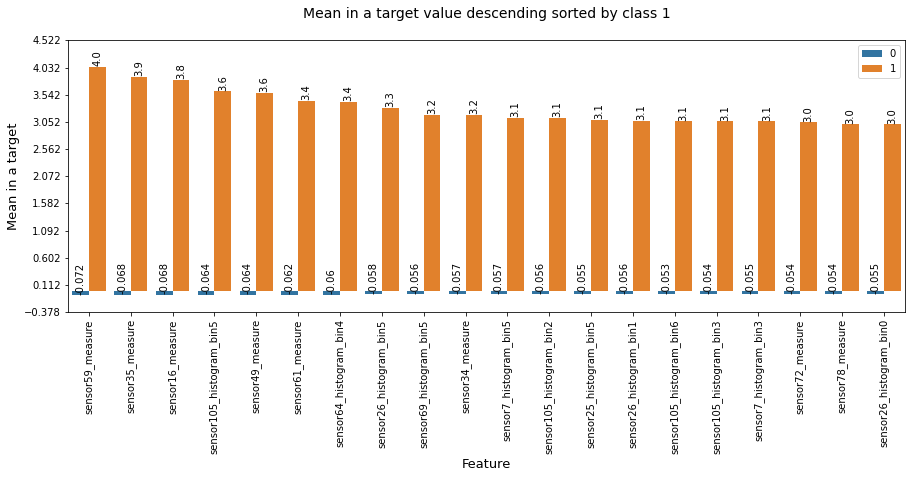

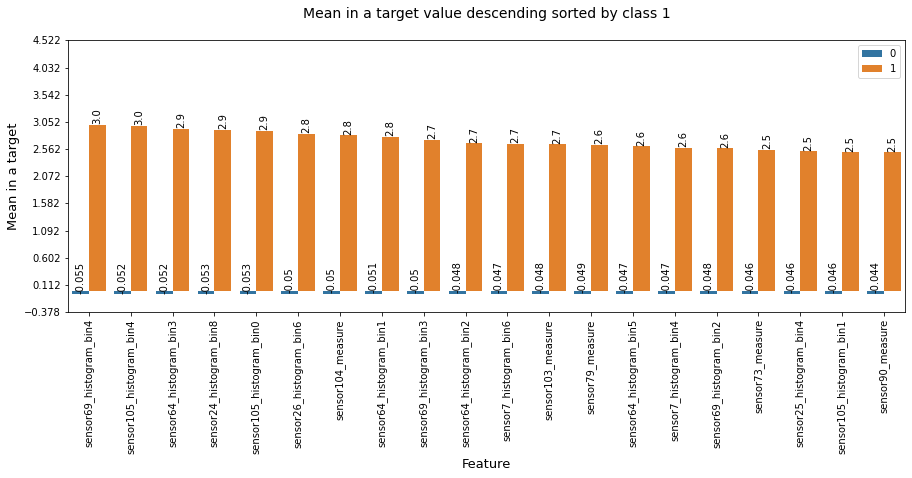

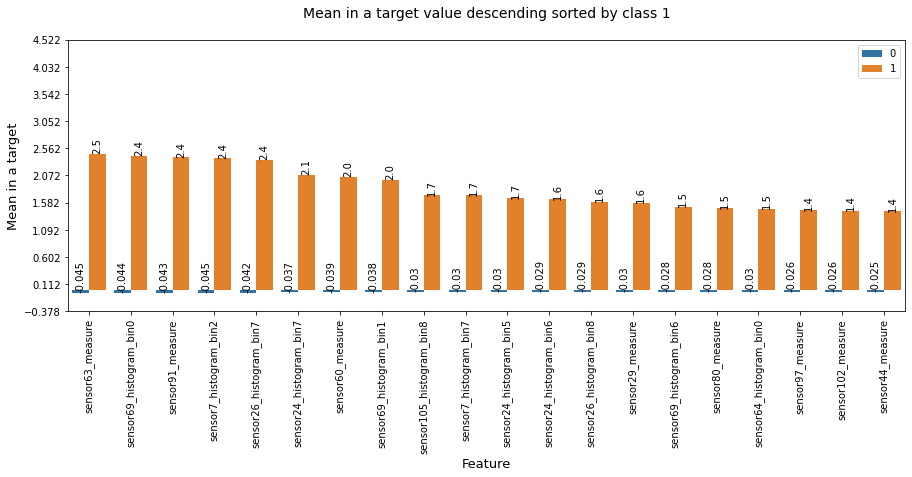

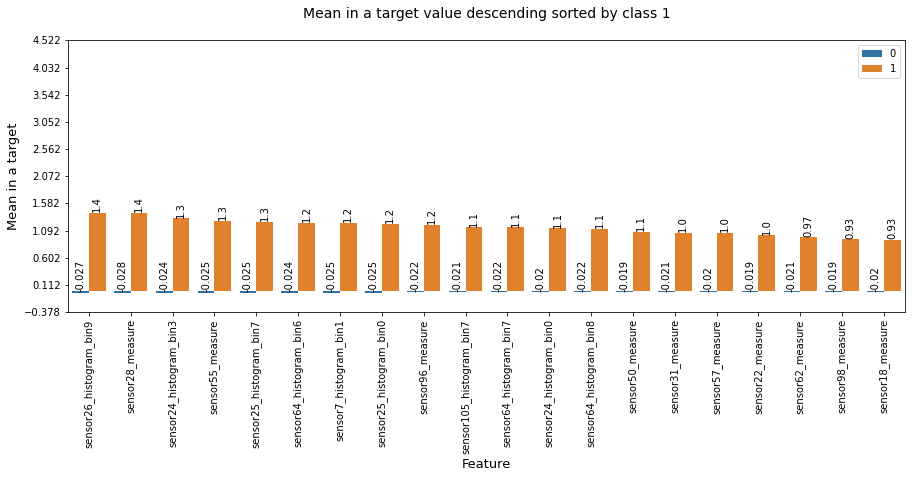

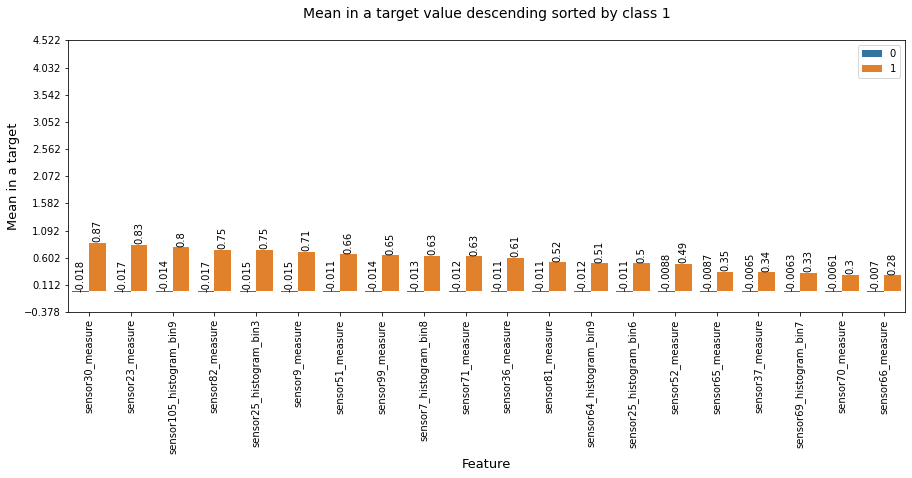

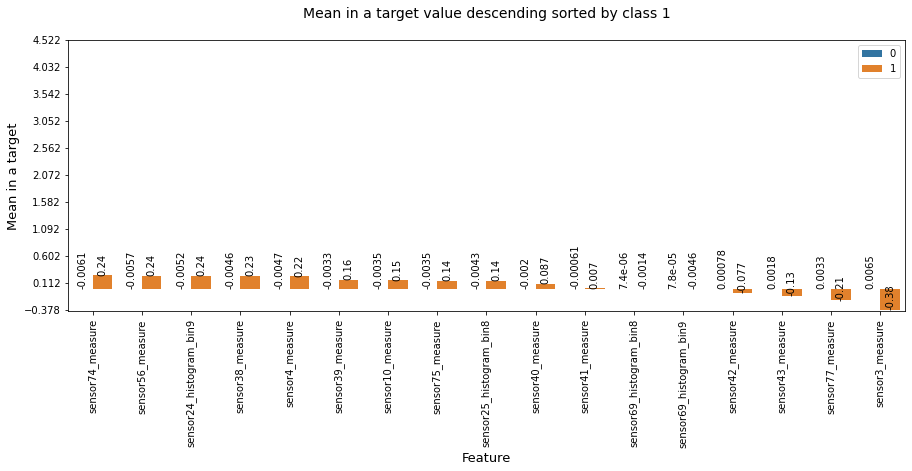

In [ ]:
try:
    plot_diagram(new_column_list,new_mean_list,new_one_zero,"Mean",1)
except ValueError:
    pass

**Observation** : All the mean values that we have taken from every median imputed feature, we come to know that there is a difference between both the types of the failures.

In [ ]:
counter=0
mean_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    
    if (np.abs(np.abs(mean_list[i])-np.abs(mean_list[i-1]))>=.15):
        mean_higher_reading.append(mean_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        mean_higher_reading.append(mean_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])


        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between mean readings of surface and downhole failures.".format(counter))

So we have approximate 108 sensor that show significant difference (> .15) between mean readings of surface and downhole failures.


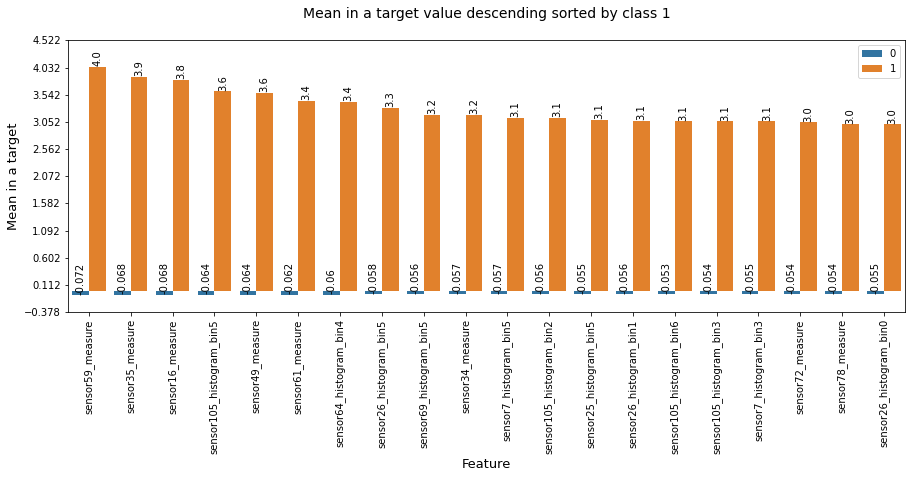

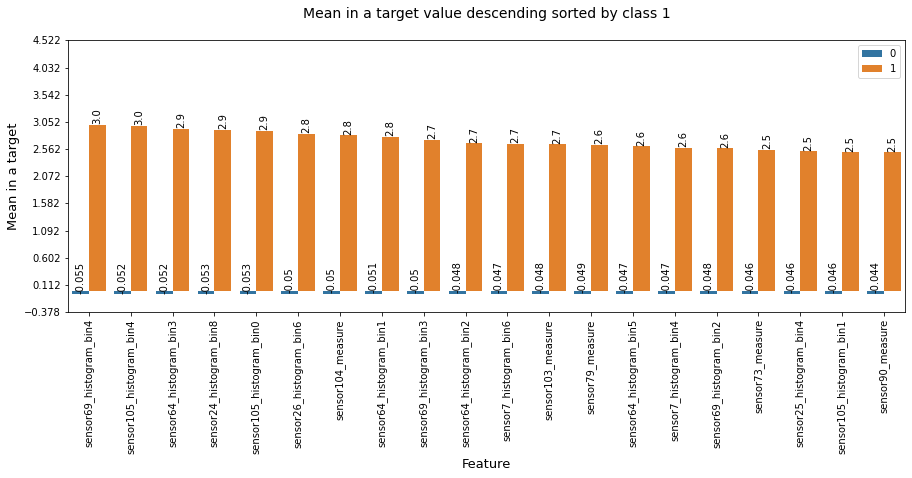

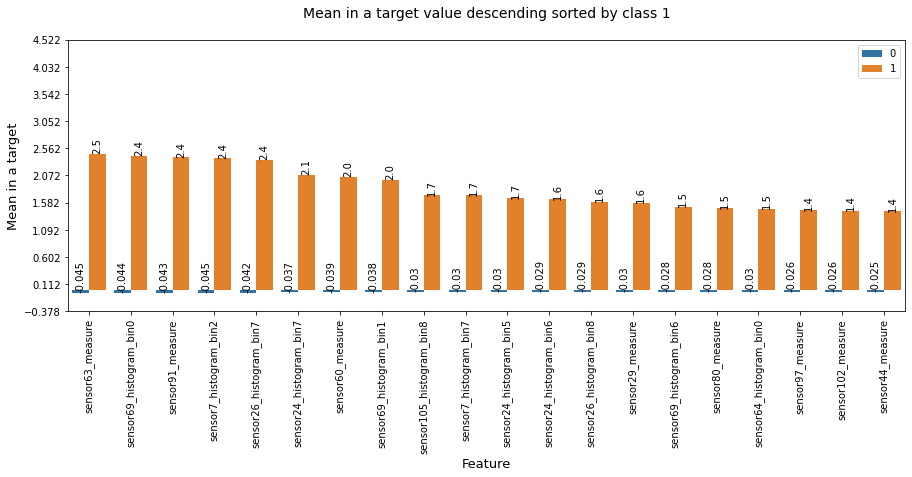

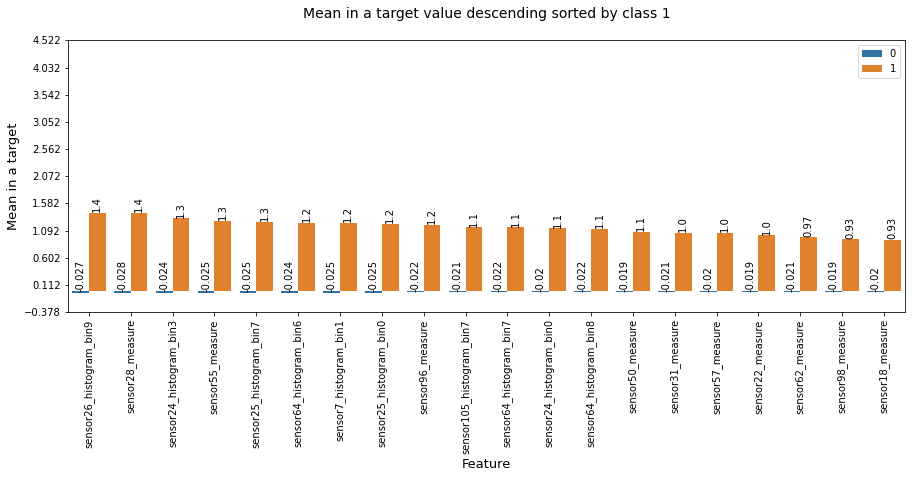

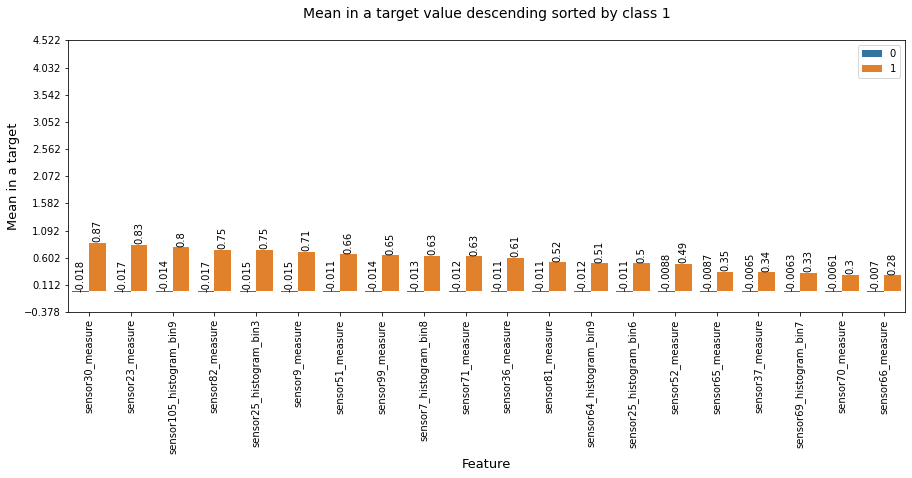

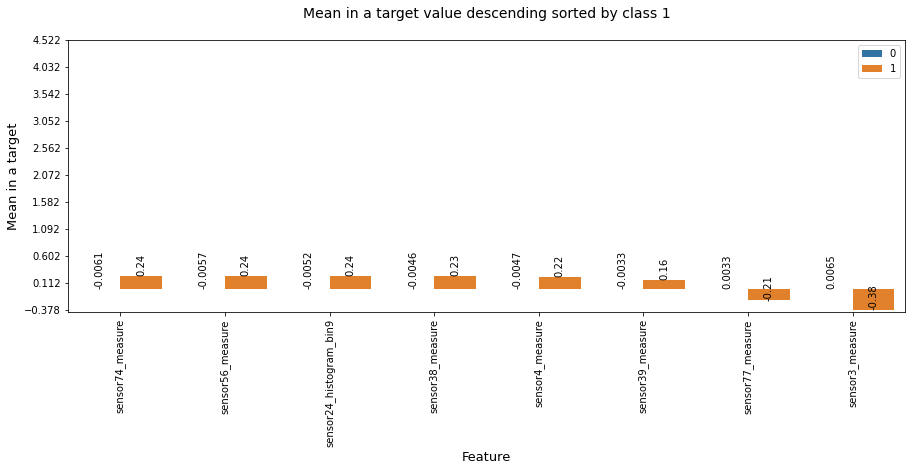

In [ ]:
try:
    plot_diagram(column_higher_reading,mean_higher_reading,one_zero_higher_reading,"Mean",1)
except ValueError:
    pass

<h3>Compare the target 0 and target 1 median values feature wise after median value imputing</h3>

In [ ]:
column_list=[]
median_list=[]
one_zero=[]


for column in list(new_x_smotetomek_df.columns.values):
    
    if column!="target":

        column_list.append(column)
        one_zero.append(0)
        median_list.append(new_x_smotetomek_df[column][new_x_smotetomek_df.target==0].median())

        column_list.append(column)
        one_zero.append(1)
        median_list.append(new_x_smotetomek_df[column][new_x_smotetomek_df.target==1].median())

**Find the features where the difference between the medians of the two classes is more than .15<br>
descending sorted by class 1**

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:median_list[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
counter=0
new_column_list=[]
new_median_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_median_list.append(median_list[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_median_list.append(median_list[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 117 sensors.


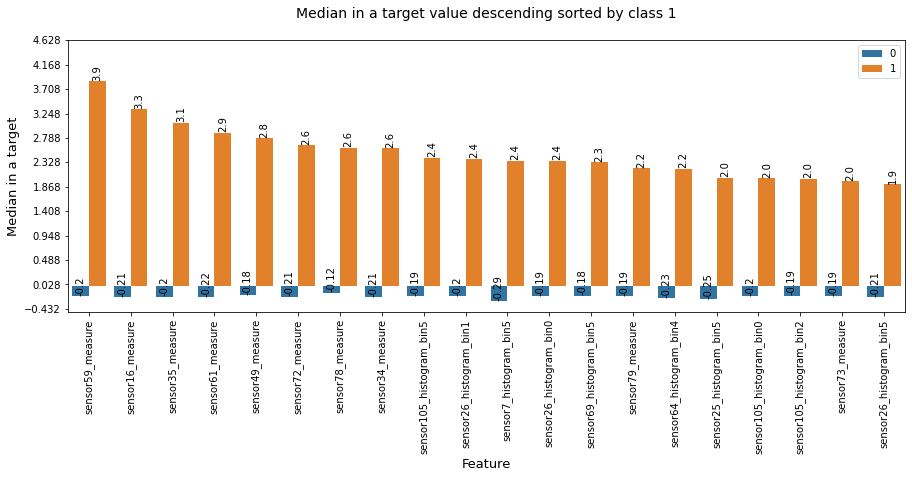

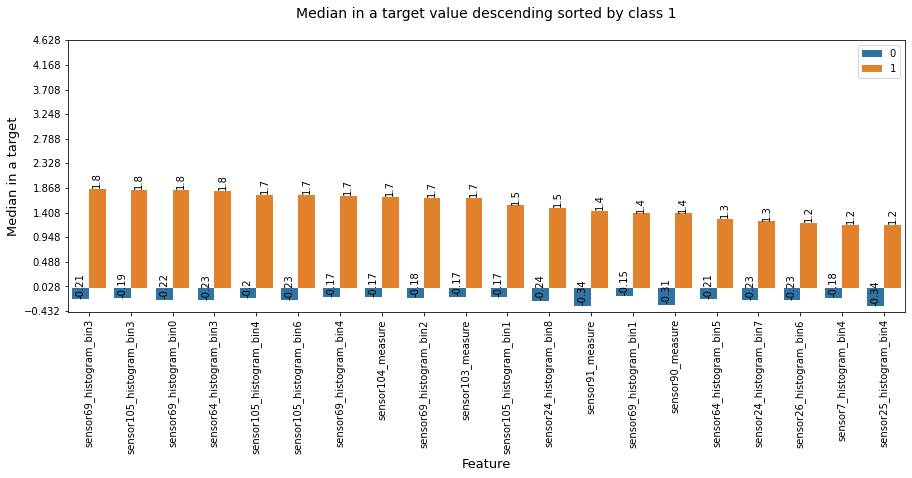

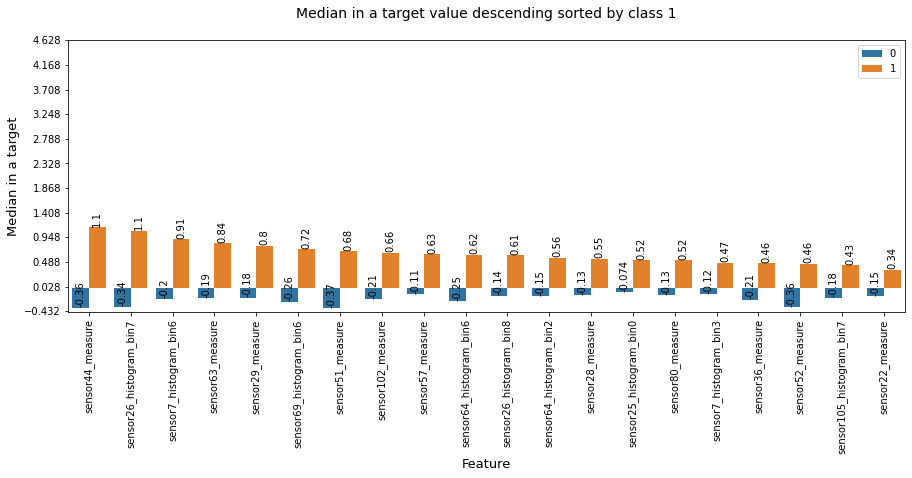

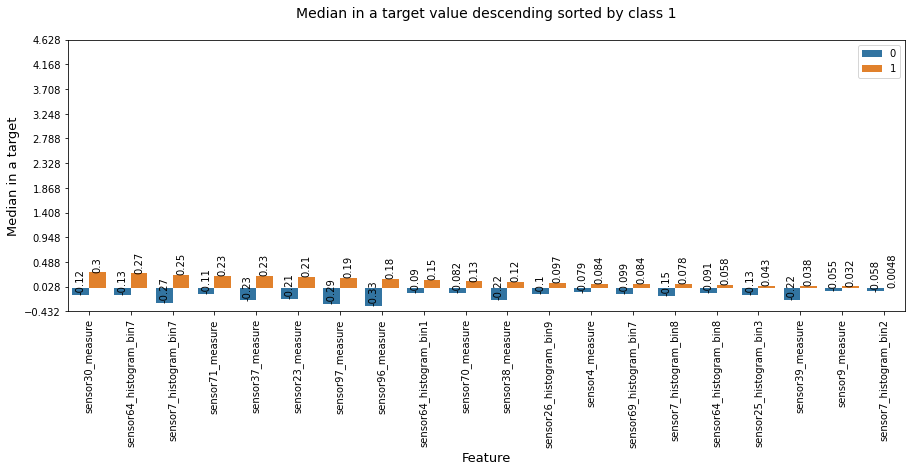

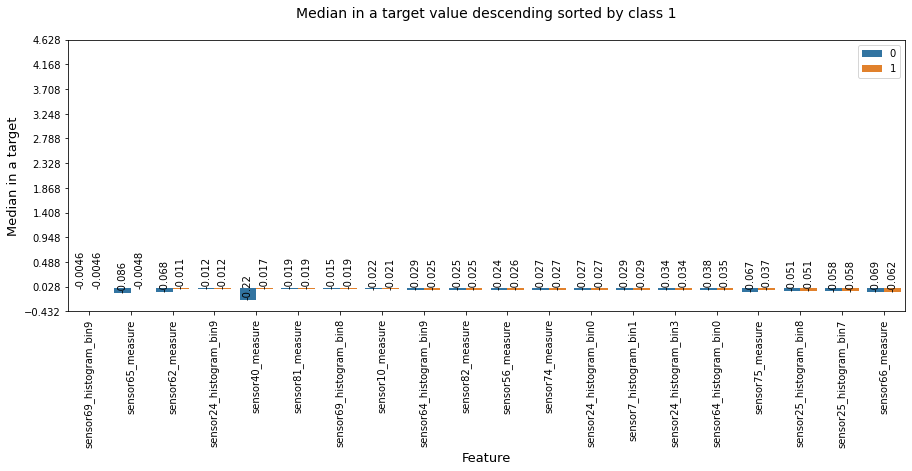

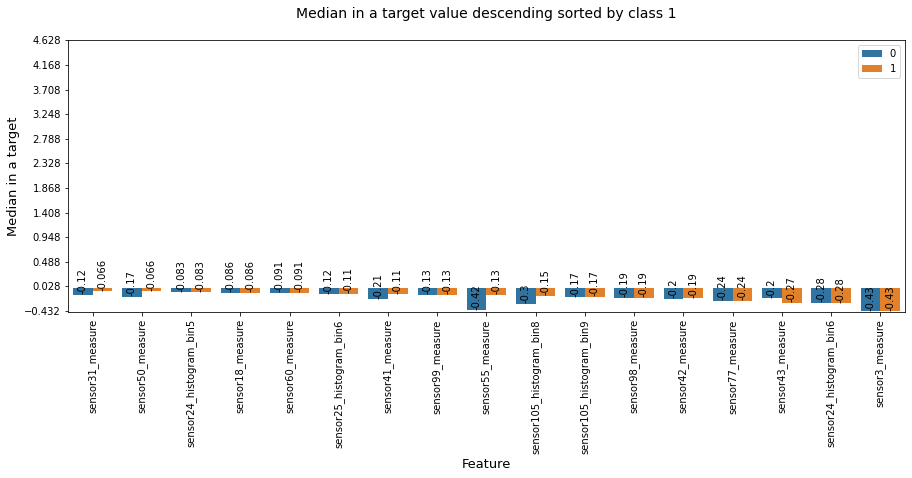

In [ ]:
try:
    plot_diagram(new_column_list,new_median_list,new_one_zero,"Median",1)
except ValueError:
    pass

**Observation** : All the median values that we have taken from every median imputed feature, we come to know that there is a difference between both the types of the failures but most of the surface failures go down to a negative value.

In [ ]:
counter=0
median_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    
    if (np.abs(np.abs(median_list[i])-np.abs(median_list[i-1]))>=.15):
        median_higher_reading.append(median_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        median_higher_reading.append(median_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])


        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between median readings of surface and downhole failures.".format(counter))

So we have approximate 64 sensor that show significant difference (> .15) between median readings of surface and downhole failures.


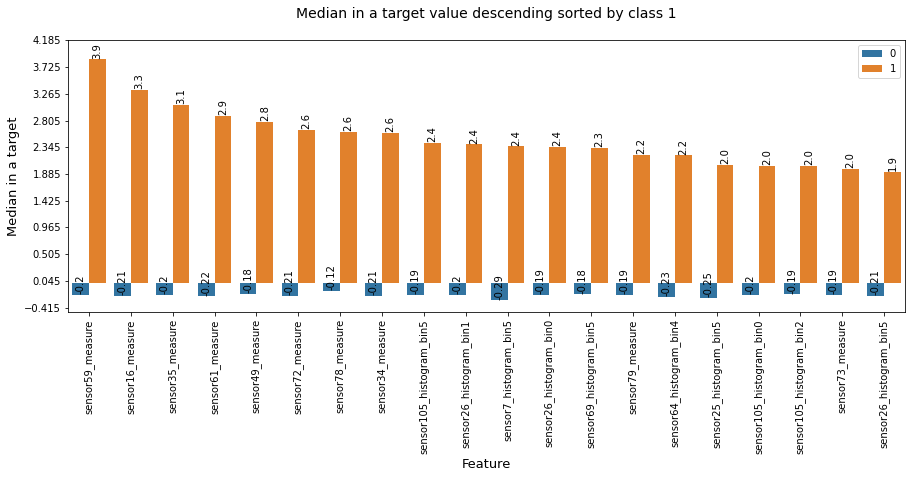

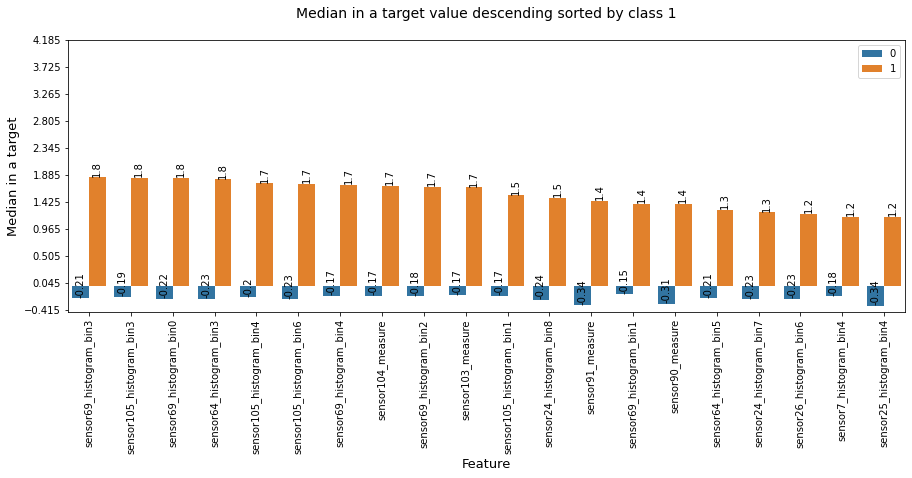

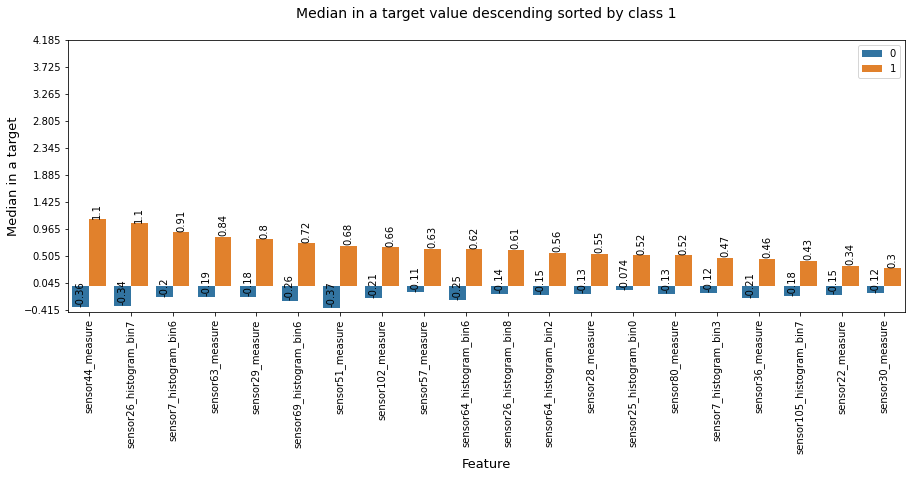

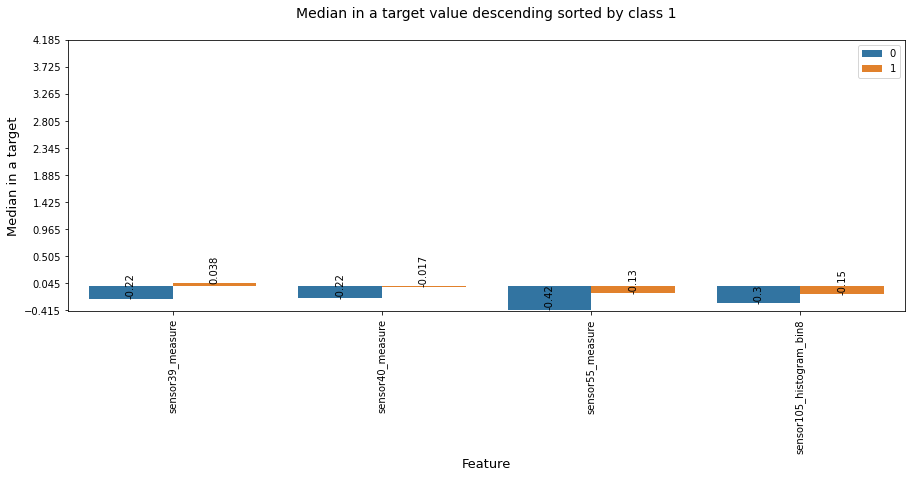

In [ ]:
try:
    plot_diagram(column_higher_reading,median_higher_reading,one_zero_higher_reading,"Median",1)
except ValueError:
    pass

### Basic Classifier

In [ ]:
new_x_smotetomek_df.drop("target",axis=1,inplace=True)

In [ ]:
print(dummy_classifier_based_on_median(new_x_smotetomek_df.loc[63454],
                                       column_list,
                                       median_list))

Predicted downhole failure.
[32, 85]


In [ ]:
print(dummy_classifier_based_on_median(new_standard_test_smotetomek_all_features_df.loc[1700],
                                       column_list,
                                       median_list))

Predicted surface failure.
[109, 8]


In [ ]:
new_x_smotetomek_df["target"]=y_smotetomek

### EDA for the dataset

**Using histograms, plots find out the nature of means for features for both the classes and thereby, the outliers.**

In [ ]:
mean_0=[]
mean_1=[]
for column in list(new_x_smotetomek_df.columns.values):
    if column!="target":
        mean_0.append(new_x_smotetomek_df[new_x_smotetomek_df.target==0][column].mean())
        mean_1.append(new_x_smotetomek_df[new_x_smotetomek_df.target==1][column].mean())

In [ ]:
median_0=[]
median_1=[]
for column in list(new_x_smotetomek_df.columns.values): 
    if column!="target":
        median_0.append(new_x_smotetomek_df[new_x_smotetomek_df.target==0][column].median())
        median_1.append(new_x_smotetomek_df[new_x_smotetomek_df.target==1][column].median())

**10) Try and plot it’s histogram for both the target values.**

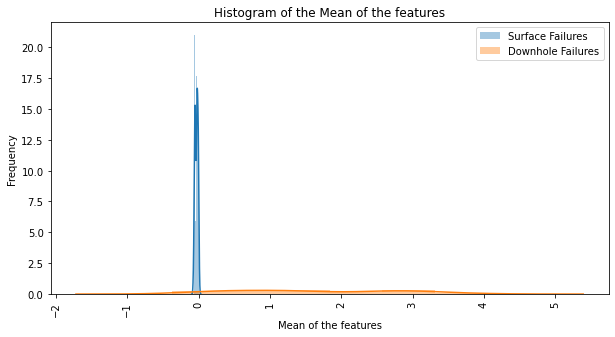

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(mean_0, hist=True, label="Surface Failures")
sns.distplot(mean_1, hist=True, label="Downhole Failures")
plt.title('Histogram of the Mean of the features')
plt.ylabel('Frequency')
plt.xlabel('Mean of the features')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
Here for the surface and downhole failures, we can see that the different downhole features have more variance.
Whereas the majority of the surface related features have a very similar value.

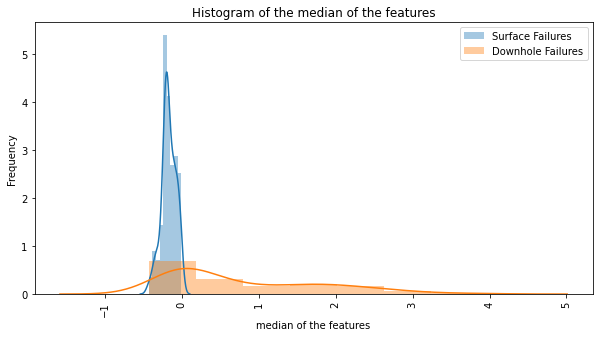

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(median_0, hist=True, label="Surface Failures")
sns.distplot(median_1, hist=True, label="Downhole Failures")
plt.title('Histogram of the median of the features')
plt.ylabel('Frequency')
plt.xlabel('median of the features')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
Here for the surface and downhole failures, we can see that the different downhole features have more variance. Whereas the majority of the surface related features have a very similar value.

**11) Try box plot / voilin plot to visualize the outliers.**

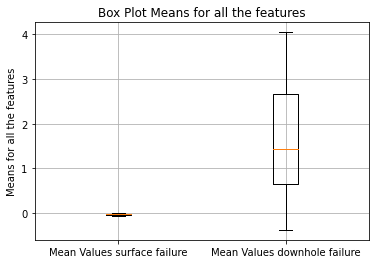

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([mean_0, mean_1])
plt.title('Box Plot Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

**Observations :**<br>
**The majority of the values for the surface failures lie near 0 whereas for the downhole failures, we can see all kinds of variation.**

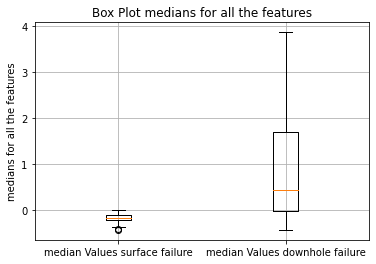

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([median_0, median_1])
plt.title('Box Plot medians for all the features')
plt.xticks([1,2],('median Values surface failure','median Values downhole failure'))
plt.ylabel('medians for all the features')
plt.grid()
plt.show()

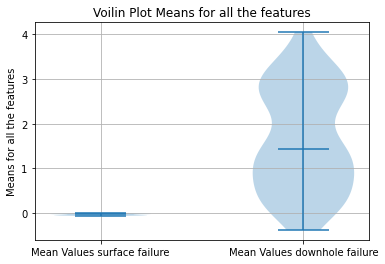

In [ ]:
plt.violinplot([mean_0, mean_1], showmeans=False, showmedians=True)
plt.title('Voilin Plot Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

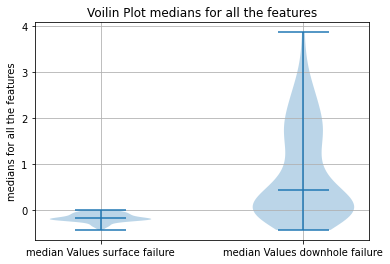

In [ ]:
plt.violinplot([median_0, median_1], showmeans=False, showmedians=True)
plt.title('Voilin Plot medians for all the features')
plt.xticks([1,2],('median Values surface failure','median Values downhole failure'))
plt.ylabel('medians for all the features')
plt.grid()
plt.show()

**PCA**

In [81]:
new_x_smotetomek_df.drop("target",axis=1,inplace=True)

In [82]:
"target" in new_x_smotetomek_df.columns

False

[[-10.234793    -0.3979547    0.        ]
 [ -6.767308    -0.92511797   0.        ]
 [-11.480434     0.30759192   0.        ]
 ...
 [ -1.288987    -0.20813158   1.        ]
 [ 14.657278     4.2855315    1.        ]
 [ 17.489021   -14.223328     1.        ]]


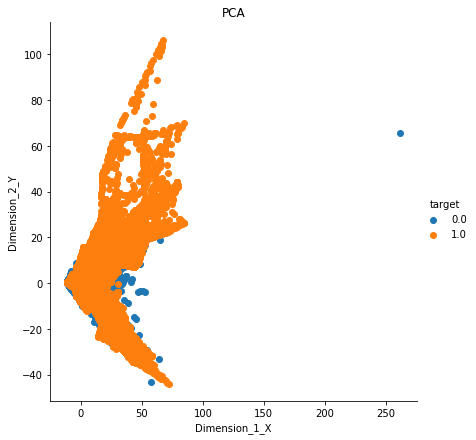

CPU times: user 789 ms, sys: 118 ms, total: 907 ms
Wall time: 785 ms


In [83]:
%%time
run_pca(new_x_smotetomek_df,y_smotetomek)

**Observation :**<br>
1) Observe that PCA is not able to differentiate properly the surface failures from the downhole failures. <br>
2) Not all the the surface and downhole features are coming under the same category.

### Perform a similar EDA on the outliers.

#### Here we take the outliers from the features that have been selected.
#### For each sensor we find the outliers that also classwise.
#### The issue is that there maybe high outliers here , but there maybe lower outliers here as well.

https://www.geeksforgeeks.org/interquartile-range-and-quartile-deviation-using-numpy-and-scipy/<br>
**Higher outlier = more than 1.5 ⋅ IQR above the third quartile.**<br>
**Lower outlier = less than 1.5 . IQR below the first quartile.**<br>
**The IQR is the difference between Q3 and Q1.**

In [ ]:
new_x_smotetomek_df["target"]=y_smotetomek

In [ ]:
counter=0
main_dictionary=dict()
outliers=[]
list_of_outliers_features_classes=[]
for i in range(len(column_list)):
    d=dict()
    new_list=new_x_smotetomek_df[new_x_smotetomek_df.target==one_zero[i]]\
    [column_list[i]]      
    new_index=list(new_list.reset_index()["index"])
    QR1=np.percentile(new_list, 25)
    QR3=np.percentile(new_list, 75)
    IQR=QR3-QR1
    for index,value in zip(new_index,new_list):    
        if (value>(QR3+(IQR*1.5))) or (value<(QR1-(IQR*1.5))):
            counter=counter+1
            d.update({index:value})
            if index not in main_dictionary:
                main_dictionary.update({index:list(new_x_smotetomek_df.loc[index])})
    list_of_outliers_features_classes.append(d)
    del d
    outliers.append(counter)
    counter=0

In [ ]:
print("Total number of data points that are outliers in atleast one or more than one feature : ",len(np.unique(list(main_dictionary.keys()))))

Total number of data points that are outliers in atleast one or more than one feature :  79724


In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:outliers[i] for i in index}

d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])
    
counter=0
new_column_list=[]
new_outliers_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_outliers_list.append(outliers[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_outliers_list.append(outliers[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 117 sensors.


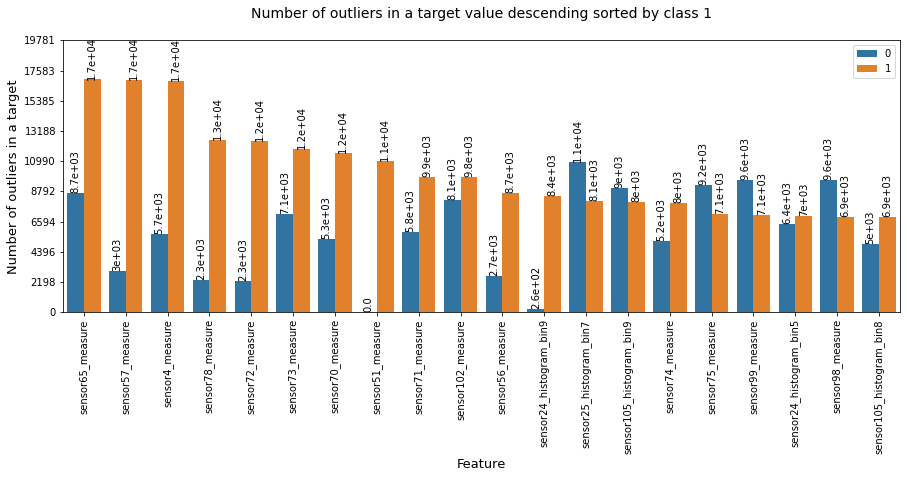

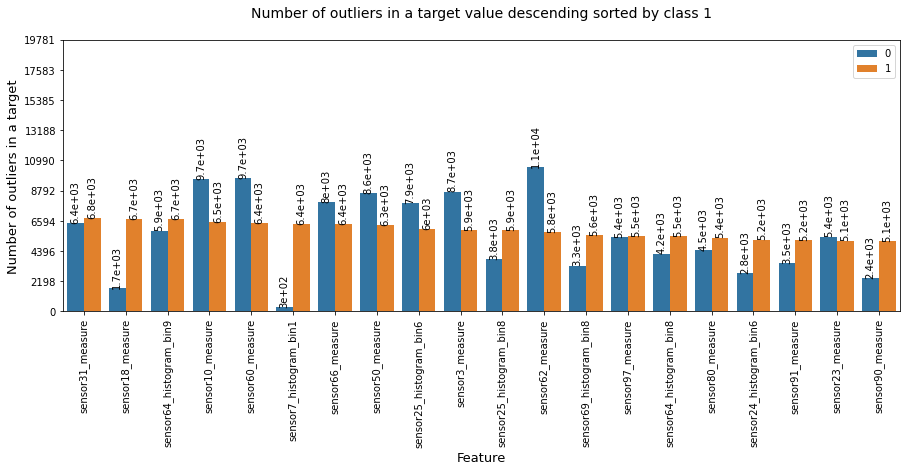

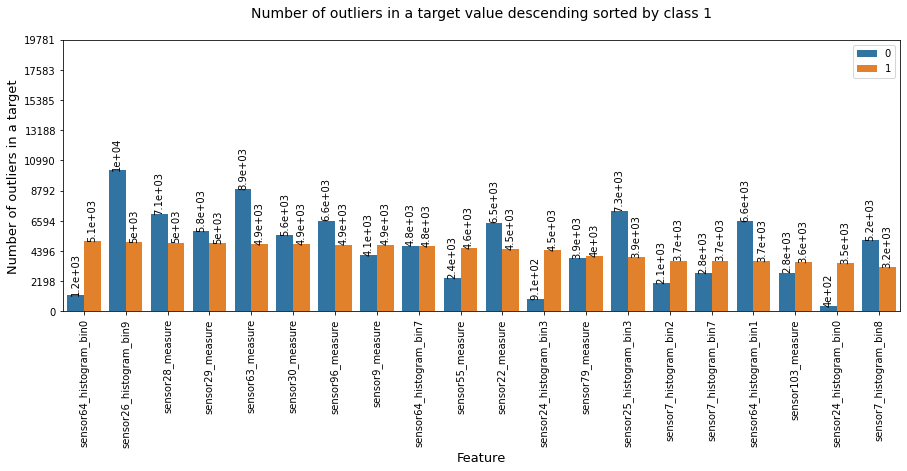

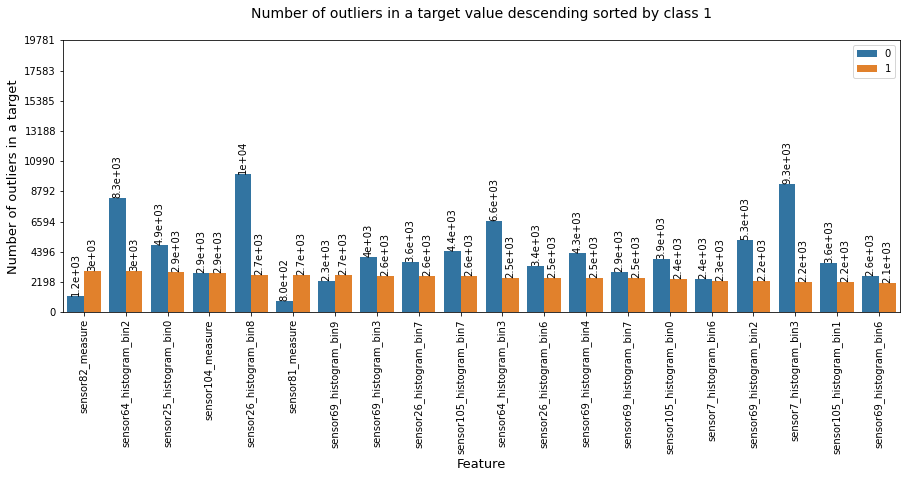

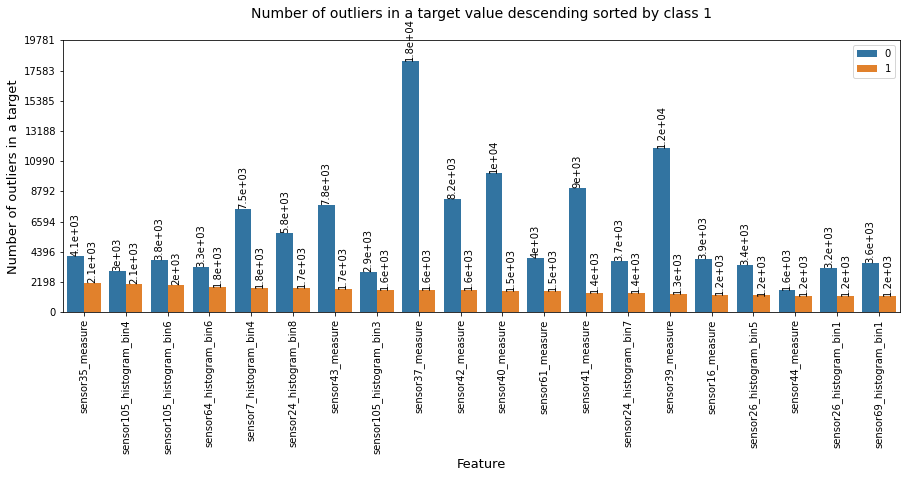

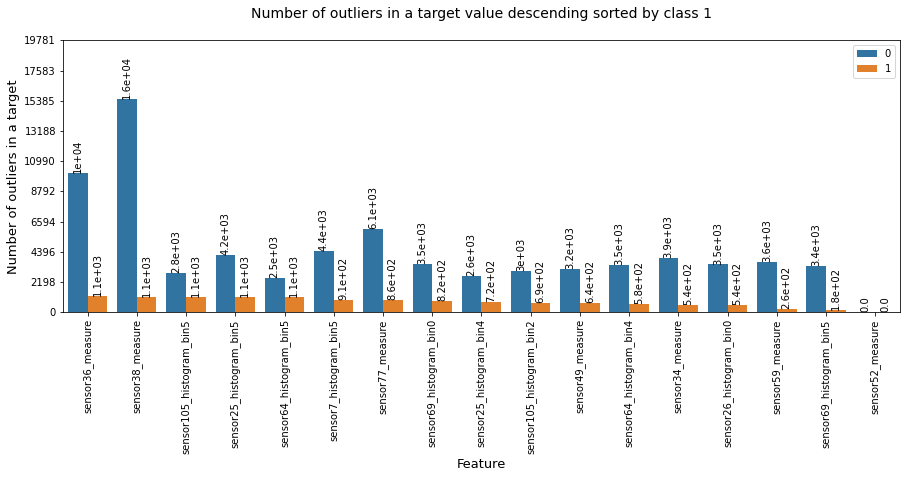

In [ ]:
try:
    plot_diagram(new_column_list,new_outliers_list,new_one_zero,"Number of outliers",1)
except ValueError:
    pass

**Observation :**<br>
Number of outliers are present for both the surface failures as well as the downhole failure.<br>
The number of outliers for downhole failures have been increased.

### For every column feature, get the mean for the outliers for both class 0 and class 1.

In [ ]:
mean_0=[]
mean_1=[]
for i in range(0,len(list_of_outliers_features_classes),2):
    class_0=[ele for ele in list_of_outliers_features_classes[i].values()]
    class_1=[ele for ele in list_of_outliers_features_classes[i+1].values()]
    if (len(class_0)==0) :
        mean_0.append(0.01)
    else :
        mean_0.append(np.mean(class_0))

    if (len(class_1)==0):
        mean_1.append(0.01)
    else :
        mean_1.append(np.mean(class_1))

In [ ]:
median_0=[]
median_1=[]
for i in range(0,len(list_of_outliers_features_classes),2):
    class_0=[ele for ele in list_of_outliers_features_classes[i].values()]
    class_1=[ele for ele in list_of_outliers_features_classes[i+1].values()]
    if (len(class_0)==0) :
        median_0.append(0.01)
    else :
        median_0.append(np.median(class_0))

    if (len(class_1)==0):
        median_1.append(0.01)
    else :
        median_1.append(np.median(class_1))

### Plotting the mean and median for each feature class wise.

**10) Try and plot it’s histogram for both the target values.**

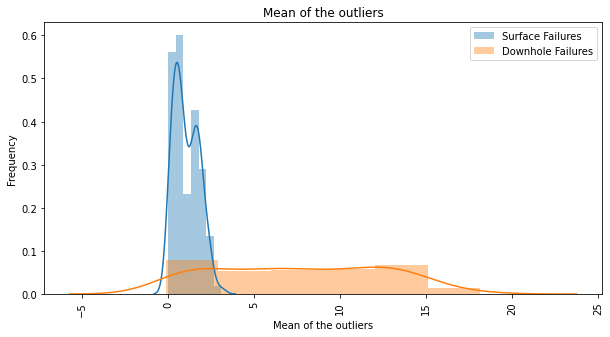

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(mean_0, hist=True, label="Surface Failures")
sns.distplot(mean_1, hist=True, label="Downhole Failures")
plt.title('Mean of the outliers')
plt.ylabel('Frequency')
plt.xlabel('Mean of the outliers')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**
For the outliers, majority of them seem to be concentrated around 0 for the surface outliers with variance as well.<br>
For downhole outliers they have less density but more variance in the other range values.

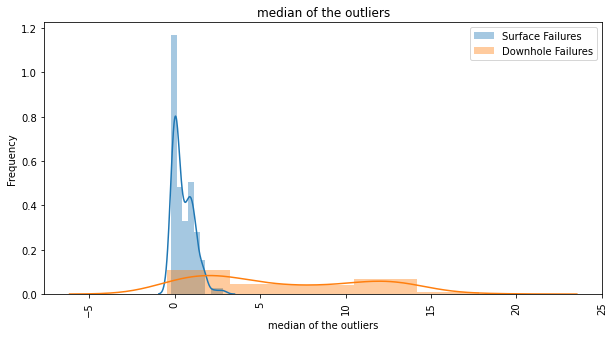

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(median_0, hist=True, label="Surface Failures")
sns.distplot(median_1, hist=True, label="Downhole Failures")
plt.title('median of the outliers')
plt.ylabel('Frequency')
plt.xlabel('median of the outliers')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**
For the outliers, majority of them seem to be concentrated around 0 for the surface outliers with variance as well.<br>
For downhole outliers they have less density but more variance in the other range values.

**11) Try box plot / voilin plot to visualize the outliers.**

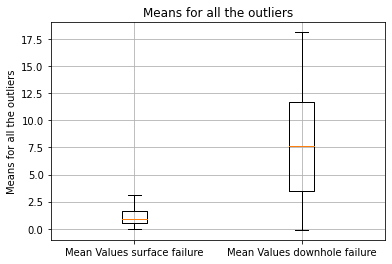

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([mean_0, mean_1])
plt.title('Means for all the outliers')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the outliers')
plt.grid()
plt.show()

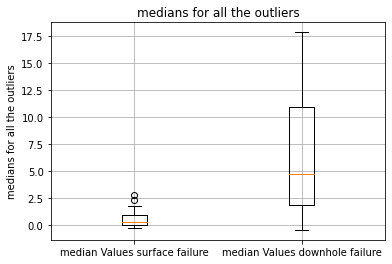

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([median_0, median_1])
plt.title('medians for all the outliers')
plt.xticks([1,2],('median Values surface failure','median Values downhole failure'))
plt.ylabel('medians for all the outliers')
plt.grid()
plt.show()

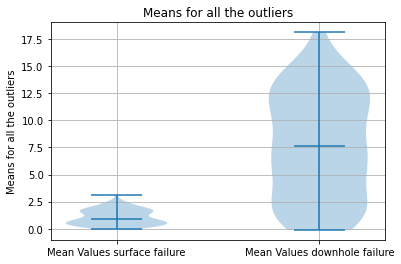

In [ ]:
plt.violinplot([mean_0, mean_1], showmeans=False, showmedians=True)
plt.title('Means for all the outliers')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the outliers')
plt.grid()
plt.show()

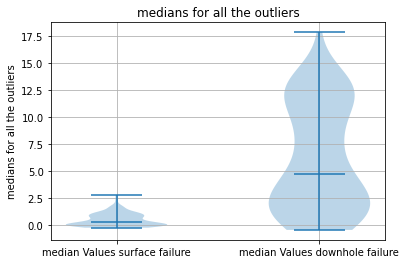

In [ ]:
plt.violinplot([median_0, median_1], showmeans=False, showmedians=True)
plt.title('medians for all the outliers')
plt.xticks([1,2],('median Values surface failure','median Values downhole failure'))
plt.ylabel('medians for all the outliers')
plt.grid()
plt.show()

**The outliers although for the surface related failures are denser near the 0-2.5 value, more variation can be seen only in downhole failure outliers. Both the means and the medians of the outliers are similar.**

### For the given data points and features enter new features that tell if these values were previously np.NaN or not.

In [ ]:
new_x_smotetomek_df.drop("target",axis=1,inplace=True)

In [ ]:
nan_x_smotetomek_df=fuse_dataframe_nan(new_x_smotetomek_df,nan_or_not,set(new_column_list))
nan_x_smotetomek_df["target"]=y_smotetomek
nan_x_smotetomek_df.head()

,sensor7_histogram_bin2,sensor105_histogram_bin3,sensor69_histogram_bin7,sensor64_histogram_bin2,sensor40_measure,sensor26_histogram_bin6,sensor73_measure,sensor78_measure,sensor64_histogram_bin0,sensor91_measure,...,sensor26_histogram_bin8,sensor7_histogram_bin5,sensor70_measure,sensor61_measure,sensor7_histogram_bin8,sensor4_measure,sensor26_histogram_bin9,sensor75_measure,sensor9_measure,target
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Now this is the problem out of the given data that we have , we select the features that have more than 50% np.NaNs

In [ ]:
counter=0
for column in new_x_smotetomek_df.columns.values:
    try:
        percent_of_nan=nan_x_smotetomek_df[column].value_counts()[1]/\
                (nan_x_smotetomek_df[column].value_counts()[0]+\
                 nan_x_smotetomek_df[column].value_counts()[1])
        if (percent_of_nan>.5) :
            counter=counter+1
            print(column,"  :  ",percent_of_nan)
    except KeyError:
        pass
print("Overall : ",counter," features with % of na's more than 50%")

sensor38_measure   :   0.6605416666666667
sensor39_measure   :   0.7348958333333333
sensor40_measure   :   0.77375
sensor41_measure   :   0.7967916666666667
sensor42_measure   :   0.8133125
sensor43_measure   :   0.822
Overall :  6  features with % of na's more than 50%


<h3>6) Impute np.NaN with median and then perform OneSidedSelection undersampling on the values.</h3>

In [18]:
data_type="oss_data"

In [ ]:
train_oss_all_features=train.copy()
y_train_oss_all_features=y_train.copy()
test_oss_all_features=test.copy()
y_test_oss_all_features=y_test.copy()

In [ ]:
train_oss_all_features.shape

(48000, 170)

In [ ]:
y_train_oss_all_features.shape

(48000,)

In [ ]:
test_oss_all_features.shape

(12000, 170)

In [ ]:
y_test_oss_all_features.shape

(12000,)

In [ ]:
for i ,j in zip(train_oss_all_features.columns.values,test_oss_all_features.columns.values):
    if (i!=j):
        print(i," : ",j)

In [ ]:
train_oss_all_features,y_train_oss_all_features=reset_index(train_oss_all_features,y_train_oss_all_features)
test_oss_all_features,y_test_oss_all_features=reset_index(test_oss_all_features,y_test_oss_all_features)

**Filling the np.NaN values with the median of the category this time.**

In [ ]:
l=[]
for ele in train_oss_all_features["sensor4_measure"]:
    if np.isnan(ele):
        pass
    else:
        l.append(ele) 
np.median(l)

126.0

In [ ]:
train_oss_all_features["sensor4_measure"].median()

126.0

Both are the same so the pandas.series.median() function ignores the value that has the np.NaN and does not even count it.<br>
Divide the whole dataframe into the number of categories that we have and then only enter the median for that feature for that particular category.

In [ ]:
train_oss_all_features,y_train_oss_all_features,test_oss_all_features,y_test_oss_all_features=\
impute_median_for_train_n_test_as_per_train(train_oss_all_features,
                                          y_train_oss_all_features,
                                          test_oss_all_features,
                                          y_test_oss_all_features,data_type)

In [ ]:
train_oss_all_features,y_train_oss_all_features=reset_index(train_oss_all_features,y_train_oss_all_features)
test_oss_all_features,y_test_oss_all_features=reset_index(test_oss_all_features,y_test_oss_all_features)

**Standardise the dataframe**

In [ ]:
standard_train_oss_all_features_df,standard_test_oss_all_features_df=standardize_test_n_train_wrt_train(train_oss_all_features,test_oss_all_features,data_type)

In [ ]:
standard_train_oss_all_features_df.shape

(48000, 170)

In [ ]:
standard_test_oss_all_features_df.shape

(12000, 170)

In [ ]:
y_train_oss_all_features.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: target, dtype: float32

In [ ]:
y_train_oss_all_features.tail()

47995    1.0
47996    1.0
47997    1.0
47998    1.0
47999    1.0
Name: target, dtype: float32

In [ ]:
"target" in standard_train_oss_all_features_df.columns

False

**Perform oss undersampling**

In [ ]:
%%time 
from imblearn.under_sampling import OneSidedSelection 
x_oss, y_oss = OneSidedSelection(random_state=42,sampling_strategy='majority',n_jobs=-1).fit_resample(standard_train_oss_all_features_df ,y_train_oss_all_features)
print("done")

done
CPU times: user 8min 29s, sys: 75.1 ms, total: 8min 30s
Wall time: 8min 8s


In [ ]:
x_oss.shape

(32461, 170)

In [ ]:
y_oss.value_counts()

0.0    31661
1.0      800
Name: target, dtype: int64

In [ ]:
y_oss.shape

(32461,)

**Truncated SVD to get the best features**

In [ ]:
#https://stackoverflow.com/questions/50796024/feature-variable-importance-after-a-pca-analysis

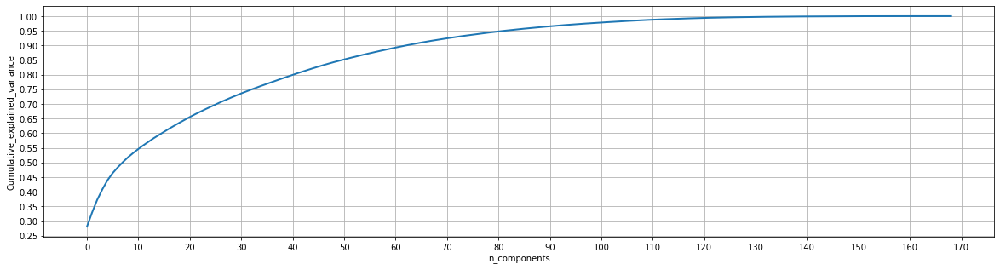

TruncatedSVD(n_components=169)

In [ ]:
truncated_svd(x_oss,169)

**I choose 120 components to describe my data as 120 components explain atleast 99% variance of the total data.** 

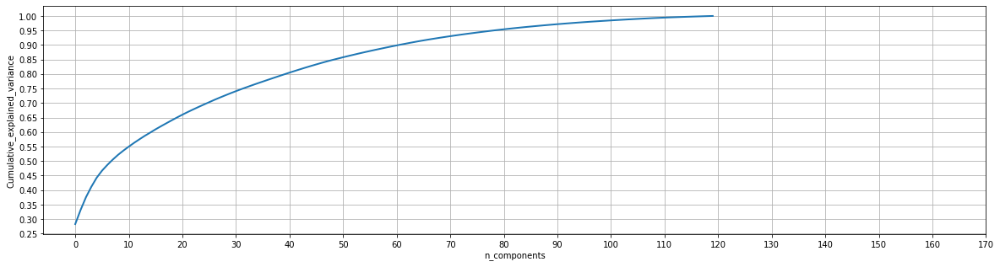

In [ ]:
svd=truncated_svd(x_oss,120)

**For the 120 principal components using svd.explained_variance_ratio_ find the variance distribution.**

In [ ]:
print(len(svd.explained_variance_ratio_))

120


In [ ]:
np.sum(svd.explained_variance_ratio_)

0.99351096

In [ ]:
svd.components_.shape

(120, 170)

In [ ]:
#number of features 
svd.components_.shape[1]

170

In [ ]:
#number of components
svd.components_.shape[0]

120

**For the 120 principal components find the feature importance.**

In [ ]:
set_number_of_features=120

### Trying Forward Feature selection

**Here, in forward feature selection, out of 170 features even if I choose to select 10 features only , still it will take a lot of time.<br>
Therefore I go with recursive feature elimination.<br>
Using Recursive Feature Elimination, I can get the features that I need.**

In [ ]:
x_oss.shape

(32461, 170)

In [ ]:
%%time
new_x_oss_df=recursive_feature_elimination(
    x_oss,
    y_oss,
    int(set_number_of_features+np.round((len(train.columns.values)-set_number_of_features)/2))
)

Rankings :  [1 1 1 1 2 1 3 1 1 1 1 1 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 3 3 4 3 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1]
Selected indices :
 1    155
4      5
3      5
2      5
dtype: int64
CPU times: user 5min 35s, sys: 762 ms, total: 5min 36s
Wall time: 4min 9s


In [ ]:
new_x_oss_df.head()

,sensor1_measure,sensor2_measure,sensor3_measure,sensor4_measure,sensor6_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,...,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor107_measure
0,-0.411826,-0.09191,-0.432133,-0.110448,-0.056429,-0.028788,-0.057799,-0.115367,-0.180423,-0.337594,...,-0.306849,-0.386440,-0.393188,-0.383595,-0.370158,-0.310694,-0.198786,-0.307802,-0.170285,-0.024286
1,-0.209185,-0.09191,-0.432133,-0.078741,-0.056429,-0.028788,-0.057799,-0.115367,-0.179786,-0.231174,...,-0.167010,-0.104268,-0.025683,-0.045527,-0.128090,-0.199055,-0.168927,-0.201433,-0.163656,-0.024286
2,0.226385,-0.09191,2.314107,0.276872,-0.056429,-0.028788,-0.057799,-0.115367,-0.175033,0.318588,...,0.093053,0.064536,0.132146,0.278645,0.573132,0.835714,-0.017869,-0.288574,-0.170285,-0.024286
3,0.027280,-0.09191,-0.432131,0.303606,-0.056429,-0.028788,-0.057799,-0.115367,-0.180203,-0.309964,...,0.209944,0.283329,0.340889,0.186015,0.040885,-0.036827,-0.114241,0.062849,-0.076776,-0.024286
4,-0.365136,-0.09191,2.314107,-0.081228,-0.056429,-0.028788,-0.057799,-0.115367,-0.179181,-0.312623,...,-0.289277,-0.366399,-0.370365,-0.351000,-0.151964,-0.309595,-0.196638,-0.307248,-0.168976,-0.024286


**Try spearman corelation coefficient to find out co relation. (It is good for cause and affect analysis but it might not be of much use when we find that our features are dependent on other features, we expect our features to be independent of each other.).**

In [ ]:
%%time
spearman=select_spearman(new_x_oss_df,int(set_number_of_features+np.floor((len(train.columns.values)-set_number_of_features)/2)))

If I take the data having correlation between only -.1 and .1 range then I get  0  features.
If I take the data having correlation between only -.90 and .90 range then I get  89  features.
If I take the data having correlation between only -.95 and .95 range then I get  107  features.
If I take the data having correlation between only -.97 and .97 range then I get  128  features.
If I take the data having correlation between only -.98 and .98 range then I get  135  features.
If I take the data having correlation between only -.99 and .99 range then I get  139  features.
If I take the data having correlation between only -.999 and .999 range then I get  148  features.
CPU times: user 13.1 s, sys: 48.4 ms, total: 13.1 s
Wall time: 13.1 s


In [ ]:
new_x_oss_df=perform_spearman(new_x_oss_df,spearman,.97)

In [ ]:
new_x_oss_df.head()

,sensor2_measure,sensor3_measure,sensor4_measure,sensor6_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,...,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor107_measure
0,-0.09191,-0.432133,-0.110448,-0.056429,-0.028788,-0.057799,-0.115367,-0.180423,-0.337594,-0.426915,...,-0.306849,-0.386440,-0.393188,-0.383595,-0.370158,-0.310694,-0.198786,-0.307802,-0.170285,-0.024286
1,-0.09191,-0.432133,-0.078741,-0.056429,-0.028788,-0.057799,-0.115367,-0.179786,-0.231174,-0.094145,...,-0.167010,-0.104268,-0.025683,-0.045527,-0.128090,-0.199055,-0.168927,-0.201433,-0.163656,-0.024286
2,-0.09191,2.314107,0.276872,-0.056429,-0.028788,-0.057799,-0.115367,-0.175033,0.318588,0.527328,...,0.093053,0.064536,0.132146,0.278645,0.573132,0.835714,-0.017869,-0.288574,-0.170285,-0.024286
3,-0.09191,-0.432131,0.303606,-0.056429,-0.028788,-0.057799,-0.115367,-0.180203,-0.309964,0.316092,...,0.209944,0.283329,0.340889,0.186015,0.040885,-0.036827,-0.114241,0.062849,-0.076776,-0.024286
4,-0.09191,2.314107,-0.081228,-0.056429,-0.028788,-0.057799,-0.115367,-0.179181,-0.312623,-0.357524,...,-0.289277,-0.366399,-0.370365,-0.351000,-0.151964,-0.309595,-0.196638,-0.307248,-0.168976,-0.024286


In [ ]:
new_x_oss_df.shape

(32461, 128)

In [ ]:
y_oss.shape

(32461,)

In [ ]:
new_standard_test_oss_all_features_df=standard_test_oss_all_features_df[new_x_oss_df.columns.values]
new_standard_test_oss_all_features_df.head()

,sensor2_measure,sensor3_measure,sensor4_measure,sensor6_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,...,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor107_measure
0,-0.09191,-0.432133,-0.078741,-0.056429,-0.028788,-0.057799,-0.115367,-0.180209,-0.225051,0.291359,...,-0.072308,0.057907,0.125870,0.099242,0.163299,0.280228,-0.005584,-0.208069,-0.168607,-0.024286
1,-0.09191,2.314107,0.135746,-0.056429,-0.028788,-0.057799,-0.115367,-0.180150,0.066724,0.750312,...,0.039671,0.138756,0.167661,0.197075,0.406800,0.754810,0.221194,1.813683,0.117853,-0.024286
2,-0.09191,-0.432133,-0.115422,-0.056429,-0.028788,-0.057799,-0.115367,-0.180461,-0.336576,-0.426838,...,-0.307366,-0.386519,-0.393192,-0.383560,-0.370202,-0.310778,-0.198829,-0.307802,-0.170285,-0.024286
3,-0.09191,2.314107,-0.114800,-0.056429,-0.028788,-0.057799,-0.115367,-0.180276,-0.334237,-0.426611,...,-0.306402,-0.385988,-0.392942,-0.382904,-0.369753,-0.310692,-0.198829,-0.307802,-0.170285,0.206916
4,-0.09191,2.314107,0.041869,-0.056429,-0.028788,-0.057799,-0.115367,-0.180369,-0.273727,0.202382,...,-0.122351,-0.103468,-0.047627,0.104776,0.244433,0.125151,-0.056531,0.334861,0.260346,-0.024286


In [ ]:
#new_x_oss_df.to_pickle("new_x_oss_df.pickle")
#y_oss.to_pickle("y_oss.pickle")

#new_standard_test_oss_all_features_df.to_pickle("new_standard_test_oss_all_features_df.pickle")
#y_test_oss_all_features.to_pickle("y_test_oss_all_features.pickle")

In [84]:
#new_x_oss_df=pd.read_pickle("/content/gdrive/My Drive/new_x_oss_df.pickle")
#y_oss=pd.read_pickle("/content/gdrive/My Drive/y_oss.pickle")
                                   
#new_standard_test_oss_all_features_df=pd.read_pickle("/content/gdrive/My Drive/new_standard_test_oss_all_features_df.pickle")
#y_test_oss_all_features=pd.read_pickle("/content/gdrive/My Drive/y_test_oss_all_features.pickle")

In [ ]:
np.save('new_x_oss_df_columns.npy',new_x_oss_df.columns.values)

In [85]:
new_x_oss_df["target"]=y_oss
new_x_oss_df.head()

,sensor2_measure,sensor3_measure,sensor4_measure,sensor6_measure,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,sensor7_histogram_bin6,sensor7_histogram_bin7,sensor7_histogram_bin8,sensor7_histogram_bin9,sensor9_measure,sensor10_measure,sensor16_measure,sensor18_measure,sensor20_measure,sensor21_measure,sensor22_measure,sensor23_measure,sensor24_histogram_bin0,sensor24_histogram_bin3,sensor24_histogram_bin4,sensor24_histogram_bin5,sensor24_histogram_bin6,sensor24_histogram_bin7,sensor24_histogram_bin8,sensor24_histogram_bin9,sensor25_histogram_bin0,sensor25_histogram_bin1,sensor25_histogram_bin2,sensor25_histogram_bin3,sensor25_histogram_bin4,sensor25_histogram_bin5,sensor25_histogram_bin6,sensor25_histogram_bin7,sensor25_histogram_bin8,sensor26_histogram_bin0,sensor26_histogram_bin1,...,sensor69_histogram_bin6,sensor69_histogram_bin7,sensor69_histogram_bin8,sensor70_measure,sensor71_measure,sensor72_measure,sensor73_measure,sensor74_measure,sensor75_measure,sensor77_measure,sensor78_measure,sensor79_measure,sensor80_measure,sensor81_measure,sensor82_measure,sensor83_measure,sensor84_measure,sensor90_measure,sensor91_measure,sensor94_measure,sensor95_measure,sensor98_measure,sensor99_measure,sensor100_measure,sensor101_measure,sensor102_measure,sensor103_measure,sensor104_measure,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor107_measure,target
0,-0.09191,-0.432133,-0.110448,-0.056429,-0.028788,-0.057799,-0.115367,-0.180423,-0.337594,-0.426915,-0.352896,-0.156730,-0.029573,-0.055001,-0.022185,-0.324165,-0.086423,-0.03992,-0.014018,-0.167819,-0.242632,-0.026929,-0.034450,-0.027878,-0.083133,-0.330240,-0.296833,-0.264360,-0.012042,-0.098999,-0.121660,-0.069899,-0.133467,-0.361246,-0.326530,-0.111880,-0.058471,-0.050906,-0.369490,-0.384762,...,-0.460614,-0.159043,-0.016646,-0.114829,-0.149007,-0.552397,-0.226258,-0.026793,-0.067539,-0.238277,-0.589683,-0.323276,-0.178443,-0.018598,-0.025464,-0.008014,-0.083804,-0.475921,-0.511690,-0.438533,-0.463142,-0.185186,-0.127829,-0.018679,-0.027278,-0.224763,-0.404309,-0.416001,-0.302110,-0.306849,-0.386440,-0.393188,-0.383595,-0.370158,-0.310694,-0.198786,-0.307802,-0.170285,-0.024286,0.0
1,-0.09191,-0.432133,-0.078741,-0.056429,-0.028788,-0.057799,-0.115367,-0.179786,-0.231174,-0.094145,-0.203189,-0.156318,-0.029573,-0.055001,-0.022185,-0.247540,-0.086423,-0.03992,-0.014018,-0.170004,-0.250903,-0.026929,-0.034450,-0.027878,-0.027653,0.019798,-0.204953,-0.223919,-0.012042,-0.039722,-0.062648,-0.046839,-0.127249,-0.271058,-0.099884,-0.118707,-0.058450,-0.050906,-0.136385,-0.284885,...,-0.361452,-0.127120,-0.018465,-0.081672,-0.110379,-0.207972,-0.193647,-0.026793,-0.066670,-0.238277,-0.123843,-0.216425,-0.182974,-0.018598,-0.025464,-0.008014,-0.083804,0.223798,-0.043440,-0.166366,-0.244015,-0.187032,-0.127898,-0.018679,-0.027278,-0.210557,-0.165126,-0.172052,-0.258247,-0.167010,-0.104268,-0.025683,-0.045527,-0.128090,-0.199055,-0.168927,-0.201433,-0.163656,-0.024286,0.0
2,-0.09191,2.314107,0.276872,-0.056429,-0.028788,-0.057799,-0.115367,-0.175033,0.318588,0.527328,0.351014,0.110561,-0.029573,-0.055001,-0.022185,0.315152,-0.086423,-0.03992,-0.014018,-0.021180,1.006312,-0.026929,-0.034450,-0.027878,-0.083133,1.041712,-0.088098,0.079001,-0.012042,-0.037172,-0.063726,-0.039542,-0.123660,-0.350404,0.719456,-0.082490,-0.058471,-0.050906,0.461935,0.361505,...,0.767082,0.090748,-0.003555,0.137387,0.239649,0.942112,-0.114101,-0.026793,0.007628,0.514403,0.834765,0.469907,0.623494,-0.018598,-0.025464,-0.008014,-0.083804,1.341602,2.469441,0.265783,0.314260,-0.187032,-0.127898,-0.018679,-0.027278,0.266704,0.576310,0.628487,0.437684,0.093053,0.064536,0.132146,0.278645,0.573132,0.835714,-0.017869,-0.288574,-0.170285,-0.024286,0.0
3

<h3>Compare the target 0 and target 1 mean values feature wise after median value imputing</h3>

In [ ]:
column_list=[]
mean_list=[]
one_zero=[]
for column in list(new_x_oss_df.columns.values):
    if column!="target":
        column_list.append(column)
        one_zero.append(0)
        mean_list.append(new_x_oss_df[column][new_x_oss_df.target==0].mean())

        column_list.append(column)
        one_zero.append(1)
        mean_list.append(new_x_oss_df[column][new_x_oss_df.target==1].mean())

**Find the features where the difference between the means of the two classes is more than .15<br>
descending sorted by class 1**

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:mean_list[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
counter=0
new_column_list=[]
new_mean_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_mean_list.append(mean_list[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_mean_list.append(mean_list[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 128 sensors.


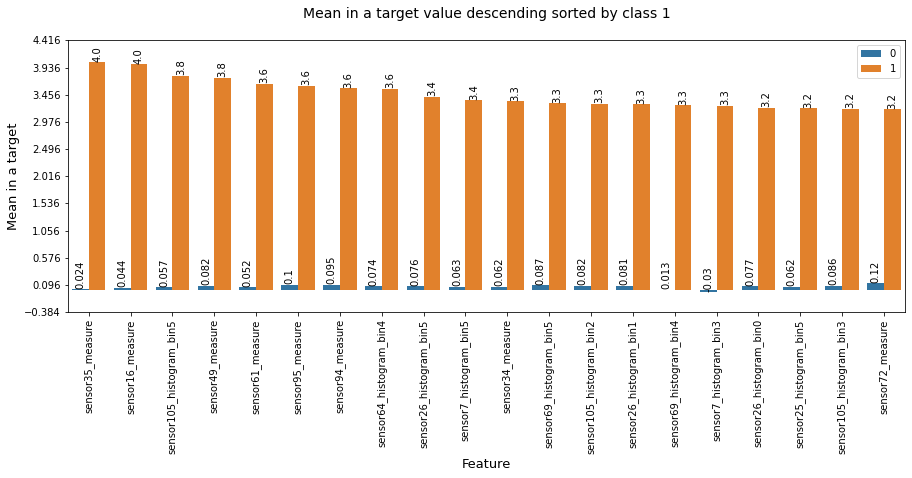

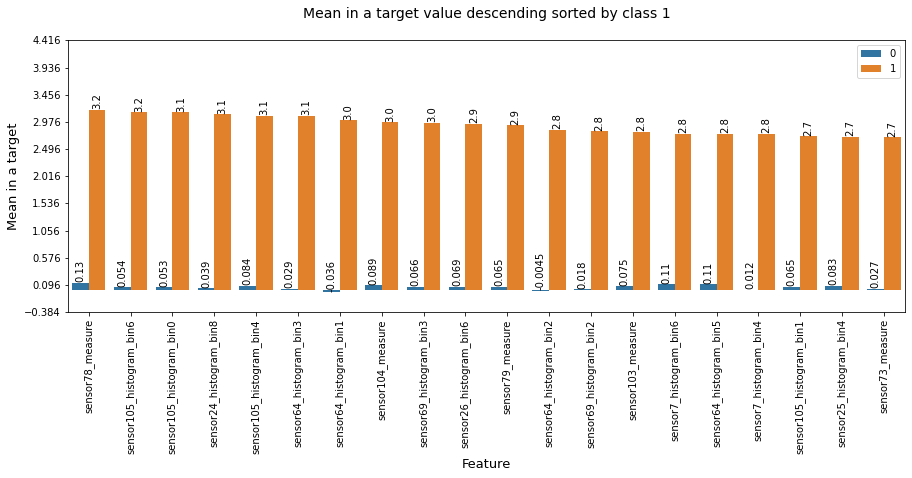

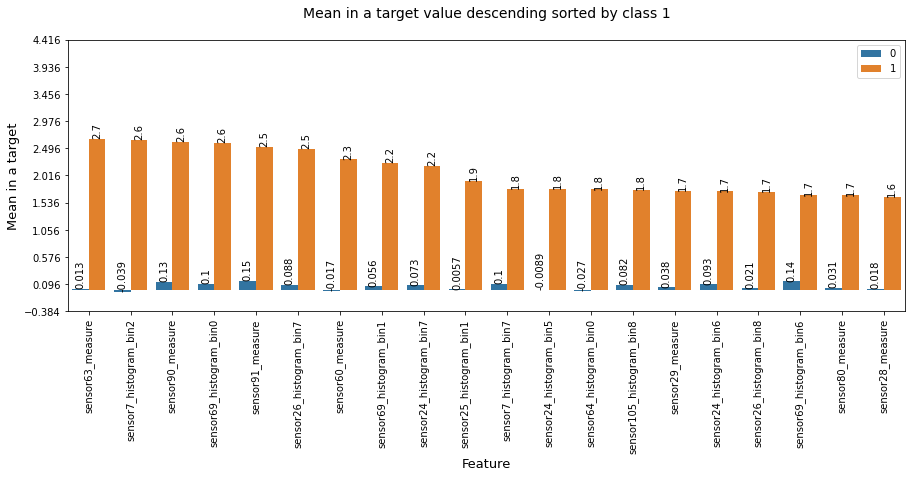

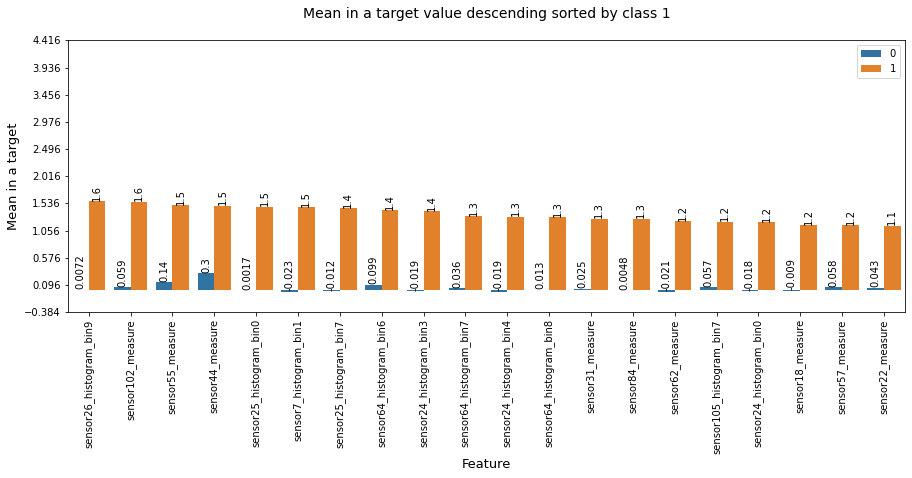

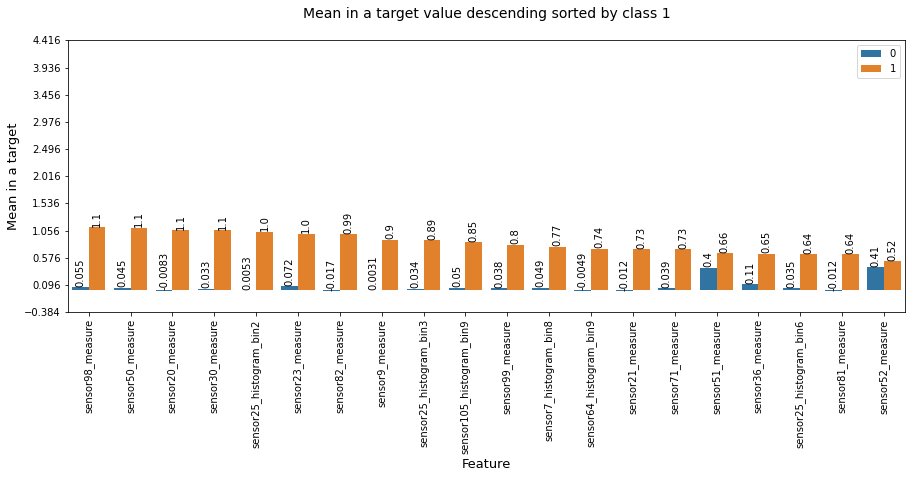

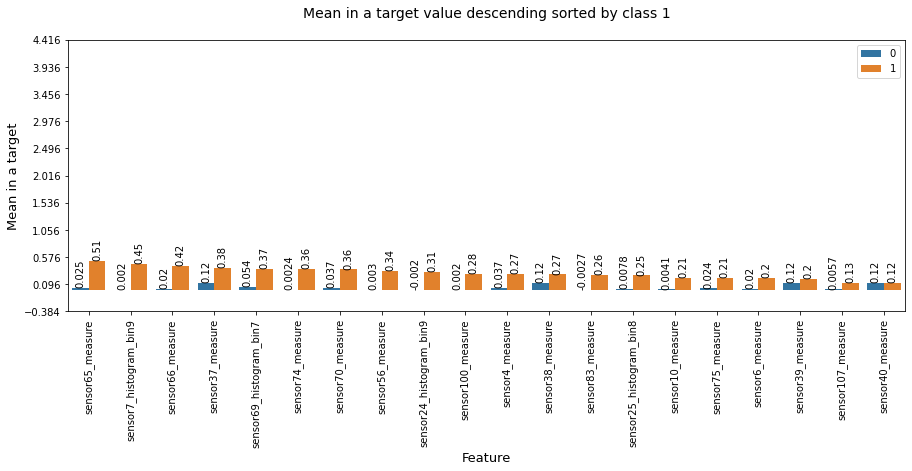

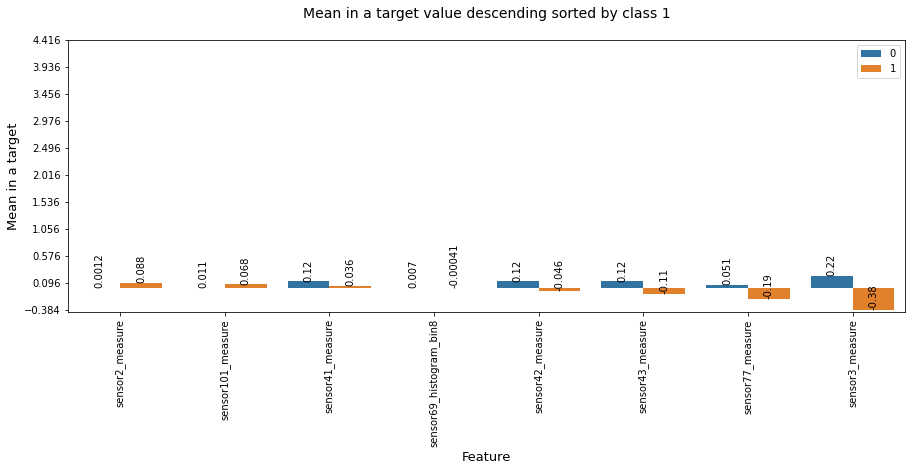

In [ ]:
try:
    plot_diagram(new_column_list,new_mean_list,new_one_zero,"Mean",1)
except ValueError:
    pass

**Observation** : All the mean values that we have taken from every median imputed oss feature,<br>
Observe that there is a significant difference between the means of the surface failures and the means of the downhole failures.<br>
Out of the selected features observe that the most of the features have a larger mean value for the downhole failure rather than that of the surface failures

In [ ]:
counter=0
mean_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    
    if (np.abs(np.abs(mean_list[i])-np.abs(mean_list[i-1]))>=.15):
        mean_higher_reading.append(mean_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        mean_higher_reading.append(mean_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])

        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between Mean readings of surface and downhole failures.".format(counter))

So we have approximate 117 sensor that show significant difference (> .15) between Mean readings of surface and downhole failures.


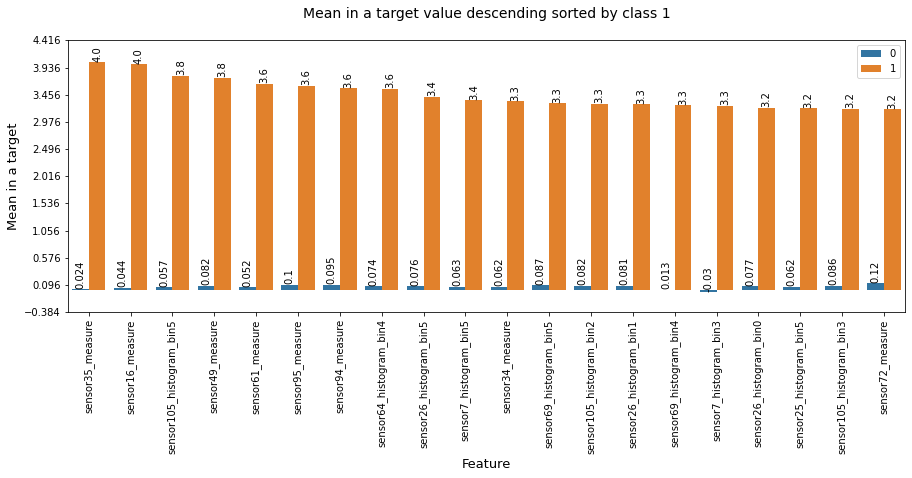

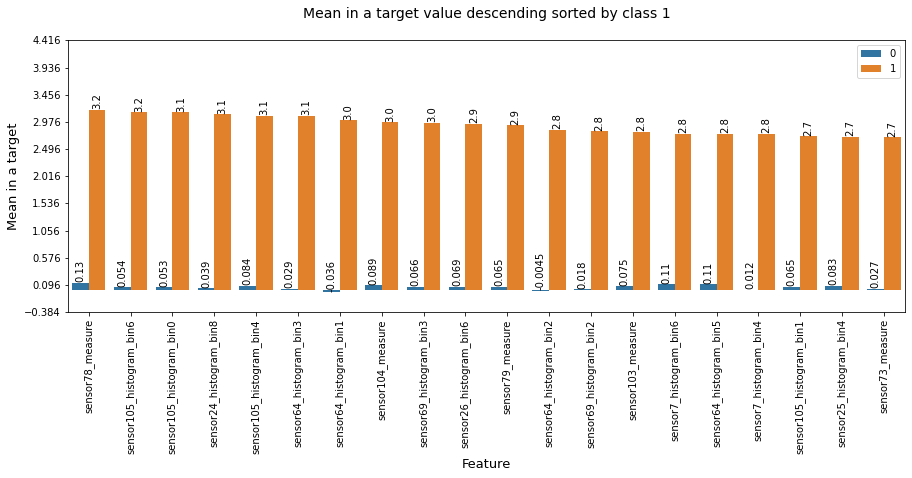

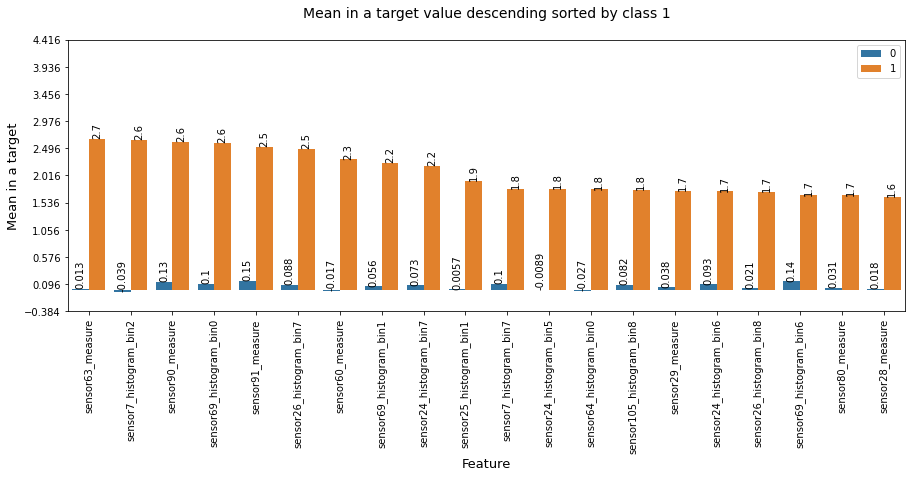

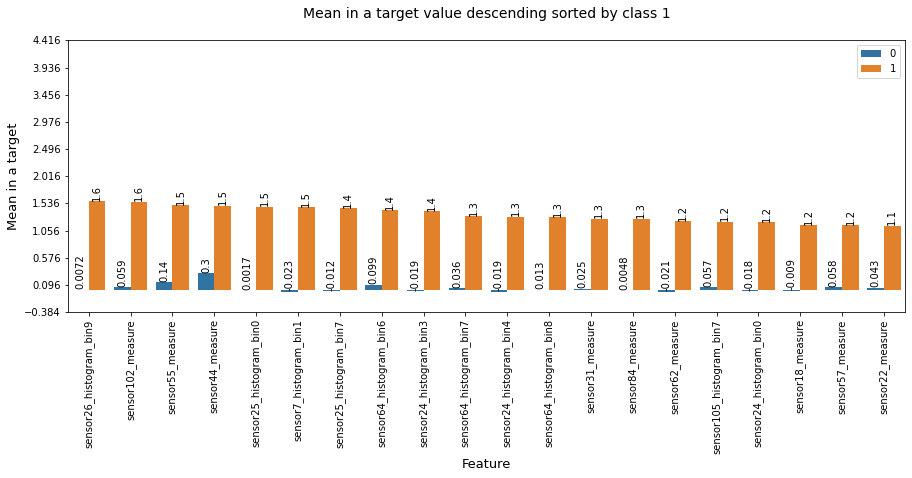

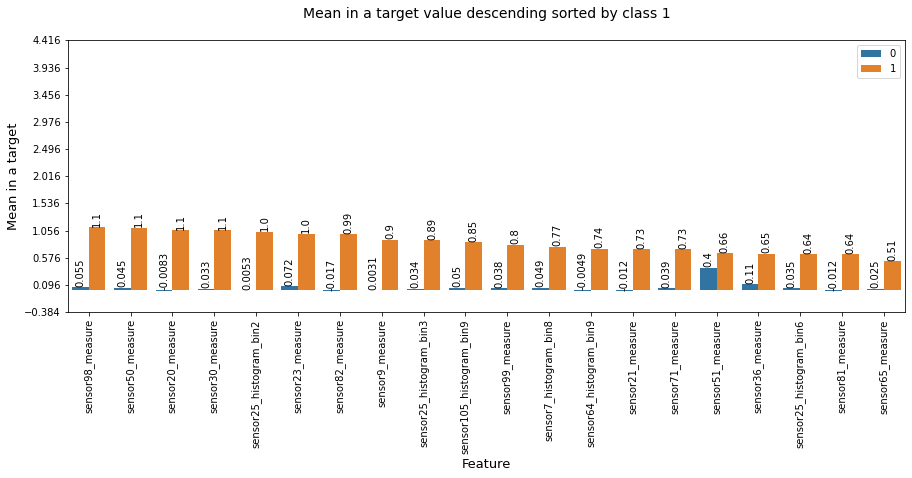

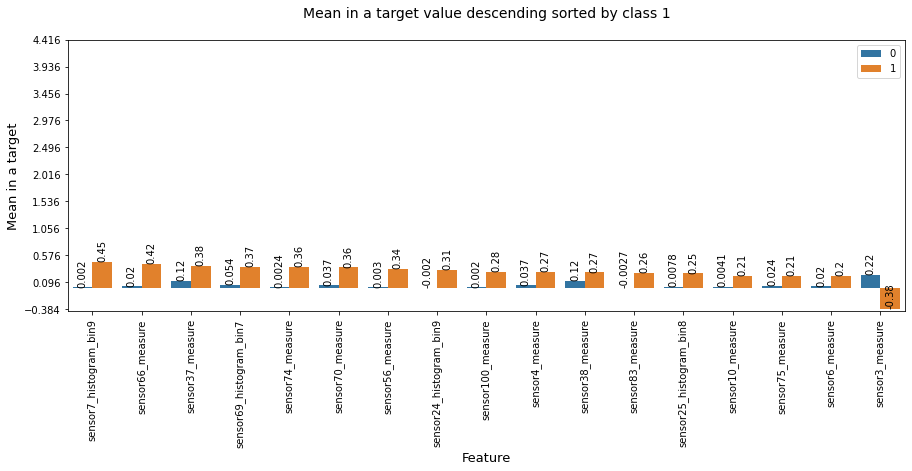

In [ ]:
try:
    plot_diagram(column_higher_reading,mean_higher_reading,one_zero_higher_reading,"Mean",1)
except ValueError:
    pass

<h3>Compare the target 0 and target 1 Median values feature wise after Median value imputing</h3>

In [ ]:
column_list=[]
median_list=[]
one_zero=[]


for column in list(new_x_oss_df.columns.values):
    
    if column!="target":

        column_list.append(column)
        one_zero.append(0)
        median_list.append(new_x_oss_df[column][new_x_oss_df.target==0].median())

        column_list.append(column)
        one_zero.append(1)
        median_list.append(new_x_oss_df[column][new_x_oss_df.target==1].median())

**Find the features where the difference between the medians of the two classes is more than .15<br>
descending sorted by class 1**

In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:median_list[i] for i in index}

In [ ]:
d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])

In [ ]:
counter=0
new_column_list=[]
new_median_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_median_list.append(median_list[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_median_list.append(median_list[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 128 sensors.


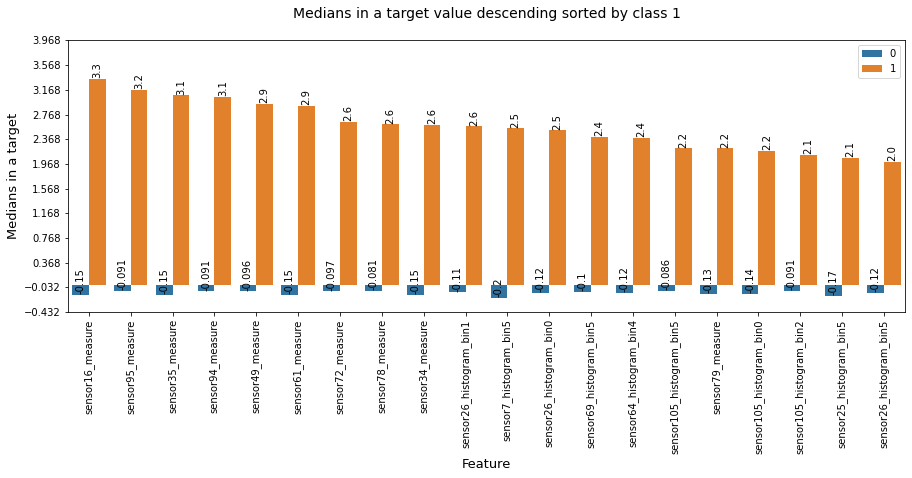

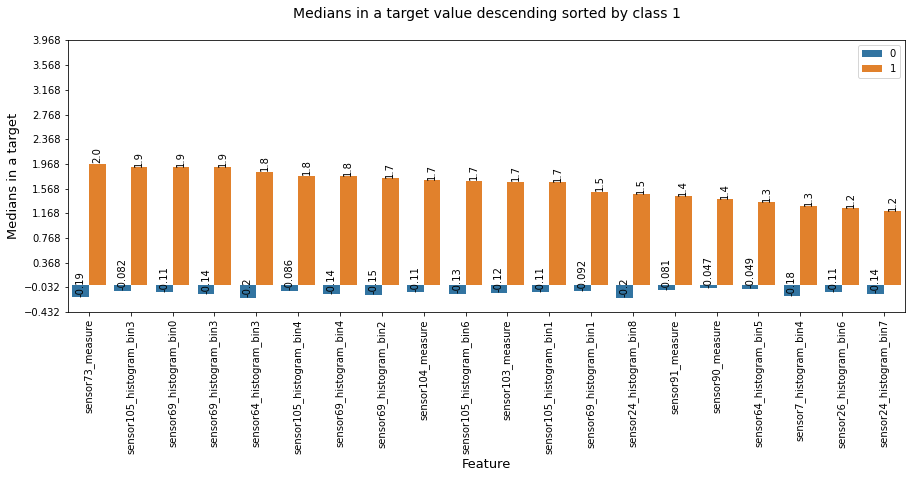

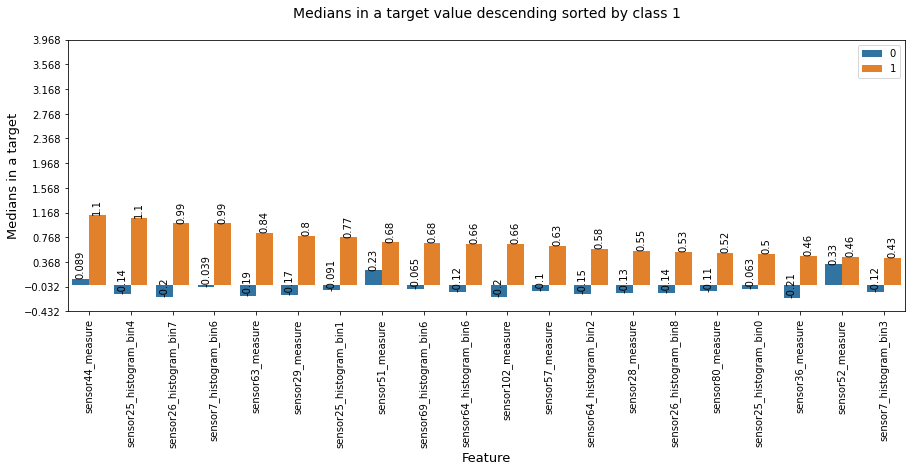

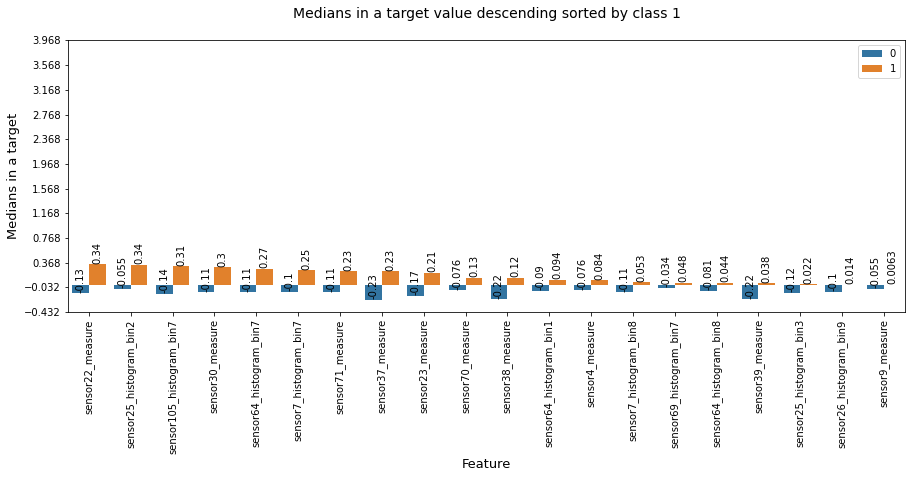

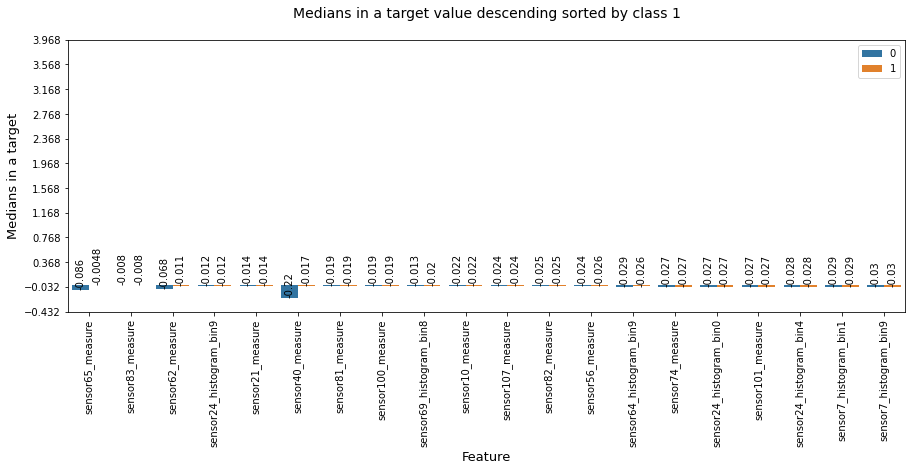

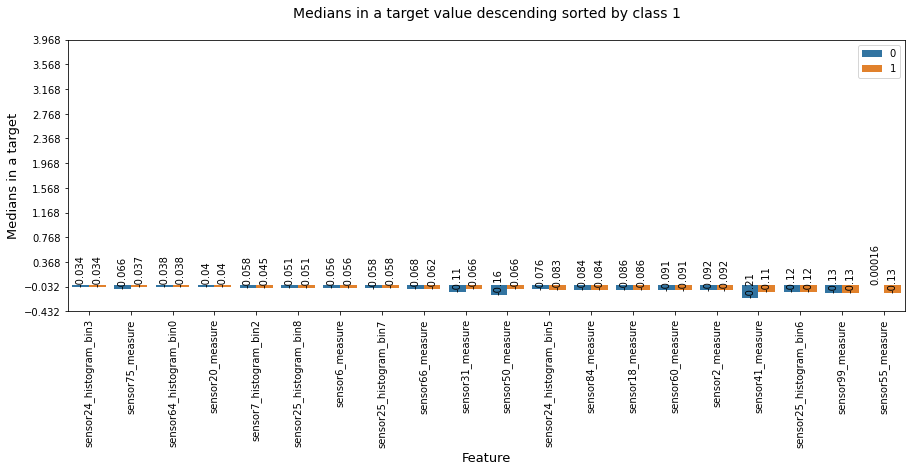

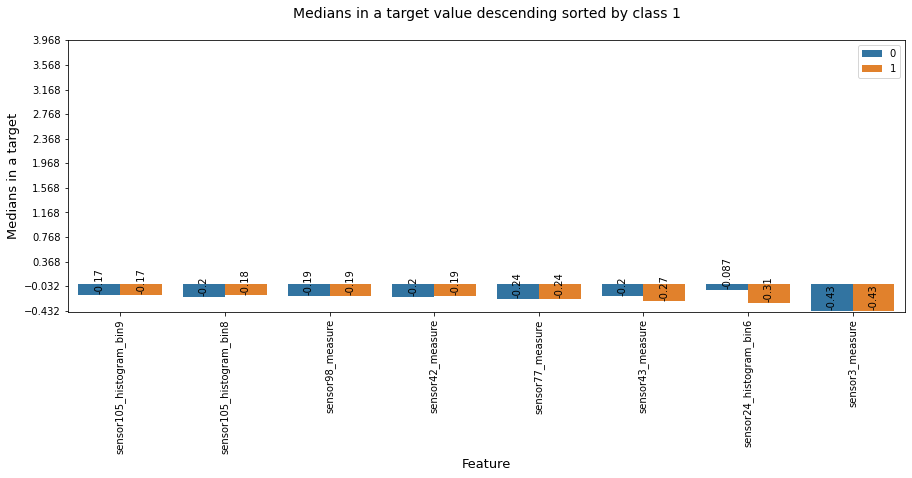

In [ ]:
try:
    plot_diagram(new_column_list,new_median_list,new_one_zero,"Medians",1)
except ValueError:
    pass

In [ ]:
counter=0
median_higher_reading=[]
column_higher_reading=[]
one_zero_higher_reading=[]
for i in d_keys:
    # I am considering this difference should be .15 It can change.
    
    if (np.abs(np.abs(median_list[i])-np.abs(median_list[i-1]))>=.15):
        median_higher_reading.append(median_list[i-1])
        column_higher_reading.append(column_list[i-1])
        one_zero_higher_reading.append(one_zero[i-1])
        
        median_higher_reading.append(median_list[i])
        column_higher_reading.append(column_list[i])
        one_zero_higher_reading.append(one_zero[i])


        counter=counter+1
print("So we have approximate {} sensor that show significant difference (> .15) between median readings of surface and downhole failures.".format(counter))

So we have approximate 67 sensor that show significant difference (> .15) between median readings of surface and downhole failures.


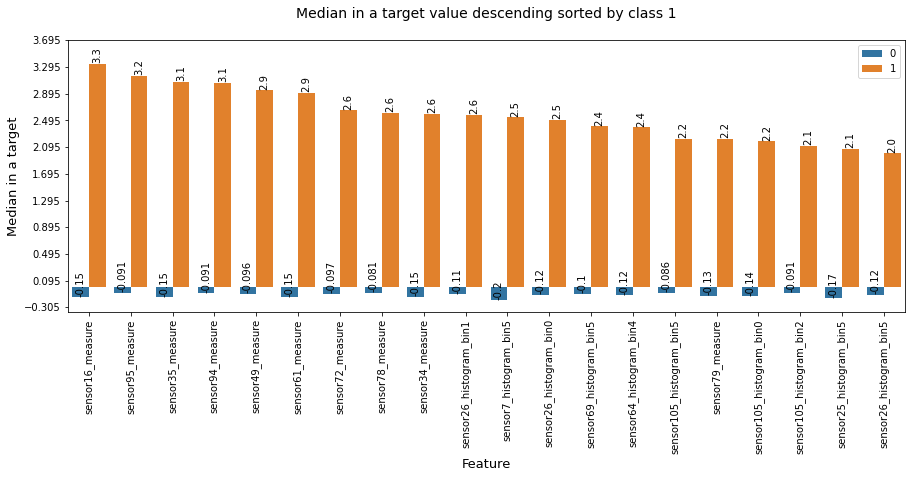

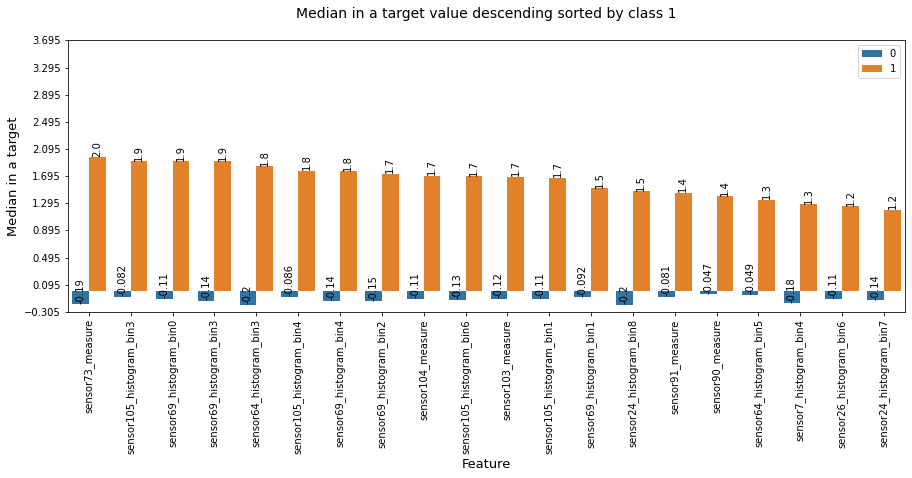

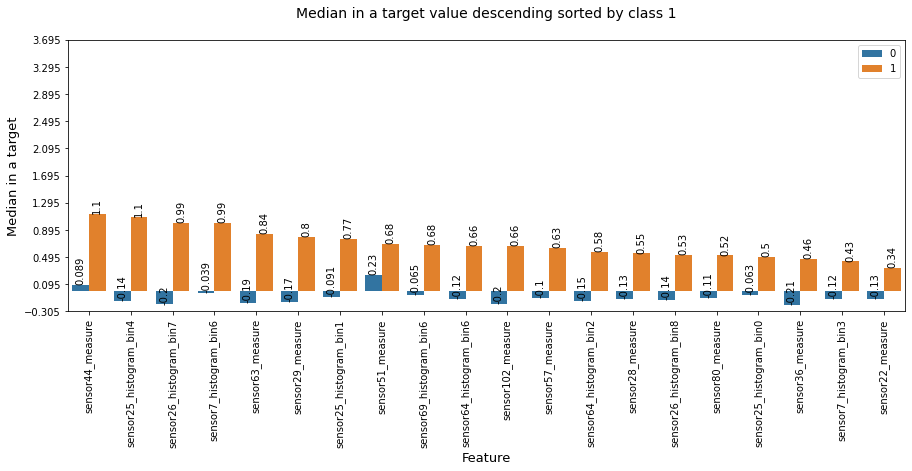

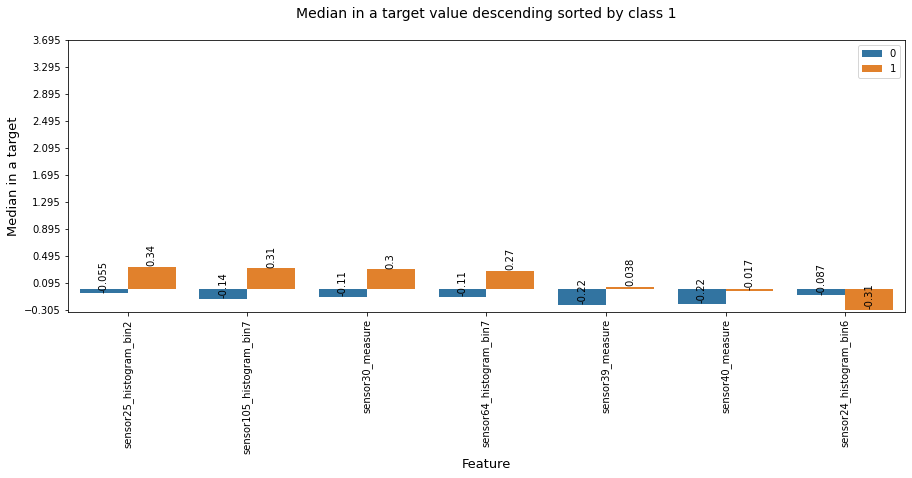

In [ ]:
try:
    plot_diagram(column_higher_reading,median_higher_reading,one_zero_higher_reading,"Median",1)
except ValueError:
    pass

**Observation** : All the median values that we have taken from every median imputed oss feature,decrease in value than that of the mean.<br>
Observe that there is a significant difference between the medians of the surface failures and the medians of the downhole failures.<br>
Out of the selected features observe that the most of the features have a larger median value for the downhole failure rather than that of the surface failures

### Basic Classifier

In [ ]:
new_x_oss_df.drop("target",axis=1,inplace=True)

In [ ]:
print(dummy_classifier_based_on_median(new_x_oss_df.loc[20000],
                                       column_list,
                                       median_list))

Predicted surface failure.
[111, 17]


In [ ]:
print(dummy_classifier_based_on_median(new_standard_test_oss_all_features_df.loc[7997],
                                       column_list,
                                       median_list))

Predicted surface failure.
[116, 12]


In [ ]:
new_x_oss_df["target"]=y_oss

### EDA for the dataset

**Using histograms, plots find out the nature of means for features for both the classes and thereby, the outliers.**

In [ ]:
mean_0=[]
mean_1=[]
for column in list(new_x_oss_df.columns.values):
    if column!="target":
        mean_0.append(new_x_oss_df[new_x_oss_df.target==0][column].mean())
        mean_1.append(new_x_oss_df[new_x_oss_df.target==1][column].mean())

In [ ]:
median_0=[]
median_1=[]
for column in list(new_x_oss_df.columns.values): 
    if column!="target":
        median_0.append(new_x_oss_df[new_x_oss_df.target==0][column].median())
        median_1.append(new_x_oss_df[new_x_oss_df.target==1][column].median())

**10) Try and plot it’s histogram for both the target values.**

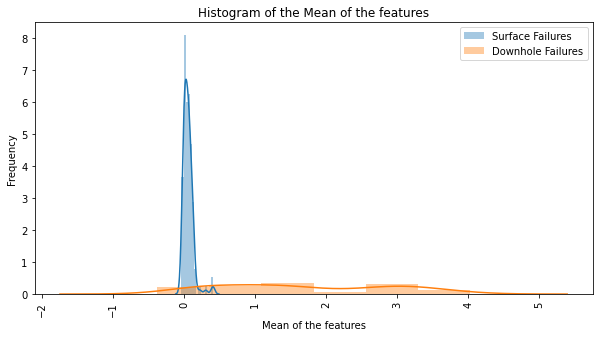

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(mean_0, hist=True, label="Surface Failures")
sns.distplot(mean_1, hist=True, label="Downhole Failures")
plt.title('Histogram of the Mean of the features')
plt.ylabel('Frequency')
plt.xlabel('Mean of the features')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
Here for the surface and downhole failures, we can see that the different downhole features have more variance.
Whereas the majority of the surface related features have a very similar value.

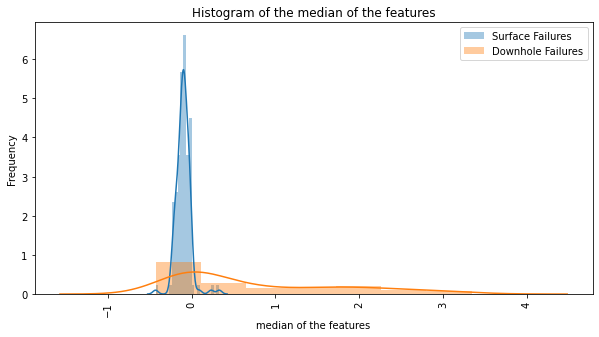

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(median_0, hist=True, label="Surface Failures")
sns.distplot(median_1, hist=True, label="Downhole Failures")
plt.title('Histogram of the median of the features')
plt.ylabel('Frequency')
plt.xlabel('median of the features')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**<br>
Here for the surface and downhole failures, we can see that the different downhole features have more variance. Whereas the majority of the surface related features have a very similar value.<br>
Similar can be said for the box plot and voilin plot.

**11) Try box plot / voilin plot to visualize the outliers.**

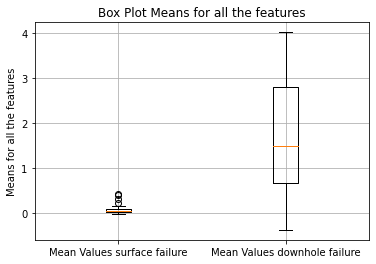

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([mean_0, mean_1])
plt.title('Box Plot Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

**Observations :**<br>
**The majority of the values for the surface failures lie near 0 whereas for the downhole failures, we can see all kinds of variation.**

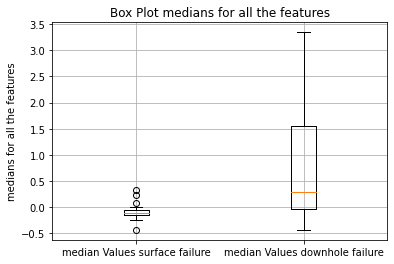

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([median_0, median_1])
plt.title('Box Plot medians for all the features')
plt.xticks([1,2],('median Values surface failure','median Values downhole failure'))
plt.ylabel('medians for all the features')
plt.grid()
plt.show()

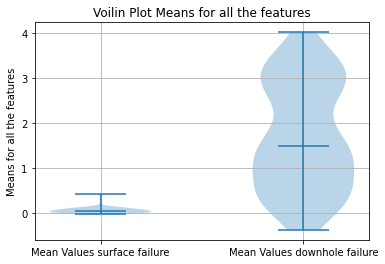

In [ ]:
plt.violinplot([mean_0, mean_1], showmeans=False, showmedians=True)
plt.title('Voilin Plot Means for all the features')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the features')
plt.grid()
plt.show()

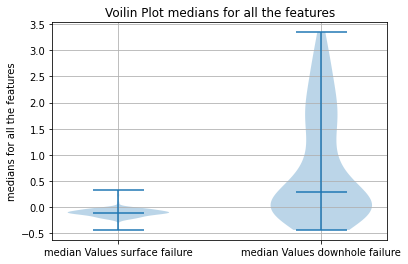

In [ ]:
plt.violinplot([median_0, median_1], showmeans=False, showmedians=True)
plt.title('Voilin Plot medians for all the features')
plt.xticks([1,2],('median Values surface failure','median Values downhole failure'))
plt.ylabel('medians for all the features')
plt.grid()
plt.show()

**PCA**

In [86]:
new_x_oss_df.drop("target",axis=1,inplace=True)

In [87]:
"target" in new_x_oss_df.columns

False

[[ -3.6391144   -0.27239496   0.        ]
 [ -2.2456899    0.11712268   0.        ]
 [  1.1500471    0.17947987   0.        ]
 ...
 [ 43.470196   -12.275338     1.        ]
 [  0.54847836  -1.3452878    1.        ]
 [ 55.52745     29.296225     1.        ]]


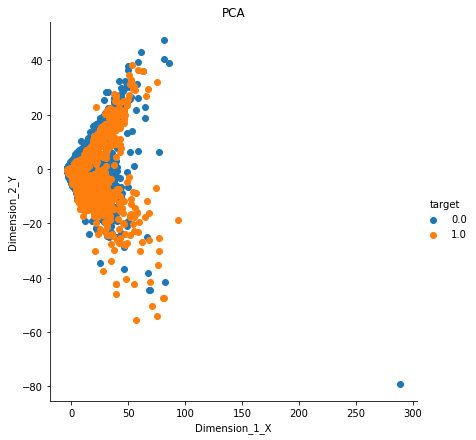

CPU times: user 514 ms, sys: 121 ms, total: 634 ms
Wall time: 513 ms


In [88]:
%%time
run_pca(new_x_oss_df,y_oss)

**Observation :**<br>
1) Observe that PCA is not able to differentiate all the data points into different groups.<br>
2) Not all the the surface and downhole features are coming under the same category.

### Perform a similar EDA on the outliers.

#### Here we take the outliers from the features that have been selected.
#### For each sensor we find the outliers that also classwise.
#### The issue is that there maybe high outliers here , but there maybe lower outliers here as well.

https://www.geeksforgeeks.org/interquartile-range-and-quartile-deviation-using-numpy-and-scipy/<br>
**Higher outlier = more than 1.5 ⋅ IQR above the third quartile.**<br>
**Lower outlier = less than 1.5 . IQR below the first quartile.**<br>
**The IQR is the difference between Q3 and Q1.**

In [ ]:
new_x_oss_df["target"]=y_oss

In [ ]:
counter=0
main_dictionary=dict()
outliers=[]
list_of_outliers_features_classes=[]
for i in range(len(column_list)):
    d=dict()
    new_list=new_x_oss_df[new_x_oss_df.target==one_zero[i]]\
    [column_list[i]]      
    new_index=list(new_list.reset_index()["index"])
    QR1=np.percentile(new_list, 25)
    QR3=np.percentile(new_list, 75)
    IQR=QR3-QR1
    for index,value in zip(new_index,new_list):    
        if (value>(QR3+(IQR*1.5))) or (value<(QR1-(IQR*1.5))):
            counter=counter+1
            d.update({index:value})
            if index not in main_dictionary:
                main_dictionary.update({index:list(new_x_oss_df.loc[index])})
    list_of_outliers_features_classes.append(d)
    del d
    outliers.append(counter)
    counter=0

In [ ]:
print("Total number of data points that are outliers in atleast one or more than one feature : ",len(np.unique(list(main_dictionary.keys()))))

Total number of data points that are outliers in atleast one or more than one feature :  31928


In [ ]:
index=np.sort([i for i in range(0,len(column_list)) if i%2!=0])
d={i:outliers[i] for i in index}

d_keys=[]
for index in np.argsort(list(d.values()))[::-1][:len(list(d.values()))]:
    d_keys.append(list(d.keys())[index])
    
counter=0
new_column_list=[]
new_outliers_list=[]
new_one_zero=[]
for i in d_keys:
    new_column_list.append(column_list[i-1])
    new_outliers_list.append(outliers[i-1])
    new_one_zero.append(one_zero[i-1])
    new_column_list.append(column_list[i])
    new_outliers_list.append(outliers[i])
    new_one_zero.append(one_zero[i])
    counter=counter+1
print("Total {} sensors.".format(counter))

Total 128 sensors.


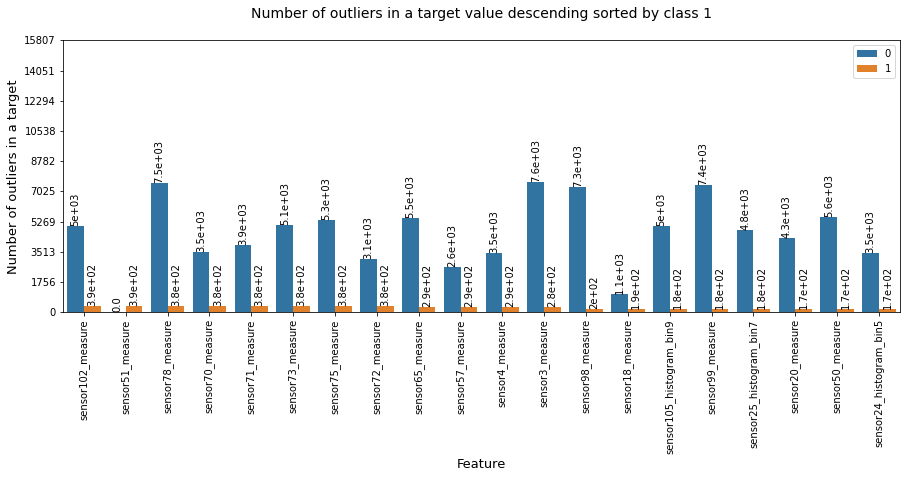

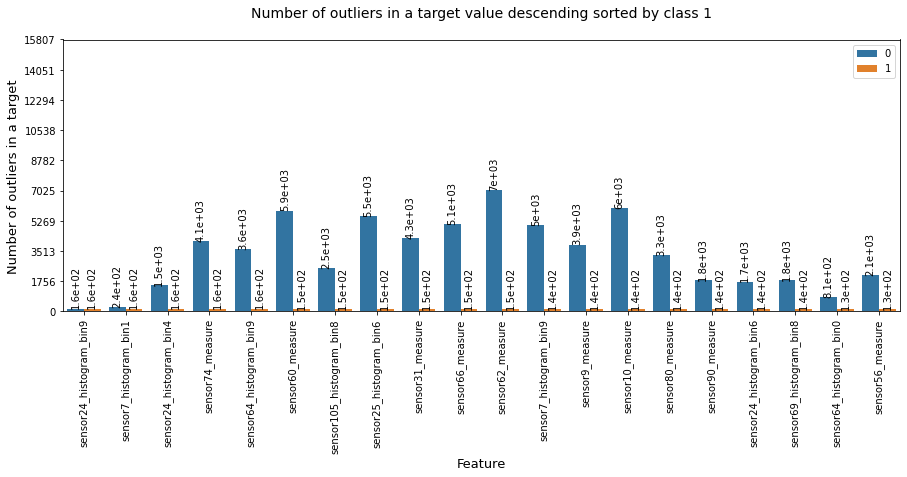

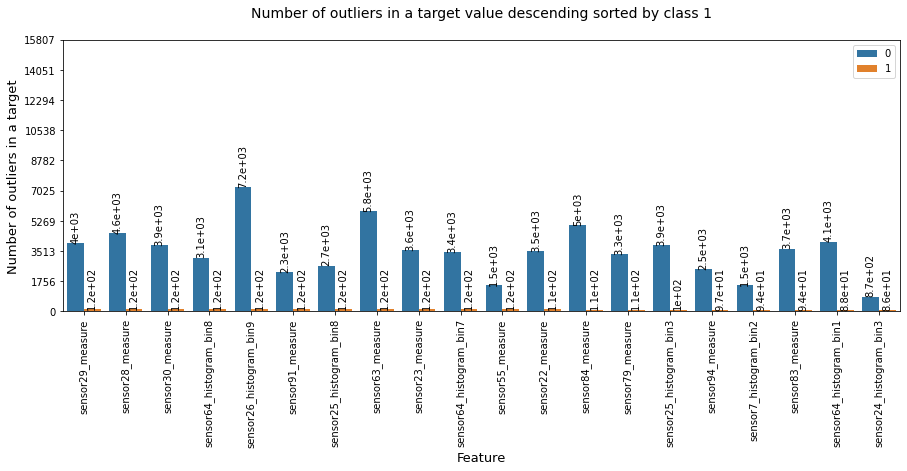

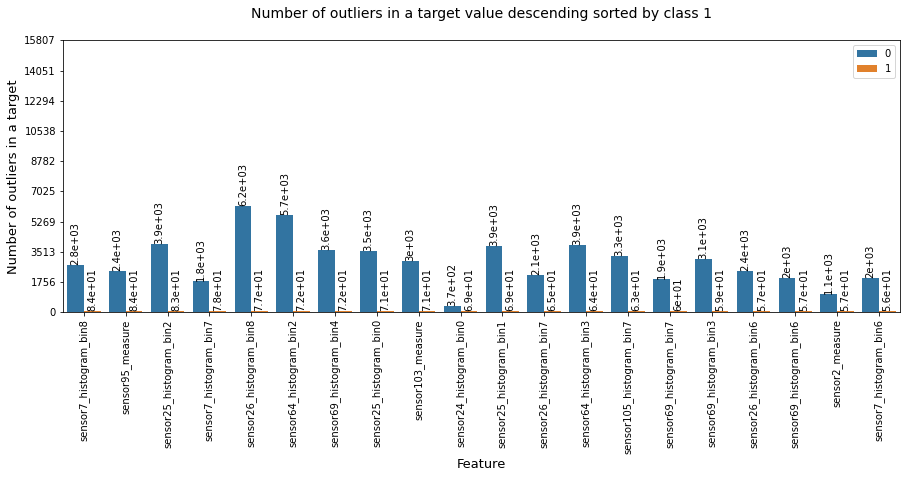

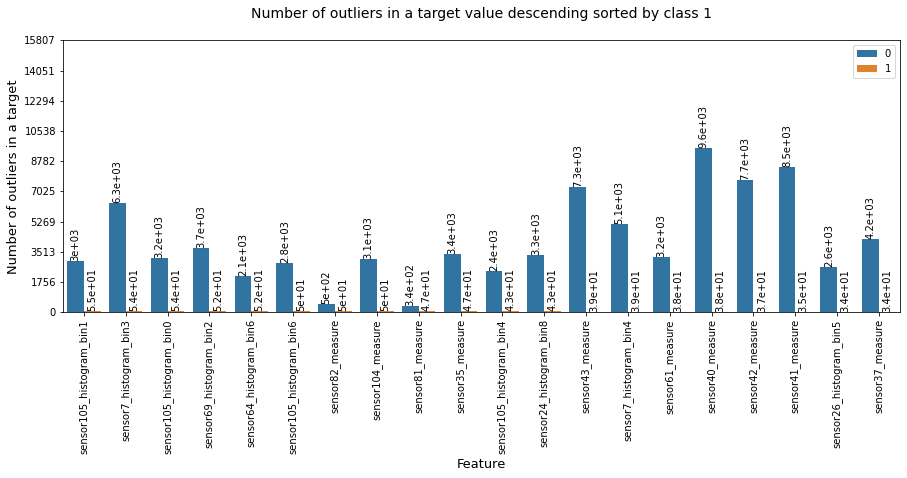

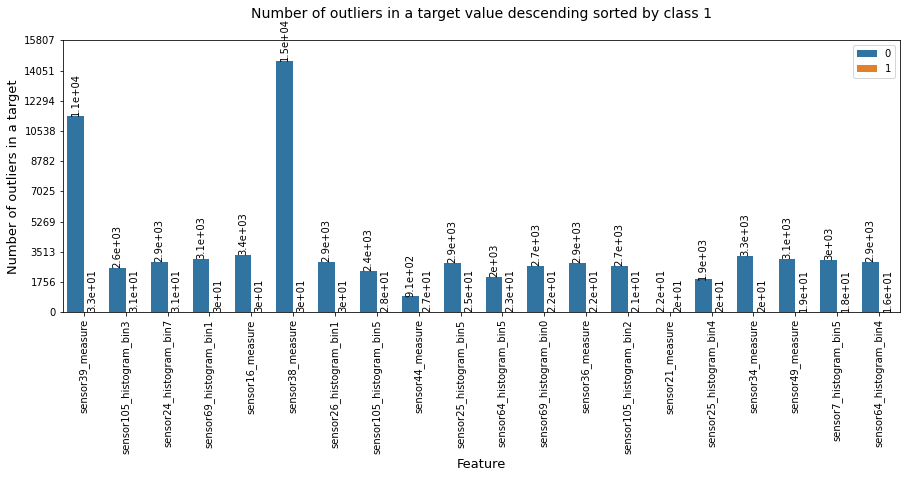

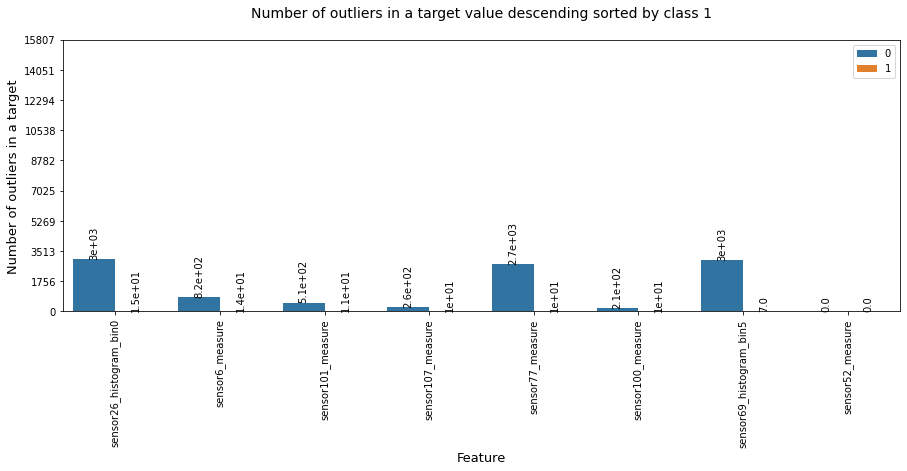

In [ ]:
try:
    plot_diagram(new_column_list,new_outliers_list,new_one_zero,"Number of outliers",1)
except ValueError:
    pass

**Observation :**<br>
Number of outliers are present for both the surface failures as well as the downhole failure.

### For every column feature, get the mean for the outliers for both class 0 and class 1.

In [ ]:
mean_0=[]
mean_1=[]
for i in range(0,len(list_of_outliers_features_classes),2):
    class_0=[ele for ele in list_of_outliers_features_classes[i].values()]
    class_1=[ele for ele in list_of_outliers_features_classes[i+1].values()]
    if (len(class_0)==0) :
        mean_0.append(0.01)
    else :
        mean_0.append(np.mean(class_0))

    if (len(class_1)==0):
        mean_1.append(0.01)
    else :
        mean_1.append(np.mean(class_1))

In [ ]:
median_0=[]
median_1=[]
for i in range(0,len(list_of_outliers_features_classes),2):
    class_0=[ele for ele in list_of_outliers_features_classes[i].values()]
    class_1=[ele for ele in list_of_outliers_features_classes[i+1].values()]
    if (len(class_0)==0) :
        median_0.append(0.01)
    else :
        median_0.append(np.median(class_0))

    if (len(class_1)==0):
        median_1.append(0.01)
    else :
        median_1.append(np.median(class_1))

### Plotting the mean and median for each feature class wise.

**10) Try and plot it’s histogram for both the target values.**

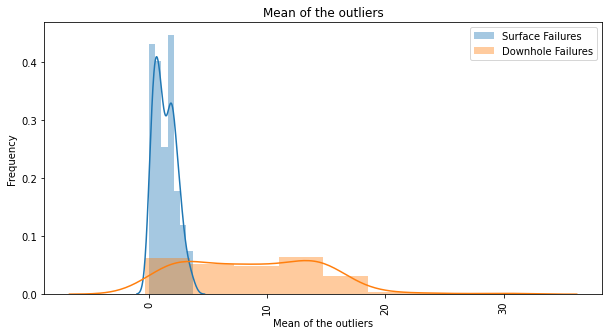

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(mean_0, hist=True, label="Surface Failures")
sns.distplot(mean_1, hist=True, label="Downhole Failures")
plt.title('Mean of the outliers')
plt.ylabel('Frequency')
plt.xlabel('Mean of the outliers')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**
For the outliers, majority of them seem to be concentrated around 0 for the surface outliers with variance as well.<br>
For downhole outliers they have lesser variance but have more density in the other range values 

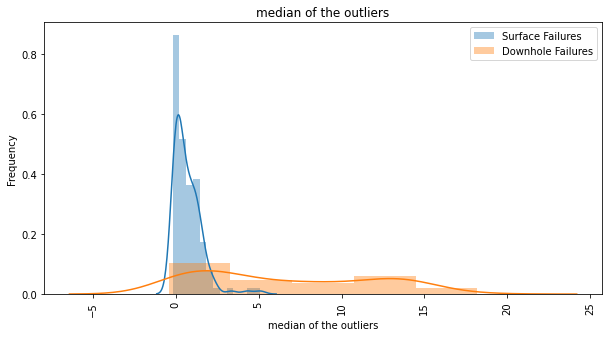

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(median_0, hist=True, label="Surface Failures")
sns.distplot(median_1, hist=True, label="Downhole Failures")
plt.title('median of the outliers')
plt.ylabel('Frequency')
plt.xlabel('median of the outliers')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Observations :**
Here for the surface and downhole outlier, we can see that the different downhole features have more variance. Whereas the majority of the surface related features have a very similar value.

**11) Try box plot / voilin plot to visualize the outliers.**

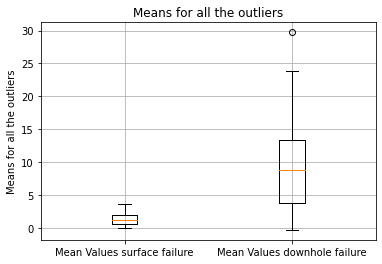

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([mean_0, mean_1])
plt.title('Means for all the outliers')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the outliers')
plt.grid()
plt.show()

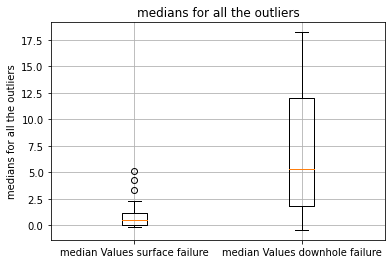

In [ ]:
#Box plot for the number of words in the approved and not approved projects
#https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([median_0, median_1])
plt.title('medians for all the outliers')
plt.xticks([1,2],('median Values surface failure','median Values downhole failure'))
plt.ylabel('medians for all the outliers')
plt.grid()
plt.show()

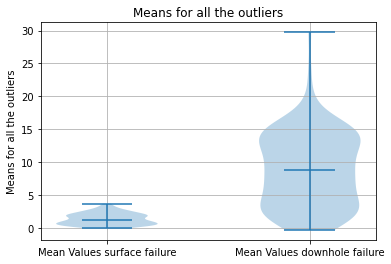

In [ ]:
plt.violinplot([mean_0, mean_1], showmeans=False, showmedians=True)
plt.title('Means for all the outliers')
plt.xticks([1,2],('Mean Values surface failure','Mean Values downhole failure'))
plt.ylabel('Means for all the outliers')
plt.grid()
plt.show()

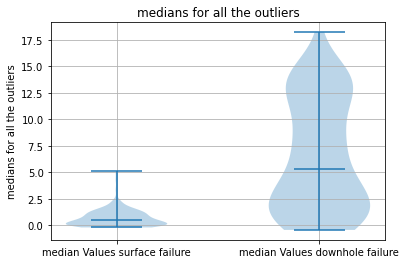

In [ ]:
plt.violinplot([median_0, median_1], showmeans=False, showmedians=True)
plt.title('medians for all the outliers')
plt.xticks([1,2],('median Values surface failure','median Values downhole failure'))
plt.ylabel('medians for all the outliers')
plt.grid()
plt.show()

**The outliers although for the surface related failures are higher. But both the means and the medians of the outliers are similar.**

### For the given data points and features enter new features that tell if these values were previously np.NaN or not.

In [ ]:
new_x_oss_df.drop("target",axis=1,inplace=True)

In [ ]:
nan_x_oss_df=fuse_dataframe_nan(new_x_oss_df,nan_or_not,set(new_column_list))
nan_x_oss_df["target"]=y_oss
nan_x_oss_df.head()

,sensor7_histogram_bin2,sensor105_histogram_bin3,sensor69_histogram_bin7,sensor64_histogram_bin2,sensor107_measure,sensor40_measure,sensor26_histogram_bin6,sensor73_measure,sensor78_measure,sensor64_histogram_bin0,...,sensor7_histogram_bin5,sensor70_measure,sensor61_measure,sensor24_histogram_bin4,sensor7_histogram_bin8,sensor4_measure,sensor26_histogram_bin9,sensor75_measure,sensor9_measure,target
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Now this is the problem out of the given data that we have , we select the features that have more than 50% np.NaNs

In [ ]:
counter=0
for column in new_x_oss_df.columns.values:
    try:
        percent_of_nan=nan_x_oss_df[column].value_counts()[1]/\
                (nan_x_oss_df[column].value_counts()[0]+\
                 nan_x_oss_df[column].value_counts()[1])
        if (percent_of_nan>.5) :
            counter=counter+1
            print(column,"  :  ",percent_of_nan)
    except KeyError:
        pass
print("Overall : ",counter," features with % of na's more than 50%")

sensor2_measure   :   0.7740833333333333
sensor38_measure   :   0.6605416666666667
sensor39_measure   :   0.7348958333333333
sensor40_measure   :   0.77375
sensor41_measure   :   0.7967916666666667
sensor42_measure   :   0.8133125
sensor43_measure   :   0.822
Overall :  7  features with % of na's more than 50%


**Summary :**

The data contained a lot of missing values and is highly imbalanced.

a) I did the analysis on the data first without imputing any values.<br>
b) Here without imputing I got very less data as the calulation was done on the data sets that had real values for all the features.<br>
c) Here I was able to find out that a few sensors were more responsible for the downhole failures and few were more responsible surface related failures, with the help of histograms, box plots, voilin plots class wise median value for each sensor.<br>

I took various methods to fill in the missing na values.<br><br>
1)	

    a) Impute 0 :
        i) Standardize.
		ii) Perform truncated svd to find the number of required features useless features.
        iii) Perform Recursive Feature Selection to reduce the features.
		iv) Perform spearman correlation to get rid of highly correlated features.

    b) Take the mean of the values(0 this time) and do analysis for both surface and downhole failures.
	c) Take the median of the values(0 this time) and do analysis for both surface and downhole failures.
	d) Try to find the sensors involved.
    e) Given the features that we have selected , try a basic classifier on the features and predict a value.
    f) Do the EDA of this particular config of data.
    g) Do the EDA for the outliers.
    h) Out of the features that we have selected , try to find the features that previously had more than 50% np.NaNs 
    i) Perform pca and tsne to see if these features get separated or not.


 

2)	

    a) Impute mean :
        i) Standardize.
		ii) Perform truncated svd to find the number of required features useless features.
        iii) Perform Recursive Feature Selection to reduce the features.
		iv) Perform spearman correlation to get rid of highly correlated features.
        
        
	b) Take the mean of the values(mean this time) and do analysis for both surface and downhole failures.
	c) Take the median of the values(mean this time) and do analysis for both surface and downhole failures.
	d) Try to find the sensors involved.
    e) Given the features that we have selected , try a basic classifier on the features and predict a value.
    f) Do the EDA of this particular config of data.
    g) Do the EDA for the outliers.
    h) Out of the features that we have selected , try to find the features that previously had more than 50% np.NaNs 
    i) Perform pca and tsne to see if these features get separated or not.


3)	

    a) Impute median :
        i) Standardize.
		ii) Perform truncated svd to find the number of required features useless features.
        iii) Perform Recursive Feature Selection to reduce the features.
		iv) Perform spearman correlation to get rid of highly correlated features.
        

	b) Take the mean of the values(median this time) and do analysis for both surface and downhole failures.
	c) Take the median of the values(median this time) and do analysis for both surface and downhole failures.
	d) Try to find the sensors involved.
    e) Given the features that we have selected , try a basic classifier on the features and predict a value.
    f) Do the EDA of this particular config of data.
    g) Do the EDA for the outliers.
    h) Out of the features that we have selected , try to find the features that previously had more than 50% np.NaNs 
    i) Perform pca and tsne to see if these features get separated or not.<br><br><br> 
**I found the median values to be less affected than the outliers.So with median imputation.I performed various sampling techniques.**<br>

**The data set is highly imbalanced , and all the features are numerical so I will try :<br>
Smote, BorderLineSmote, Adasyn(oversampling)<br>
OneSidedSelection (undersampling).<br>
Smoteen or SmoteTomek etc for the combination of over sampling and undersampling.**  
<br><br><br> 
    
4)	

    a) Impute median :
        i) Standardize.
		ii) Perform truncated svd to find the number of required features useless features.
        iii) Perform Recursive Feature Selection to reduce the features.
		iv) Perform spearman correlation to get rid of highly correlated features.
        v) Perform Adasyn to oversample the minority.

	b) Take the mean of the values(median this time) and do analysis for both surface and downhole failures.
	c) Take the median of the values(median this time) and do analysis for both surface and downhole failures.
	d) Try to find the sensors involved.
    e) Given the features that we have selected , try a basic classifier on the features and predict a value.
    f) Do the EDA of this particular config of data.
    g) Do the EDA for the outliers.
    h) Out of the features that we have selected , try to find the features that previously had more than 50% np.NaNs 
    i) Perform pca to see if we get the features separated visually or not.
    
    
5)	

    a) Impute median :
        i) Standardize.
		ii) Perform truncated svd to find the number of required features useless features.
        iii) Perform Recursive Feature Selection to reduce the features.
		iv) Perform spearman correlation to get rid of highly correlated features.
        v) Perform SmoteTomek for both over under sampling combo on the minority.

	b) Take the mean of the values(median this time) and do analysis for both surface and downhole failures.
	c) Take the median of the values(median this time) and do analysis for both surface and downhole failures.
	d) Try to find the sensors involved.
    e) Given the features that we have selected , try a basic classifier on the features and predict a value.
    f) Do the EDA of this particular config of data.
    g) Do the EDA for the outliers.
    h) Out of the features that we have selected , try to find the features that previously had more than 50% np.NaNs 
    i) Perform pca to see if we get the features separated visually or not.
    
    
6)	

    a) Impute median :
        i) Standardize.
		ii) Perform truncated svd to find the number of required features useless features.
        iii) Perform Recursive Feature Selection to reduce the features.
		iv) Perform spearman correlation to get rid of highly correlated features.
        v) Perform One sided Sampling on the majority.

	b) Take the mean of the values(median this time) and do analysis for both surface and downhole failures.
	c) Take the median of the values(median this time) and do analysis for both surface and downhole failures.
	d) Try to find the sensors involved.
    e) Given the features that we have selected , try a basic classifier on the features and predict a value.
    f) Do the EDA of this particular config of data.
    g) Do the EDA for the outliers.
    h) Out of the features that we have selected , try to find the features that previously had more than 50% np.NaNs 
    i) Perform pca to see if we get the features separated visually or not.
    
    
   




**Observation :** The most groups that I could see was in the histogram measures, but none of the methods are able to separate the surface and downhole failures.

Mean values and Median values feature wise and class wise was performed 2 times :<br><br>
**1) <u>With no imputing</u> =>** Here the data is less as only the data points with all the features are considered.
Considerable gap between the median values of both the failures.

**2) <u>With mean imputing</u> =>** Here there was more data involved as more all the data points were included after mean imputing. <br>
We found that on taking the mean value we can tell out the difference between the 2 features although the values decreased when we took the median.<br>


**3) <u>With median imputing</u> =>** Here there was more data involved as more all the data points were included after median imputing. <br>
We found that on taking the mean value we can tell out the difference between the 2 features although the values decreased when we took the median.<br>


**The issue we face with while performing spearman correlation,<br>
we cannot make their correlation go away but we can do one thing that is remove the features that are more co related.<br>
Issue is that when we remove the co related features then only 2 features with the  co relation of -10% to +10% range remains.**<br>
**So again to have more features,I decide to accept atleast till -98% to +98% range because I need the required amount of the features (adequate number found in svd and features retrieved in Recursive Feature Selection) to perform the analysis.**

**I can also try the median imputed median can I get results ? I will give three sets of datasets that is median imputed median data, adasyn and smotetomek data to the DL/ML algorithm so that I can come to know through which datasets I can get the best results.**